# Cluster membership
This notebook aims to define the sample of cluster members for the VST-GAME survey. From the outputs of the Photo-z to the definition of local environments, all in a single notebook


# Importing libraries

In [6]:
import scipy
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as st
from astropy.io  import fits
from scipy.stats import norm
from matplotlib import rcParams
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from scipy.signal import find_peaks
from scipy.optimize import curve_fit
from scipy.stats import gaussian_kde
from matplotlib.image import NonUniformImage
from matplotlib import cm
from ltsfit.lts_linefit import lts_linefit
from   astropy.cosmology import FlatLambdaCDM as cosmo
import matplotlib.gridspec as gridspec
from astropy.wcs import WCS


pd.set_option('display.max_columns',None)

# Functions

In [344]:
def zspec_zphot(zspec,zphot,lims,save,file):
    """Computes the statistics of the photometric redshift and plots the output"""
    inf,sup=lims

    bool_zspec = (zspec >= 0)&(zspec < 10)
    
    zspec = zspec[bool_zspec]
    zphot = zphot[bool_zspec]
    # Outliers
    delta_z      = np.abs(zphot - zspec)/(1+zspec)
    outliers     = delta_z > 0.15
    not_outliers = np.invert(outliers)
    delta_z      = delta_z[not_outliers]
    
    # Catastrophic outliers 
    catastrophic        = np.abs(zphot - zspec)> 1
    not_catastrophic    = np.invert(catastrophic)
    # Percentuals 
    perc_central      = np.around(len(zphot[not_outliers])*100 / len(zspec),decimals=1)
    perc_outlier      = np.around((len(zphot[outliers]))*100   / len(zspec),decimals=1)
    perc_catastrophic = np.around(len(zphot[catastrophic])*100 / len(zspec),decimals=1)
    bias        = np.mean(delta_z)
    sigma       = np.std(delta_z)
    sigma_NMAD  = 1.4826*np.median(np.abs(delta_z))

    n68            = int(len(delta_z)*0.68)
    sort_abs_delta = np.sort(np.abs(delta_z))
    sigma_68       = sort_abs_delta[n68]
    eta            = (outliers.sum()*100)/len(outliers)

    print('|mean(Delta z)| =','%.4f'% np.abs(bias))
    print('std(Delta z)    =','%.4f'% sigma)
    print()
    print('sigma_NMAD      =','%.4f'% sigma_NMAD)
    #print('sigma_68        =','%.4f'% sigma_68)
    print('eta             =','%.2f'% eta,'%')

    x = np.linspace(inf,sup,200)
    plt.figure(figsize=(7,6))
    plt.rcParams["font.size"] = 18
    #plt.plot(zspec[not_outliers],zphot[not_outliers], '.',c='tab:blue',label='Central objects: '+str(not_outliers.sum())+'  ('+str(perc_central)+'%)')
    #plt.plot(zspec[outliers], zphot[outliers], '.',c='tab:orange',label='Outliers: '+str(outliers.sum())+'  ('+str(perc_outlier)+'%)')
    ####plt.plot(zspec[catastrophic], zphot[catastrophic], '.',c='tab:red',label='Catastrophic outliers: '+str(catastrophic.sum())+'  ('+str(perc_catastrophic)+'%)')
    ######
    xxx = np.vstack([zspec,zphot])
    zzz = gaussian_kde(xxx)(xxx)
    plt.scatter(zspec,zphot,c=zzz,s=5)
    plt.colorbar(label='Counts')
    ######
    plt.plot(x,x,'-',c='k',lw=1)
    plt.plot(x,x+1,'-',c='tab:red',lw=1)
    plt.plot(x,x-1,'-',c='tab:red',lw=1)
    plt.plot(x,1.15*x+0.15,'--',c='tab:red',lw=1)
    plt.plot(x,0.85*x-0.15,'--',c='tab:red',lw=1)
    plt.tick_params(top=True, right=True,direction='in')
    plt.title('')
    plt.xlabel(r'$z_{spec}$')
    plt.ylabel(r'$z_{phot}$')
    plt.xlim(inf-0.01,sup)
    plt.ylim(inf-0.01,sup)
    #plt.legend()
    if save==True:
        plt.savefig(str(file)+'.png')
    plt.show()
    print('Central objects: '+str(not_outliers.sum())+'  ('+str(perc_central)+'%)')
    print('Outliers: '+str(outliers.sum())+'  ('+str(perc_outlier)+'%)')
    



def completeness_purity(zspec,zphot,zspec_cluster,zphot_cluster,verbose=True):
    """Computes the completeness and purity on a given interval"""
    # WARNING: zspec & zphot should have the same lenght!!! 
    
    # Unpacking intervals
    zspec_cluster_inf,zspec_cluster_sup = zspec_cluster
    zphot_cluster_inf,zphot_cluster_sup = zphot_cluster
    cluster_mean = (zspec_cluster_inf+zspec_cluster_sup)/2

    # Generating boolean with some cluster conditions
    existing_zspec   = (zspec >= 0)&(zspec < 10) 
    spec_members     = (zspec>zspec_cluster_inf)&(zspec<zspec_cluster_sup) 
    photo_members    = (zphot>zphot_cluster_inf)&(zphot<zphot_cluster_sup) 

    # How many galaxies have photometric redshift in the photometric inverval?
    if verbose == True:
        print('Spectroscopic interval: %.3f < z < %.3f'%(zspec_cluster_inf,zspec_cluster_sup))
        print('Galaxies having z_spec in the spectroscopic interval: ',spec_members.sum())
        print()
        print('Photometric interval: %.3f < z < %.3f'%(zphot_cluster_inf,zphot_cluster_sup))
        print('Galaxies having z_phot in the photometric interval: ',photo_members.sum())
        print()
    
    photo_members_plus_spec_cluster = len(zphot[photo_members&existing_zspec&spec_members])
    photo_members_plus_spec_any = len(zphot[photo_members&existing_zspec])
    if verbose == True:
        print('Galaxies having z_phot in the photometric interval and any z_spec: %.f'%(photo_members_plus_spec_any))
        print('Galaxies having z_phot in the photometric interval and z_spec in the spectroscopic interval: %.f'%(photo_members_plus_spec_cluster))
        print()
    completeness = photo_members_plus_spec_cluster*100/spec_members.sum()
    if verbose == True:
        print('COMPLETEZZA:')
        print('Da tutti i membri spettroscopici (%.0f), quanti sto recuperando come membri fotometrici? %.0f (%.1f%%)'%(spec_members.sum(),photo_members_plus_spec_cluster,photo_members_plus_spec_cluster*100/spec_members.sum()))
        print()
    purity = photo_members_plus_spec_cluster*100/photo_members_plus_spec_any
    if verbose == True:
        print('PUREZZA:')
        print('Da tutti i membri fotometrici che hanno z-spec (%.0f), quanti sono membri spettroscopici del cluster? %.0f (%.1f%%)'%(photo_members_plus_spec_any,photo_members_plus_spec_cluster,photo_members_plus_spec_cluster*100/photo_members_plus_spec_any))

        print()
        print('%.3f < z < %.3f : %.2f comp and %.2f pur'%(zphot_cluster_inf,zphot_cluster_sup,completeness,purity))
    return completeness, purity

def mean_confidence_interval(data, confidence=0.95):
    a = 1.0 * np.array(data)
    n = len(a)
    m, se = 0.396, scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

def gauss(x, H, A, x0, sigma):
    return H + A * np.exp(-(x - x0) ** 2 / (2 * sigma ** 2))

def gauss_fit(x, y):
    mean = sum(x * y) / sum(y)
    sigma = np.sqrt(sum(y * (x - mean) ** 2) / sum(y))
    popt, pcov = curve_fit(gauss, x, y, p0=[min(y), max(y), mean, sigma])
    return popt

def good_mag(mag):
    good_mag = mag[(mag>0)&(mag<35)]
    return good_mag

def good_color(mag1,mag2):
    color = mag1 - mag2
    bool_color = np.abs(color)<20
    good_color = color[bool_color]
    return good_color,bool_color

"""x_values = np.random.randint(-20,20,300)
y_values = np.random.rand(300)*(-1)

hist2d,y_edges,x_edges = np.histogram2d(y_values,x_values,bins=(3,2))

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(x_values,y_values,'.')

plt.subplot(122)
plt.imshow(hist2d,origin='lower')
plt.colorbar()"""
"""def galaxies_incell(hist2d, ra_edges,dec_edges, ra_gal, dec_gal):
    #OLD VERSION... returns the number of galaxies in the same cell
    data = np.array((ra_gal, dec_gal))
    data_ngal  = np.empty(data.shape)

    data_ngal[0] = data[0]-data[0].min() # ra for all the galaxies
    data_ngal[1] = data[1]-data[1].min() # dec for all the galaxies  

    #b = np.floor(data_ngal / 0.0174).astype(int)
    b = np.floor(data_ngal / 0.0169).astype(int)
    b = tuple(b) # integer (ra-dec) into hist coordinates for each galaxy
    
    hist_ra, hist_dec = hist2d.shape
    n_gal = hist2d[b]
    print('Test 1:')
    print('hist2d.shape:',hist2d.shape,' should match-1 with b.shape: ',b[0].max(),b[1].max())
    print('Test 2:')
    print('hist2d.max(): ',hist2d.max(),' should be the same as n_gal.max: ',n_gal.max())
    return n_gal"""

def gal_incell(hist2d,y_edges,x_edges,y_values,x_values):
    """returns the number of galaxies in the same cell"""
    lung_biny = []
    lung_binx = []
    for i in range(len(y_edges)-1):
        lung_biny.append(y_edges[i+1]-y_edges[i])
    for i in range(len(x_edges)-1):
        lung_binx.append(x_edges[i+1]-x_edges[i])

    y_index = np.empty(len(y_values))
    x_index = np.empty(len(x_values))
    
    for i in range(len(y_values)):
        for j in range(len(y_edges)-1):
            if y_values[i]>=y_edges[j] and y_values[i]<=y_edges[j+1]:
                y_index[i]=j

    for i in range(len(x_values)):
        for j in range(len(x_edges)-1):
            if x_values[i]>=x_edges[j] and x_values[i]<=x_edges[j+1]:
                x_index[i]=j

    index = tuple((y_index.astype(int),x_index.astype(int)))
    
    n_gal = hist2d[index]
    return n_gal


def SN(m_AB,em_Ab,SN_cut):
    """flux=10**((25.-m_AB)/2.5)
    eflux=(10**((25.-m_AB)/2.5)/2.5)*np.log(10)*em_Ab
    S/N=flux/eflux
    (dove m_AB è la magnitudine nella banda e em_AB l'errore della magnitudine)."""
    flux  = 10**((25.-m_AB)/2.5)
    eflux = (10**((25.-m_AB)/2.5)/2.5)*np.log(10)*em_Ab
    SN    = flux/eflux
    bool_SN = SN > SN_cut
    return bool_SN

def cluster(df,interval,photo=False):
    z_min, z_max = interval
    if photo ==False:
        bool_cluster = (df['ZSPEC']>=z_min)&(df['ZSPEC']<=z_max)
    elif photo==True:
        bool_cluster = (df['Z_BEST']>=z_min)&(df['Z_BEST']<=z_max)
    return bool_cluster

def bool_radec(df_ra,df_dec,ra1,ra2,dec1,dec2):
    return (df_ra>ra1)&(df_ra<ra2)&(df_dec>dec1)&(df_dec<dec2)


# Loading catalogs

In [8]:
macs0416 = (0.382,0.410)
# RUN1
gamelp_out_ap1_2E   = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_ap1_2E/match7_ap1_2E.out",sep='\s+',skiprows=82,header=None)
game_0416           = pd.read_csv("/Users/nestrada/Documents/Game/GAME_0416.cat",sep=',',escapechar='#') 

# RUN2
gamelp_out_ap1_2E_a = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_ap1_2E_a/match7_ap1_2E_a.out",sep='\s+',skiprows=82,header=None)
game_0416_2E_a      = pd.read_csv("/Users/nestrada/Documents/Game/GAME_0416_err_z01_allnsflag.cat",sep=',',escapechar='#')

###### IMPORTANT CATALOGUES: RUN3 ######
#game_0416_2E_b      = pd.read_csv("/Users/nestrada/Documents/Game/GAME_0416_err_z01_nsflag0.cat",sep=',',escapechar='#')
#gamelp_out_ap1_2E_b = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_ap1_2E_b/match7_ap1_2E_b.out",sep='\s+',skiprows=82,header=None)
########################################
###### IMPORTANT CATALOGUES: RUN3_v2 ######
game_0416_v2         = pd.read_csv("/Users/nestrada/Documents/Game/GAME_0416_err_v2.cat",sep=',',escapechar='#')


game_0416_2E_b         = pd.read_csv("/Users/nestrada/Documents/Game/GAME_0416_err_z01_nsflag0_v2.cat",sep=',',escapechar='#')
gamelp_out_ap1_2E_b_v3 = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_ap1_2E_b_v3/match7_ap1_2E_b_v3.out",sep='\s+',skiprows=83,header=None)

gamelp_out_ap1_2E_b    = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_ap1_2E_b_v2/match7_ap1_2E_b_v2.out",sep='\s+',skiprows=82,header=None)
gamelp_out_ap1_2E_v2   = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_ap1_2E_v2/match7_ap1_2E_v2.out",sep='\s+',skiprows=82,header=None)

########################################




gamelp_out_ap3      = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_ap3/match7_ap3.out",sep='\s+',skiprows=82,header=None)
gamelp_out_ap4      = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_ap4/match7_ap4.out",sep='\s+',skiprows=82,header=None)
gamelp_out_auto     = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_auto/match7_auto.out",sep='\s+',skiprows=82,header=None)
gamelp_out_model    = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/match7_model/match7_model.out",sep='\s+',skiprows=82,header=None)


header_lp      = ['IDENT', 'Z_BEST', 'Z_BEST68_LOW', 'Z_BEST68_HIGH', 'Z_ML', 
                  'CHI_BEST', 'MOD_BEST', 'EXTLAW_BEST', 'EBV_BEST', 'PDZ_BEST', 
                  'SCALE_BEST', 'DIST_MOD_BEST', 'NBAND_USED', 'Z_SEC', 'CHI_SEC', 
                  'MOD_SEC', 'Z_QSO', 'CHI_QSO', 'MOD_QSO', 'MOD_STAR', 'CHI_STAR', 
                  'MAG_OBS_U', 'MAG_OBS_G', 'MAG_OBS_R', 'MAG_OBS_I', 'MAG_OBS_Y', 
                  'MAG_OBS_J', 'MAG_OBS_K', 'ERR_MAG_OBS_U', 'ERR_MAG_OBS_G', 
                  'ERR_MAG_OBS_R', 'ERR_MAG_OBS_I', 'ERR_MAG_OBS_Y', 'ERR_MAG_OBS_J', 
                  'ERR_MAG_OBS_K', 'MAG_MOD_U', 'MAG_MOD_G', 'MAG_MOD_R', 'MAG_MOD_I', 
                  'MAG_MOD_Y', 'MAG_MOD_J', 'MAG_MOD_K','CONTEXT', 'ZSPEC']

header_lp_prova1      = ['IDENT', 'Z_BEST', 'Z_BEST68_LOW', 'Z_BEST68_HIGH', 'Z_ML', 
                  'CHI_BEST', 'MOD_BEST', 'EXTLAW_BEST', 'EBV_BEST', 'PDZ_BEST', 
                  'SCALE_BEST', 'DIST_MOD_BEST', 'NBAND_USED', 'Z_SEC', 'CHI_SEC', 
                  'MOD_SEC', 'Z_QSO', 'CHI_QSO', 'MOD_QSO', 'MOD_STAR', 'CHI_STAR', 
                  'MAG_OBS_U', 'MAG_OBS_G', 'MAG_OBS_R', 'MAG_OBS_I', 'MAG_OBS_Y', 
                  'MAG_OBS_J', 'MAG_OBS_K', 'ERR_MAG_OBS_U', 'ERR_MAG_OBS_G', 
                  'ERR_MAG_OBS_R', 'ERR_MAG_OBS_I', 'ERR_MAG_OBS_Y', 'ERR_MAG_OBS_J', 
                  'ERR_MAG_OBS_K', 'MAG_MOD_U', 'MAG_MOD_G', 'MAG_MOD_R', 'MAG_MOD_I', 
                  'MAG_MOD_Y', 'MAG_MOD_J', 'MAG_MOD_K','CONTEXT', 'ZSPEC','MASS_BEST',
                  'SFR_BEST','SSFR_BEST','PHYS_PARA5_BEST','PHYS_PARA6_BEST','PHYS_PARA7_BEST']

gamelp_out_ap1_2E.columns   = header_lp
gamelp_out_ap1_2E_a.columns = header_lp
gamelp_out_ap1_2E_b.columns = header_lp
#gamelp_out_ap1_2E_b_v2.columns = header_lp
gamelp_out_ap1_2E_v2.columns = header_lp
gamelp_out_ap1_2E_b_v3.columns = header_lp_prova1

gamelp_out_ap3.columns   = header_lp
gamelp_out_ap4.columns   = header_lp
gamelp_out_auto.columns  = header_lp
gamelp_out_model.columns = header_lp

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (28) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [9]:
game_0416_v2

,ID_game,ID_clash,RA_clash,DEC_clash,z_clash,ID_u,RA_u,DEC_u,MAG_AUTO_u,MAGERR_AUTO_u,KRON_RADIUS_u,MU_MAX_u,MAG_AP1_u,MAG_AP2_u,MAG_AP3_u,MAG_AP4_u,MAG_AP_3FWHM_u,MAG_AP_8FWHM_u,MAGERR_AP1_u,MAGERR_AP2_u,MAGERR_AP3_u,MAGERR_AP4_u,MAGERR_AP_3FWHM_u,MAGERR_AP_8FWHM_u,FLUX_RADIUS_50_u,CLASS_STAR_u,FWHM_IMAGE_u,A_IMAGE_u,B_IMAGE_u,THETA_IMAGE_u,MAG_PSF_u,MAGERR_PSF_u,MAG_MODEL_u,MAGERR_MODEL_u,SPREAD_MODEL_u,ID_g,RA_g,DEC_g,MAG_AUTO_g,MAGERR_AUTO_g,KRON_RADIUS_g,MU_MAX_g,MAG_AP1_g,MAG_AP2_g,MAG_AP3_g,MAG_AP4_g,MAG_AP_3FWHM_g,MAG_AP_8FWHM_g,MAGERR_AP1_g,MAGERR_AP2_g,MAGERR_AP3_g,MAGERR_AP4_g,MAGERR_AP_3FWHM_g,MAGERR_AP_8FWHM_g,FLUX_RADIUS_50_g,CLASS_STAR_g,FWHM_IMAGE_g,A_IMAGE_g,B_IMAGE_g,THETA_IMAGE_g,MAG_PSF_g,MAGERR_PSF_g,MAG_MODEL_g,MAGERR_MODEL_g,SPREAD_MODEL_g,ID_r,RA_r,DEC_r,MAG_AUTO_r,MAGERR_AUTO_r,KRON_RADIUS_r,MU_MAX_r,MAG_AP1_r,MAG_AP2_r,MAG_AP3_r,MAG_AP4_r,MAG_AP_3FWHM_r,MAG_AP_8FWHM_r,MAGERR_AP1_r,MAGERR_AP2_r,MAGERR_AP3_r,MAGERR_AP4_r,MAGERR_AP_3FWHM_r,MAGERR_AP_8FWHM_r,FLUX_RADIUS_50_r,CLASS_STAR_r,FWHM_IMAGE_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,MAG_PSF_r,MAGERR_PSF_r,MAG_MODEL_r,MAGERR_MODEL_r,SPREAD_MODEL_r,NSFLAG_r,MASK_FLAG_r,ID_i,RA_i,DEC_i,MAG_AUTO_i,MAGERR_AUTO_i,KRON_RADIUS_i,MU_MAX_i,MAG_AP1_i,MAG_AP2_i,MAG_AP3_i,MAG_AP4_i,MAG_AP_3FWHM_i,MAG_AP_8FWHM_i,MAGERR_AP1_i,MAGERR_AP2_i,MAGERR_AP3_i,MAGERR_AP4_i,MAGERR_AP_3FWHM_i,MAGERR_AP_8FWHM_i,FLUX_RADIUS_50_i,CLASS_STAR_i,FWHM_IMAGE_i,A_IMAGE_i,B_IMAGE_i,THETA_IMAGE_i,MAG_PSF_i,MAGERR_PSF_i,MAG_MODEL_i,MAGERR_MODEL_i,SPREAD_MODEL_i,ID_y,RA_y,DEC_y,MAG_AUTO_y,MAGERR_AUTO_y,KRON_RADIUS_y,MU_MAX_y,MAG_AP1_y,MAG_AP2_y,MAG_AP3_y,MAG_AP4_y,MAG_AP_3FWHM_y,MAG_AP_8FWHM_y,MAGERR_AP1_y,MAGERR_AP2_y,MAGERR_AP3_y,MAGERR_AP4_y,MAGERR_AP_3FWHM_y,MAGERR_AP_8FWHM_y,FLUX_RADIUS_50_y,CLASS_STAR_y,FWHM_IMAGE_y,A_IMAGE_y,B_IMAGE_y,THETA_IMAGE_y,MAG_PSF_y,MAGERR_PSF_y,MAG_MODEL_y,MAGERR_MODEL_y,SPREAD_MODEL_y,ID_j,RA_j,DEC_j,MAG_AUTO_j,MAGERR_AUTO_j,KRON_RADIUS_j,MU_MAX_j,MAG_AP1_j,MAG_AP2_j,MAG_AP3_j,MAG_AP4_j,MAG_AP_3FWHM_j,MAG_AP_8FWHM_j,MAGERR_AP1_j,MAGERR_AP2_j,MAGERR_AP3_j,MAGERR_AP4_j,MAGERR_AP_3FWHM_j,MAGERR_AP_8FWHM_j,FLUX_RADIUS_50_j,CLASS_STAR_j,FWHM_IMAGE_j,A_IMAGE_j,B_IMAGE_j,THETA_IMAGE_j,MAG_PSF_j,MAGERR_PSF_j,MAG_MODEL_j,MAGERR_MODEL_j,SPREAD_MODEL_j,ID_k,RA_k,DEC_k,MAG_AUTO_k,MAGERR_AUTO_k,KRON_RADIUS_k,MU_MAX_k,MAG_AP1_k,MAG_AP2_k,MAG_AP3_k,MAG_AP4_k,MAG_AP_3FWHM_k,MAG_AP_8FWHM_k,MAGERR_AP1_k,MAGERR_AP2_k,MAGERR_AP3_k,MAGERR_AP4_k,MAGERR_AP_3FWHM_k,MAGERR_AP_8FWHM_k,FLUX_RADIUS_50_k,CLASS_STAR_k,FWHM_IMAGE_k,A_IMAGE_k,B_IMAGE_k,THETA_IMAGE_k,MAG_PSF_k,MAGERR_PSF_k,MAG_MODEL_k,MAGERR_MODEL_k,SPREAD_MODEL_k
0,0,NaN,NaN,NaN,-99.0,2.0,63.593922,-24.605635,18.0500,0.113705,3.50,22.1431,21.8196,21.2393,20.4474,19.9115,21.2286,19.4175,0.062347,0.060521,0.059521,0.059820,0.060545,0.060768,20.678,0.001,72.15,28.115,23.516,-52.19,21.4572,0.061075,18.0435,0.124067,0.041699,2.0,63.594059,-24.605625,17.1073,0.168488,3.50,21.4686,20.9868,20.3974,19.5971,19.0704,19.7584,18.1423,0.061867,0.063363,0.065816,0.069406,0.066411,0.081019,23.703,0.030,33.04,27.094,24.910,-43.78,20.0441,0.065265,17.1177,0.335501,0.045480,2.0,63.593922,-24.605635,16.7124,0.214455,3.50,20.9460,20.4419,19.8767,19.1110,18.6064,19.8662,18.1449,0.061029,0.062991,0.066955,0.072140,0.063093,0.077554,22.945,0.030,30.48,28.115,23.516,-52.19,20.0774,0.061216,16.7254,0.464115,0.043310,0.0,0.0,2.0,63.593959,-24.605693,16.5341,0.174560,3.50,20.6745,20.1547,19.5854,18.8299,18.3437,19.7086,17.9951,0.060298,0.061398,0.064927,0.068334,0.061123,0.071966,21.525,0.030,28.71,24.553,20.598,-36.43,19.9153,0.061369,16.5631,0.228765,0.044253,3.0,63.594039,-24.605680,16.2714,0.196278,3.50,20.4388,19.9361,19.3502,18.5771,18.0825,18.9689,17.3641,0.062291,0.064177,0.068081,0.072534,0.065535,0.083024,21.723,0.029,28.68,23.594,20.989,-28.49,19.2118,0.064763,16.2863,0.393068,0.044260,11.0,63.594039,-24.605708,16.3147,0.199843,3.50,20.3467,19.8488,19.2642,18.4997,18.0150,18.9678,17.3571,0.064678,0.067571,0.072144,0.078105,0.068657,0.09059

In [10]:
gamelp_out_ap1_2E_b_v3

,IDENT,Z_BEST,Z_BEST68_LOW,Z_BEST68_HIGH,Z_ML,CHI_BEST,MOD_BEST,EXTLAW_BEST,EBV_BEST,PDZ_BEST,SCALE_BEST,DIST_MOD_BEST,NBAND_USED,Z_SEC,CHI_SEC,MOD_SEC,Z_QSO,CHI_QSO,MOD_QSO,MOD_STAR,CHI_STAR,MAG_OBS_U,MAG_OBS_G,MAG_OBS_R,MAG_OBS_I,MAG_OBS_Y,MAG_OBS_J,MAG_OBS_K,ERR_MAG_OBS_U,ERR_MAG_OBS_G,ERR_MAG_OBS_R,ERR_MAG_OBS_I,ERR_MAG_OBS_Y,ERR_MAG_OBS_J,ERR_MAG_OBS_K,MAG_MOD_U,MAG_MOD_G,MAG_MOD_R,MAG_MOD_I,MAG_MOD_Y,MAG_MOD_J,MAG_MOD_K,CONTEXT,ZSPEC,MASS_BEST,SFR_BEST,SSFR_BEST,PHYS_PARA5_BEST,PHYS_PARA6_BEST,PHYS_PARA7_BEST
0,0,0.1721,0.1314,0.2239,0.1708,6.38798,22,0,0.0,85.476,3.665180e+01,39.5949,7,0.00,7.73946,21,2.68,10.587000,19,57,50.6648,21.820,20.987,20.442,20.155,19.936,19.849,19.809,0.062,0.062,0.061,0.060,0.062,0.065,0.085,21.913,20.963,20.313,20.177,19.979,19.947,19.630,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
1,2,0.3047,0.2684,0.3449,0.3321,16.04810,11,0,0.0,82.259,2.094930e+02,40.9960,7,0.00,103.79300,8,0.32,4.696660,25,137,76.0122,22.586,20.836,19.663,19.047,18.403,17.973,17.256,0.073,0.061,0.061,0.059,0.060,0.061,0.074,22.624,20.993,19.412,18.934,18.410,18.058,17.396,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
2,3,0.3333,0.3083,0.4717,0.3891,3.16987,8,0,0.0,74.425,2.151180e+02,41.2215,7,0.00,232.76300,8,0.56,3.083750,10,137,21.4422,23.548,21.211,19.597,19.001,18.413,18.003,17.386,0.110,0.062,0.062,0.061,0.059,0.061,0.075,23.465,21.405,19.571,19.002,18.412,18.043,17.349,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
3,6,0.0736,0.0377,0.1085,0.0976,5.39907,9,0,0.0,91.975,5.986670e+00,37.6125,7,0.00,10.80670,8,0.08,8.032940,26,98,34.4972,22.421,20.484,19.591,18.993,18.646,18.412,18.097,0.078,0.063,0.063,0.067,0.059,0.061,0.076,22.316,20.486,19.409,19.093,18.516,18.383,18.073,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
4,7,0.1240,0.0958,0.1562,0.1224,1.76061,13,0,0.0,103.950,8.763200e+00,38.8176,7,0.00,9.81746,8,0.00,0.867547,26,98,41.8714,23.057,21.607,20.620,20.186,19.746,19.513,19.226,0.085,0.063,0.062,0.061,0.062,0.065,0.083,23.064,21.561,20.564,20.262,19.743,19.557,19.177,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66206,74109,2.0759,1.8751,2.1703,2.0175,23.25700,23,0,0.0,96.596,3.912430e+02,46.0576,6,0.00,81.02310,19,1.84,32.635100,1,130,54.6244,99.000,25.008,23.778,23.285,24.567,23.637,22.827,133.997,0.278,0.187,0.130,0.073,0.073,0.085,25.030,24.630,24.552,24.630,24.423,23.697,22.903,126.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
66207,74110,2.1720,2.0010,2.2866,2.0910,15.21480,25,0,0.0,80.280,2.506560e+02,46.1776,7,0.00,38.91750,19,3.68,16.050100,22,97,30.6350,26.954,25.321,23.504,24.017,24.963,24.351,23.777,3.388,0.335,0.166,0.224,0.075,0.082,0.106,25.358,24.941,24.908,25.003,24.947,24.361,23.742,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
66208,74111,2.1216,1.9787,2.2006,2.0682,57.44340,28,0,0.0,99.952,1.456770e+03,46.1154,7,0.00,126.03800,31,1.48,72.243600,20,31,145.3150,22.949,22.021,22.285,21.621,23.081,22.363,22.021,0.140,0.098,0.106,0.078,0.057,0.059,0.070,22.933,22.573,22.596,22.722,22.839,22.379,22.095,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
66209,74112,1.9049,1.6677,2.9710,2.5935,25.55260,31,0,0.0,18.420,1.763170e+01,45.8291,5,0.24,26.92200,31,0.12,26.266900,27,132,21.7714,99.000,24.731,23.491,26.623,27.947,99.000,26.014,133.997,0.237,0.165,1.882,0.565,145.283,0.599,26.789,26.689,26.787,26.972,27.293,27.073,27.096,94.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0


In [207]:

u = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_u_header.cat",sep='\s+',escapechar='#')
g = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_g_header.cat",sep='\s+',escapechar='#')
r = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_r_header.cat",sep='\s+',escapechar='#')
i = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_i_header.cat",sep='\s+',escapechar='#')
y = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_y_header.cat",sep='\s+',escapechar='#')
j = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_j_header.cat",sep='\s+',escapechar='#')
k = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_k_header.cat",sep='\s+',escapechar='#')

u_2 = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_u_2_header.cat",sep='\s+',escapechar='#')
g_2 = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_g_2_header.cat",sep='\s+',escapechar='#')
i_2 = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_i_2_header.cat",sep='\s+',escapechar='#')
y_2 = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_y_2_header.cat",sep='\s+',escapechar='#')
j_2 = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_j_2_header.cat",sep='\s+',escapechar='#')
k_2 = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/complete_galflag_catalog_m0416_k_2_header.cat",sep='\s+',escapechar='#')


u_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_u_corrected.cat",sep='\s+',escapechar='#')
g_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_g_corrected.cat",sep='\s+',escapechar='#')
r_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_r_corrected.cat",sep='\s+',escapechar='#')
i_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_i_corrected.cat",sep='\s+',escapechar='#')
y_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_y_corrected.cat",sep='\s+',escapechar='#')
j_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_j_corrected.cat",sep='\s+',escapechar='#')
k_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_k_corrected.cat",sep='\s+',escapechar='#')

u_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_u_2_corrected.cat",sep='\s+',escapechar='#')
g_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_g_2_corrected.cat",sep='\s+',escapechar='#')
i_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_i_2_corrected.cat",sep='\s+',escapechar='#')
y_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_y_2_corrected.cat",sep='\s+',escapechar='#')
j_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_j_2_corrected.cat",sep='\s+',escapechar='#')
k_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/Corrected_extinction_ZP/complete_galflag_catalog_m0416_k_2_corrected.cat",sep='\s+',escapechar='#')




_="""u_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_u_Galactic.cat",sep='\s+',escapechar='#')
g_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_g_Galactic.cat",sep='\s+',escapechar='#')
r_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_r_Galactic.cat",sep='\s+',escapechar='#')
i_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_i_Galactic.cat",sep='\s+',escapechar='#')
y_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_y_Galactic.cat",sep='\s+',escapechar='#')
j_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_j_Galactic.cat",sep='\s+',escapechar='#')
k_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_k_Galactic.cat",sep='\s+',escapechar='#')

u_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_u_2_Galactic.cat",sep='\s+',escapechar='#')
g_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_g_2_Galactic.cat",sep='\s+',escapechar='#')
i_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_i_2_Galactic.cat",sep='\s+',escapechar='#')
y_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_y_2_Galactic.cat",sep='\s+',escapechar='#')
j_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_j_2_Galactic.cat",sep='\s+',escapechar='#')
k_2_gal = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_k_2_Galactic.cat",sep='\s+',escapechar='#')




u_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_u_extinction.cat",sep='\s+',escapechar='#')
g_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_g_extinction.cat",sep='\s+',escapechar='#')
r_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_r_extinction.cat",sep='\s+',escapechar='#')
i_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_i_extinction.cat",sep='\s+',escapechar='#')
y_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_y_extinction.cat",sep='\s+',escapechar='#')
j_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_j_extinction.cat",sep='\s+',escapechar='#')
k_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_k_extinction.cat",sep='\s+',escapechar='#')

u_2_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_u_2_extinction.cat",sep='\s+',escapechar='#')
g_2_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_g_2_extinction.cat",sep='\s+',escapechar='#')
i_2_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_i_2_extinction.cat",sep='\s+',escapechar='#')
y_2_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_y_2_extinction.cat",sep='\s+',escapechar='#')
j_2_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_j_2_extinction.cat",sep='\s+',escapechar='#')
k_2_ext = pd.read_csv("/Users/nestrada/Documents/Game/band_catalogues/Gal_ext/complete_galflag_catalog_m0416_k_2_extinction.cat",sep='\s+',escapechar='#')"""





In [208]:
_="""apertures = [7.5,10.0,15.0,20.0,40.0,80.0,150.0,225.0,10.05,26.80]

for i in range(len(apertures)):
    print(apertures[i]*0.21)"""

0.18299704029074207
0.18299280544303445

0.1409512904059379
0.141056406317481

0.09578565696727749

0.07213285713476994
0.07212918482015328

0.04271163692819693
0.04273149190492001

0.030356049206768043
0.030380901205788353

0.013553225826243746
0.013555846829948799


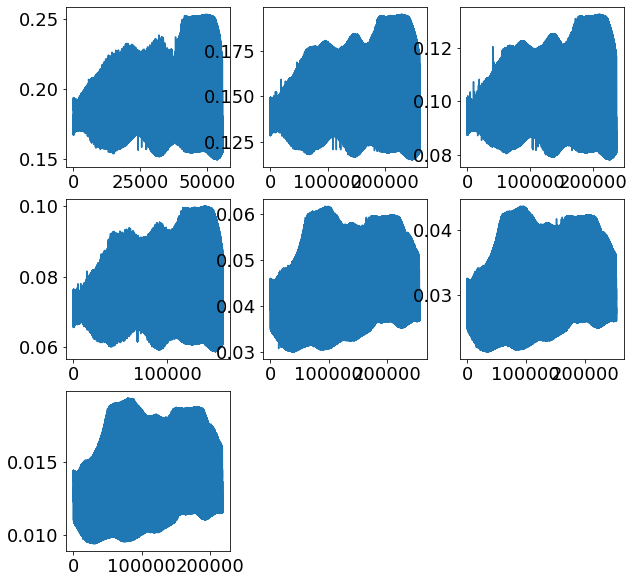

In [577]:

plt.figure(figsize=(10,10))
plt.subplot(331)
plt.plot(u_gal['u_coeff*EBV_F11'])
plt.subplot(332)
plt.plot(g_gal['g_coeff*EBV_F11'])
plt.subplot(333)
plt.plot(r_gal['r_coeff*EBV_F11'])
plt.subplot(334)
plt.plot(i_gal['i_coeff*EBV_F11'])
plt.subplot(335)
plt.plot(y_gal['y_coeff*EBV_F11'])
plt.subplot(336)
plt.plot(j_gal['j_coeff*EBV_F11'])
plt.subplot(337)
plt.plot(k_gal['k_coeff*EBV_F11'])


print(u_gal['u_coeff*EBV_F11'].mean())
print(u_2_gal['u_coeff*EBV_F11'].mean())
print()
print(g_gal['g_coeff*EBV_F11'].mean())
print(g_2_gal['g_coeff*EBV_F11'].mean())
print()
print(r_gal['r_coeff*EBV_F11'].mean())
print()
print(i_gal['i_coeff*EBV_F11'].mean())
print(i_2_gal['i_coeff*EBV_F11'].mean())
print()
print(y_gal['y_coeff*EBV_F11'].mean())
print(y_2_gal['y_coeff*EBV_F11'].mean())
print()
print(j_gal['j_coeff*EBV_F11'].mean())
print(j_2_gal['j_coeff*EBV_F11'].mean())
print()
print(k_gal['k_coeff*EBV_F11'].mean())
print(k_2_gal['k_coeff*EBV_F11'].mean())

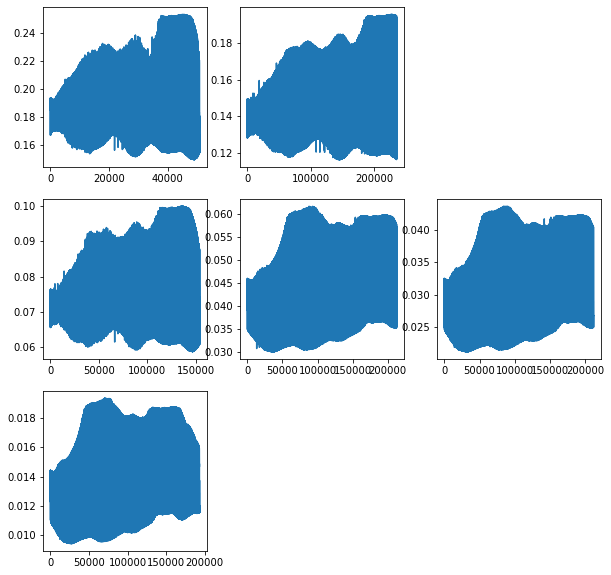

In [7]:
plt.figure(figsize=(10,10))
plt.subplot(331)
plt.plot(u_2_gal['u_coeff*EBV_F11'])
plt.subplot(332)
plt.plot(g_2_gal['g_coeff*EBV_F11'])
#plt.subplot(333)
#plt.plot(r_2_gal['r_coeff*EBV_F11'])
plt.subplot(334)
plt.plot(i_2_gal['i_coeff*EBV_F11'])
plt.subplot(335)
plt.plot(y_2_gal['y_coeff*EBV_F11'])
plt.subplot(336)
plt.plot(j_2_gal['j_coeff*EBV_F11'])
plt.subplot(337)
plt.plot(k_2_gal['k_coeff*EBV_F11'])

In [179]:
"""mags_ext  = ['MAG_AUTO','MAG_AP1','MAG_AP3','MAG_AP4','MAG_AP_3FWHM','MAG_AP_8FWHM','MAG_MODEL']
bands_noext = [u,g,r,i,y,j,k]
bands_ext   = [u_gal,g_gal,r_gal,i_gal,y_gal,j_gal,k_gal] 


for w in range(len(bands_noext)):
    temp0 = []
    for s in mags_ext:
        print(s)
        temp1 = bands_noext[w][s]-bands_ext[w][s]
        print(temp1.shape)
        temp0.append(temp1.mean())
        #print(temp0)
        #if s =='MAG_MODEL':
        plt.figure(figsize=(15,5))
        plt.plot(temp1,'.')
        plt.xlabel('Galaxy ID')
        plt.ylabel('Observed Mag - Corrected Mag')
        plt.show()
    
    corr = np.array(temp0).mean()
    print(w, " correction ", corr)
    print()
"""
    



'mags_ext  = [\'MAG_AUTO\',\'MAG_AP1\',\'MAG_AP3\',\'MAG_AP4\',\'MAG_AP_3FWHM\',\'MAG_AP_8FWHM\',\'MAG_MODEL\']\nbands_noext = [u,g,r,i,y,j,k]\nbands_ext   = [u_gal,g_gal,r_gal,i_gal,y_gal,j_gal,k_gal] \n\n\nfor w in range(len(bands_noext)):\n    temp0 = []\n    for s in mags_ext:\n        print(s)\n        temp1 = bands_noext[w][s]-bands_ext[w][s]\n        print(temp1.shape)\n        temp0.append(temp1.mean())\n        #print(temp0)\n        #if s ==\'MAG_MODEL\':\n        plt.figure(figsize=(15,5))\n        plt.plot(temp1,\'.\')\n        plt.xlabel(\'Galaxy ID\')\n        plt.ylabel(\'Observed Mag - Corrected Mag\')\n        plt.show()\n    \n    corr = np.array(temp0).mean()\n    print(w, " correction ", corr)\n    print()\n'

In [12]:

df_paper = game_0416_v2.merge(gamelp_out_ap1_2E_b_v3,how='left',left_on='ID_game',right_on='IDENT')
df_paper
#df_paper.to_csv('/Users/nestrada/Documents/Game/df_paper.cat',sep=' ',na_rep='-99.0')
### IMPORTANT: ADD TO THE FIRST LINE OF THE OUTPUT: #ID_game



,ID_game,ID_clash,RA_clash,DEC_clash,z_clash,ID_u,RA_u,DEC_u,MAG_AUTO_u,MAGERR_AUTO_u,KRON_RADIUS_u,MU_MAX_u,MAG_AP1_u,MAG_AP2_u,MAG_AP3_u,MAG_AP4_u,MAG_AP_3FWHM_u,MAG_AP_8FWHM_u,MAGERR_AP1_u,MAGERR_AP2_u,MAGERR_AP3_u,MAGERR_AP4_u,MAGERR_AP_3FWHM_u,MAGERR_AP_8FWHM_u,FLUX_RADIUS_50_u,CLASS_STAR_u,FWHM_IMAGE_u,A_IMAGE_u,B_IMAGE_u,THETA_IMAGE_u,MAG_PSF_u,MAGERR_PSF_u,MAG_MODEL_u,MAGERR_MODEL_u,SPREAD_MODEL_u,ID_g,RA_g,DEC_g,MAG_AUTO_g,MAGERR_AUTO_g,KRON_RADIUS_g,MU_MAX_g,MAG_AP1_g,MAG_AP2_g,MAG_AP3_g,MAG_AP4_g,MAG_AP_3FWHM_g,MAG_AP_8FWHM_g,MAGERR_AP1_g,MAGERR_AP2_g,MAGERR_AP3_g,MAGERR_AP4_g,MAGERR_AP_3FWHM_g,MAGERR_AP_8FWHM_g,FLUX_RADIUS_50_g,CLASS_STAR_g,FWHM_IMAGE_g,A_IMAGE_g,B_IMAGE_g,THETA_IMAGE_g,MAG_PSF_g,MAGERR_PSF_g,MAG_MODEL_g,MAGERR_MODEL_g,SPREAD_MODEL_g,ID_r,RA_r,DEC_r,MAG_AUTO_r,MAGERR_AUTO_r,KRON_RADIUS_r,MU_MAX_r,MAG_AP1_r,MAG_AP2_r,MAG_AP3_r,MAG_AP4_r,MAG_AP_3FWHM_r,MAG_AP_8FWHM_r,MAGERR_AP1_r,MAGERR_AP2_r,MAGERR_AP3_r,MAGERR_AP4_r,MAGERR_AP_3FWHM_r,MAGERR_AP_8FWHM_r,FLUX_RADIUS_50_r,CLASS_STAR_r,FWHM_IMAGE_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,MAG_PSF_r,MAGERR_PSF_r,MAG_MODEL_r,MAGERR_MODEL_r,SPREAD_MODEL_r,NSFLAG_r,MASK_FLAG_r,ID_i,RA_i,DEC_i,MAG_AUTO_i,MAGERR_AUTO_i,KRON_RADIUS_i,MU_MAX_i,MAG_AP1_i,MAG_AP2_i,MAG_AP3_i,MAG_AP4_i,MAG_AP_3FWHM_i,MAG_AP_8FWHM_i,MAGERR_AP1_i,MAGERR_AP2_i,MAGERR_AP3_i,MAGERR_AP4_i,MAGERR_AP_3FWHM_i,MAGERR_AP_8FWHM_i,FLUX_RADIUS_50_i,CLASS_STAR_i,FWHM_IMAGE_i,A_IMAGE_i,B_IMAGE_i,THETA_IMAGE_i,MAG_PSF_i,MAGERR_PSF_i,MAG_MODEL_i,MAGERR_MODEL_i,SPREAD_MODEL_i,ID_y,RA_y,DEC_y,MAG_AUTO_y,MAGERR_AUTO_y,KRON_RADIUS_y,MU_MAX_y,MAG_AP1_y,MAG_AP2_y,MAG_AP3_y,MAG_AP4_y,MAG_AP_3FWHM_y,MAG_AP_8FWHM_y,MAGERR_AP1_y,MAGERR_AP2_y,MAGERR_AP3_y,MAGERR_AP4_y,MAGERR_AP_3FWHM_y,MAGERR_AP_8FWHM_y,FLUX_RADIUS_50_y,CLASS_STAR_y,FWHM_IMAGE_y,A_IMAGE_y,B_IMAGE_y,THETA_IMAGE_y,MAG_PSF_y,MAGERR_PSF_y,MAG_MODEL_y,MAGERR_MODEL_y,SPREAD_MODEL_y,ID_j,RA_j,DEC_j,MAG_AUTO_j,MAGERR_AUTO_j,KRON_RADIUS_j,MU_MAX_j,MAG_AP1_j,MAG_AP2_j,MAG_AP3_j,MAG_AP4_j,MAG_AP_3FWHM_j,MAG_AP_8FWHM_j,MAGERR_AP1_j,MAGERR_AP2_j,MAGERR_AP3_j,MAGERR_AP4_j,MAGERR_AP_3FWHM_j,MAGERR_AP_8FWHM_j,FLUX_RADIUS_50_j,CLASS_STAR_j,FWHM_IMAGE_j,A_IMAGE_j,B_IMAGE_j,THETA_IMAGE_j,MAG_PSF_j,MAGERR_PSF_j,MAG_MODEL_j,MAGERR_MODEL_j,SPREAD_MODEL_j,ID_k,RA_k,DEC_k,MAG_AUTO_k,MAGERR_AUTO_k,KRON_RADIUS_k,MU_MAX_k,MAG_AP1_k,MAG_AP2_k,MAG_AP3_k,MAG_AP4_k,MAG_AP_3FWHM_k,MAG_AP_8FWHM_k,MAGERR_AP1_k,MAGERR_AP2_k,MAGERR_AP3_k,MAGERR_AP4_k,MAGERR_AP_3FWHM_k,MAGERR_AP_8FWHM_k,FLUX_RADIUS_50_k,CLASS_STAR_k,FWHM_IMAGE_k,A_IMAGE_k,B_IMAGE_k,THETA_IMAGE_k,MAG_PSF_k,MAGERR_PSF_k,MAG_MODEL_k,MAGERR_MODEL_k,SPREAD_MODEL_k,IDENT,Z_BEST,Z_BEST68_LOW,Z_BEST68_HIGH,Z_ML,CHI_BEST,MOD_BEST,EXTLAW_BEST,EBV_BEST,PDZ_BEST,SCALE_BEST,DIST_MOD_BEST,NBAND_USED,Z_SEC,CHI_SEC,MOD_SEC,Z_QSO,CHI_QSO,MOD_QSO,MOD_STAR,CHI_STAR,MAG_OBS_U,MAG_OBS_G,MAG_OBS_R,MAG_OBS_I,MAG_OBS_Y,MAG_OBS_J,MAG_OBS_K,ERR_MAG_OBS_U,ERR_MAG_OBS_G,ERR_MAG_OBS_R,ERR_MAG_OBS_I,ERR_MAG_OBS_Y,ERR_MAG_OBS_J,ERR_MAG_OBS_K,MAG_MOD_U,MAG_MOD_G,MAG_MOD_R,MAG_MOD_I,MAG_MOD_Y,MAG_MOD_J,MAG_MOD_K,CONTEXT,ZSPEC,MASS_BEST,SFR_BEST,SSFR_BEST,PHYS_PARA5_BEST,PHYS_PARA6_BEST,PHYS_PARA7_BEST
0,0,NaN,NaN,NaN,-99.0,2.0,63.593922,-24.605635,18.0500,0.113705,3.50,22.1431,21.8196,21.2393,20.4474,19.9115,21.2286,19.4175,0.062347,0.060521,0.059521,0.059820,0.060545,0.060768,20.678,0.001,72.15,28.115,23.516,-52.19,21.4572,0.061075,18.0435,0.124067,0.041699,2.0,63.594059,-24.605625,17.1073,0.168488,3.50,21.4686,20.9868,20.3974,19.5971,19.0704,19.7584,18.1423,0.061867,0.063363,0.065816,0.069406,0.066411,0.081019,23.703,0.030,33.04,27.094,24.910,-43.78,20.0441,0.065265,17.1177,0.335501,0.045480,2.0,63.593922,-24.605635,16.7124,0.214455,3.50,20.9460,20.4419,19.8767,19.1110,18.6064,19.8662,18.1449,0.061029,0.062991,0.066955,0.072140,0.063093,0.077554,22.945,0.030,30.48,28.115,23.516,-52.19,20.0774,0.061216,16.7254,0.464115,0.043310,0.0,0.0,2.0,63.593959,-24.605693,16.5341,0.174560,3.50,20.6745,20.1547,19.5854,18.8299,18.3437,19.7086,17.9951,0.060298,0.06

In [13]:
df_paper_extinction         = pd.read_csv("/Users/nestrada/Documents/Game/df_paper_extinctions.cat",sep='\s+',escapechar='#')
df_paper_extinction


,ID_game0,ID_game,_ID_clash,RA_clash,DEC_clash,z_clash,ID_u,RA_u,DEC_u,MAG_AUTO_u,MAGERR_AUTO_u,KRON_RADIUS_u,MU_MAX_u,MAG_AP1_u,MAG_AP2_u,MAG_AP3_u,MAG_AP4_u,MAG_AP_3FWHM_u,MAG_AP_8FWHM_u,MAGERR_AP1_u,MAGERR_AP2_u,MAGERR_AP3_u,MAGERR_AP4_u,MAGERR_AP_3FWHM_u,MAGERR_AP_8FWHM_u,FLUX_RADIUS_50_u,CLASS_STAR_u,FWHM_IMAGE_u,A_IMAGE_u,B_IMAGE_u,THETA_IMAGE_u,MAG_PSF_u,MAGERR_PSF_u,MAG_MODEL_u,MAGERR_MODEL_u,SPREAD_MODEL_u,ID_g,RA_g,DEC_g,MAG_AUTO_g,MAGERR_AUTO_g,KRON_RADIUS_g,MU_MAX_g,MAG_AP1_g,MAG_AP2_g,MAG_AP3_g,MAG_AP4_g,MAG_AP_3FWHM_g,MAG_AP_8FWHM_g,MAGERR_AP1_g,MAGERR_AP2_g,MAGERR_AP3_g,MAGERR_AP4_g,MAGERR_AP_3FWHM_g,MAGERR_AP_8FWHM_g,FLUX_RADIUS_50_g,CLASS_STAR_g,FWHM_IMAGE_g,A_IMAGE_g,B_IMAGE_g,THETA_IMAGE_g,MAG_PSF_g,MAGERR_PSF_g,MAG_MODEL_g,MAGERR_MODEL_g,SPREAD_MODEL_g,ID_r,RA_r,DEC_r,MAG_AUTO_r,MAGERR_AUTO_r,KRON_RADIUS_r,MU_MAX_r,MAG_AP1_r,MAG_AP2_r,MAG_AP3_r,MAG_AP4_r,MAG_AP_3FWHM_r,MAG_AP_8FWHM_r,MAGERR_AP1_r,MAGERR_AP2_r,MAGERR_AP3_r,MAGERR_AP4_r,MAGERR_AP_3FWHM_r,MAGERR_AP_8FWHM_r,FLUX_RADIUS_50_r,CLASS_STAR_r,FWHM_IMAGE_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,MAG_PSF_r,MAGERR_PSF_r,MAG_MODEL_r,MAGERR_MODEL_r,SPREAD_MODEL_r,NSFLAG_r,MASK_FLAG_r,ID_i,RA_i,DEC_i,MAG_AUTO_i,MAGERR_AUTO_i,KRON_RADIUS_i,MU_MAX_i,MAG_AP1_i,MAG_AP2_i,MAG_AP3_i,MAG_AP4_i,MAG_AP_3FWHM_i,MAG_AP_8FWHM_i,MAGERR_AP1_i,MAGERR_AP2_i,MAGERR_AP3_i,MAGERR_AP4_i,MAGERR_AP_3FWHM_i,MAGERR_AP_8FWHM_i,FLUX_RADIUS_50_i,CLASS_STAR_i,FWHM_IMAGE_i,A_IMAGE_i,B_IMAGE_i,THETA_IMAGE_i,MAG_PSF_i,MAGERR_PSF_i,MAG_MODEL_i,MAGERR_MODEL_i,SPREAD_MODEL_i,ID_y,RA_y,DEC_y,MAG_AUTO_y,MAGERR_AUTO_y,KRON_RADIUS_y,MU_MAX_y,MAG_AP1_y,MAG_AP2_y,MAG_AP3_y,MAG_AP4_y,MAG_AP_3FWHM_y,MAG_AP_8FWHM_y,MAGERR_AP1_y,MAGERR_AP2_y,MAGERR_AP3_y,MAGERR_AP4_y,MAGERR_AP_3FWHM_y,MAGERR_AP_8FWHM_y,FLUX_RADIUS_50_y,CLASS_STAR_y,FWHM_IMAGE_y,A_IMAGE_y,B_IMAGE_y,THETA_IMAGE_y,MAG_PSF_y,MAGERR_PSF_y,MAG_MODEL_y,MAGERR_MODEL_y,SPREAD_MODEL_y,ID_j,RA_j,DEC_j,MAG_AUTO_j,MAGERR_AUTO_j,KRON_RADIUS_j,MU_MAX_j,MAG_AP1_j,MAG_AP2_j,MAG_AP3_j,MAG_AP4_j,MAG_AP_3FWHM_j,MAG_AP_8FWHM_j,MAGERR_AP1_j,MAGERR_AP2_j,MAGERR_AP3_j,MAGERR_AP4_j,MAGERR_AP_3FWHM_j,MAGERR_AP_8FWHM_j,FLUX_RADIUS_50_j,CLASS_STAR_j,FWHM_IMAGE_j,A_IMAGE_j,B_IMAGE_j,THETA_IMAGE_j,MAG_PSF_j,MAGERR_PSF_j,MAG_MODEL_j,MAGERR_MODEL_j,SPREAD_MODEL_j,ID_k,RA_k,DEC_k,MAG_AUTO_k,MAGERR_AUTO_k,KRON_RADIUS_k,MU_MAX_k,MAG_AP1_k,MAG_AP2_k,MAG_AP3_k,MAG_AP4_k,MAG_AP_3FWHM_k,MAG_AP_8FWHM_k,MAGERR_AP1_k,MAGERR_AP2_k,MAGERR_AP3_k,MAGERR_AP4_k,MAGERR_AP_3FWHM_k,MAGERR_AP_8FWHM_k,FLUX_RADIUS_50_k,CLASS_STAR_k,FWHM_IMAGE_k,A_IMAGE_k,B_IMAGE_k,THETA_IMAGE_k,MAG_PSF_k,MAGERR_PSF_k,MAG_MODEL_k,MAGERR_MODEL_k,SPREAD_MODEL_k,IDENT,Z_BEST,Z_BEST68_LOW,Z_BEST68_HIGH,Z_ML,CHI_BEST,MOD_BEST,EXTLAW_BEST,EBV_BEST,PDZ_BEST,SCALE_BEST,DIST_MOD_BEST,NBAND_USED,Z_SEC,CHI_SEC,MOD_SEC,Z_QSO,CHI_QSO,MOD_QSO,MOD_STAR,CHI_STAR,MAG_OBS_U,MAG_OBS_G,MAG_OBS_R,MAG_OBS_I,MAG_OBS_Y,MAG_OBS_J,MAG_OBS_K,ERR_MAG_OBS_U,ERR_MAG_OBS_G,ERR_MAG_OBS_R,ERR_MAG_OBS_I,ERR_MAG_OBS_Y,ERR_MAG_OBS_J,ERR_MAG_OBS_K,MAG_MOD_U,MAG_MOD_G,MAG_MOD_R,MAG_MOD_I,MAG_MOD_Y,MAG_MOD_J,MAG_MOD_K,CONTEXT,ZSPEC,MASS_BEST,SFR_BEST,SSFR_BEST,PHYS_PARA5_BEST,PHYS_PARA6_BEST,PHYS_PARA7_BEST,RA_2,DEC_2,u_coeff*EBV_F11,RA_3,DEC_3,g_coeff*EBV_F11,RA_4,DEC_4,r_coeff*EBV_F11,RA_5,DEC_5,i_coeff*EBV_F11,RA_6,DEC_6,y_coeff*EBV_F11,RA_7,DEC_7,j_coeff*EBV_F11,RA_8,DEC_8,k_coeff*EBV_F11
0,0,0,-99.0,-99.0,-99.0,-99.0,2.0,63.593922,-24.605635,18.0500,0.113705,3.50,22.1431,21.8196,21.2393,20.4474,19.9115,21.2286,19.4175,0.062347,0.060521,0.059521,0.059820,0.060545,0.060768,20.678,0.001,72.15,28.115,23.516,-52.19,21.4572,0.061075,18.0435,0.124067,0.041699,2.0,63.594058,-24.605625,17.1073,0.168488,3.50,21.4686,20.9868,20.3974,19.5971,19.0704,19.7584,18.1423,0.061867,0.063363,0.065816,0.069406,0.066411,0.081019,23.703,0.030,33.04,27.094,24.910,-43.78,20.0441,0.065265,17.1177,0.335501,0.045480,2.0,63.593922,-24.605635,16.7124,0.214455,3.50,20.9460,20.4419,19.8767,19.1110,18.6064,19.8662,18.1449,0.061029,0.062991,0.066955,0.072140,0.063093,0.077554,

In [14]:
mean_corr_u = df_paper_extinction['u_coeff*EBV_F11'][~df_paper_extinction['u_coeff*EBV_F11'].isnull()].mean()
mean_corr_g = df_paper_extinction['g_coeff*EBV_F11'][~df_paper_extinction['g_coeff*EBV_F11'].isnull()].mean()
mean_corr_r = df_paper_extinction['r_coeff*EBV_F11'][~df_paper_extinction['r_coeff*EBV_F11'].isnull()].mean()
mean_corr_i = df_paper_extinction['i_coeff*EBV_F11'][~df_paper_extinction['i_coeff*EBV_F11'].isnull()].mean()
mean_corr_y = df_paper_extinction['y_coeff*EBV_F11'][~df_paper_extinction['y_coeff*EBV_F11'].isnull()].mean()
mean_corr_j = df_paper_extinction['j_coeff*EBV_F11'][~df_paper_extinction['j_coeff*EBV_F11'].isnull()].mean()
mean_corr_k = df_paper_extinction['k_coeff*EBV_F11'][~df_paper_extinction['k_coeff*EBV_F11'].isnull()].mean()


std_corr_u = df_paper_extinction['u_coeff*EBV_F11'][~df_paper_extinction['u_coeff*EBV_F11'].isnull()].std()
std_corr_g = df_paper_extinction['g_coeff*EBV_F11'][~df_paper_extinction['g_coeff*EBV_F11'].isnull()].std()
std_corr_r = df_paper_extinction['r_coeff*EBV_F11'][~df_paper_extinction['r_coeff*EBV_F11'].isnull()].std()
std_corr_i = df_paper_extinction['i_coeff*EBV_F11'][~df_paper_extinction['i_coeff*EBV_F11'].isnull()].std()
std_corr_y = df_paper_extinction['y_coeff*EBV_F11'][~df_paper_extinction['y_coeff*EBV_F11'].isnull()].std()
std_corr_j = df_paper_extinction['j_coeff*EBV_F11'][~df_paper_extinction['j_coeff*EBV_F11'].isnull()].std()
std_corr_k = df_paper_extinction['k_coeff*EBV_F11'][~df_paper_extinction['k_coeff*EBV_F11'].isnull()].std()


print(mean_corr_u,mean_corr_g,mean_corr_r,mean_corr_i,mean_corr_y,mean_corr_j,mean_corr_k)
print(std_corr_u,std_corr_g,std_corr_r,std_corr_i,std_corr_y,std_corr_j,std_corr_k)



0.18290744353091462 0.14099329496451482 0.09580141195874188 0.07207996263203935 0.04272088610083412 0.03037685848439412 0.013547096711771253
0.021316968736813182 0.01649038212848657 0.011388726543448793 0.008520716830868231 0.006891057392928735 0.004904805518824908 0.0021637643930266207


In [8]:
print((~df_paper_extinction['u_coeff*EBV_F11'].isnull()).sum())
print((~df_paper_extinction['g_coeff*EBV_F11'].isnull()).sum())
print((~df_paper_extinction['r_coeff*EBV_F11'].isnull()).sum())
print((~df_paper_extinction['i_coeff*EBV_F11'].isnull()).sum())
print((~df_paper_extinction['y_coeff*EBV_F11'].isnull()).sum())
print((~df_paper_extinction['j_coeff*EBV_F11'].isnull()).sum())
print((~df_paper_extinction['k_coeff*EBV_F11'].isnull()).sum())


18001
73836
73971
49133
73249
73370
69764


In [16]:
df_paper_extinction2 = df_paper_extinction.copy()

df_paper_extinction2['u_coeff*EBV_F11'].fillna(mean_corr_u,inplace=True)
df_paper_extinction2['g_coeff*EBV_F11'].fillna(mean_corr_g,inplace=True)
df_paper_extinction2['r_coeff*EBV_F11'].fillna(mean_corr_r,inplace=True)
df_paper_extinction2['i_coeff*EBV_F11'].fillna(mean_corr_i,inplace=True)
df_paper_extinction2['y_coeff*EBV_F11'].fillna(mean_corr_y,inplace=True)
df_paper_extinction2['j_coeff*EBV_F11'].fillna(mean_corr_j,inplace=True)
df_paper_extinction2['k_coeff*EBV_F11'].fillna(mean_corr_k,inplace=True)


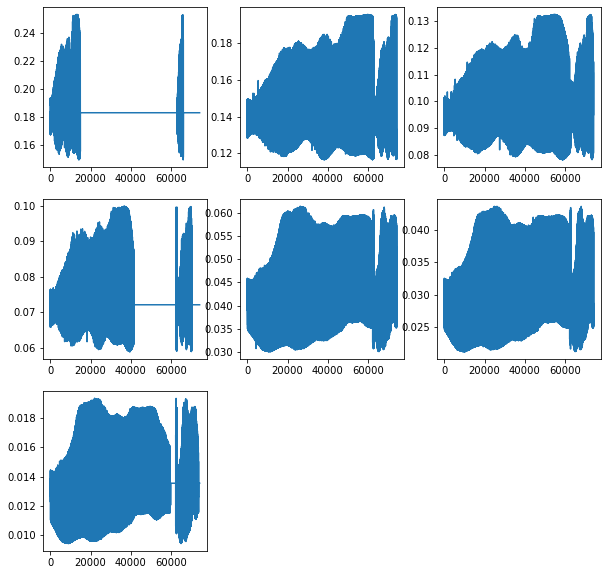

In [27]:
plt.figure(figsize=(10,10))
plt.subplot(331)
plt.plot(df_paper_extinction2['u_coeff*EBV_F11'])
plt.subplot(332)
plt.plot(df_paper_extinction2['g_coeff*EBV_F11'])
plt.subplot(333)
plt.plot(df_paper_extinction2['r_coeff*EBV_F11'])
plt.subplot(334)
plt.plot(df_paper_extinction2['i_coeff*EBV_F11'])
plt.subplot(335)
plt.plot(df_paper_extinction2['y_coeff*EBV_F11'])
plt.subplot(336)
plt.plot(df_paper_extinction2['j_coeff*EBV_F11'])
plt.subplot(337)
plt.plot(df_paper_extinction2['k_coeff*EBV_F11'])

In [17]:
mags_paper       = ['MAG_AUTO','MAG_AP1','MAG_AP3','MAG_AP4','MAG_AP_3FWHM','MAG_AP_8FWHM','MAG_MODEL']
bands_paper      = ['_u','_g','_r','_i','_y','_j','_k']
coeff_correzione = ['u_coeff*EBV_F11','g_coeff*EBV_F11','r_coeff*EBV_F11','i_coeff*EBV_F11','y_coeff*EBV_F11','j_coeff*EBV_F11','k_coeff*EBV_F11']

df_paper_extinction3 = df_paper_extinction2.copy()

for w in range(len(mags_paper)):
    for q in range(len(bands_paper)):
        #print(str(mags_paper[w]+bands_paper[q]))
        #print(coeff_correzione[q])
        #print()
        df_paper_extinction3[str(mags_paper[w]+bands_paper[q])] = df_paper_extinction3[str(mags_paper[w]+bands_paper[q])] - df_paper_extinction3[coeff_correzione[q]]

    
    
    

In [55]:
"""for w in range(len(mags_paper)):
    for q in range(len(bands_paper)):
        #print(str(mags_paper[w]+bands_paper[q]))
        #print(coeff_correzione[q])
        #print()
        print(str(mags_paper[w]+bands_paper[q]),df_paper_extinction2[str(mags_paper[w]+bands_paper[q])].mean())
        print(str(mags_paper[w]+bands_paper[q]),df_paper_extinction3[str(mags_paper[w]+bands_paper[q])].mean())
        print()
"""

'for w in range(len(mags_paper)):\n    for q in range(len(bands_paper)):\n        #print(str(mags_paper[w]+bands_paper[q]))\n        #print(coeff_correzione[q])\n        #print()\n        print(str(mags_paper[w]+bands_paper[q]),df_paper_extinction2[str(mags_paper[w]+bands_paper[q])].mean())\n        print(str(mags_paper[w]+bands_paper[q]),df_paper_extinction3[str(mags_paper[w]+bands_paper[q])].mean())\n        print()\n'

In [39]:
df_paper_extinction3

,ID_game0,ID_game,_ID_clash,RA_clash,DEC_clash,z_clash,ID_u,RA_u,DEC_u,MAG_AUTO_u,MAGERR_AUTO_u,KRON_RADIUS_u,MU_MAX_u,MAG_AP1_u,MAG_AP2_u,MAG_AP3_u,MAG_AP4_u,MAG_AP_3FWHM_u,MAG_AP_8FWHM_u,MAGERR_AP1_u,MAGERR_AP2_u,MAGERR_AP3_u,MAGERR_AP4_u,MAGERR_AP_3FWHM_u,MAGERR_AP_8FWHM_u,FLUX_RADIUS_50_u,CLASS_STAR_u,FWHM_IMAGE_u,A_IMAGE_u,B_IMAGE_u,THETA_IMAGE_u,MAG_PSF_u,MAGERR_PSF_u,MAG_MODEL_u,MAGERR_MODEL_u,SPREAD_MODEL_u,ID_g,RA_g,DEC_g,MAG_AUTO_g,MAGERR_AUTO_g,KRON_RADIUS_g,MU_MAX_g,MAG_AP1_g,MAG_AP2_g,MAG_AP3_g,MAG_AP4_g,MAG_AP_3FWHM_g,MAG_AP_8FWHM_g,MAGERR_AP1_g,MAGERR_AP2_g,MAGERR_AP3_g,MAGERR_AP4_g,MAGERR_AP_3FWHM_g,MAGERR_AP_8FWHM_g,FLUX_RADIUS_50_g,CLASS_STAR_g,FWHM_IMAGE_g,A_IMAGE_g,B_IMAGE_g,THETA_IMAGE_g,MAG_PSF_g,MAGERR_PSF_g,MAG_MODEL_g,MAGERR_MODEL_g,SPREAD_MODEL_g,ID_r,RA_r,DEC_r,MAG_AUTO_r,MAGERR_AUTO_r,KRON_RADIUS_r,MU_MAX_r,MAG_AP1_r,MAG_AP2_r,MAG_AP3_r,MAG_AP4_r,MAG_AP_3FWHM_r,MAG_AP_8FWHM_r,MAGERR_AP1_r,MAGERR_AP2_r,MAGERR_AP3_r,MAGERR_AP4_r,MAGERR_AP_3FWHM_r,MAGERR_AP_8FWHM_r,FLUX_RADIUS_50_r,CLASS_STAR_r,FWHM_IMAGE_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,MAG_PSF_r,MAGERR_PSF_r,MAG_MODEL_r,MAGERR_MODEL_r,SPREAD_MODEL_r,NSFLAG_r,MASK_FLAG_r,ID_i,RA_i,DEC_i,MAG_AUTO_i,MAGERR_AUTO_i,KRON_RADIUS_i,MU_MAX_i,MAG_AP1_i,MAG_AP2_i,MAG_AP3_i,MAG_AP4_i,MAG_AP_3FWHM_i,MAG_AP_8FWHM_i,MAGERR_AP1_i,MAGERR_AP2_i,MAGERR_AP3_i,MAGERR_AP4_i,MAGERR_AP_3FWHM_i,MAGERR_AP_8FWHM_i,FLUX_RADIUS_50_i,CLASS_STAR_i,FWHM_IMAGE_i,A_IMAGE_i,B_IMAGE_i,THETA_IMAGE_i,MAG_PSF_i,MAGERR_PSF_i,MAG_MODEL_i,MAGERR_MODEL_i,SPREAD_MODEL_i,ID_y,RA_y,DEC_y,MAG_AUTO_y,MAGERR_AUTO_y,KRON_RADIUS_y,MU_MAX_y,MAG_AP1_y,MAG_AP2_y,MAG_AP3_y,MAG_AP4_y,MAG_AP_3FWHM_y,MAG_AP_8FWHM_y,MAGERR_AP1_y,MAGERR_AP2_y,MAGERR_AP3_y,MAGERR_AP4_y,MAGERR_AP_3FWHM_y,MAGERR_AP_8FWHM_y,FLUX_RADIUS_50_y,CLASS_STAR_y,FWHM_IMAGE_y,A_IMAGE_y,B_IMAGE_y,THETA_IMAGE_y,MAG_PSF_y,MAGERR_PSF_y,MAG_MODEL_y,MAGERR_MODEL_y,SPREAD_MODEL_y,ID_j,RA_j,DEC_j,MAG_AUTO_j,MAGERR_AUTO_j,KRON_RADIUS_j,MU_MAX_j,MAG_AP1_j,MAG_AP2_j,MAG_AP3_j,MAG_AP4_j,MAG_AP_3FWHM_j,MAG_AP_8FWHM_j,MAGERR_AP1_j,MAGERR_AP2_j,MAGERR_AP3_j,MAGERR_AP4_j,MAGERR_AP_3FWHM_j,MAGERR_AP_8FWHM_j,FLUX_RADIUS_50_j,CLASS_STAR_j,FWHM_IMAGE_j,A_IMAGE_j,B_IMAGE_j,THETA_IMAGE_j,MAG_PSF_j,MAGERR_PSF_j,MAG_MODEL_j,MAGERR_MODEL_j,SPREAD_MODEL_j,ID_k,RA_k,DEC_k,MAG_AUTO_k,MAGERR_AUTO_k,KRON_RADIUS_k,MU_MAX_k,MAG_AP1_k,MAG_AP2_k,MAG_AP3_k,MAG_AP4_k,MAG_AP_3FWHM_k,MAG_AP_8FWHM_k,MAGERR_AP1_k,MAGERR_AP2_k,MAGERR_AP3_k,MAGERR_AP4_k,MAGERR_AP_3FWHM_k,MAGERR_AP_8FWHM_k,FLUX_RADIUS_50_k,CLASS_STAR_k,FWHM_IMAGE_k,A_IMAGE_k,B_IMAGE_k,THETA_IMAGE_k,MAG_PSF_k,MAGERR_PSF_k,MAG_MODEL_k,MAGERR_MODEL_k,SPREAD_MODEL_k,IDENT,Z_BEST,Z_BEST68_LOW,Z_BEST68_HIGH,Z_ML,CHI_BEST,MOD_BEST,EXTLAW_BEST,EBV_BEST,PDZ_BEST,SCALE_BEST,DIST_MOD_BEST,NBAND_USED,Z_SEC,CHI_SEC,MOD_SEC,Z_QSO,CHI_QSO,MOD_QSO,MOD_STAR,CHI_STAR,MAG_OBS_U,MAG_OBS_G,MAG_OBS_R,MAG_OBS_I,MAG_OBS_Y,MAG_OBS_J,MAG_OBS_K,ERR_MAG_OBS_U,ERR_MAG_OBS_G,ERR_MAG_OBS_R,ERR_MAG_OBS_I,ERR_MAG_OBS_Y,ERR_MAG_OBS_J,ERR_MAG_OBS_K,MAG_MOD_U,MAG_MOD_G,MAG_MOD_R,MAG_MOD_I,MAG_MOD_Y,MAG_MOD_J,MAG_MOD_K,CONTEXT,ZSPEC,MASS_BEST,SFR_BEST,SSFR_BEST,PHYS_PARA5_BEST,PHYS_PARA6_BEST,PHYS_PARA7_BEST,RA_2,DEC_2,u_coeff*EBV_F11,RA_3,DEC_3,g_coeff*EBV_F11,RA_4,DEC_4,r_coeff*EBV_F11,RA_5,DEC_5,i_coeff*EBV_F11,RA_6,DEC_6,y_coeff*EBV_F11,RA_7,DEC_7,j_coeff*EBV_F11,RA_8,DEC_8,k_coeff*EBV_F11
0,0,0,-99.0,-99.0,-99.0,-99.0,2.0,63.593922,-24.605635,17.861543,0.113705,3.50,22.1431,21.631143,21.2393,20.258943,19.723043,21.040143,19.229043,0.062347,0.060521,0.059521,0.059820,0.060545,0.060768,20.678,0.001,72.15,28.115,23.516,-52.19,21.4572,0.061075,17.855043,0.124067,0.041699,2.0,63.594058,-24.605625,16.975317,0.168488,3.50,21.4686,20.854817,20.3974,19.465117,18.938417,19.626417,18.010317,0.061867,0.063363,0.065816,0.069406,0.066411,0.081019,23.703,0.030,33.04,27.094,24.910,-43.78,20.0441,0.065265,16.985717,0.335501,0.045480,2.0,63.593922,-24.605635,16.622770,0.214455,3.50,20.9460,20.352270,19.8767,19.021370,18.516770,19.776570,18.055270,0.061029,0.062

In [22]:
df_paper_extinction4 = df_paper_extinction3.copy()

new_id = SkyCoord(ra=df_paper_extinction4['RA_r'].values*u.degree, dec=df_paper_extinction4['DEC_r'].values*u.degree, frame='icrs')
new_id_prova = np.array(new_id.to_string('hmsdms',sep='',precision=1))
#np.savetxt('new_id_prova.txt',new_id_prova,fmt='%s',newline='\n')
### aprire con Sublime, togliere lo spazio ed il punto decimale

In [25]:
new_id2 = pd.read_csv('new_id_prova.txt',header=None)

In [100]:
new_id2

,0
0,GAME0414225-2436203
1,GAME0414248-2436296
2,GAME0416207-2436258
3,GAME0415237-2436535
4,GAME0416001-2436511
...,...
74109,GAME0417281-2330501
74110,GAME0415481-2330504
74111,GAME0417123-2330502
74112,GAME0416214-2330499


In [26]:
df_paper_extinction4['GAME_ID'] = new_id2

In [27]:
df_paper_extinction4


,ID_game0,ID_game,_ID_clash,RA_clash,DEC_clash,z_clash,ID_u,RA_u,DEC_u,MAG_AUTO_u,MAGERR_AUTO_u,KRON_RADIUS_u,MU_MAX_u,MAG_AP1_u,MAG_AP2_u,MAG_AP3_u,MAG_AP4_u,MAG_AP_3FWHM_u,MAG_AP_8FWHM_u,MAGERR_AP1_u,MAGERR_AP2_u,MAGERR_AP3_u,MAGERR_AP4_u,MAGERR_AP_3FWHM_u,MAGERR_AP_8FWHM_u,FLUX_RADIUS_50_u,CLASS_STAR_u,FWHM_IMAGE_u,A_IMAGE_u,B_IMAGE_u,THETA_IMAGE_u,MAG_PSF_u,MAGERR_PSF_u,MAG_MODEL_u,MAGERR_MODEL_u,SPREAD_MODEL_u,ID_g,RA_g,DEC_g,MAG_AUTO_g,MAGERR_AUTO_g,KRON_RADIUS_g,MU_MAX_g,MAG_AP1_g,MAG_AP2_g,MAG_AP3_g,MAG_AP4_g,MAG_AP_3FWHM_g,MAG_AP_8FWHM_g,MAGERR_AP1_g,MAGERR_AP2_g,MAGERR_AP3_g,MAGERR_AP4_g,MAGERR_AP_3FWHM_g,MAGERR_AP_8FWHM_g,FLUX_RADIUS_50_g,CLASS_STAR_g,FWHM_IMAGE_g,A_IMAGE_g,B_IMAGE_g,THETA_IMAGE_g,MAG_PSF_g,MAGERR_PSF_g,MAG_MODEL_g,MAGERR_MODEL_g,SPREAD_MODEL_g,ID_r,RA_r,DEC_r,MAG_AUTO_r,MAGERR_AUTO_r,KRON_RADIUS_r,MU_MAX_r,MAG_AP1_r,MAG_AP2_r,MAG_AP3_r,MAG_AP4_r,MAG_AP_3FWHM_r,MAG_AP_8FWHM_r,MAGERR_AP1_r,MAGERR_AP2_r,MAGERR_AP3_r,MAGERR_AP4_r,MAGERR_AP_3FWHM_r,MAGERR_AP_8FWHM_r,FLUX_RADIUS_50_r,CLASS_STAR_r,FWHM_IMAGE_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,MAG_PSF_r,MAGERR_PSF_r,MAG_MODEL_r,MAGERR_MODEL_r,SPREAD_MODEL_r,NSFLAG_r,MASK_FLAG_r,ID_i,RA_i,DEC_i,MAG_AUTO_i,MAGERR_AUTO_i,KRON_RADIUS_i,MU_MAX_i,MAG_AP1_i,MAG_AP2_i,MAG_AP3_i,MAG_AP4_i,MAG_AP_3FWHM_i,MAG_AP_8FWHM_i,MAGERR_AP1_i,MAGERR_AP2_i,MAGERR_AP3_i,MAGERR_AP4_i,MAGERR_AP_3FWHM_i,MAGERR_AP_8FWHM_i,FLUX_RADIUS_50_i,CLASS_STAR_i,FWHM_IMAGE_i,A_IMAGE_i,B_IMAGE_i,THETA_IMAGE_i,MAG_PSF_i,MAGERR_PSF_i,MAG_MODEL_i,MAGERR_MODEL_i,SPREAD_MODEL_i,ID_y,RA_y,DEC_y,MAG_AUTO_y,MAGERR_AUTO_y,KRON_RADIUS_y,MU_MAX_y,MAG_AP1_y,MAG_AP2_y,MAG_AP3_y,MAG_AP4_y,MAG_AP_3FWHM_y,MAG_AP_8FWHM_y,MAGERR_AP1_y,MAGERR_AP2_y,MAGERR_AP3_y,MAGERR_AP4_y,MAGERR_AP_3FWHM_y,MAGERR_AP_8FWHM_y,FLUX_RADIUS_50_y,CLASS_STAR_y,FWHM_IMAGE_y,A_IMAGE_y,B_IMAGE_y,THETA_IMAGE_y,MAG_PSF_y,MAGERR_PSF_y,MAG_MODEL_y,MAGERR_MODEL_y,SPREAD_MODEL_y,ID_j,RA_j,DEC_j,MAG_AUTO_j,MAGERR_AUTO_j,KRON_RADIUS_j,MU_MAX_j,MAG_AP1_j,MAG_AP2_j,MAG_AP3_j,MAG_AP4_j,MAG_AP_3FWHM_j,MAG_AP_8FWHM_j,MAGERR_AP1_j,MAGERR_AP2_j,MAGERR_AP3_j,MAGERR_AP4_j,MAGERR_AP_3FWHM_j,MAGERR_AP_8FWHM_j,FLUX_RADIUS_50_j,CLASS_STAR_j,FWHM_IMAGE_j,A_IMAGE_j,B_IMAGE_j,THETA_IMAGE_j,MAG_PSF_j,MAGERR_PSF_j,MAG_MODEL_j,MAGERR_MODEL_j,SPREAD_MODEL_j,ID_k,RA_k,DEC_k,MAG_AUTO_k,MAGERR_AUTO_k,KRON_RADIUS_k,MU_MAX_k,MAG_AP1_k,MAG_AP2_k,MAG_AP3_k,MAG_AP4_k,MAG_AP_3FWHM_k,MAG_AP_8FWHM_k,MAGERR_AP1_k,MAGERR_AP2_k,MAGERR_AP3_k,MAGERR_AP4_k,MAGERR_AP_3FWHM_k,MAGERR_AP_8FWHM_k,FLUX_RADIUS_50_k,CLASS_STAR_k,FWHM_IMAGE_k,A_IMAGE_k,B_IMAGE_k,THETA_IMAGE_k,MAG_PSF_k,MAGERR_PSF_k,MAG_MODEL_k,MAGERR_MODEL_k,SPREAD_MODEL_k,IDENT,Z_BEST,Z_BEST68_LOW,Z_BEST68_HIGH,Z_ML,CHI_BEST,MOD_BEST,EXTLAW_BEST,EBV_BEST,PDZ_BEST,SCALE_BEST,DIST_MOD_BEST,NBAND_USED,Z_SEC,CHI_SEC,MOD_SEC,Z_QSO,CHI_QSO,MOD_QSO,MOD_STAR,CHI_STAR,MAG_OBS_U,MAG_OBS_G,MAG_OBS_R,MAG_OBS_I,MAG_OBS_Y,MAG_OBS_J,MAG_OBS_K,ERR_MAG_OBS_U,ERR_MAG_OBS_G,ERR_MAG_OBS_R,ERR_MAG_OBS_I,ERR_MAG_OBS_Y,ERR_MAG_OBS_J,ERR_MAG_OBS_K,MAG_MOD_U,MAG_MOD_G,MAG_MOD_R,MAG_MOD_I,MAG_MOD_Y,MAG_MOD_J,MAG_MOD_K,CONTEXT,ZSPEC,MASS_BEST,SFR_BEST,SSFR_BEST,PHYS_PARA5_BEST,PHYS_PARA6_BEST,PHYS_PARA7_BEST,RA_2,DEC_2,u_coeff*EBV_F11,RA_3,DEC_3,g_coeff*EBV_F11,RA_4,DEC_4,r_coeff*EBV_F11,RA_5,DEC_5,i_coeff*EBV_F11,RA_6,DEC_6,y_coeff*EBV_F11,RA_7,DEC_7,j_coeff*EBV_F11,RA_8,DEC_8,k_coeff*EBV_F11,GAME_ID
0,0,0,-99.0,-99.0,-99.0,-99.0,2.0,63.593922,-24.605635,17.861543,0.113705,3.50,22.1431,21.631143,21.2393,20.258943,19.723043,21.040143,19.229043,0.062347,0.060521,0.059521,0.059820,0.060545,0.060768,20.678,0.001,72.15,28.115,23.516,-52.19,21.4572,0.061075,17.855043,0.124067,0.041699,2.0,63.594058,-24.605625,16.975317,0.168488,3.50,21.4686,20.854817,20.3974,19.465117,18.938417,19.626417,18.010317,0.061867,0.063363,0.065816,0.069406,0.066411,0.081019,23.703,0.030,33.04,27.094,24.910,-43.78,20.0441,0.065265,16.985717,0.335501,0.045480,2.0,63.593922,-24.605635,16.622770,0.214455,3.50,20.9460,20.352270,19.8767,19.021370,18.516770,19.776570,18.055270,0.0610

In [430]:
columns_release = ['GAME_ID', 'RA_r', 'DEC_r', 'A_IMAGE_r', 'B_IMAGE_r', 'THETA_IMAGE_r', 'FLUX_RADIUS_50_r', 'KRON_RADIUS_r', 
                 'MAG_AP1_u', 'MAGERR_AP1_u','MAG_AP3_u', 'MAGERR_AP3_u', 'MAG_AP4_u', 'MAGERR_AP4_u','MAG_AUTO_u', 'MAGERR_AUTO_u', 'MAG_MODEL_u', 'MAGERR_MODEL_u', 
                 'MAG_PSF_u', 'MAGERR_PSF_u', 'u_coeff*EBV_F11',
                 'MAG_AP1_g', 'MAGERR_AP1_g', 'MAG_AP3_g', 'MAGERR_AP3_g','MAG_AP4_g', 'MAGERR_AP4_g','MAG_AUTO_g', 'MAGERR_AUTO_g', 'MAG_MODEL_g', 'MAGERR_MODEL_g', 
                 'MAG_PSF_g', 'MAGERR_PSF_g', 'g_coeff*EBV_F11',
                 'MAG_AP1_r', 'MAGERR_AP1_r', 'MAG_AP3_r', 'MAGERR_AP3_r','MAG_AP4_r', 'MAGERR_AP4_r','MAG_AUTO_r', 'MAGERR_AUTO_r', 'MAG_MODEL_r', 'MAGERR_MODEL_r', 
                 'MAG_PSF_r', 'MAGERR_PSF_r', 'r_coeff*EBV_F11',
                 'MAG_AP1_i', 'MAGERR_AP1_i', 'MAG_AP3_i', 'MAGERR_AP3_i','MAG_AP4_i', 'MAGERR_AP4_i','MAG_AUTO_i', 'MAGERR_AUTO_i', 'MAG_MODEL_i', 'MAGERR_MODEL_i', 
                 'MAG_PSF_i', 'MAGERR_PSF_i', 'i_coeff*EBV_F11',
                 'MAG_AP1_y', 'MAGERR_AP1_y', 'MAG_AP3_y', 'MAGERR_AP3_y','MAG_AP4_y', 'MAGERR_AP4_y','MAG_AUTO_y', 'MAGERR_AUTO_y', 'MAG_MODEL_y', 'MAGERR_MODEL_y', 
                 'MAG_PSF_y', 'MAGERR_PSF_y', 'y_coeff*EBV_F11',
                 'MAG_AP1_j', 'MAGERR_AP1_j', 'MAG_AP3_j', 'MAGERR_AP3_j','MAG_AP4_j', 'MAGERR_AP4_j','MAG_AUTO_j', 'MAGERR_AUTO_j', 'MAG_MODEL_j', 'MAGERR_MODEL_j', 
                 'MAG_PSF_j', 'MAGERR_PSF_j', 'j_coeff*EBV_F11',
                 'MAG_AP1_k', 'MAGERR_AP1_k', 'MAG_AP3_k', 'MAGERR_AP3_k','MAG_AP4_k', 'MAGERR_AP4_k','MAG_AUTO_k', 'MAGERR_AUTO_k', 'MAG_MODEL_k', 'MAGERR_MODEL_k', 
                 'MAG_PSF_k', 'MAGERR_PSF_k', 'k_coeff*EBV_F11',
                 'CLASS_STAR_r', 'NSFLAG_r', 'MASK_FLAG_r', 'Z_BEST']

columns_release_spec = ['GAME_ID', 'RA_r', 'DEC_r', 'A_IMAGE_r', 'B_IMAGE_r', 'THETA_IMAGE_r', 'FLUX_RADIUS_50_r', 'KRON_RADIUS_r', 
                 'MAG_AP1_u', 'MAGERR_AP1_u','MAG_AP3_u', 'MAGERR_AP3_u', 'MAG_AP4_u', 'MAGERR_AP4_u','MAG_AUTO_u', 'MAGERR_AUTO_u', 'MAG_MODEL_u', 'MAGERR_MODEL_u', 
                 'MAG_PSF_u', 'MAGERR_PSF_u', 'u_coeff*EBV_F11',
                 'MAG_AP1_g', 'MAGERR_AP1_g', 'MAG_AP3_g', 'MAGERR_AP3_g','MAG_AP4_g', 'MAGERR_AP4_g','MAG_AUTO_g', 'MAGERR_AUTO_g', 'MAG_MODEL_g', 'MAGERR_MODEL_g', 
                 'MAG_PSF_g', 'MAGERR_PSF_g', 'g_coeff*EBV_F11',
                 'MAG_AP1_r', 'MAGERR_AP1_r', 'MAG_AP3_r', 'MAGERR_AP3_r','MAG_AP4_r', 'MAGERR_AP4_r','MAG_AUTO_r', 'MAGERR_AUTO_r', 'MAG_MODEL_r', 'MAGERR_MODEL_r', 
                 'MAG_PSF_r', 'MAGERR_PSF_r', 'r_coeff*EBV_F11',
                 'MAG_AP1_i', 'MAGERR_AP1_i', 'MAG_AP3_i', 'MAGERR_AP3_i','MAG_AP4_i', 'MAGERR_AP4_i','MAG_AUTO_i', 'MAGERR_AUTO_i', 'MAG_MODEL_i', 'MAGERR_MODEL_i', 
                 'MAG_PSF_i', 'MAGERR_PSF_i', 'i_coeff*EBV_F11',
                 'MAG_AP1_y', 'MAGERR_AP1_y', 'MAG_AP3_y', 'MAGERR_AP3_y','MAG_AP4_y', 'MAGERR_AP4_y','MAG_AUTO_y', 'MAGERR_AUTO_y', 'MAG_MODEL_y', 'MAGERR_MODEL_y', 
                 'MAG_PSF_y', 'MAGERR_PSF_y', 'y_coeff*EBV_F11',
                 'MAG_AP1_j', 'MAGERR_AP1_j', 'MAG_AP3_j', 'MAGERR_AP3_j','MAG_AP4_j', 'MAGERR_AP4_j','MAG_AUTO_j', 'MAGERR_AUTO_j', 'MAG_MODEL_j', 'MAGERR_MODEL_j', 
                 'MAG_PSF_j', 'MAGERR_PSF_j', 'j_coeff*EBV_F11',
                 'MAG_AP1_k', 'MAGERR_AP1_k', 'MAG_AP3_k', 'MAGERR_AP3_k','MAG_AP4_k', 'MAGERR_AP4_k','MAG_AUTO_k', 'MAGERR_AUTO_k', 'MAG_MODEL_k', 'MAGERR_MODEL_k', 
                 'MAG_PSF_k', 'MAGERR_PSF_k', 'k_coeff*EBV_F11',
                 'CLASS_STAR_r', 'NSFLAG_r', 'MASK_FLAG_r', 'Z_BEST','z_clash']

columns_paper = ['GAME_ID', 'RA_r', 'DEC_r', 'A_IMAGE_r', 'B_IMAGE_r', 'THETA_IMAGE_r', 'FLUX_RADIUS_50_r', 'KRON_RADIUS_r', 
                 'MAG_AP1_u', 'MAGERR_AP1_u', 'MAG_AP3_u', 'MAGERR_AP3_u', 'MAG_AP4_u', 'MAGERR_AP4_u','MAG_AUTO_u', 'MAGERR_AUTO_u', 'MAG_MODEL_u', 'MAGERR_MODEL_u', 
                 'MAG_PSF_u', 'MAGERR_PSF_u', 'u_coeff*EBV_F11',
                 'CLASS_STAR_r', 'NSFLAG_r', 'MASK_FLAG_r', 'Z_BEST']

In [431]:
### IMPORTANTISSIMO!!! CATALOGO DA PUBBLICARE
### Una volta finito, fare con topcat il nome vero delle colonne
#df_paper_extinction4.to_csv('/Users/nestrada/Documents/Game/df_paper_finale.cat',sep=',',na_rep='',columns=columns_release,index=False)
#df_paper_extinction4.to_csv('/Users/nestrada/Documents/Game/df_paper_finale_spazio.cat',sep=' ',na_rep='',columns=columns_release,index=False)
df_paper_extinction4.to_csv('/Users/nestrada/Documents/Game/df_paper_finale_spazio_spec.cat',sep=' ',na_rep='',columns=columns_release_spec,index=False)



In [39]:
pd.set_option("display.precision", 6)

df_paper_extinction4[columns_paper].head(20)

,GAME_ID,RA_r,DEC_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,FLUX_RADIUS_50_r,KRON_RADIUS_r,MAG_AP1_u,MAGERR_AP1_u,MAG_AP3_u,MAGERR_AP3_u,MAG_AP4_u,MAGERR_AP4_u,MAG_AUTO_u,MAGERR_AUTO_u,MAG_MODEL_u,MAGERR_MODEL_u,MAG_PSF_u,MAGERR_PSF_u,u_coeff*EBV_F11,CLASS_STAR_r,NSFLAG_r,MASK_FLAG_r,Z_BEST
0,GAME0414225-2436203,63.593922,-24.605635,28.115,23.516,-52.19,22.945,3.50,21.631143,0.062347,20.258943,0.059521,19.723043,0.059820,17.861543,0.113705,17.855043,0.124067,21.4572,0.061075,0.188457,0.030,0.0,0.0,0.1721
1,GAME0414248-2436296,63.603519,-24.608214,10.908,7.376,-84.86,7.796,3.50,15.198386,0.061942,14.601286,0.071395,14.482286,0.074039,14.334386,0.105576,14.311986,0.163620,14.8891,0.069487,0.192314,0.752,9.0,0.0,-99.0000
2,GAME0416207-2436258,64.086120,-24.607161,16.081,8.370,82.97,12.159,3.50,22.392610,0.072791,21.154010,0.066871,20.751010,0.067020,19.595610,0.087170,19.595610,0.073231,22.2908,0.071532,0.193490,0.029,0.0,0.0,0.3047
3,GAME0415237-2436535,63.848645,-24.614866,19.489,9.474,-31.09,10.695,3.50,23.354222,0.109546,22.354022,0.099195,22.083522,0.102185,21.213722,0.189951,21.213722,0.097540,23.2311,0.104665,0.193478,0.029,0.0,0.0,0.3333
4,GAME0416001-2436511,64.000477,-24.614206,7.083,6.270,-66.84,3.458,3.50,17.509113,0.055416,16.944313,0.056784,16.833213,0.060028,16.712413,0.066840,16.643413,0.112887,17.2321,0.056181,0.186987,0.973,9.0,0.0,-99.0000
5,GAME0414210-2436318,63.587502,-24.608844,8.078,6.644,-61.98,4.304,3.50,18.417093,0.053814,17.843793,0.056092,17.730793,0.057833,17.602993,0.066262,17.603293,0.118783,18.1460,0.055507,0.182907,0.956,9.0,0.0,-99.0000
6,GAME0415173-2436583,63.822093,-24.616186,17.560,13.886,-19.08,13.723,3.50,22.251962,0.077912,21.201862,0.074520,20.903962,0.076325,20.129562,0.137086,20.129862,0.144180,21.9748,0.072537,0.169238,0.029,0.0,0.0,0.0736
7,GAME0416419-2436308,64.174672,-24.608560,9.479,6.778,-72.24,8.115,3.50,22.872094,0.084527,21.614094,0.074134,21.193294,0.073312,20.478094,0.089972,20.478094,0.078523,22.8182,0.083783,0.185106,0.029,0.0,0.0,0.1240
8,GAME0415189-2436568,63.828662,-24.615765,14.008,5.428,-29.08,4.111,3.50,19.813158,0.055213,19.036558,0.057689,18.893158,0.059357,18.733058,0.078917,18.733058,0.104843,19.3726,0.054429,0.191942,0.884,3.0,0.0,-99.0000
9,GAME0416278-2436328,64.115629,-24.609123,7.709,6.443,-70.54,4.110,3.50,19.190656,0.054089,18.628756,0.056011,18.520056,0.057709,18.393056,0.067003,18.393556,0.093798,18.9725,0.054820,0.170444,0.962,9.0,0.0,-99.0000


# Saving LePhare catalogs with this version of the catalogue

In [310]:
all_mags  = ['AUTO','AP1','AP2','AP3','AP4','AP_3FWHM','AP_8FWHM','PSF','MODEL']

df_paper_extinction5 = df_paper_extinction4.copy()
df_paper_extinction5['STRING']  = np.nan

#completeness  = [23.6,24.8,24.4,23.6,24.4,22.9,22.2]
#saturation    = [12.6,15.3,16.1,15.9,13.9,14.9,15.2]

for k in all_mags:
    mag = k # options: 'AUTO',AP1','AP2','AP3'...
    df_paper_extinction5['CONTEXT_'+mag] = 127
    lephare_mags  = ['MAG_'+mag+'_u','MAG_'+mag+'_g','MAG_'+mag+'_r','MAG_'+mag+'_i','MAG_'+mag+'_y','MAG_'+mag+'_j','MAG_'+mag+'_k']
    
    for i in range(len(df_paper_extinction5)-1):
        context = 0
        for j in range(len(lephare_mags)):
            if df_paper_extinction5.loc[i,lephare_mags[j]]<= 35: 
                context += 2**j
        df_paper_extinction5.loc[i,'CONTEXT_'+mag]=context

In [390]:
mag = 'PSF' # OPTIONS: 'AUTO','AP1','AP2','AP3','AP4','AP_3FWHM','AP_8FWHM','PSF','MODEL'

lephare_long  = ['MAG_'+mag+'_u','MAGERR_'+mag+'_u','MAG_'+mag+'_g','MAGERR_'+mag+'_g','MAG_'+mag+'_r','MAGERR_'+mag+'_r','MAG_'+mag+'_i','MAGERR_'+mag+'_i','MAG_'+mag+'_y','MAGERR_'+mag+'_y','MAG_'+mag+'_j','MAGERR_'+mag+'_j','MAG_'+mag+'_k','MAGERR_'+mag+'_k','CONTEXT_'+mag,'z_clash','STRING']

In [333]:
### Version con tutti gli oggetti
#df_paper_extinction5.to_csv('/Users/nestrada/Documents/Game/df_paper_ext5_model_lp.cat',sep=',',na_rep='',columns=lephare_long)
### IMPORTANT: ADD TO THE FIRST LINE OF THE OUTPUT: #ID_game

In [315]:
### Versione solo galassie
df_paper_extinction5_b = df_paper_extinction5.copy()
df_paper_extinction5_b = df_paper_extinction5_b[((df_paper_extinction5_b['z_clash']==-99)|((df_paper_extinction5_b['z_clash']>0)&(df_paper_extinction5_b['z_clash']<1)))&(df_paper_extinction5_b['NSFLAG_r']==0)]

In [391]:
#df_paper_extinction5_b.to_csv('/Users/nestrada/Documents/Game/df_paper_ext5_b_psf_lp.cat',sep=',',na_rep='',columns=lephare_long)
### IMPORTANT: ADD TO THE FIRST LINE OF THE OUTPUT: #ID_game

In [392]:
df_paper_extinction5_ap1_photoz = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/df_paper_ext5_ap1/df_paper_ext5_ap1.out",sep='\s+',skiprows=83,header=None)
df_paper_extinction5_ap1_b_photoz = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/df_paper_ext5_b_ap1/df_paper_ext5_b_ap1.out",sep='\s+',skiprows=83,header=None)
df_paper_extinction5_model_b_photoz = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/df_paper_ext5_b_model/df_paper_ext5_b_model.out",sep='\s+',skiprows=83,header=None)
df_paper_extinction5_psf_b_photoz = pd.read_csv("/Users/nestrada/MEGA/MEGAsync/PhD/MEGA_GAME/photoz_SED/df_paper_ext5_b_psf/df_paper_ext5_b_psf.out",sep='\s+',skiprows=83,header=None)



df_paper_extinction5_ap1_photoz.columns = header_lp_prova1
df_paper_extinction5_ap1_b_photoz.columns = header_lp_prova1
df_paper_extinction5_model_b_photoz.columns = header_lp_prova1
df_paper_extinction5_psf_b_photoz.columns = header_lp_prova1

In [348]:
#print('Nuova versione con estinzione')
#zspec_zphot(df_paper_extinction5_ap1_photoz['ZSPEC'],df_paper_extinction5_ap1_photoz['Z_BEST'],(0,5),True,'prova_saving')

Nuova versione con estinzione e gli oggetti giusti
|mean(Delta z)| = 0.0361
std(Delta z)    = 0.0298

sigma_NMAD      = 0.0411
eta             = 3.75 %


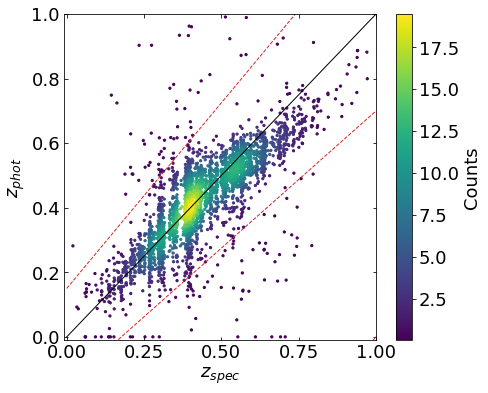

Central objects: 3696  (96.2%)
Outliers: 144  (3.8%)
|mean(Delta z)| = 0.0354
std(Delta z)    = 0.0293

sigma_NMAD      = 0.0406
eta             = 3.16 %


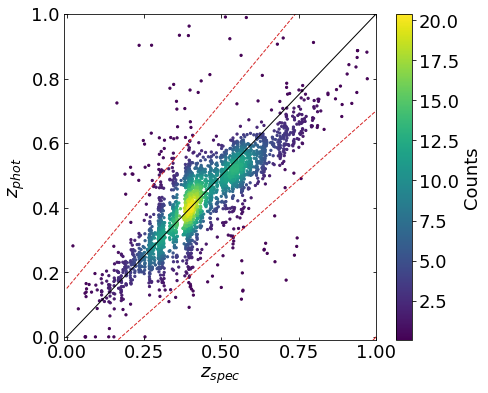

Central objects: 3191  (96.8%)
Outliers: 104  (3.2%)
49779


In [350]:
print('Nuova versione con estinzione e gli oggetti giusti')
zspec_zphot(df_paper_extinction5_ap1_b_photoz['ZSPEC'],df_paper_extinction5_ap1_b_photoz['Z_BEST'],(0,1),True,'PAPER_phz_4')

# brevemente taglio in S/N
df5_SN_y = SN(df_paper_extinction5_ap1_b_photoz['MAG_OBS_Y'],df_paper_extinction5_ap1_b_photoz['ERR_MAG_OBS_Y'],5)
df5_SN_j = SN(df_paper_extinction5_ap1_b_photoz['MAG_OBS_J'],df_paper_extinction5_ap1_b_photoz['ERR_MAG_OBS_J'],5)
df5_SN_k = SN(df_paper_extinction5_ap1_b_photoz['MAG_OBS_K'],df_paper_extinction5_ap1_b_photoz['ERR_MAG_OBS_K'],5)

df5_SN_nir = df5_SN_y&df5_SN_j&df5_SN_k

zspec_zphot(df_paper_extinction5_ap1_b_photoz['ZSPEC'][df5_SN_nir],df_paper_extinction5_ap1_b_photoz['Z_BEST'][df5_SN_nir],(0,1),False,'xxx')
print(len(df_paper_extinction5_ap1_b_photoz['ZSPEC'][df5_SN_nir],))


Nuova versione con estinzione e gli oggeti giusti e mag model
|mean(Delta z)| = 0.0481
std(Delta z)    = 0.0366

sigma_NMAD      = 0.0593
eta             = 15.13 %


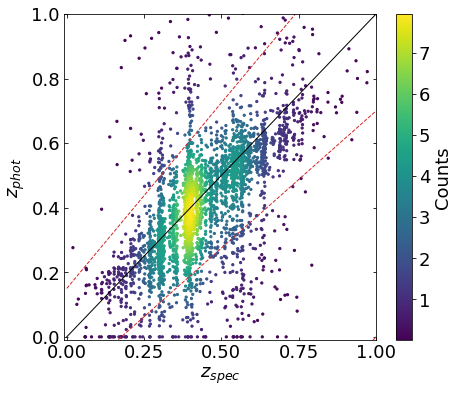

Central objects: 3259  (84.9%)
Outliers: 581  (15.1%)


In [346]:
print('Nuova versione con estinzione e gli oggeti giusti e mag model')
zspec_zphot(df_paper_extinction5_model_b_photoz['ZSPEC'],df_paper_extinction5_model_b_photoz['Z_BEST'],(0,1),False,'xxx')

|mean(Delta z)| = 0.0478
std(Delta z)    = 0.0368

sigma_NMAD      = 0.0569
eta             = 16.72 %


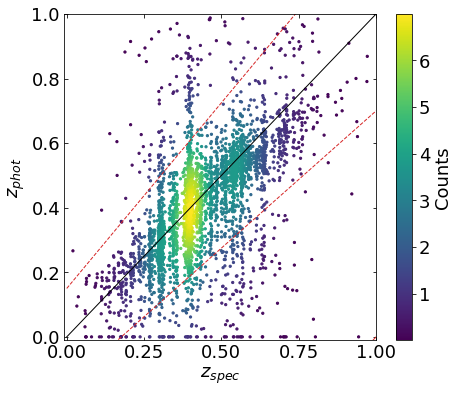

Central objects: 3382  (83.3%)
Outliers: 679  (16.7%)


In [347]:

zspec_zphot(gamelp_out_model['ZSPEC'],gamelp_out_model['Z_BEST'],(0,1),False,'xxx')

Nuova versione con estinzione e gli oggeti giusti e mag model
|mean(Delta z)| = 0.0391
std(Delta z)    = 0.0314

sigma_NMAD      = 0.0466
eta             = 4.04 %


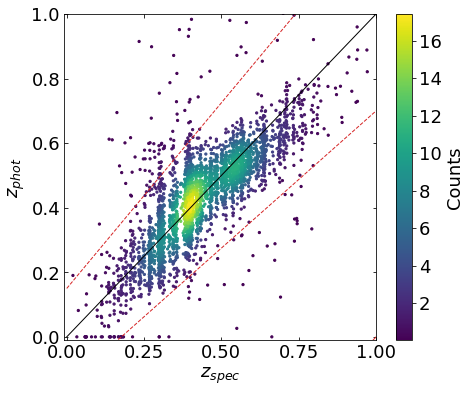

Central objects: 3685  (96.0%)
Outliers: 155  (4.0%)


In [393]:
print('Nuova versione con estinzione e gli oggeti giusti e mag model')
zspec_zphot(df_paper_extinction5_psf_b_photoz['ZSPEC'],df_paper_extinction5_psf_b_photoz['Z_BEST'],(0,1),False,'xxx')

In [308]:
df_paper_extinction4

,ID_game0,ID_game,_ID_clash,RA_clash,DEC_clash,z_clash,ID_u,RA_u,DEC_u,MAG_AUTO_u,MAGERR_AUTO_u,KRON_RADIUS_u,MU_MAX_u,MAG_AP1_u,MAG_AP2_u,MAG_AP3_u,MAG_AP4_u,MAG_AP_3FWHM_u,MAG_AP_8FWHM_u,MAGERR_AP1_u,MAGERR_AP2_u,MAGERR_AP3_u,MAGERR_AP4_u,MAGERR_AP_3FWHM_u,MAGERR_AP_8FWHM_u,FLUX_RADIUS_50_u,CLASS_STAR_u,FWHM_IMAGE_u,A_IMAGE_u,B_IMAGE_u,THETA_IMAGE_u,MAG_PSF_u,MAGERR_PSF_u,MAG_MODEL_u,MAGERR_MODEL_u,SPREAD_MODEL_u,ID_g,RA_g,DEC_g,MAG_AUTO_g,MAGERR_AUTO_g,KRON_RADIUS_g,MU_MAX_g,MAG_AP1_g,MAG_AP2_g,MAG_AP3_g,MAG_AP4_g,MAG_AP_3FWHM_g,MAG_AP_8FWHM_g,MAGERR_AP1_g,MAGERR_AP2_g,MAGERR_AP3_g,MAGERR_AP4_g,MAGERR_AP_3FWHM_g,MAGERR_AP_8FWHM_g,FLUX_RADIUS_50_g,CLASS_STAR_g,FWHM_IMAGE_g,A_IMAGE_g,B_IMAGE_g,THETA_IMAGE_g,MAG_PSF_g,MAGERR_PSF_g,MAG_MODEL_g,MAGERR_MODEL_g,SPREAD_MODEL_g,ID_r,RA_r,DEC_r,MAG_AUTO_r,MAGERR_AUTO_r,KRON_RADIUS_r,MU_MAX_r,MAG_AP1_r,MAG_AP2_r,MAG_AP3_r,MAG_AP4_r,MAG_AP_3FWHM_r,MAG_AP_8FWHM_r,MAGERR_AP1_r,MAGERR_AP2_r,MAGERR_AP3_r,MAGERR_AP4_r,MAGERR_AP_3FWHM_r,MAGERR_AP_8FWHM_r,FLUX_RADIUS_50_r,CLASS_STAR_r,FWHM_IMAGE_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,MAG_PSF_r,MAGERR_PSF_r,MAG_MODEL_r,MAGERR_MODEL_r,SPREAD_MODEL_r,NSFLAG_r,MASK_FLAG_r,ID_i,RA_i,DEC_i,MAG_AUTO_i,MAGERR_AUTO_i,KRON_RADIUS_i,MU_MAX_i,MAG_AP1_i,MAG_AP2_i,MAG_AP3_i,MAG_AP4_i,MAG_AP_3FWHM_i,MAG_AP_8FWHM_i,MAGERR_AP1_i,MAGERR_AP2_i,MAGERR_AP3_i,MAGERR_AP4_i,MAGERR_AP_3FWHM_i,MAGERR_AP_8FWHM_i,FLUX_RADIUS_50_i,CLASS_STAR_i,FWHM_IMAGE_i,A_IMAGE_i,B_IMAGE_i,THETA_IMAGE_i,MAG_PSF_i,MAGERR_PSF_i,MAG_MODEL_i,MAGERR_MODEL_i,SPREAD_MODEL_i,ID_y,RA_y,DEC_y,MAG_AUTO_y,MAGERR_AUTO_y,KRON_RADIUS_y,MU_MAX_y,MAG_AP1_y,MAG_AP2_y,MAG_AP3_y,MAG_AP4_y,MAG_AP_3FWHM_y,MAG_AP_8FWHM_y,MAGERR_AP1_y,MAGERR_AP2_y,MAGERR_AP3_y,MAGERR_AP4_y,MAGERR_AP_3FWHM_y,MAGERR_AP_8FWHM_y,FLUX_RADIUS_50_y,CLASS_STAR_y,FWHM_IMAGE_y,A_IMAGE_y,B_IMAGE_y,THETA_IMAGE_y,MAG_PSF_y,MAGERR_PSF_y,MAG_MODEL_y,MAGERR_MODEL_y,SPREAD_MODEL_y,ID_j,RA_j,DEC_j,MAG_AUTO_j,MAGERR_AUTO_j,KRON_RADIUS_j,MU_MAX_j,MAG_AP1_j,MAG_AP2_j,MAG_AP3_j,MAG_AP4_j,MAG_AP_3FWHM_j,MAG_AP_8FWHM_j,MAGERR_AP1_j,MAGERR_AP2_j,MAGERR_AP3_j,MAGERR_AP4_j,MAGERR_AP_3FWHM_j,MAGERR_AP_8FWHM_j,FLUX_RADIUS_50_j,CLASS_STAR_j,FWHM_IMAGE_j,A_IMAGE_j,B_IMAGE_j,THETA_IMAGE_j,MAG_PSF_j,MAGERR_PSF_j,MAG_MODEL_j,MAGERR_MODEL_j,SPREAD_MODEL_j,ID_k,RA_k,DEC_k,MAG_AUTO_k,MAGERR_AUTO_k,KRON_RADIUS_k,MU_MAX_k,MAG_AP1_k,MAG_AP2_k,MAG_AP3_k,MAG_AP4_k,MAG_AP_3FWHM_k,MAG_AP_8FWHM_k,MAGERR_AP1_k,MAGERR_AP2_k,MAGERR_AP3_k,MAGERR_AP4_k,MAGERR_AP_3FWHM_k,MAGERR_AP_8FWHM_k,FLUX_RADIUS_50_k,CLASS_STAR_k,FWHM_IMAGE_k,A_IMAGE_k,B_IMAGE_k,THETA_IMAGE_k,MAG_PSF_k,MAGERR_PSF_k,MAG_MODEL_k,MAGERR_MODEL_k,SPREAD_MODEL_k,IDENT,Z_BEST,Z_BEST68_LOW,Z_BEST68_HIGH,Z_ML,CHI_BEST,MOD_BEST,EXTLAW_BEST,EBV_BEST,PDZ_BEST,SCALE_BEST,DIST_MOD_BEST,NBAND_USED,Z_SEC,CHI_SEC,MOD_SEC,Z_QSO,CHI_QSO,MOD_QSO,MOD_STAR,CHI_STAR,MAG_OBS_U,MAG_OBS_G,MAG_OBS_R,MAG_OBS_I,MAG_OBS_Y,MAG_OBS_J,MAG_OBS_K,ERR_MAG_OBS_U,ERR_MAG_OBS_G,ERR_MAG_OBS_R,ERR_MAG_OBS_I,ERR_MAG_OBS_Y,ERR_MAG_OBS_J,ERR_MAG_OBS_K,MAG_MOD_U,MAG_MOD_G,MAG_MOD_R,MAG_MOD_I,MAG_MOD_Y,MAG_MOD_J,MAG_MOD_K,CONTEXT,ZSPEC,MASS_BEST,SFR_BEST,SSFR_BEST,PHYS_PARA5_BEST,PHYS_PARA6_BEST,PHYS_PARA7_BEST,RA_2,DEC_2,u_coeff*EBV_F11,RA_3,DEC_3,g_coeff*EBV_F11,RA_4,DEC_4,r_coeff*EBV_F11,RA_5,DEC_5,i_coeff*EBV_F11,RA_6,DEC_6,y_coeff*EBV_F11,RA_7,DEC_7,j_coeff*EBV_F11,RA_8,DEC_8,k_coeff*EBV_F11,GAME_ID
0,0,0,-99.0,-99.0,-99.0,-99.0,2.0,63.593922,-24.605635,17.861543,0.113705,3.50,22.1431,21.631143,21.2393,20.258943,19.723043,21.040143,19.229043,0.062347,0.060521,0.059521,0.059820,0.060545,0.060768,20.678,0.001,72.15,28.115,23.516,-52.19,21.4572,0.061075,17.855043,0.124067,0.041699,2.0,63.594058,-24.605625,16.975317,0.168488,3.50,21.4686,20.854817,20.3974,19.465117,18.938417,19.626417,18.010317,0.061867,0.063363,0.065816,0.069406,0.066411,0.081019,23.703,0.030,33.04,27.094,24.910,-43.78,20.0441,0.065265,16.985717,0.335501,0.045480,2.0,63.593922,-24.605635,16.622770,0.214455,3.50,20.9460,20.352270,19.8767,19.021370,18.516770,19.776570,18.055270,0.0610

In [21]:
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.coordinates import Angle
grillo =  SkyCoord('04h16m08.60s', '-24d04m25.2s', frame='icrs')
ballestra = SkyCoord('04h16m09.14s', '-24d04m03.1s', frame='icrs')
print(grillo)
print(ballestra)





<SkyCoord (ICRS): (ra, dec) in deg
    (64.03583333, -24.07366667)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.03808333, -24.06752778)>


In [41]:
"""from astropy.cosmology import FlatLambdaCDM
import numpy as np
cosmo = FlatLambdaCDM(H0=67.8, Om0=0.308)

# angular diameter distance in Mpc
d_A = cosmo.angular_diameter_distance(z=0.3)
theta = 737.28 # arcsec

# pi radian = 180 degree ==> 1deg = pi/180 ==> 1arcsec = pi/180/3600
theta_radian = theta * np.pi / 180 / 3600

# arc length = radius * angle
distance_Mpc = d_A * theta_radian

print(distance_Mpc) # 3.3846475 Mpc"""


from astropy.cosmology import FlatLambdaCDM

cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

# angular diameter distance in Mpc
d_A = cosmo.angular_diameter_distance(z=0.397)

# pi radian = 180 degree ==> 1deg = pi/180 ==> 1arcsec = pi/180/3600

distance_Mpc = 1.82

theta_radian = distance_Mpc / d_A
theta = theta_radian * 180  / np.pi

print('%.2f Mpc are %.6f deg at redshift 0.397'%(distance_Mpc,theta.value)) 


1.82 Mpc are 0.094526 deg at redshift 0.397


In [7]:
#0.348 < z_{phot} < 0.453

print(cosmo.comoving_distance(0.453)-cosmo.comoving_distance(0.348))


364.28677542726837 Mpc


In [42]:
# qua volgio calcolare le dimensioni dei gruppi trovati da Demarco
demarco_radius =   [0.612, 0.804, 0.1,   0.409, 0.714, 0.396, 0.344, 0.257, 0.666, 0.396, 0.498, 0.591, 0.503, 0.956, 0.1]
demarco_redshift = [0.404, 0.403, 0.406, 0.390, 0.389, 0.399, 0.400, 0.397, 0.397, 0.395, 0.396, 0.396, 0.394, 0.394, 0.395]
j = 0
for i in demarco_radius:
    d_A_temp = cosmo.angular_diameter_distance(z=demarco_redshift[j])
    distance_Mpc_temp = i

    theta_radian_temp = distance_Mpc_temp / d_A
    theta_temp = theta_radian_temp * 180  / np.pi
    
    print('%.2f Mpc are %.6f deg at redshift %.3f'%(distance_Mpc_temp,theta_temp.value,demarco_redshift[j])) 
    j +=1 


0.61 Mpc are 0.031786 deg at redshift 0.404
0.80 Mpc are 0.041758 deg at redshift 0.403
0.10 Mpc are 0.005194 deg at redshift 0.406
0.41 Mpc are 0.021242 deg at redshift 0.390
0.71 Mpc are 0.037083 deg at redshift 0.389
0.40 Mpc are 0.020567 deg at redshift 0.399
0.34 Mpc are 0.017866 deg at redshift 0.400
0.26 Mpc are 0.013348 deg at redshift 0.397
0.67 Mpc are 0.034590 deg at redshift 0.397
0.40 Mpc are 0.020567 deg at redshift 0.395
0.50 Mpc are 0.025865 deg at redshift 0.396
0.59 Mpc are 0.030695 deg at redshift 0.396
0.50 Mpc are 0.026125 deg at redshift 0.394
0.96 Mpc are 0.049652 deg at redshift 0.394
0.10 Mpc are 0.005194 deg at redshift 0.395


# Merging catalogs
Merging the whole multiband catalog with the output from LePhare.

The output will be the reference data frame for the whole notebook

In [43]:
#df = game_0416_2E_b.merge(gamelp_out_ap1_2E_b,left_on='ID_game',right_on='IDENT')
df = game_0416_2E_b.merge(gamelp_out_ap1_2E_b_v3,left_on='ID_game',right_on='IDENT')


df['NSFLAG_r'].max()
df

,ID_game,ID_clash,RA_clash,DEC_clash,z_clash,ID_u,RA_u,DEC_u,MAG_AUTO_u,MAGERR_AUTO_u,KRON_RADIUS_u,MU_MAX_u,MAG_AP1_u,MAG_AP2_u,MAG_AP3_u,MAG_AP4_u,MAG_AP_3FWHM_u,MAG_AP_8FWHM_u,MAGERR_AP1_u,MAGERR_AP2_u,MAGERR_AP3_u,MAGERR_AP4_u,MAGERR_AP_3FWHM_u,MAGERR_AP_8FWHM_u,FLUX_RADIUS_50_u,CLASS_STAR_u,FWHM_IMAGE_u,A_IMAGE_u,B_IMAGE_u,THETA_IMAGE_u,MAG_PSF_u,MAGERR_PSF_u,MAG_MODEL_u,MAGERR_MODEL_u,SPREAD_MODEL_u,ID_g,RA_g,DEC_g,MAG_AUTO_g,MAGERR_AUTO_g,KRON_RADIUS_g,MU_MAX_g,MAG_AP1_g,MAG_AP2_g,MAG_AP3_g,MAG_AP4_g,MAG_AP_3FWHM_g,MAG_AP_8FWHM_g,MAGERR_AP1_g,MAGERR_AP2_g,MAGERR_AP3_g,MAGERR_AP4_g,MAGERR_AP_3FWHM_g,MAGERR_AP_8FWHM_g,FLUX_RADIUS_50_g,CLASS_STAR_g,FWHM_IMAGE_g,A_IMAGE_g,B_IMAGE_g,THETA_IMAGE_g,MAG_PSF_g,MAGERR_PSF_g,MAG_MODEL_g,MAGERR_MODEL_g,SPREAD_MODEL_g,ID_r,RA_r,DEC_r,MAG_AUTO_r,MAGERR_AUTO_r,KRON_RADIUS_r,MU_MAX_r,MAG_AP1_r,MAG_AP2_r,MAG_AP3_r,MAG_AP4_r,MAG_AP_3FWHM_r,MAG_AP_8FWHM_r,MAGERR_AP1_r,MAGERR_AP2_r,MAGERR_AP3_r,MAGERR_AP4_r,MAGERR_AP_3FWHM_r,MAGERR_AP_8FWHM_r,FLUX_RADIUS_50_r,CLASS_STAR_r,FWHM_IMAGE_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,MAG_PSF_r,MAGERR_PSF_r,MAG_MODEL_r,MAGERR_MODEL_r,SPREAD_MODEL_r,NSFLAG_r,MASK_FLAG_r,ID_i,RA_i,DEC_i,MAG_AUTO_i,MAGERR_AUTO_i,KRON_RADIUS_i,MU_MAX_i,MAG_AP1_i,MAG_AP2_i,MAG_AP3_i,MAG_AP4_i,MAG_AP_3FWHM_i,MAG_AP_8FWHM_i,MAGERR_AP1_i,MAGERR_AP2_i,MAGERR_AP3_i,MAGERR_AP4_i,MAGERR_AP_3FWHM_i,MAGERR_AP_8FWHM_i,FLUX_RADIUS_50_i,CLASS_STAR_i,FWHM_IMAGE_i,A_IMAGE_i,B_IMAGE_i,THETA_IMAGE_i,MAG_PSF_i,MAGERR_PSF_i,MAG_MODEL_i,MAGERR_MODEL_i,SPREAD_MODEL_i,ID_y,RA_y,DEC_y,MAG_AUTO_y,MAGERR_AUTO_y,KRON_RADIUS_y,MU_MAX_y,MAG_AP1_y,MAG_AP2_y,MAG_AP3_y,MAG_AP4_y,MAG_AP_3FWHM_y,MAG_AP_8FWHM_y,MAGERR_AP1_y,MAGERR_AP2_y,MAGERR_AP3_y,MAGERR_AP4_y,MAGERR_AP_3FWHM_y,MAGERR_AP_8FWHM_y,FLUX_RADIUS_50_y,CLASS_STAR_y,FWHM_IMAGE_y,A_IMAGE_y,B_IMAGE_y,THETA_IMAGE_y,MAG_PSF_y,MAGERR_PSF_y,MAG_MODEL_y,MAGERR_MODEL_y,SPREAD_MODEL_y,ID_j,RA_j,DEC_j,MAG_AUTO_j,MAGERR_AUTO_j,KRON_RADIUS_j,MU_MAX_j,MAG_AP1_j,MAG_AP2_j,MAG_AP3_j,MAG_AP4_j,MAG_AP_3FWHM_j,MAG_AP_8FWHM_j,MAGERR_AP1_j,MAGERR_AP2_j,MAGERR_AP3_j,MAGERR_AP4_j,MAGERR_AP_3FWHM_j,MAGERR_AP_8FWHM_j,FLUX_RADIUS_50_j,CLASS_STAR_j,FWHM_IMAGE_j,A_IMAGE_j,B_IMAGE_j,THETA_IMAGE_j,MAG_PSF_j,MAGERR_PSF_j,MAG_MODEL_j,MAGERR_MODEL_j,SPREAD_MODEL_j,ID_k,RA_k,DEC_k,MAG_AUTO_k,MAGERR_AUTO_k,KRON_RADIUS_k,MU_MAX_k,MAG_AP1_k,MAG_AP2_k,MAG_AP3_k,MAG_AP4_k,MAG_AP_3FWHM_k,MAG_AP_8FWHM_k,MAGERR_AP1_k,MAGERR_AP2_k,MAGERR_AP3_k,MAGERR_AP4_k,MAGERR_AP_3FWHM_k,MAGERR_AP_8FWHM_k,FLUX_RADIUS_50_k,CLASS_STAR_k,FWHM_IMAGE_k,A_IMAGE_k,B_IMAGE_k,THETA_IMAGE_k,MAG_PSF_k,MAGERR_PSF_k,MAG_MODEL_k,MAGERR_MODEL_k,SPREAD_MODEL_k,STRING,CONTEXT_AUTO,CONTEXT_AP1,CONTEXT_AP2,CONTEXT_AP3,CONTEXT_AP4,CONTEXT_AP_3FWHM,CONTEXT_AP_8FWHM,CONTEXT_PSF,CONTEXT_MODEL,IDENT,Z_BEST,Z_BEST68_LOW,Z_BEST68_HIGH,Z_ML,CHI_BEST,MOD_BEST,EXTLAW_BEST,EBV_BEST,PDZ_BEST,SCALE_BEST,DIST_MOD_BEST,NBAND_USED,Z_SEC,CHI_SEC,MOD_SEC,Z_QSO,CHI_QSO,MOD_QSO,MOD_STAR,CHI_STAR,MAG_OBS_U,MAG_OBS_G,MAG_OBS_R,MAG_OBS_I,MAG_OBS_Y,MAG_OBS_J,MAG_OBS_K,ERR_MAG_OBS_U,ERR_MAG_OBS_G,ERR_MAG_OBS_R,ERR_MAG_OBS_I,ERR_MAG_OBS_Y,ERR_MAG_OBS_J,ERR_MAG_OBS_K,MAG_MOD_U,MAG_MOD_G,MAG_MOD_R,MAG_MOD_I,MAG_MOD_Y,MAG_MOD_J,MAG_MOD_K,CONTEXT,ZSPEC,MASS_BEST,SFR_BEST,SSFR_BEST,PHYS_PARA5_BEST,PHYS_PARA6_BEST,PHYS_PARA7_BEST
0,0,NaN,NaN,NaN,-99.0,2.0,63.593922,-24.605635,18.0500,0.113705,3.50,22.1431,21.8196,21.2393,20.4474,19.9115,21.2286,19.4175,0.062347,0.060521,0.059521,0.059820,0.060545,0.060768,20.678,0.001,72.15,28.115,23.516,-52.19,21.4572,0.061075,18.0435,0.124067,0.041699,2.0,63.594059,-24.605625,17.1073,0.168488,3.50,21.4686,20.9868,20.3974,19.5971,19.0704,19.7584,18.1423,0.061867,0.063363,0.065816,0.069406,0.066411,0.081019,23.703,0.030,33.04,27.094,24.910,-43.78,20.0441,0.065265,17.1177,0.335501,0.045480,2.0,63.593922,-24.605635,16.7124,0.214455,3.50,20.9460,20.4419,19.8767,19.1110,18.6064,19.8662,18.1449,0.061029,0.062991,0.066955,0.072140,0.063093,0.077554,22.945,0.030,30.48,28.115,23.516,-52.19,20.0774,0.061216,16.7254,0.464115,0.043

In [18]:
game_0416_2E_b

,ID_game,ID_clash,RA_clash,DEC_clash,z_clash,ID_u,RA_u,DEC_u,MAG_AUTO_u,MAGERR_AUTO_u,KRON_RADIUS_u,MU_MAX_u,MAG_AP1_u,MAG_AP2_u,MAG_AP3_u,MAG_AP4_u,MAG_AP_3FWHM_u,MAG_AP_8FWHM_u,MAGERR_AP1_u,MAGERR_AP2_u,MAGERR_AP3_u,MAGERR_AP4_u,MAGERR_AP_3FWHM_u,MAGERR_AP_8FWHM_u,FLUX_RADIUS_50_u,CLASS_STAR_u,FWHM_IMAGE_u,A_IMAGE_u,B_IMAGE_u,THETA_IMAGE_u,MAG_PSF_u,MAGERR_PSF_u,MAG_MODEL_u,MAGERR_MODEL_u,SPREAD_MODEL_u,ID_g,RA_g,DEC_g,MAG_AUTO_g,MAGERR_AUTO_g,KRON_RADIUS_g,MU_MAX_g,MAG_AP1_g,MAG_AP2_g,MAG_AP3_g,MAG_AP4_g,MAG_AP_3FWHM_g,MAG_AP_8FWHM_g,MAGERR_AP1_g,MAGERR_AP2_g,MAGERR_AP3_g,MAGERR_AP4_g,MAGERR_AP_3FWHM_g,MAGERR_AP_8FWHM_g,FLUX_RADIUS_50_g,CLASS_STAR_g,FWHM_IMAGE_g,A_IMAGE_g,B_IMAGE_g,THETA_IMAGE_g,MAG_PSF_g,MAGERR_PSF_g,MAG_MODEL_g,MAGERR_MODEL_g,SPREAD_MODEL_g,ID_r,RA_r,DEC_r,MAG_AUTO_r,MAGERR_AUTO_r,KRON_RADIUS_r,MU_MAX_r,MAG_AP1_r,MAG_AP2_r,MAG_AP3_r,MAG_AP4_r,MAG_AP_3FWHM_r,MAG_AP_8FWHM_r,MAGERR_AP1_r,MAGERR_AP2_r,MAGERR_AP3_r,MAGERR_AP4_r,MAGERR_AP_3FWHM_r,MAGERR_AP_8FWHM_r,FLUX_RADIUS_50_r,CLASS_STAR_r,FWHM_IMAGE_r,A_IMAGE_r,B_IMAGE_r,THETA_IMAGE_r,MAG_PSF_r,MAGERR_PSF_r,MAG_MODEL_r,MAGERR_MODEL_r,SPREAD_MODEL_r,NSFLAG_r,MASK_FLAG_r,ID_i,RA_i,DEC_i,MAG_AUTO_i,MAGERR_AUTO_i,KRON_RADIUS_i,MU_MAX_i,MAG_AP1_i,MAG_AP2_i,MAG_AP3_i,MAG_AP4_i,MAG_AP_3FWHM_i,MAG_AP_8FWHM_i,MAGERR_AP1_i,MAGERR_AP2_i,MAGERR_AP3_i,MAGERR_AP4_i,MAGERR_AP_3FWHM_i,MAGERR_AP_8FWHM_i,FLUX_RADIUS_50_i,CLASS_STAR_i,FWHM_IMAGE_i,A_IMAGE_i,B_IMAGE_i,THETA_IMAGE_i,MAG_PSF_i,MAGERR_PSF_i,MAG_MODEL_i,MAGERR_MODEL_i,SPREAD_MODEL_i,ID_y,RA_y,DEC_y,MAG_AUTO_y,MAGERR_AUTO_y,KRON_RADIUS_y,MU_MAX_y,MAG_AP1_y,MAG_AP2_y,MAG_AP3_y,MAG_AP4_y,MAG_AP_3FWHM_y,MAG_AP_8FWHM_y,MAGERR_AP1_y,MAGERR_AP2_y,MAGERR_AP3_y,MAGERR_AP4_y,MAGERR_AP_3FWHM_y,MAGERR_AP_8FWHM_y,FLUX_RADIUS_50_y,CLASS_STAR_y,FWHM_IMAGE_y,A_IMAGE_y,B_IMAGE_y,THETA_IMAGE_y,MAG_PSF_y,MAGERR_PSF_y,MAG_MODEL_y,MAGERR_MODEL_y,SPREAD_MODEL_y,ID_j,RA_j,DEC_j,MAG_AUTO_j,MAGERR_AUTO_j,KRON_RADIUS_j,MU_MAX_j,MAG_AP1_j,MAG_AP2_j,MAG_AP3_j,MAG_AP4_j,MAG_AP_3FWHM_j,MAG_AP_8FWHM_j,MAGERR_AP1_j,MAGERR_AP2_j,MAGERR_AP3_j,MAGERR_AP4_j,MAGERR_AP_3FWHM_j,MAGERR_AP_8FWHM_j,FLUX_RADIUS_50_j,CLASS_STAR_j,FWHM_IMAGE_j,A_IMAGE_j,B_IMAGE_j,THETA_IMAGE_j,MAG_PSF_j,MAGERR_PSF_j,MAG_MODEL_j,MAGERR_MODEL_j,SPREAD_MODEL_j,ID_k,RA_k,DEC_k,MAG_AUTO_k,MAGERR_AUTO_k,KRON_RADIUS_k,MU_MAX_k,MAG_AP1_k,MAG_AP2_k,MAG_AP3_k,MAG_AP4_k,MAG_AP_3FWHM_k,MAG_AP_8FWHM_k,MAGERR_AP1_k,MAGERR_AP2_k,MAGERR_AP3_k,MAGERR_AP4_k,MAGERR_AP_3FWHM_k,MAGERR_AP_8FWHM_k,FLUX_RADIUS_50_k,CLASS_STAR_k,FWHM_IMAGE_k,A_IMAGE_k,B_IMAGE_k,THETA_IMAGE_k,MAG_PSF_k,MAGERR_PSF_k,MAG_MODEL_k,MAGERR_MODEL_k,SPREAD_MODEL_k,STRING,CONTEXT_AUTO,CONTEXT_AP1,CONTEXT_AP2,CONTEXT_AP3,CONTEXT_AP4,CONTEXT_AP_3FWHM,CONTEXT_AP_8FWHM,CONTEXT_PSF,CONTEXT_MODEL
0,0,NaN,NaN,NaN,-99.0,2.0,63.593922,-24.605635,18.0500,0.113705,3.50,22.1431,21.8196,21.2393,20.4474,19.9115,21.2286,19.4175,0.062347,0.060521,0.059521,0.059820,0.060545,0.060768,20.678,0.001,72.15,28.115,23.516,-52.19,21.4572,0.061075,18.0435,0.124067,0.041699,2.0,63.594059,-24.605625,17.1073,0.168488,3.50,21.4686,20.9868,20.3974,19.5971,19.0704,19.7584,18.1423,0.061867,0.063363,0.065816,0.069406,0.066411,0.081019,23.703,0.030,33.04,27.094,24.910,-43.78,20.0441,0.065265,17.1177,0.335501,0.045480,2.0,63.593922,-24.605635,16.7124,0.214455,3.50,20.9460,20.4419,19.8767,19.1110,18.6064,19.8662,18.1449,0.061029,0.062991,0.066955,0.072140,0.063093,0.077554,22.945,0.030,30.48,28.115,23.516,-52.19,20.0774,0.061216,16.7254,0.464115,0.043310,0.0,0.0,2.0,63.593959,-24.605693,16.5341,0.174560,3.50,20.6745,20.1547,19.5854,18.8299,18.3437,19.7086,17.9951,0.060298,0.061398,0.064927,0.068334,0.061123,0.071966,21.525,0.030,28.71,24.553,20.598,-36.43,19.9153,0.061369,16.5631,0.228765,0.044253,3.0,63.594039,-24.605680,16.2714,0.196278,3.50,20.4388,19.9361,19.3502,18.5771,18.0825,18.9689,17.3641,0.062291,0.064177,0.068081,0.072534,0.065535,0.083024,21.723,0.029,28.68,23.594,20.989,-28.49,19.2118,0.064763,16.2863,0.393068,0.044260,11.0,63.594039,-24.605708,16

In [19]:
gamelp_out_ap1_2E_b_v3

,IDENT,Z_BEST,Z_BEST68_LOW,Z_BEST68_HIGH,Z_ML,CHI_BEST,MOD_BEST,EXTLAW_BEST,EBV_BEST,PDZ_BEST,SCALE_BEST,DIST_MOD_BEST,NBAND_USED,Z_SEC,CHI_SEC,MOD_SEC,Z_QSO,CHI_QSO,MOD_QSO,MOD_STAR,CHI_STAR,MAG_OBS_U,MAG_OBS_G,MAG_OBS_R,MAG_OBS_I,MAG_OBS_Y,MAG_OBS_J,MAG_OBS_K,ERR_MAG_OBS_U,ERR_MAG_OBS_G,ERR_MAG_OBS_R,ERR_MAG_OBS_I,ERR_MAG_OBS_Y,ERR_MAG_OBS_J,ERR_MAG_OBS_K,MAG_MOD_U,MAG_MOD_G,MAG_MOD_R,MAG_MOD_I,MAG_MOD_Y,MAG_MOD_J,MAG_MOD_K,CONTEXT,ZSPEC,MASS_BEST,SFR_BEST,SSFR_BEST,PHYS_PARA5_BEST,PHYS_PARA6_BEST,PHYS_PARA7_BEST
0,0,0.1721,0.1314,0.2239,0.1708,6.38798,22,0,0.0,85.476,3.665180e+01,39.5949,7,0.00,7.73946,21,2.68,10.587000,19,57,50.6648,21.820,20.987,20.442,20.155,19.936,19.849,19.809,0.062,0.062,0.061,0.060,0.062,0.065,0.085,21.913,20.963,20.313,20.177,19.979,19.947,19.630,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
1,2,0.3047,0.2684,0.3449,0.3321,16.04810,11,0,0.0,82.259,2.094930e+02,40.9960,7,0.00,103.79300,8,0.32,4.696660,25,137,76.0122,22.586,20.836,19.663,19.047,18.403,17.973,17.256,0.073,0.061,0.061,0.059,0.060,0.061,0.074,22.624,20.993,19.412,18.934,18.410,18.058,17.396,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
2,3,0.3333,0.3083,0.4717,0.3891,3.16987,8,0,0.0,74.425,2.151180e+02,41.2215,7,0.00,232.76300,8,0.56,3.083750,10,137,21.4422,23.548,21.211,19.597,19.001,18.413,18.003,17.386,0.110,0.062,0.062,0.061,0.059,0.061,0.075,23.465,21.405,19.571,19.002,18.412,18.043,17.349,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
3,6,0.0736,0.0377,0.1085,0.0976,5.39907,9,0,0.0,91.975,5.986670e+00,37.6125,7,0.00,10.80670,8,0.08,8.032940,26,98,34.4972,22.421,20.484,19.591,18.993,18.646,18.412,18.097,0.078,0.063,0.063,0.067,0.059,0.061,0.076,22.316,20.486,19.409,19.093,18.516,18.383,18.073,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
4,7,0.1240,0.0958,0.1562,0.1224,1.76061,13,0,0.0,103.950,8.763200e+00,38.8176,7,0.00,9.81746,8,0.00,0.867547,26,98,41.8714,23.057,21.607,20.620,20.186,19.746,19.513,19.226,0.085,0.063,0.062,0.061,0.062,0.065,0.083,23.064,21.561,20.564,20.262,19.743,19.557,19.177,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66206,74109,2.0759,1.8751,2.1703,2.0175,23.25700,23,0,0.0,96.596,3.912430e+02,46.0576,6,0.00,81.02310,19,1.84,32.635100,1,130,54.6244,99.000,25.008,23.778,23.285,24.567,23.637,22.827,133.997,0.278,0.187,0.130,0.073,0.073,0.085,25.030,24.630,24.552,24.630,24.423,23.697,22.903,126.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
66207,74110,2.1720,2.0010,2.2866,2.0910,15.21480,25,0,0.0,80.280,2.506560e+02,46.1776,7,0.00,38.91750,19,3.68,16.050100,22,97,30.6350,26.954,25.321,23.504,24.017,24.963,24.351,23.777,3.388,0.335,0.166,0.224,0.075,0.082,0.106,25.358,24.941,24.908,25.003,24.947,24.361,23.742,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
66208,74111,2.1216,1.9787,2.2006,2.0682,57.44340,28,0,0.0,99.952,1.456770e+03,46.1154,7,0.00,126.03800,31,1.48,72.243600,20,31,145.3150,22.949,22.021,22.285,21.621,23.081,22.363,22.021,0.140,0.098,0.106,0.078,0.057,0.059,0.070,22.933,22.573,22.596,22.722,22.839,22.379,22.095,127.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0
66209,74112,1.9049,1.6677,2.9710,2.5935,25.55260,31,0,0.0,18.420,1.763170e+01,45.8291,5,0.24,26.92200,31,0.12,26.266900,27,132,21.7714,99.000,24.731,23.491,26.623,27.947,99.000,26.014,133.997,0.237,0.165,1.882,0.565,145.283,0.599,26.789,26.689,26.787,26.972,27.293,27.073,27.096,94.0,-99.0,-99.0,-99.0,0.0,-99.0,-99.0,-99.0


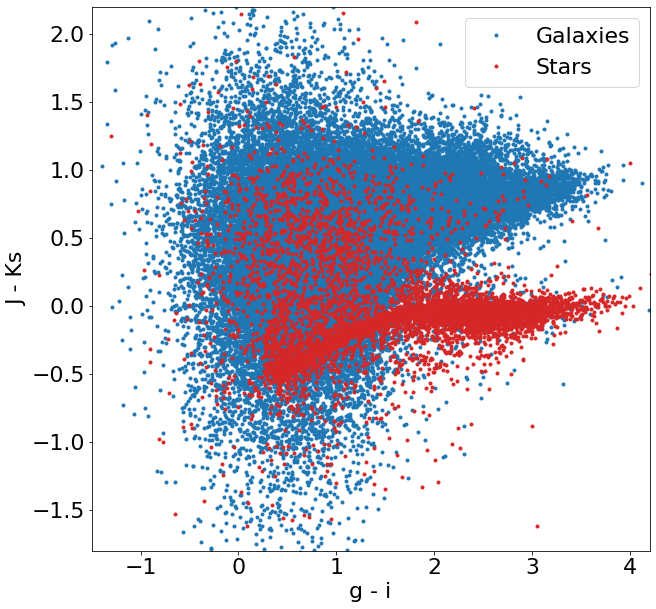

In [330]:
plt.figure(figsize=(10,10))
plt.rcParams["font.size"] = 22

plt.plot(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==0],
         df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==0],'.',label='Galaxies',color='tab:blue')


plt.plot(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']!=0],
         df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']!=0],'.',label='Stars',color='tab:red')

#plt.plot(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==9]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==9],
#         df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==9]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==9],'.',label='Satured Stars',color='tab:orange')

#plt.plot(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']>=3]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']>=3],
#         df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']>=3]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']>=3],'.',label='Satured Stars',color='tab:orange')

#plt.axhline(0.2)

plt.legend()
plt.xlabel('g - i')
plt.ylabel('J - Ks')
plt.xlim(-1.5,4.2)
plt.ylim(-1.8,2.2)

#plt.savefig('ColCol_stargal.jpg')



In [ ]:
colcolstars_matrix = np.vstack([df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']!=0],
                                df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']!=0]])
colcolstars_density = gaussian_kde(colcolstars_matrix)(colcolstars_matrix)

colcolgal_matrix = np.vstack([df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==0],
                                df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==0]])
colcolgal_density = gaussian_kde(colcolgal_matrix)(colcolgal_matrix)



In [1182]:
colcolstars_density.shape

(7791,)

(-1.8, 2.2)

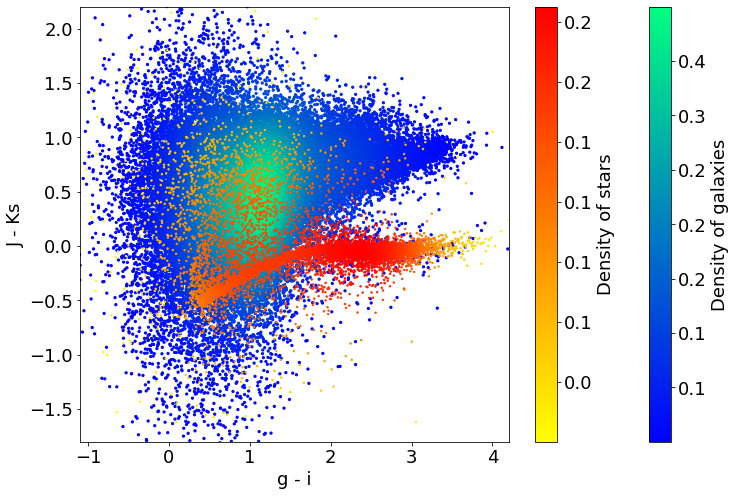

In [387]:
import matplotlib.ticker as tick
    

plt.figure(figsize=(12,8))
plt.rcParams["font.size"] = 18


plt.scatter(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==0],
            df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==0],
            c=colcolgal_density,cmap='winter',s=5,label='Galaxies')
plt.colorbar(label='Density of galaxies').ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.1f'))

plt.scatter(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']!=0],
            df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']!=0],
            c=colcolstars_density,cmap='autumn_r',s=2,label='Stars')
plt.colorbar(label='Density of stars').ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.1f'))

    
#plt.plot(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==0],
#         df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==0],'.',label='Galaxies',color='tab:blue')


#plt.plot(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']!=0],
#         df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']!=0],'.',label='Stars',color='tab:red')


#plt.axhline(0.2)

#plt.legend()
plt.xlabel('g - i')
plt.ylabel('J - Ks')
plt.xlim(-1.1,4.2)
plt.ylim(-1.8,2.2)
#plt.xlim(0,3.5)
#plt.ylim(-1,2)


#plt.savefig('ColCol_stargal_v2.jpg')




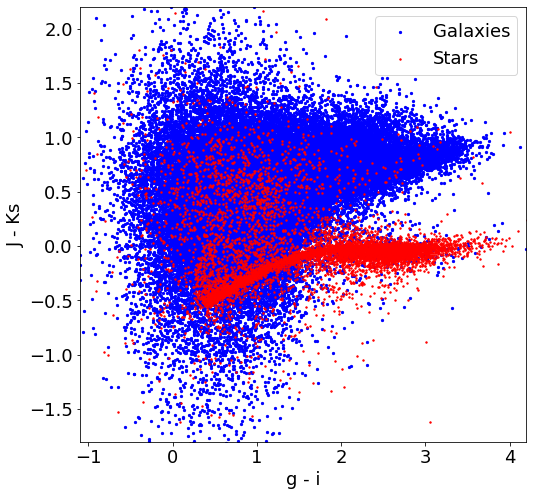

In [1486]:
import matplotlib.ticker as tick
    

plt.figure(figsize=(8,8))
plt.rcParams["font.size"] = 18
plt.tight_layout

plt.scatter(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==0],
            df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==0],
            c='b',cmap='winter',s=5,label='Galaxies')
#plt.colorbar(label='Density of galaxies').ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.1f'))

plt.scatter(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']!=0],
            df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']!=0],
            c='r',cmap='autumn_r',s=2,label='Stars')
#plt.colorbar(label='Density of stars').ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.1f'))

    
#plt.plot(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==0],
#         df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==0],'.',label='Galaxies',color='tab:blue')


#plt.plot(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']!=0],
#         df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']!=0],'.',label='Stars',color='tab:red')


#plt.axhline(0.2)

plt.legend()
plt.xlabel('g - i')
plt.ylabel('J - Ks')
plt.xlim(-1.1,4.2)
plt.ylim(-1.8,2.2)
#plt.xlim(0,3.5)
#plt.ylim(-1,2)


#plt.savefig('ColCol_stargal_v3.jpg')





(-1.0, 2.0)

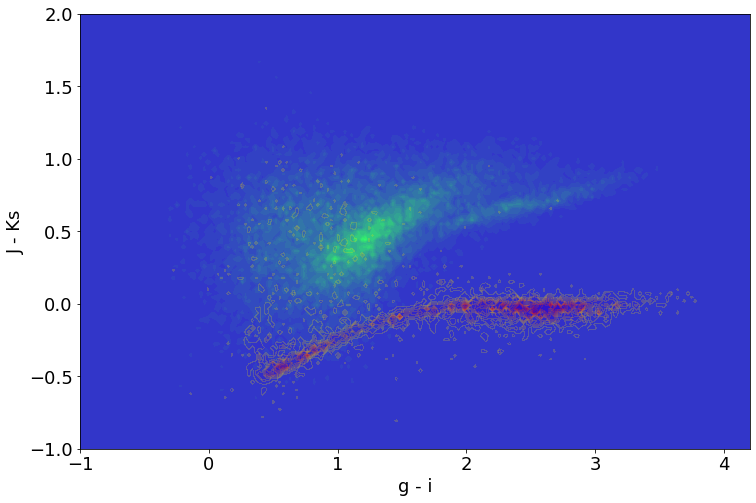

In [429]:
import matplotlib.ticker as tick
    

plt.figure(figsize=(12,8))
plt.rcParams["font.size"] = 18


hist_colcol_star, dec_edges_star, ra_edges_star = np.histogram2d(df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']!=0],
                                                                 df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']!=0],
                                                                 bins=np.linspace(-1.1,4.2,200))
hist_colcol_gal, dec_edges_gal, ra_edges_gal = np.histogram2d(df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==0],
                                                                 df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==0],
                                                                 bins=np.linspace(-1.1,4.2,200))


#sns.heatmap(hist_colcol_star.T,cmap='autumn_r')



plt.contourf(ra_edges_gal[1:], dec_edges_gal[1:],hist_colcol_gal,levels=22,cmap='winter')
plt.contourf(ra_edges_star[1:], dec_edges_star[1:],hist_colcol_star,levels=22,cmap='autumn_r',alpha=0.2)

"""plt.scatter(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']==0],
            df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']==0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']==0],
            c=colcolgal_density,cmap='winter',s=5,label='Galaxies')
plt.colorbar(label='Density of galaxies').ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.1f'))

plt.scatter(df_paper['MAG_AP3_g'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_i'][df_paper['NSFLAG_r']!=0],
            df_paper['MAG_AP3_j'][df_paper['NSFLAG_r']!=0]-df_paper['MAG_AP3_k'][df_paper['NSFLAG_r']!=0],
            c=colcolstars_density,cmap='autumn_r',s=2,label='Stars')
plt.colorbar(label='Density of stars').ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.1f'))
"""

#plt.legend()
plt.xlabel('g - i')
plt.ylabel('J - Ks')
plt.xlim(-1,4.2)
plt.ylim(-1,2.)
#plt.xlim(0,3.5)
#plt.ylim(-1,2)


#plt.savefig('ColCol_stargal_v2.jpg')





In [433]:
df_paper['z_clash'][df_paper['NSFLAG_r']==7]

20171    0.0
20466    0.0
21328    0.0
21583    0.0
21585    0.0
        ... 
62716    0.0
62805    0.0
62807    0.0
62814    0.0
62869    0.0
Name: z_clash, Length: 104, dtype: float64

In [269]:
g_minus_i = df_paper['MAG_AP3_g']-df_paper['MAG_AP3_i']
j_minus_k = df_paper['MAG_AP3_j']-df_paper['MAG_AP3_k']

In [307]:
(j_minus_k[df_paper['NSFLAG_r']!=0]>0.2).sum()

1153

In [434]:
(j_minus_k[df_paper['z_clash']==0]>0.2).sum()

18

In [435]:
(df_paper['z_clash']==0).sum()

104

In [305]:
(df_paper['NSFLAG_r']!=0).sum()

7791

In [289]:
7510+804

8314

In [306]:
print((j_minus_k[df_paper['NSFLAG_r']!=0]<0.2).sum()/(df_paper['NSFLAG_r']!=0).sum())
print((j_minus_k[df_paper['NSFLAG_r']==2]<0.2).sum()/(df_paper['NSFLAG_r']!=0).sum())
print((j_minus_k[df_paper['NSFLAG_r']==3]<0.2).sum()/(df_paper['NSFLAG_r']!=0).sum())

0.8520087280195097
0.6726992683865999
0.06918238993710692


# S/N CUT

In [44]:
SN_u = SN(df['MAG_OBS_U'],df['ERR_MAG_OBS_U'],0)
SN_g = SN(df['MAG_OBS_G'],df['ERR_MAG_OBS_G'],0)
SN_r = SN(df['MAG_OBS_R'],df['ERR_MAG_OBS_R'],0)
SN_i = SN(df['MAG_OBS_I'],df['ERR_MAG_OBS_I'],0)

SN_y = SN(df['MAG_OBS_Y'],df['ERR_MAG_OBS_Y'],5)
SN_j = SN(df['MAG_OBS_J'],df['ERR_MAG_OBS_J'],5)
SN_k = SN(df['MAG_OBS_K'],df['ERR_MAG_OBS_K'],5)

SN_opt = SN_u&SN_g&SN_r&SN_i
SN_nir = SN_y&SN_j&SN_k
SN_all = SN_u&SN_g&SN_r&SN_i&SN_y&SN_j&SN_k

# Cluster selection

In [52]:
bool_spec            = cluster(df,(0,10))
bool_spec_cluster    = cluster(df,macs0416)
bool_spec_noncluster = bool_spec&~bool_spec_cluster

# VERSION WITH S/N
df_spec              = df[SN_nir&bool_spec]
df_spec_cluster      = df[SN_nir&bool_spec_cluster] # == cluster_2E_b + game_0416_2E_b_cluster
df_spec_cluster_pure = df[bool_spec_cluster]        # == cluster_2E_b + game_0416_2E_b_cluster
df_spec_noncluster   = df[SN_nir&bool_spec_noncluster]

df_nir = df[SN_nir]

##########################
print(len(df_spec),len(df_spec_cluster),len(df_spec_noncluster)) 
# any S/N 4061 941 3120

# S/N nir 3311 807 2504   # I'm choosing this S/N cut
### S/N y 3911 915 2996
### S/N j 3830 901 2929
### S/N k 3313 807 2506

# S/N opt 2533 426 2107
### S/N u 2533 426 2107
### S/N g 4051 933 3118
### S/N r 4057 941 3116
### S/N i 4025 932 3093

# S/N all 2314 393 1921
##########################


3295 801 2494


In [50]:
print(len(df))
print(len(df_nir))
print()
print('oggetti persi dal S/N cut:',len(df)-len(df_nir))

print()
label_mags=['u','g','r','i','y','j','k']
for i in label_mags:
    print(len(df_nir[df_nir['MAG_AUTO_'+i]>35]))
    print(len(df_nir[df_nir['MAG_AP1_'+i]>35]))
    
    print()

66211
49779

oggetti persi dal S/N cut: 16432

678
645

1
2

0
0

0
1

3
0

0
0

2
0



# 1. Photmetric redshifts

# 1.a  Photo-z statistics

Nessun taglio S/N
|mean(Delta z)| = 0.0364
std(Delta z)    = 0.0296

sigma_NMAD      = 0.0425
eta             = 3.75 %


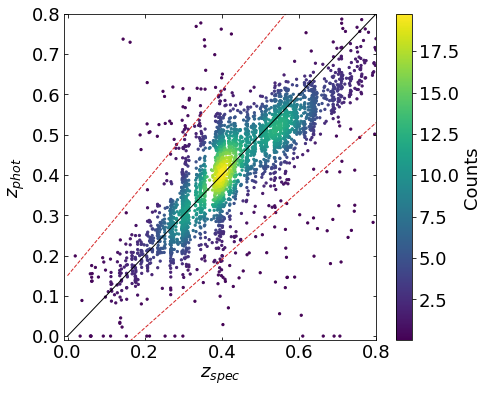

Central objects: 3696  (96.2%)
Outliers: 144  (3.8%)


In [101]:
print('Nessun taglio S/N')
zspec_zphot(df['ZSPEC'],df['Z_BEST'],(0,0.8))

S/N_nir > 5
|mean(Delta z)| = 0.0357
std(Delta z)    = 0.0290

sigma_NMAD      = 0.0415
eta             = 3.16 %


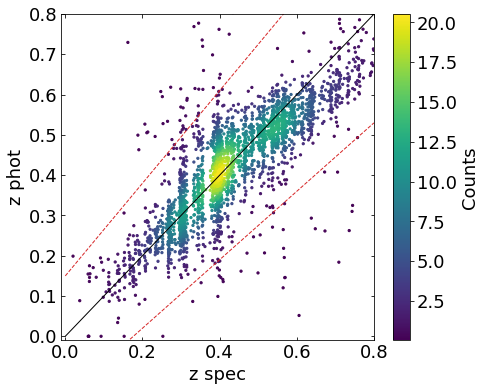

Central objects: 3191  (96.8%)
Outliers: 104  (3.2%)
66211 49779


In [12]:
print('S/N_nir > 5')
zspec_zphot(df['ZSPEC'][SN_nir],df['Z_BEST'][SN_nir],(0,.8))
print(len(df['ZSPEC']),len(df['ZSPEC'][SN_nir]))

# 1.b Photo-z histogram with cluster members

In [13]:
display(np.percentile(df_spec_cluster['Z_BEST'],[2.5,16,50,84,97.5],axis=0))

array([0.2485, 0.3519, 0.4009, 0.4695, 0.5436])

### Histogram - paper version

(2494,)
0.02 3.056
(2494,)
0.02 3.056


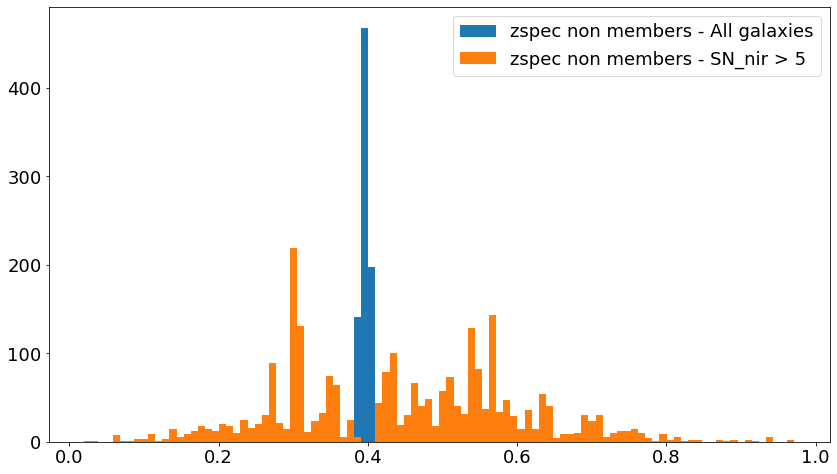

In [14]:
print(df_spec_noncluster['ZSPEC'].shape)
print(df_spec_noncluster['ZSPEC'].min(),df_spec_noncluster['Z_BEST'].max())
plt.figure(figsize=(14,8))
plt.hist(df_spec['ZSPEC'],bins=100,label='zspec non members - All galaxies')
print(df_spec_noncluster['ZSPEC'].shape)
print(df_spec_noncluster['ZSPEC'].min(),df_spec_noncluster['Z_BEST'].max())
plt.hist(df_spec_noncluster['ZSPEC'],bins=100,label='zspec non members - SN_nir > 5')
plt.legend()

The offset of the gaussian_spec_c baseline is 0.08971774789816658
The center of the gaussian_run3 fit is 0.401
The sigma of the gaussian_run3 fit is 0.052
The one sigma intervals of the gaussian_spec_c fit are 0.348 and 0.453
The two sigma intervals of the gaussian_spec_c fit are 0.296 and 0.505
The FWHM of the gaussian_run3 fit is 0.123

The offset of the gaussian_spec_cp baseline is 0.10955431953158355
The center of the gaussian_run3 fit is 0.401
The sigma of the gaussian_run3 fit is 0.053
The one sigma intervals of the gaussian_spec_cp fit are 0.347 and 0.454
The two sigma intervals of the gaussian_spec_cp fit are 0.294 and 0.507
The FWHM of the gaussian_run3 fit is 0.125


2494
801
3295


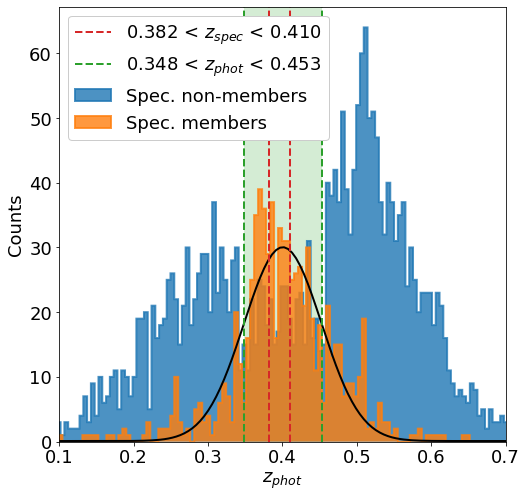

In [232]:
xlim = (0.1,.7)

plt.figure(figsize=(8,8))
plt.rcParams["font.size"] = 18

### Histogram
#hist_spec,  bins_spec,   patch_spec          = plt.hist(df_spec['ZSPEC'],bins=200, alpha=0.6, histtype='step', linewidth=2, facecolor='lime',    edgecolor='k',fill=True,label='Zspec distribution')
hist_spec_nc,bins_spec_nc,patch_spec_nc      = plt.hist(df_spec_noncluster['Z_BEST'],bins=600, alpha=0.8, histtype='step', linewidth=2, facecolor='tab:blue',fill=True,label='Spec. non-members')
#hist_spec_cp,   bins_spec_cp,   patch_spec_cp = plt.hist(df_spec_cluster_pure['Z_BEST'],bins=800, alpha=1, histtype='step', linewidth=2, facecolor='tab:blue',    edgecolor='k',fill=True,label='Spec. members - all galaxies')
hist_spec_c,   bins_spec_c,   patch_spec_c    = plt.hist(df_spec_cluster['Z_BEST'],bins=800, alpha=0.8, histtype='step', linewidth=2, facecolor='tab:orange',fill=True,label='Spec. members')

### Gaussian fit
# S/N cut
xdata_spec_c = (bins_spec_c[:-1] + bins_spec_c[1:]) / 2
ydata_spec_c = hist_spec_c
H_spec_c, A_spec_c, x0_spec_c, sigma_spec_c = gauss_fit(xdata_spec_c, ydata_spec_c)
FWHM_spec_c                           = 2.35482 * sigma_spec_c
print('The offset of the gaussian_spec_c baseline is', H_spec_c)
print('The center of the gaussian_run3 fit is %.3f'%x0_spec_c)
print('The sigma of the gaussian_run3 fit is %.3f'%sigma_spec_c)
print('The one sigma intervals of the gaussian_spec_c fit are %.3f and %.3f'%(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c))
print('The two sigma intervals of the gaussian_spec_c fit are %.3f and %.3f'%(x0_spec_c-2*sigma_spec_c,x0_spec_c+2*sigma_spec_c))
print('The FWHM of the gaussian_run3 fit is %.3f'%FWHM_spec_c)
print()
# Pure data
xdata_spec_cp = (bins_spec_cp[:-1] + bins_spec_cp[1:]) / 2
ydata_spec_cp = hist_spec_cp
H_spec_cp, A_spec_cp, x0_spec_cp, sigma_spec_cp = gauss_fit(xdata_spec_cp, ydata_spec_cp)
FWHM_spec_cp                           = 2.35482 * sigma_spec_cp
print('The offset of the gaussian_spec_cp baseline is', H_spec_cp)
print('The center of the gaussian_run3 fit is %.3f'%x0_spec_cp)
print('The sigma of the gaussian_run3 fit is %.3f'%sigma_spec_cp)
print('The one sigma intervals of the gaussian_spec_cp fit are %.3f and %.3f'%(x0_spec_cp-sigma_spec_cp,x0_spec_cp+sigma_spec_cp))
print('The two sigma intervals of the gaussian_spec_cp fit are %.3f and %.3f'%(x0_spec_cp-2*sigma_spec_cp,x0_spec_cp+2*sigma_spec_cp))
print('The FWHM of the gaussian_run3 fit is %.3f'%FWHM_spec_cp)
print()

# Gaussian curve
plt.plot(xdata_spec_c, gauss(xdata_spec_c, *gauss_fit(xdata_spec_c, ydata_spec_c)), '-',c='k',lw=2, label='')
#plt.plot(xdata_spec_cp, gauss(xdata_spec_cp, *gauss_fit(xdata_spec_cp, ydata_spec_cp)), '-',c='b',lw=2, label='')

# Spec intervals
plt.axvline(macs0416[0],lw=2,color='tab:red',ls='--',label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))
plt.axvline(macs0416[1],lw=2,color='tab:red',ls='--',label='')

# Photo intervals
#plt.axvspan(x0_spec_cp-sigma_spec_cp,x0_spec_cp+sigma_spec_cp,color='tab:blue',alpha=.3,lw=0)
#plt.axvline(x0_spec_cp-sigma_spec_cp,ls='--',lw=2,color='tab:blue',label='%.3f < $z_{phot}$ < %.3f'%(x0_spec_cp-sigma_spec_cp,x0_spec_cp+sigma_spec_cp))
#plt.axvline(x0_spec_cp+sigma_spec_cp,ls='--',lw=2,color='tab:blue')

plt.axvspan(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c,color='tab:green',alpha=.2,lw=0)
plt.axvline(x0_spec_c-sigma_spec_c,ls='--',lw=2,color='tab:green',label='%.3f < $z_{phot}$ < %.3f'%(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c))
plt.axvline(x0_spec_c+sigma_spec_c,ls='--',lw=2,color='tab:green')

plt.xlim(xlim)
plt.xlabel(r'$z_{phot}$')
plt.ylabel('Counts')
plt.legend(framealpha=1,loc=2)
#plt.savefig('complete_hist.png')

print()
print(len(df_spec_noncluster['Z_BEST']))
print(len(df_spec_cluster['Z_BEST']))

print(len(df_spec_noncluster['Z_BEST'])+len(df_spec_cluster['Z_BEST']))

In [16]:
0.453-(0.348+0.453)/2

0.05250000000000005

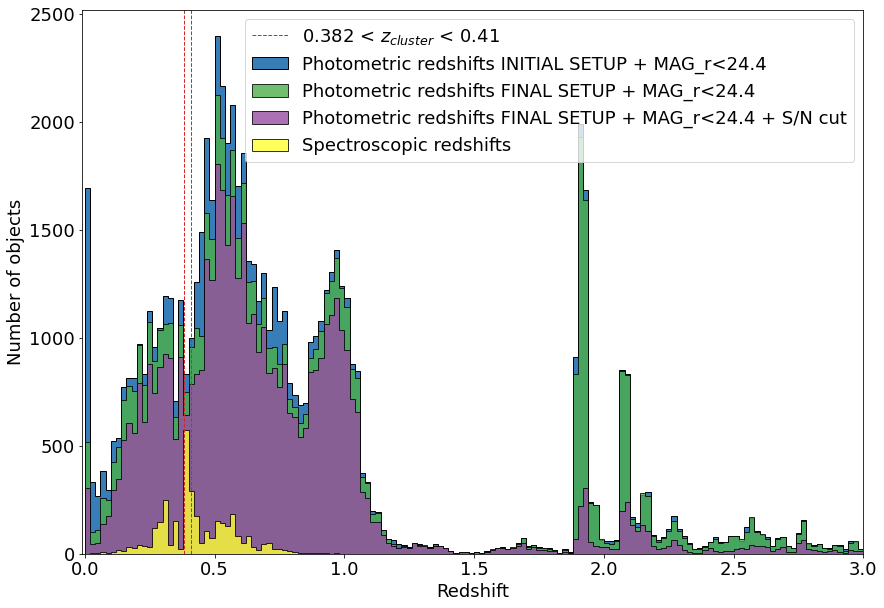

In [16]:
xlim2 = (-0.01,3)

plt.figure(figsize=(14,10))
plt.rcParams["font.size"] = 18
plt.hist(gamelp_out_ap1_2E_v2['Z_BEST'],bins=np.arange(0,6,0.02), alpha=1, histtype='step', lw=1, color='#377eb8',ec='k',fill=True,label='Photometric redshifts INITIAL SETUP + MAG_r<24.4')

plt.hist(df['Z_BEST'],bins=np.arange(0,6,0.02), alpha=0.8, histtype='step', lw=1, color='#4daf4a',ec='k',fill=True,label='Photometric redshifts FINAL SETUP + MAG_r<24.4')
plt.hist(df['Z_BEST'][SN_nir],bins=np.arange(0,6,0.02), alpha=0.8, histtype='step', lw=1, color='#984ea3',ec='k',fill=True,label='Photometric redshifts FINAL SETUP + MAG_r<24.4 + S/N cut')
plt.hist(df['ZSPEC'][SN_nir],bins=np.arange(0,6,0.02), alpha=0.8, histtype='step', lw=1, color='#ffff33',ec='k',fill=True,label='Spectroscopic redshifts')

plt.axvline(macs0416[0],lw=1,color='tab:red',ls='--',label=str(macs0416[0])+' < $z_{cluster}$ < '+str(macs0416[1]))
plt.axvline(macs0416[1],lw=1,color='tab:red',ls='--',label='')
#plt.axvspan(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c,color='tab:green',alpha=.2,lw=0)
"""plt.axvline(0.50,lw=1,color='tab:green',ls='--',label='')
plt.axvline(0.62,lw=1,color='tab:green',ls='--',label='')"""

plt.xlim(xlim2)
plt.xlabel('Redshift')
plt.ylabel('Number of objects')
plt.legend()#framealpha=1,loc=2)
#plt.savefig('hist_allphotoz.png')



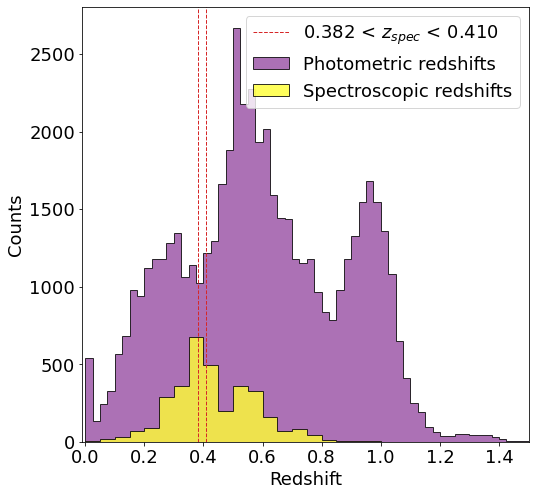

In [235]:
xlim2 = (-0.01,1.5)

plt.figure(figsize=(8,8))
plt.tight_layout
plt.rcParams["font.size"] = 18
plt.hist(df['Z_BEST'],bins=np.arange(0,6,0.025), alpha=0.8, histtype='step', lw=1, color='#984ea3',ec='k',fill=True,label='Photometric redshifts')
plt.hist(df['ZSPEC'][SN_nir],bins=np.arange(0,6,0.05), alpha=0.8, histtype='step', lw=1, color='#ffff33',ec='k',fill=True,label='Spectroscopic redshifts')

plt.axvline(macs0416[0],lw=1,color='tab:red',ls='--',label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))
plt.axvline(macs0416[1],lw=1,color='tab:red',ls='--',label='')
#plt.axvspan(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c,color='tab:green',alpha=.2,lw=0)
"""plt.axvline(0.50,lw=1,color='tab:green',ls='--',label='')
plt.axvline(0.62,lw=1,color='tab:green',ls='--',label='')"""

plt.xlim(xlim2)
plt.xlabel('Redshift')
plt.ylabel('Counts')
plt.legend()#framealpha=1,loc=2)

#plt.savefig('hist_allphotoz.png')




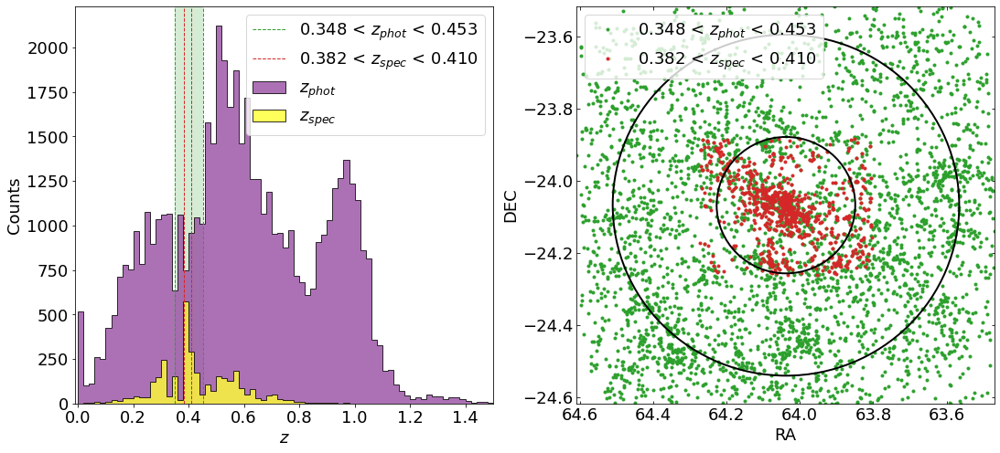

In [263]:
xlim2 = (-0.01,1.5)

plt.figure(figsize=(18,8))


plt.subplot(121)

plt.tight_layout
plt.rcParams["font.size"] = 18
plt.hist(df['Z_BEST'],bins=np.arange(0,6,0.02), alpha=0.8, histtype='step', lw=1, color='#984ea3',ec='k',fill=True,label=r'$z_{phot}$')
plt.hist(df['ZSPEC'][SN_nir],bins=np.arange(0,6,0.02), alpha=0.8, histtype='step', lw=1, color='#ffff33',ec='k',fill=True,label=r'$z_{spec}$')

plt.axvspan(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c,color='tab:green',alpha=.2,lw=0)
plt.axvline(x0_spec_c-sigma_spec_c,ls='--',lw=1,color='tab:green',label='%.3f < $z_{phot}$ < %.3f'%(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c))
plt.axvline(x0_spec_c+sigma_spec_c,ls='--',lw=1,color='tab:green')
plt.axvline(macs0416[0],lw=1,color='tab:red',ls='--',label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))
plt.axvline(macs0416[1],lw=1,color='tab:red',ls='--',label='')


plt.xlim(xlim2)
plt.xlabel(r'$z$')
plt.ylabel('Counts')
plt.legend()



plt.subplot(122)
fig = plt.gcf()
ax  = fig.gca()
plt.plot(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'], '.',alpha=0.99,c='tab:green',label='%.3f < $z_{phot}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))
plt.plot(df_spec_cluster['RA_r'],df_spec_cluster['DEC_r'],'.',alpha=0.99,c='tab:red',label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))
ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='k',lw=2,ls='-',zorder=5))   
ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='k',lw=2,zorder=5))  
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.tick_params(top=True, right=True,direction='in')
plt.gca().invert_xaxis()
plt.xlabel('RA')
plt.ylabel('DEC')
plt.legend()








#plt.savefig('hist_allphotoz_v2.png')





Mean density:  0.10990502035278155


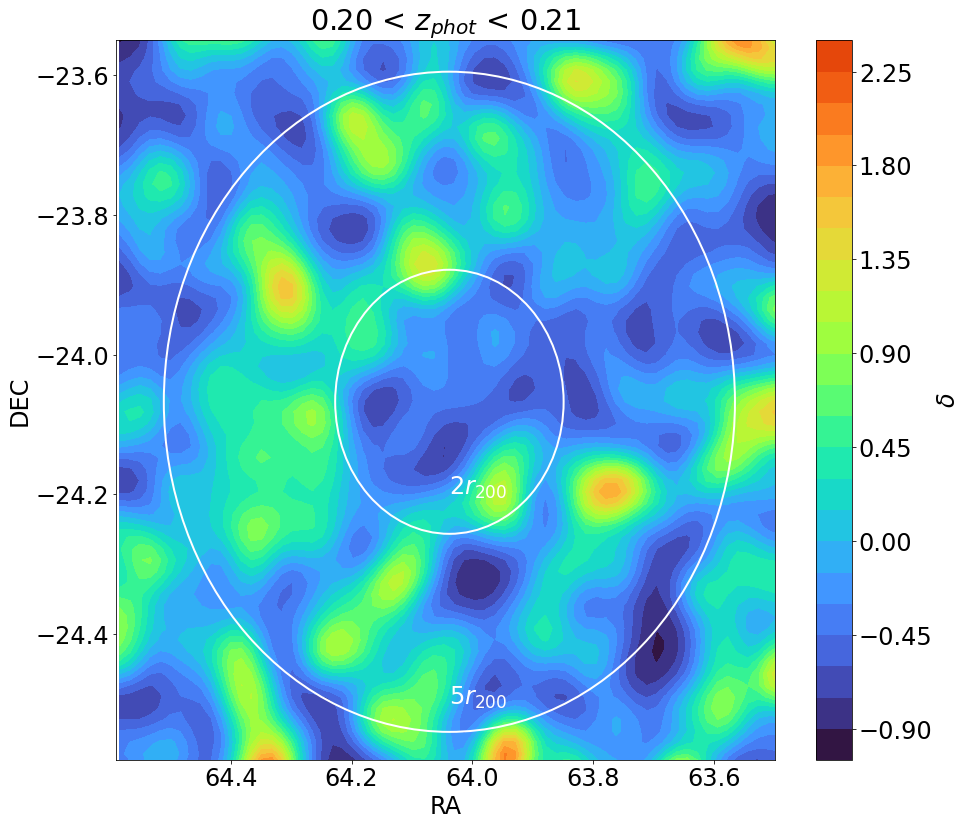

Mean density:  0.1078697421981004


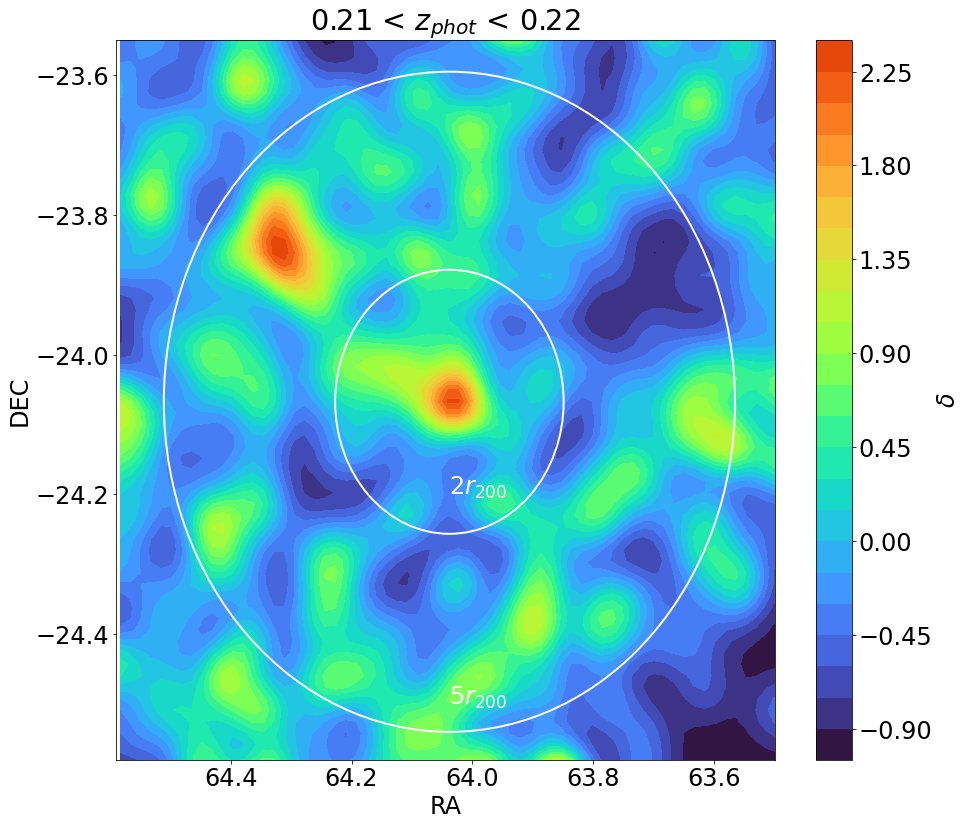

Mean density:  0.07688828584350972


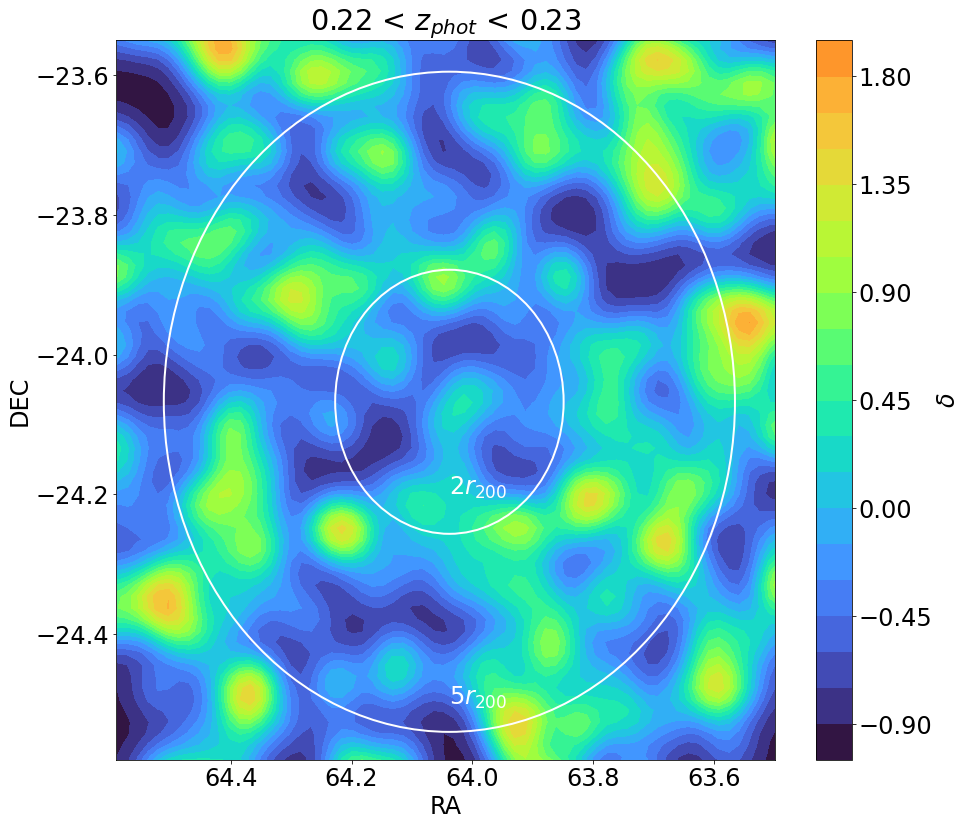

Mean density:  0.1010854816824966


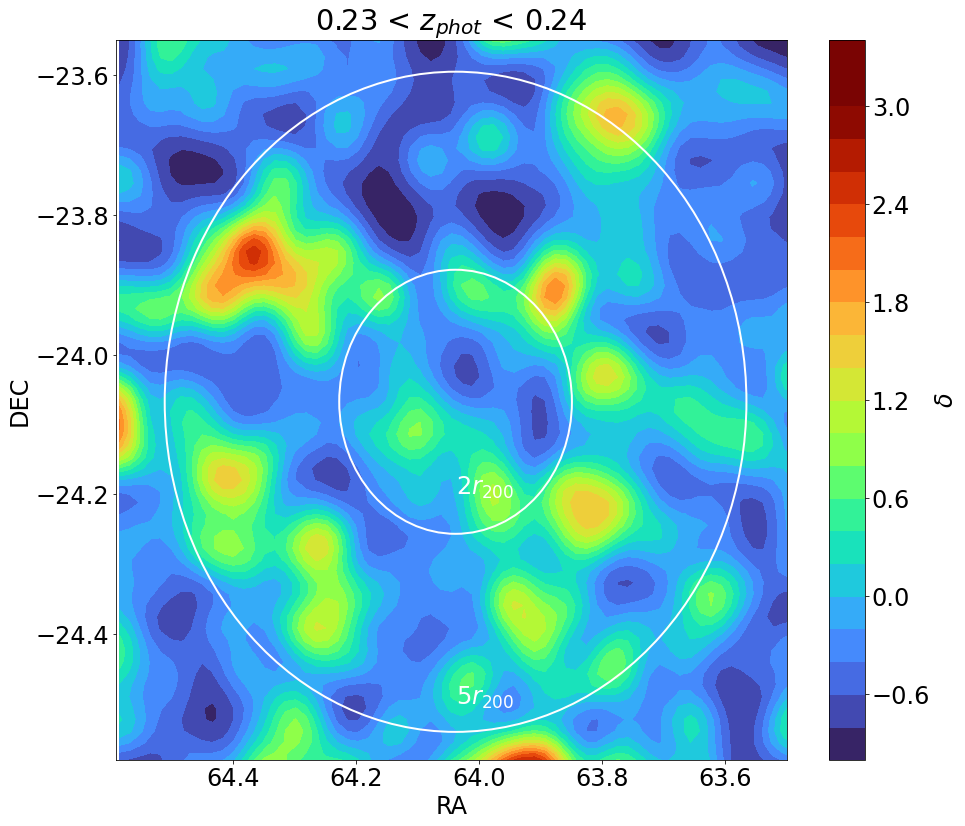

Mean density:  0.12415196743554953


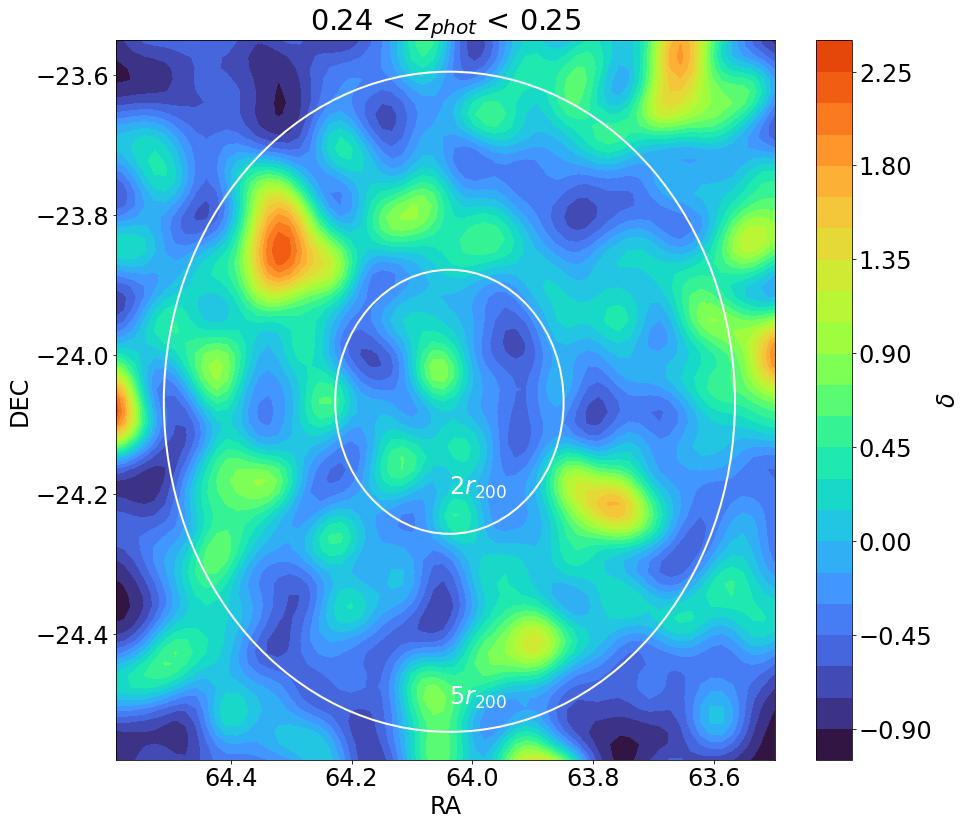

Mean density:  0.11917684305744007


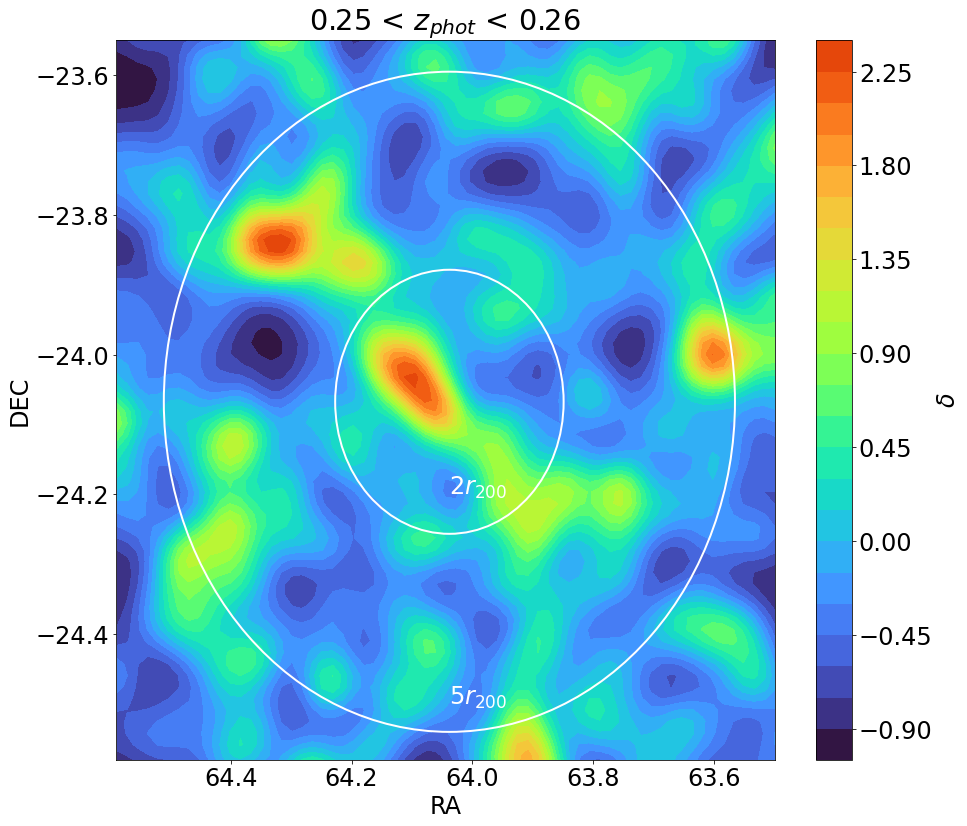

Mean density:  0.09068294889190412


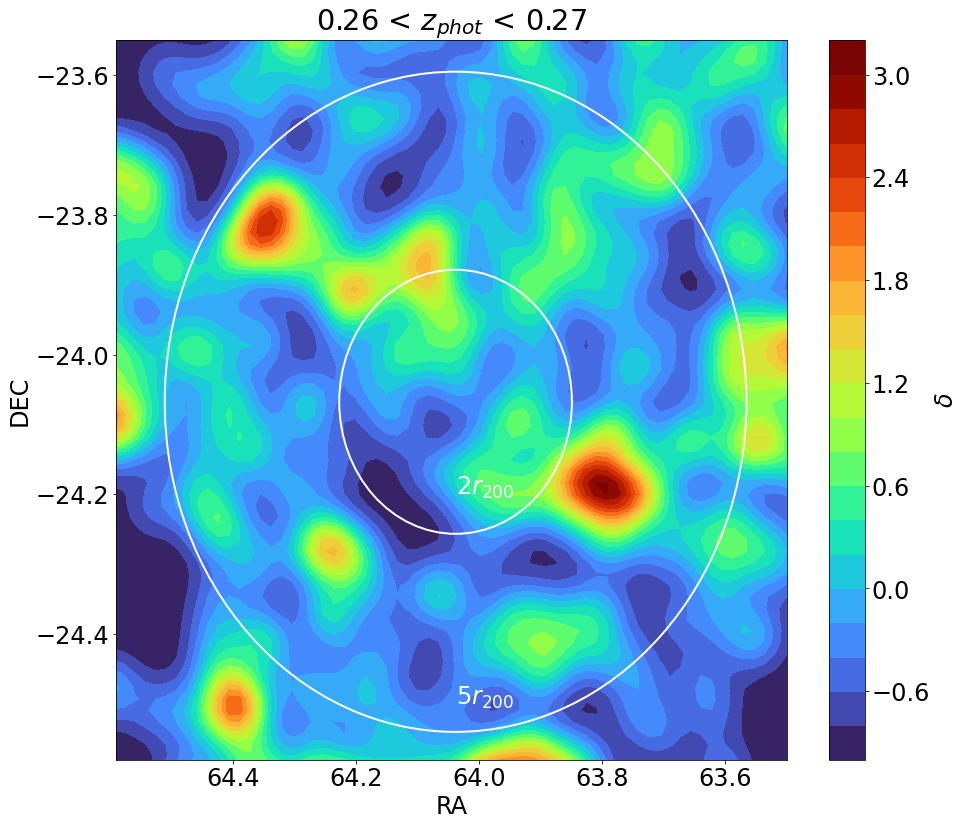

Mean density:  0.11080958842152872


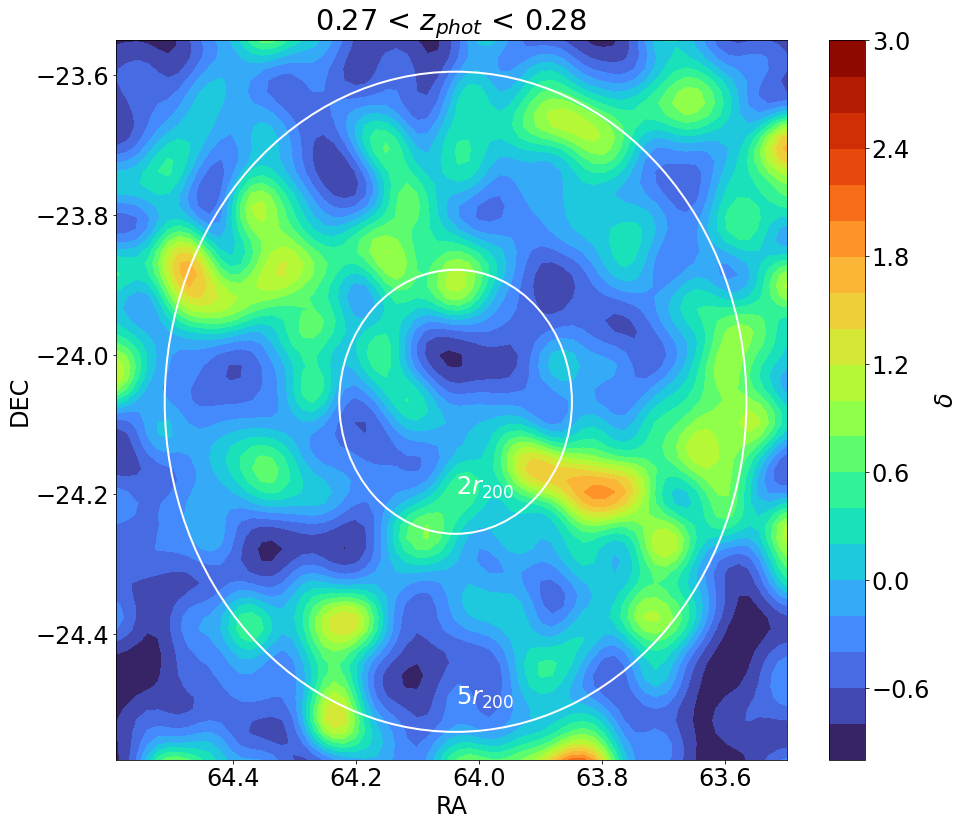

Mean density:  0.11058344640434192


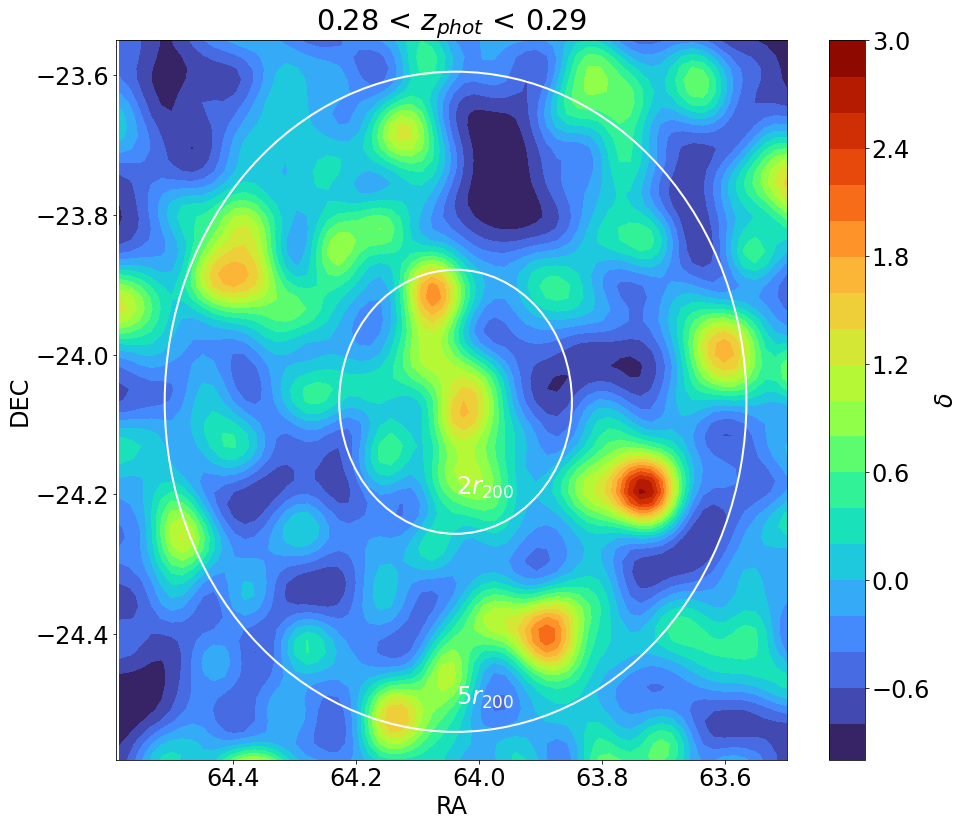

Mean density:  0.12324739936680235


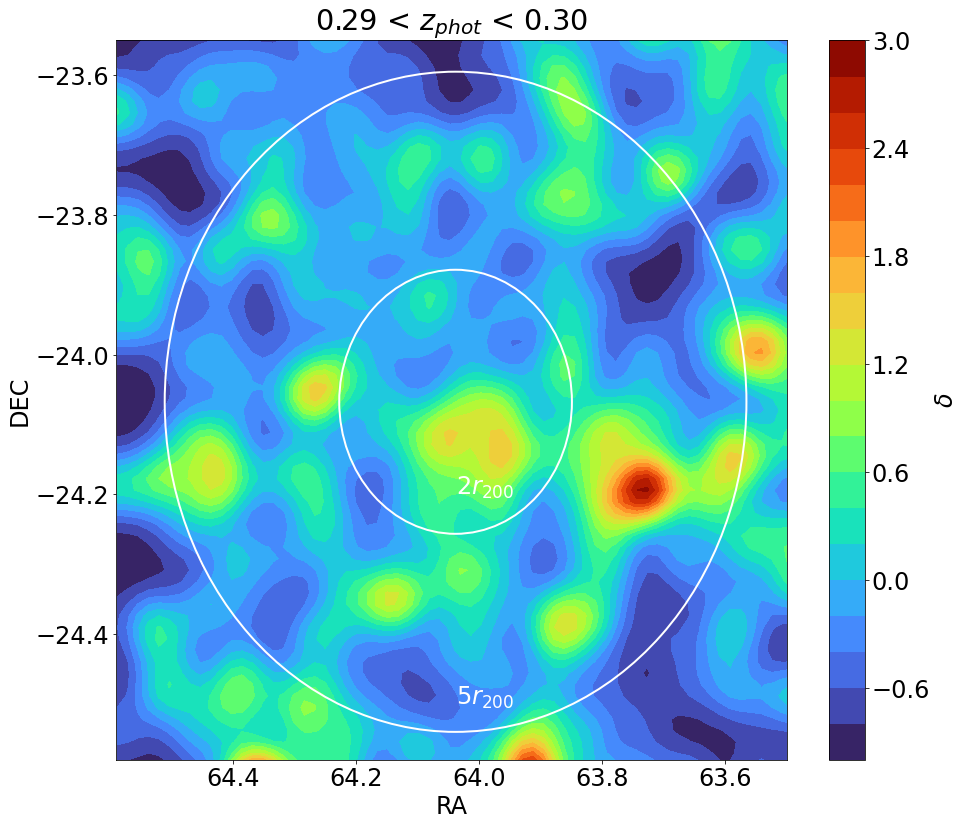

Mean density:  0.11329715061058344


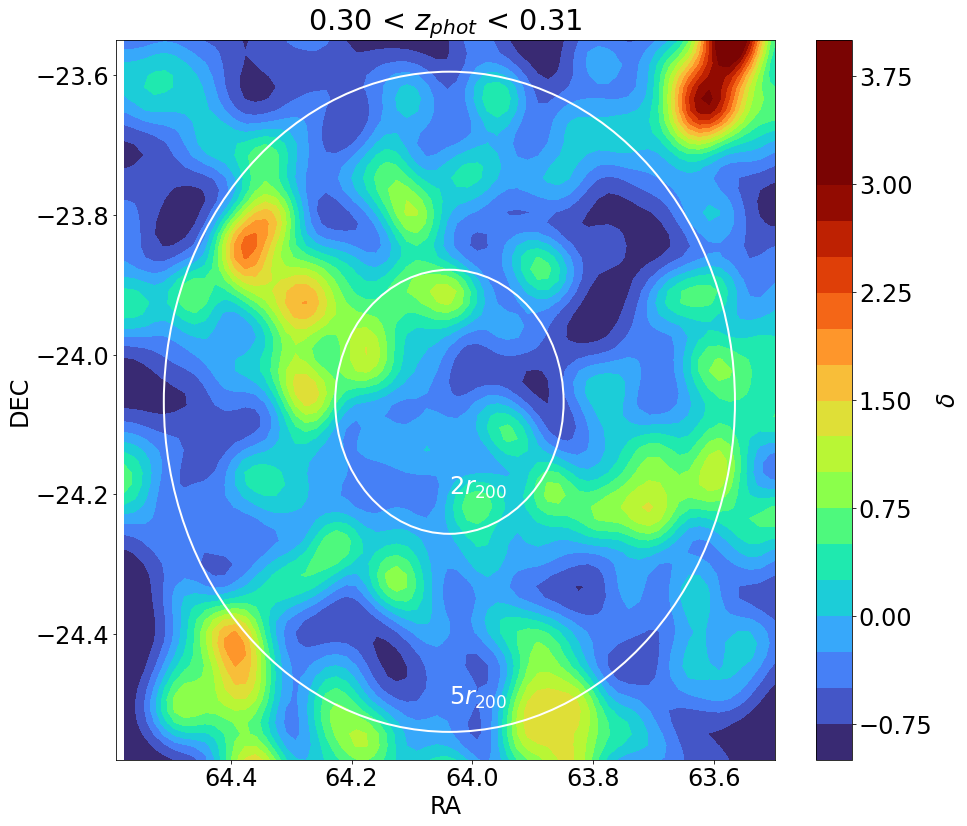

Mean density:  0.127996381727725


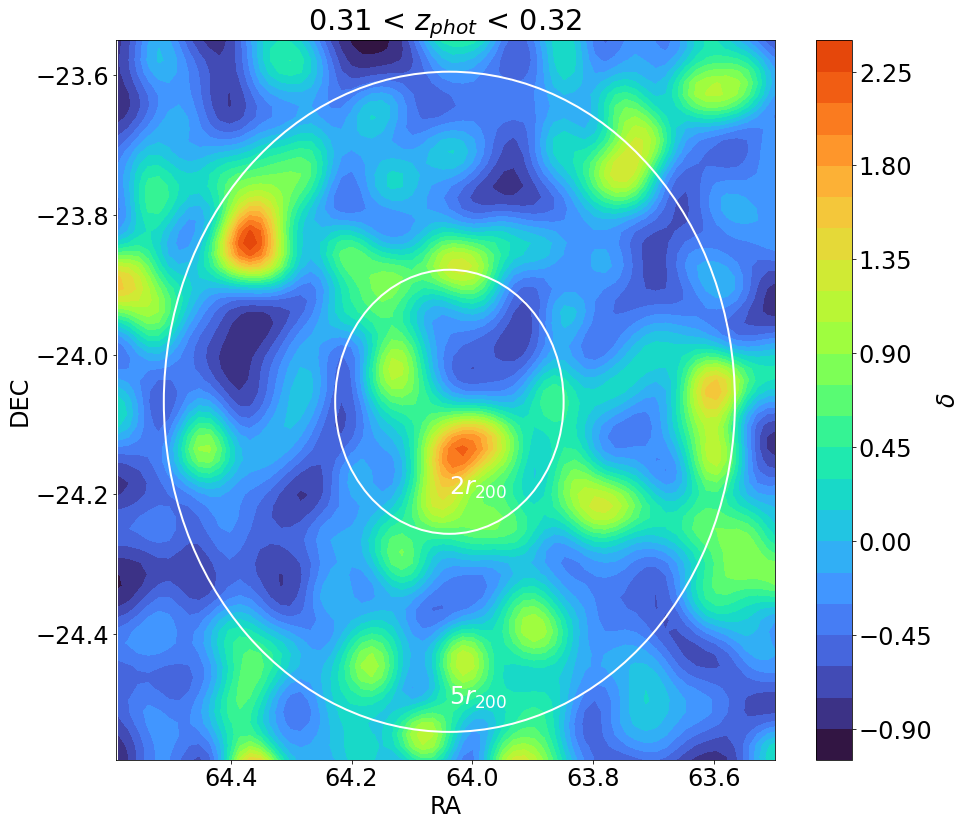

Mean density:  0.12369968340117594


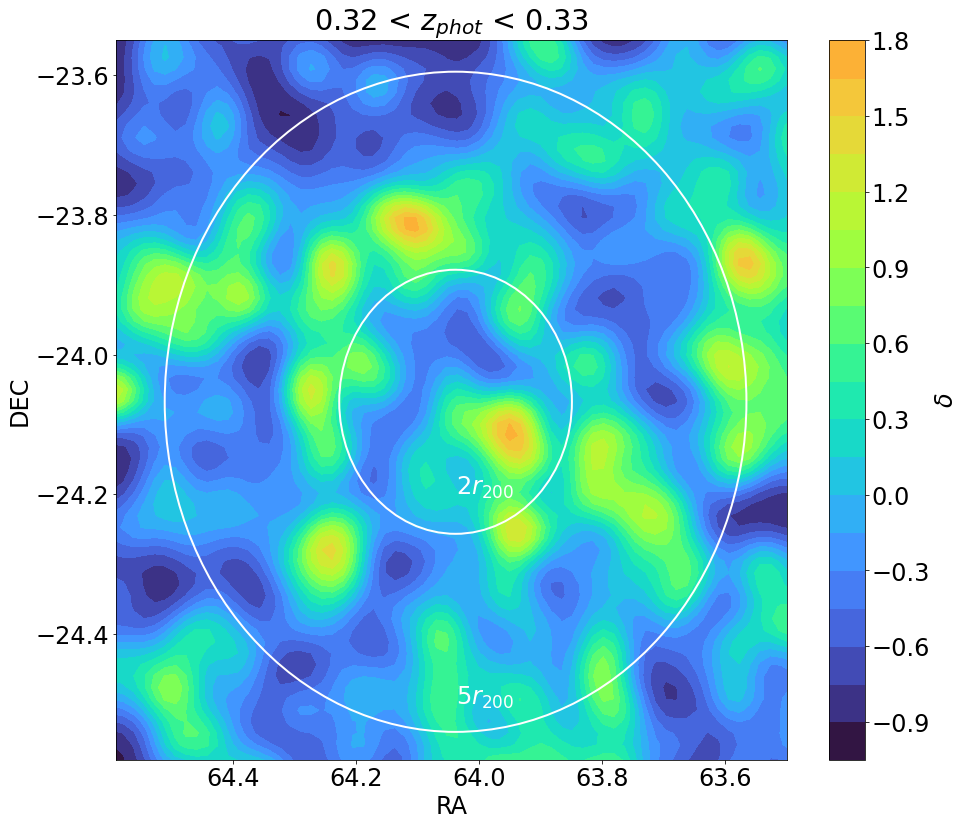

Mean density:  0.11714156490275893


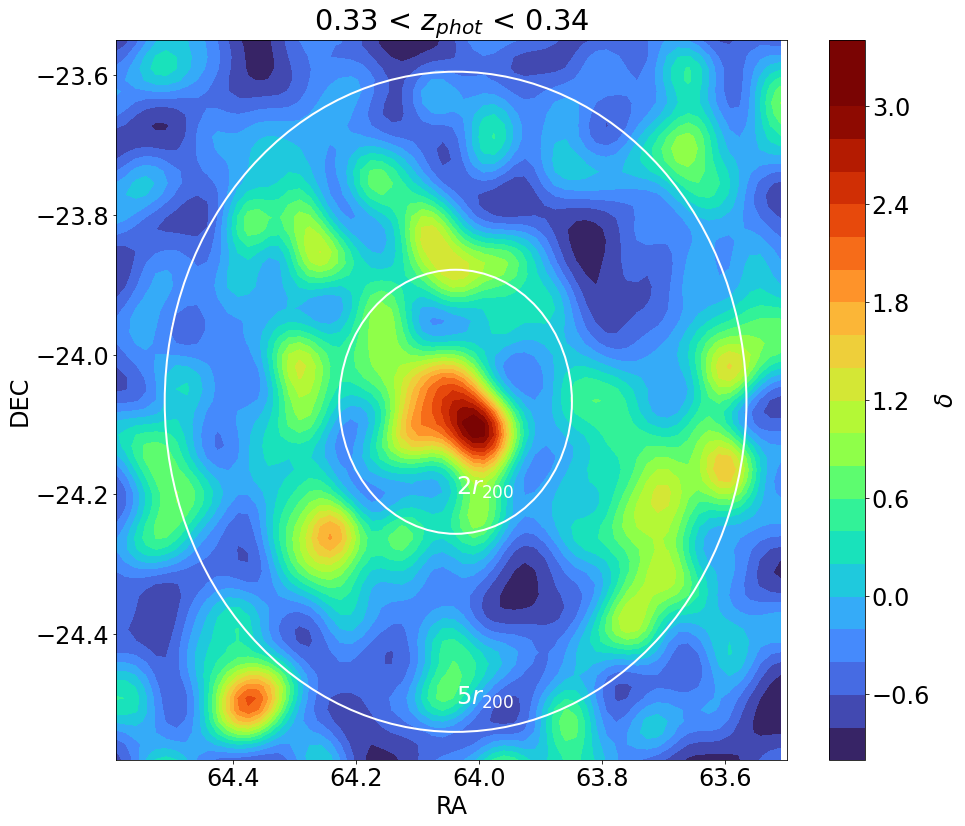

Mean density:  0.06241519674355495


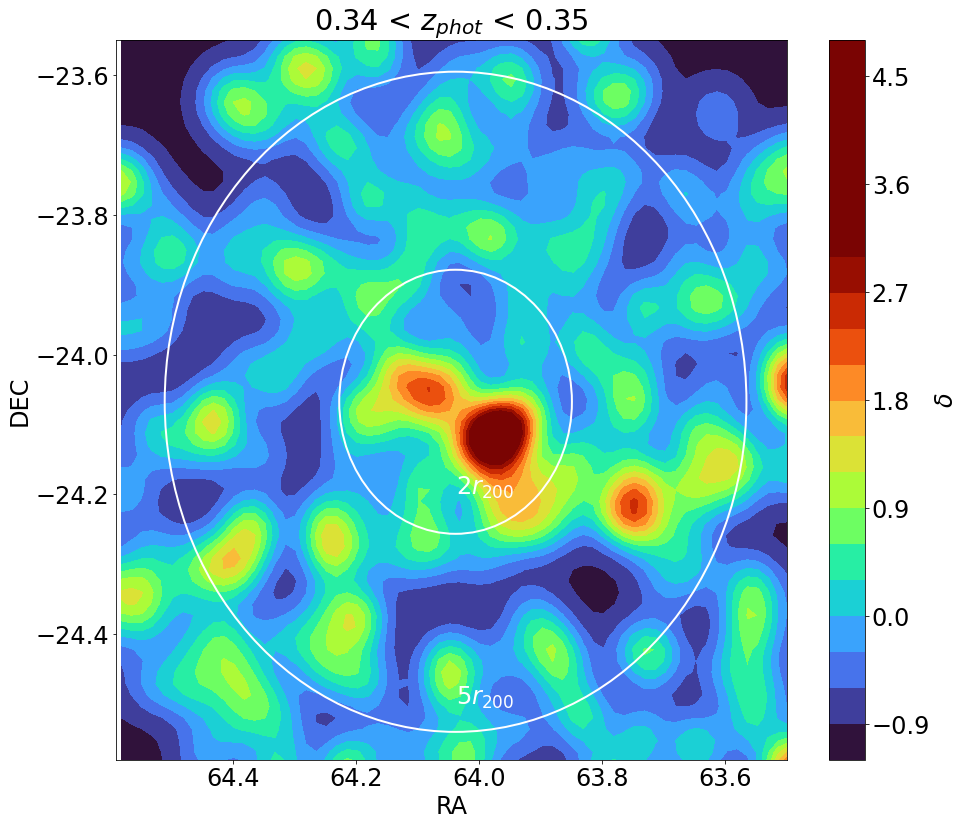

Mean density:  0.08163726820443239


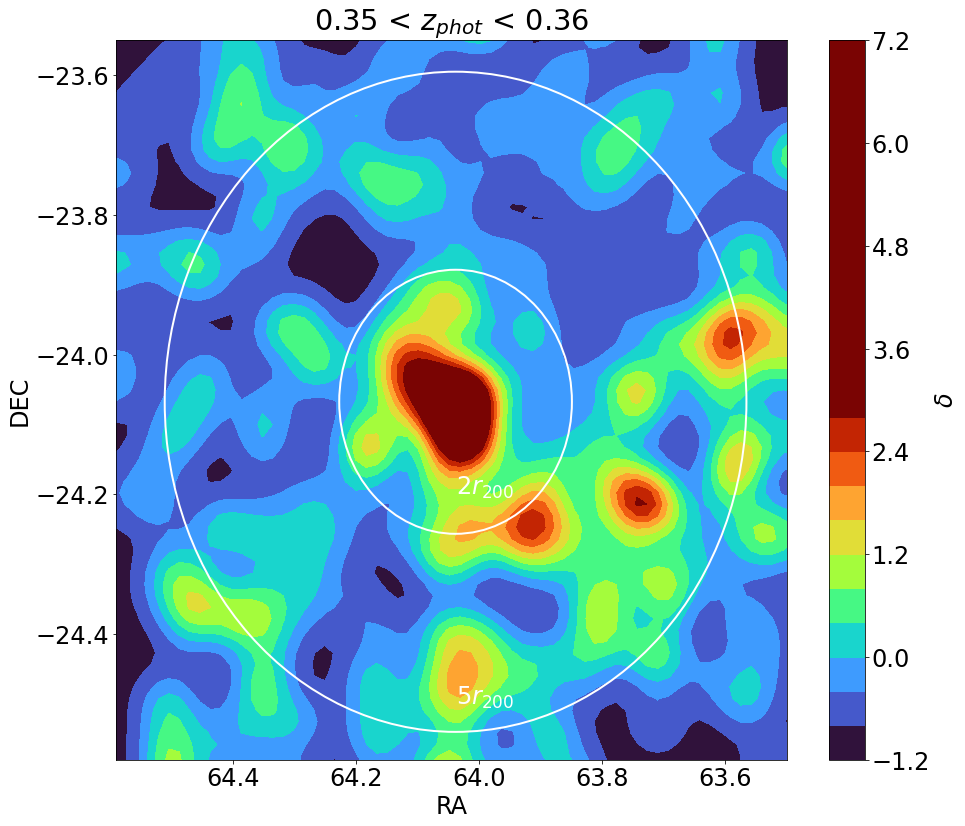

Mean density:  0.11420171867933061


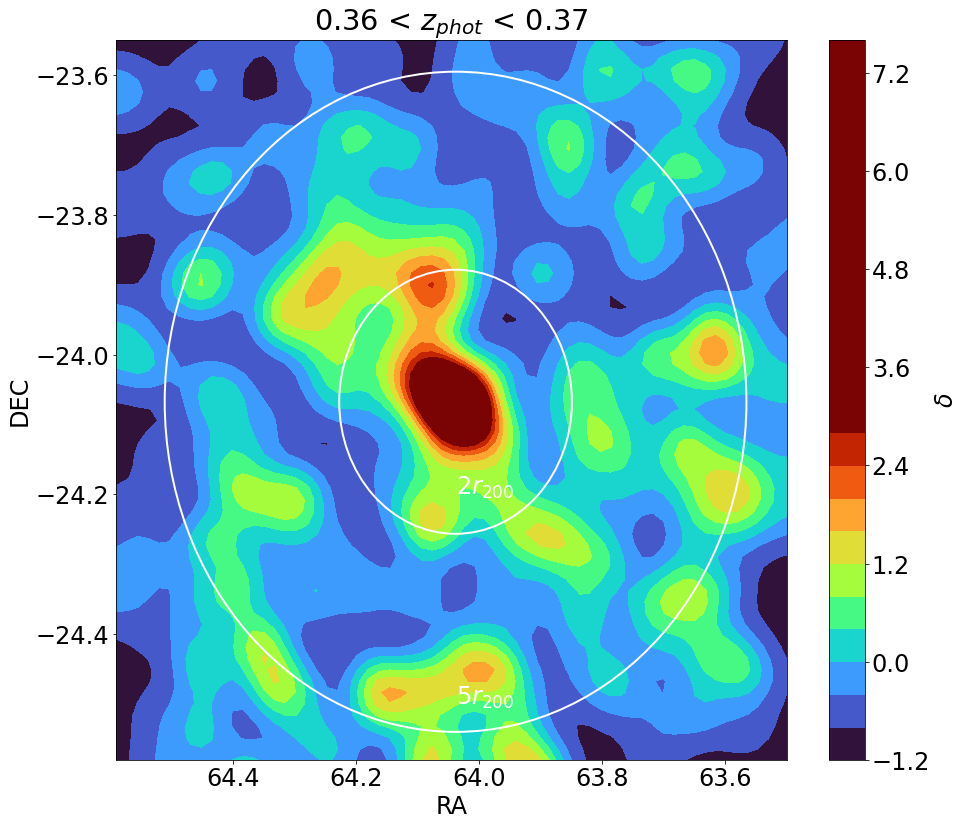

Mean density:  0.1257349615558571


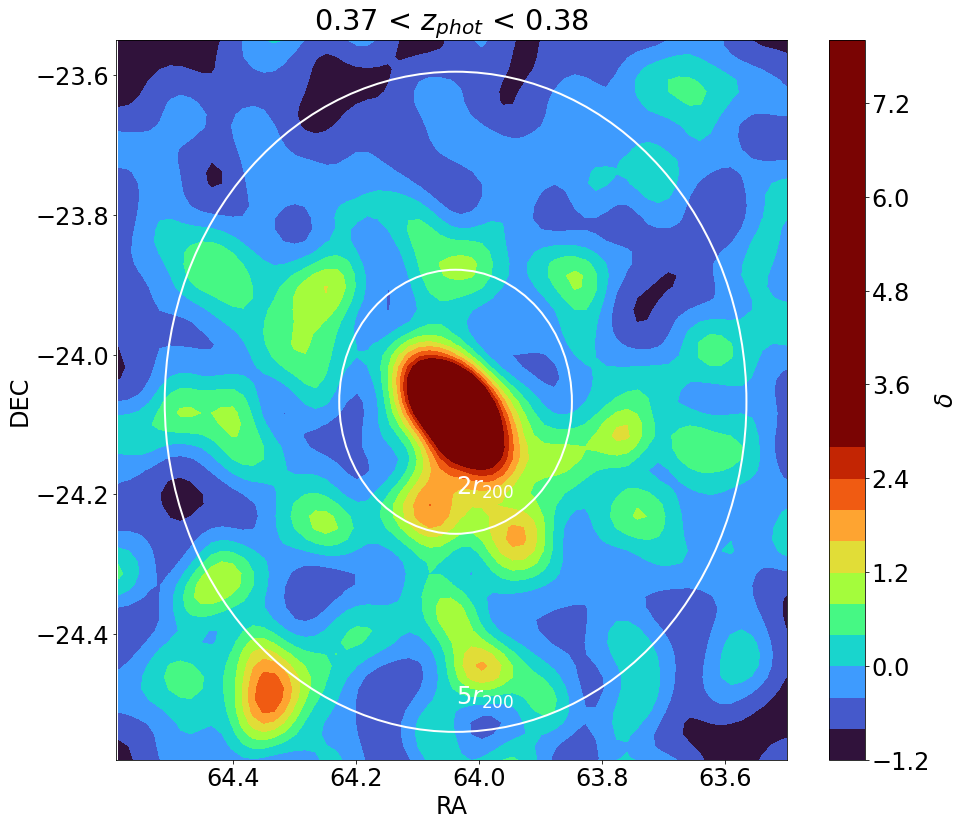

Mean density:  0.07869742198100407


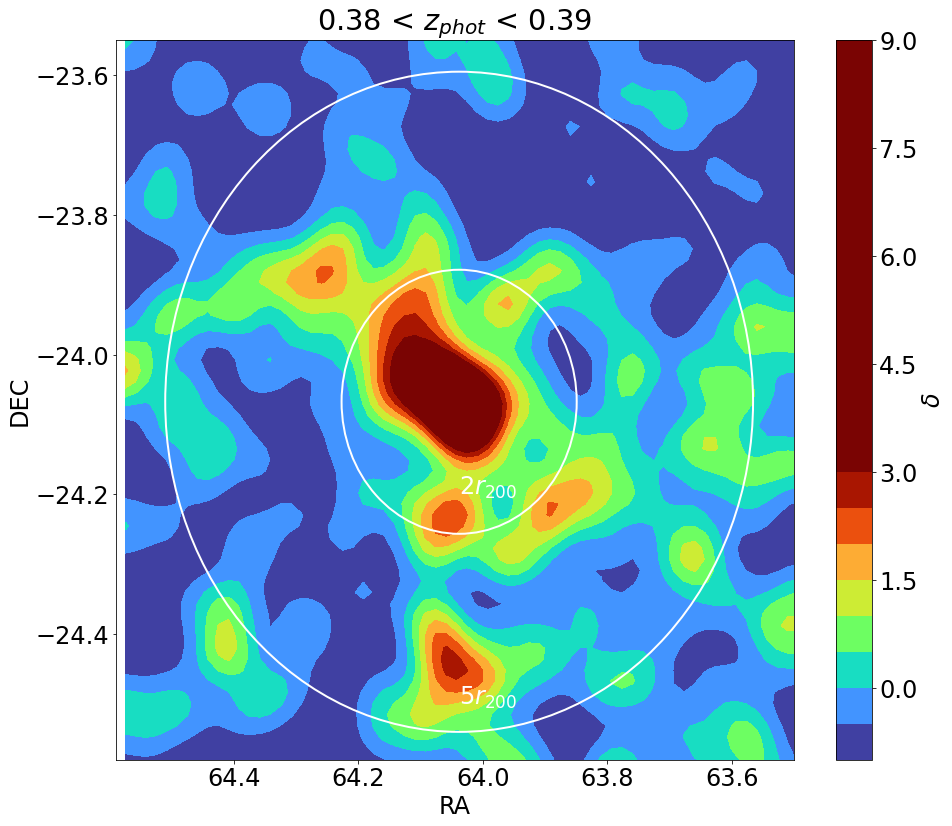

Mean density:  0.09158751696065129


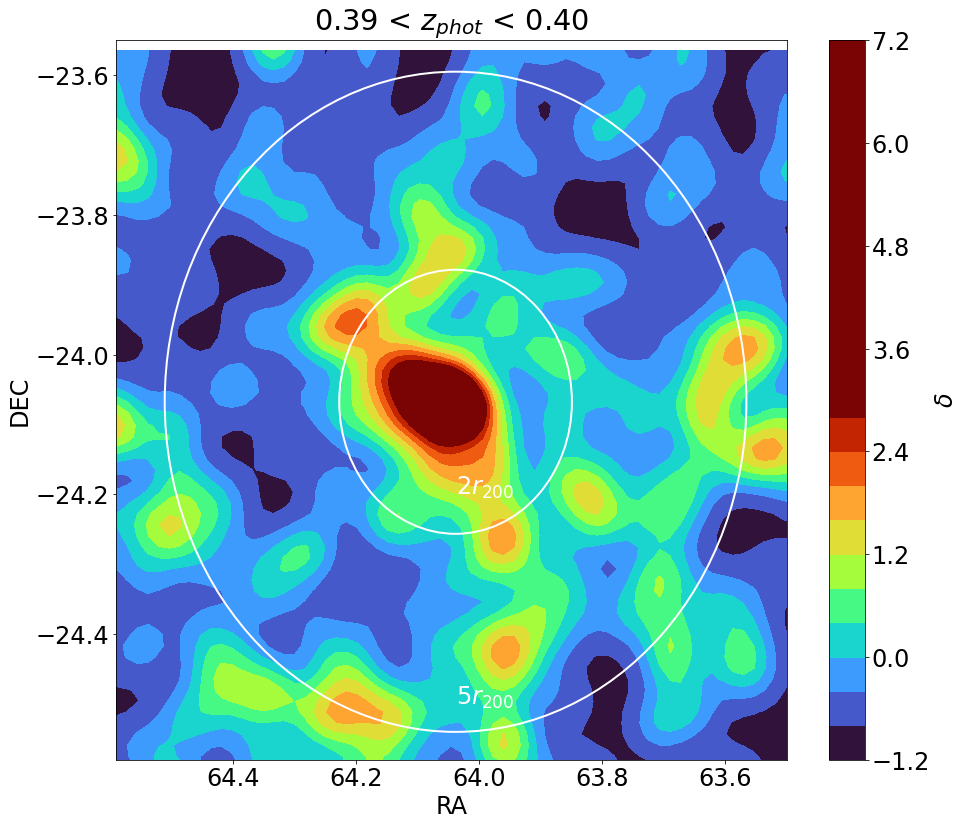

Mean density:  0.11261872455902307


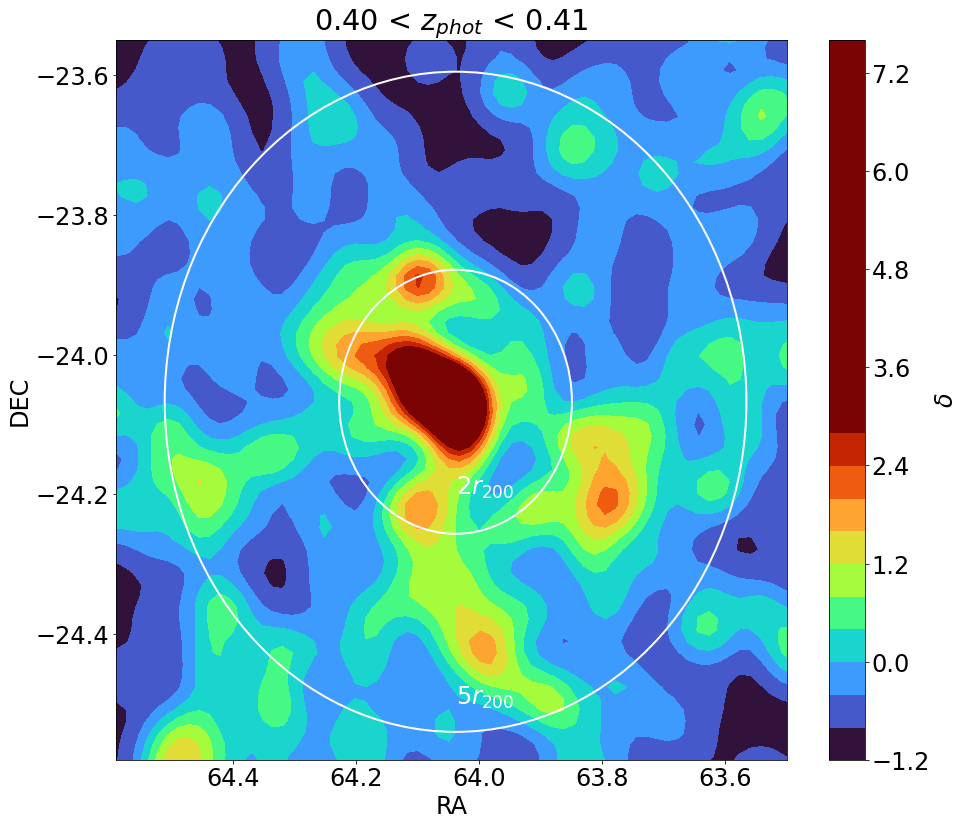

Mean density:  0.10402532790592492


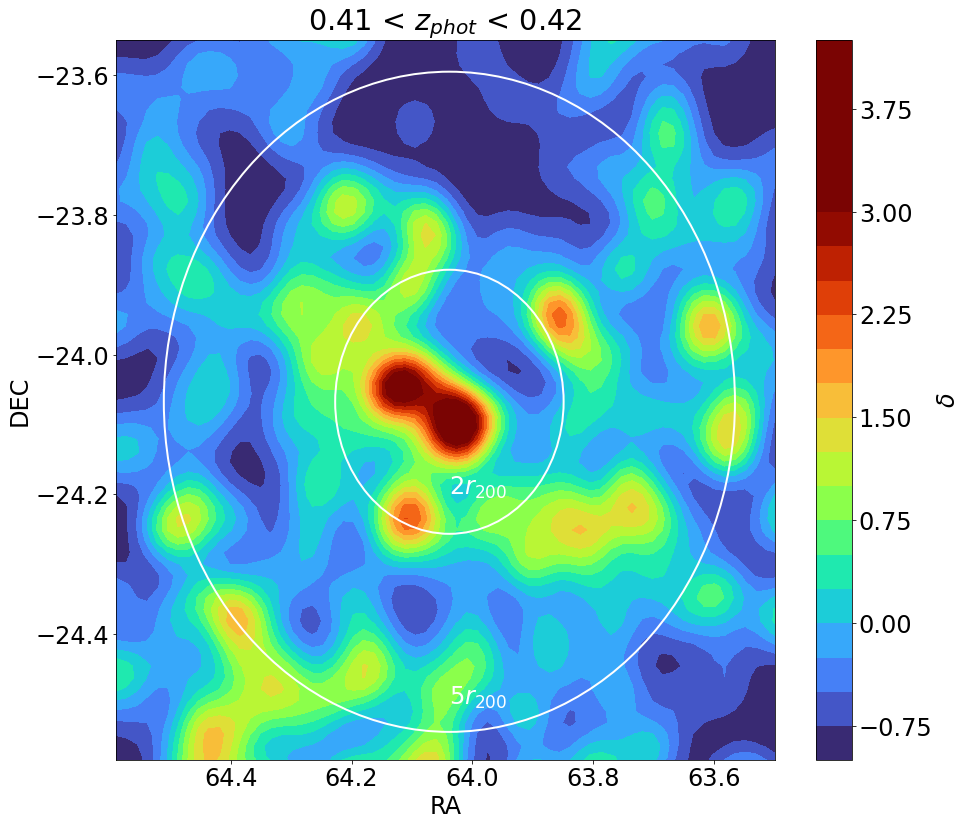

Mean density:  0.11329715061058344


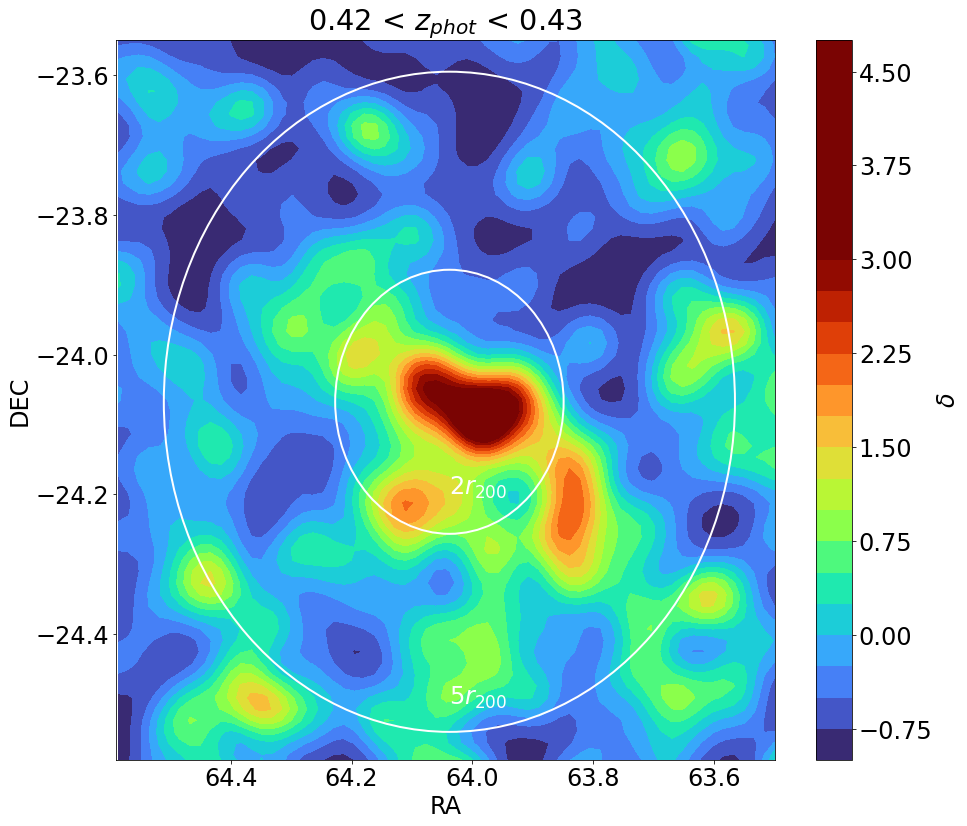

Mean density:  0.12234283129805518


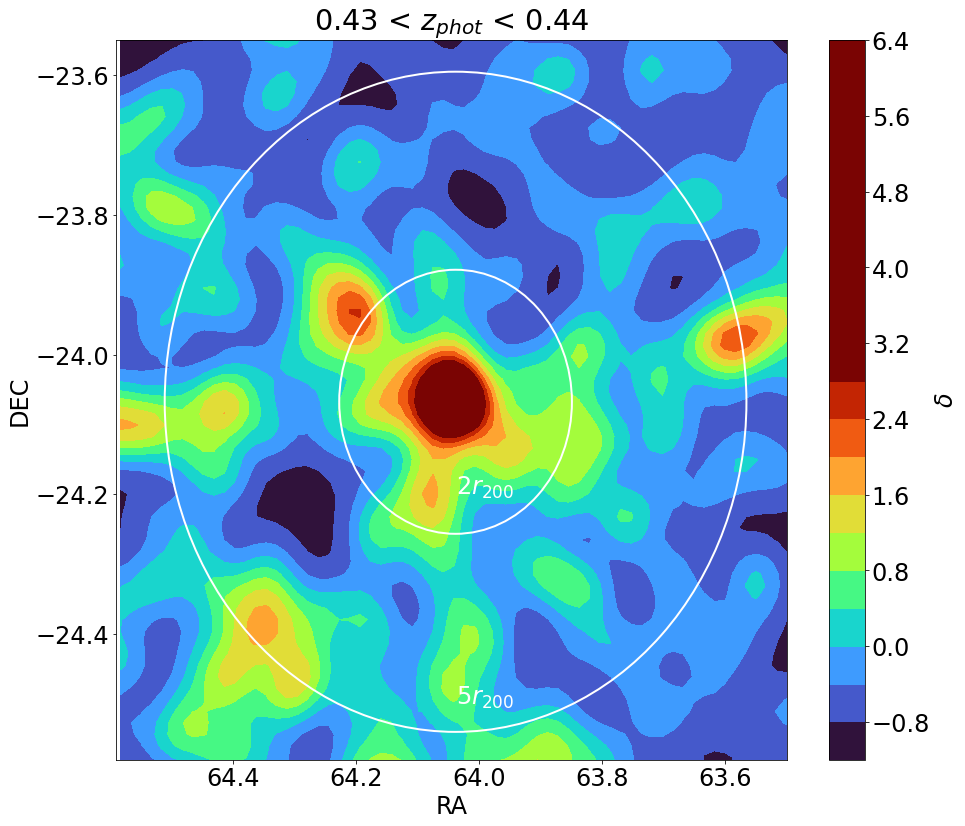

Mean density:  0.11442786069651742


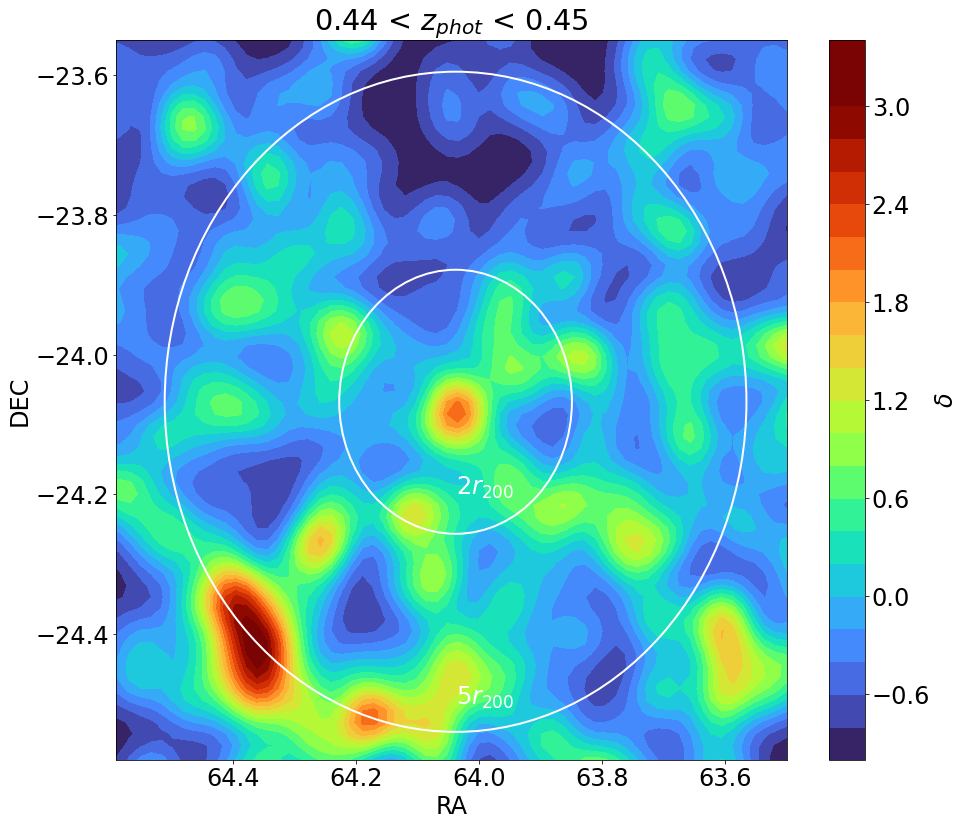

Mean density:  0.11397557666214382


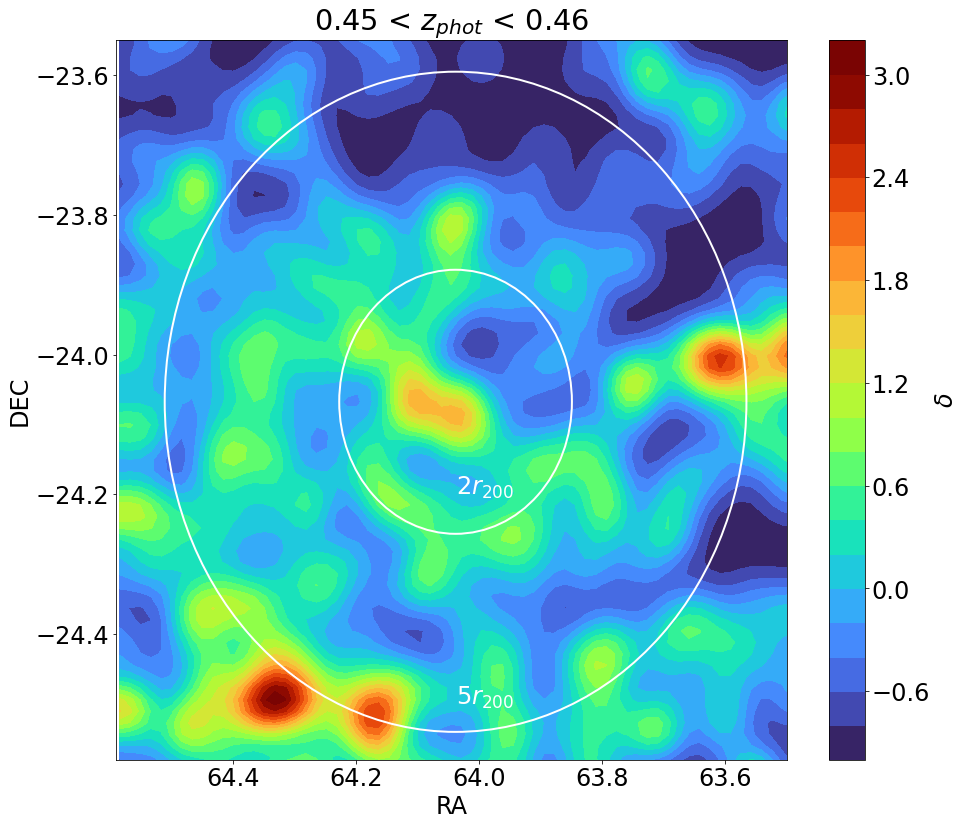

Mean density:  0.1693803708729082


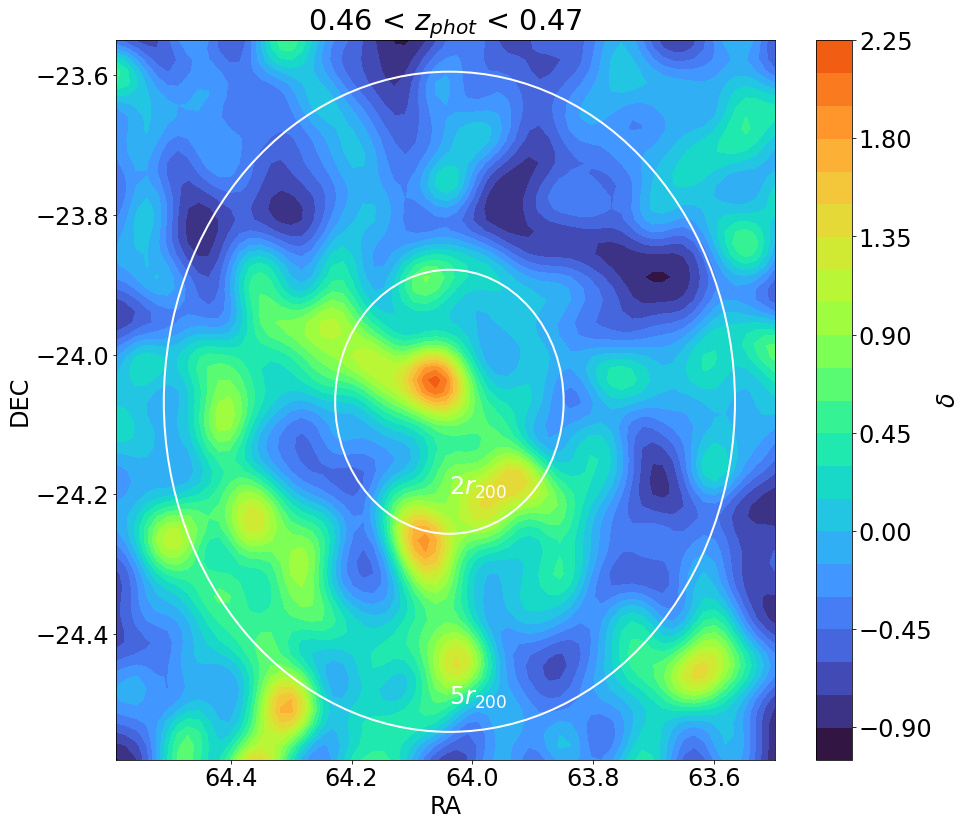

Mean density:  0.189280868385346


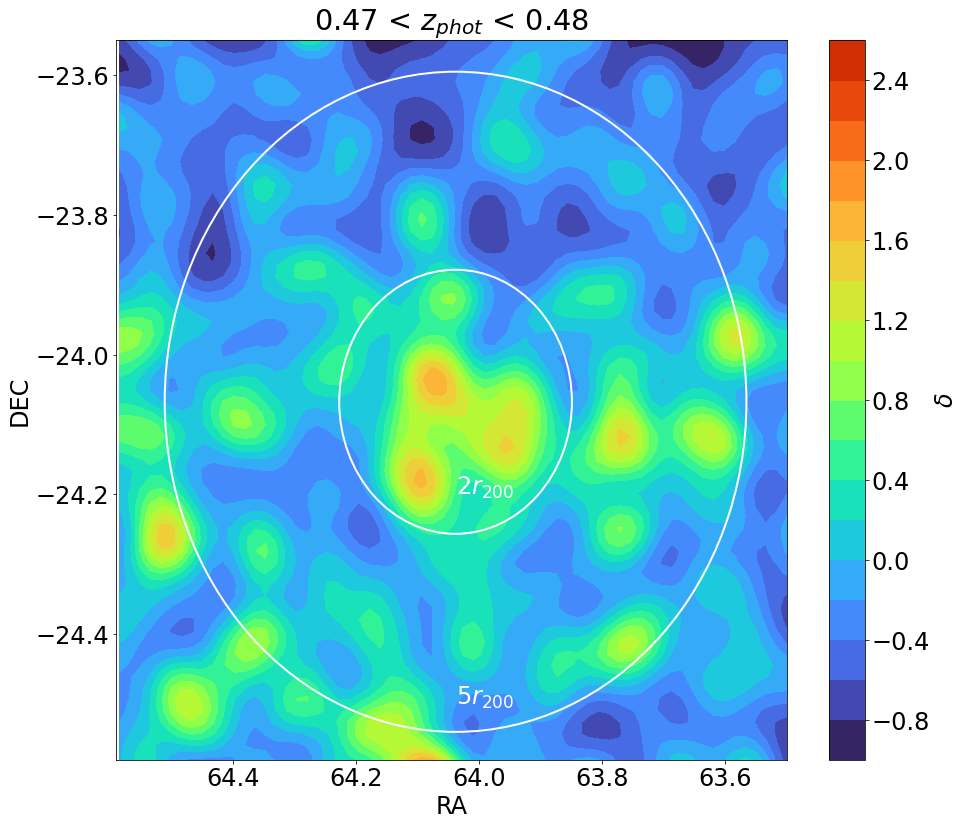

Mean density:  0.18113975576662145


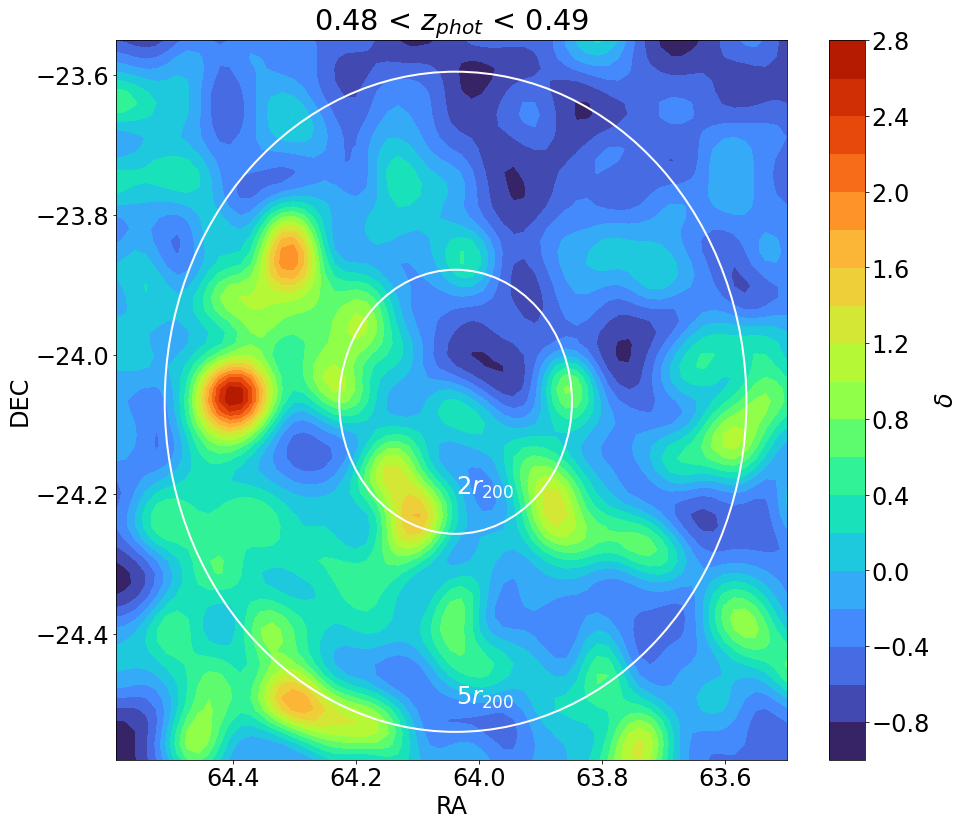

Mean density:  0.1481230212573496


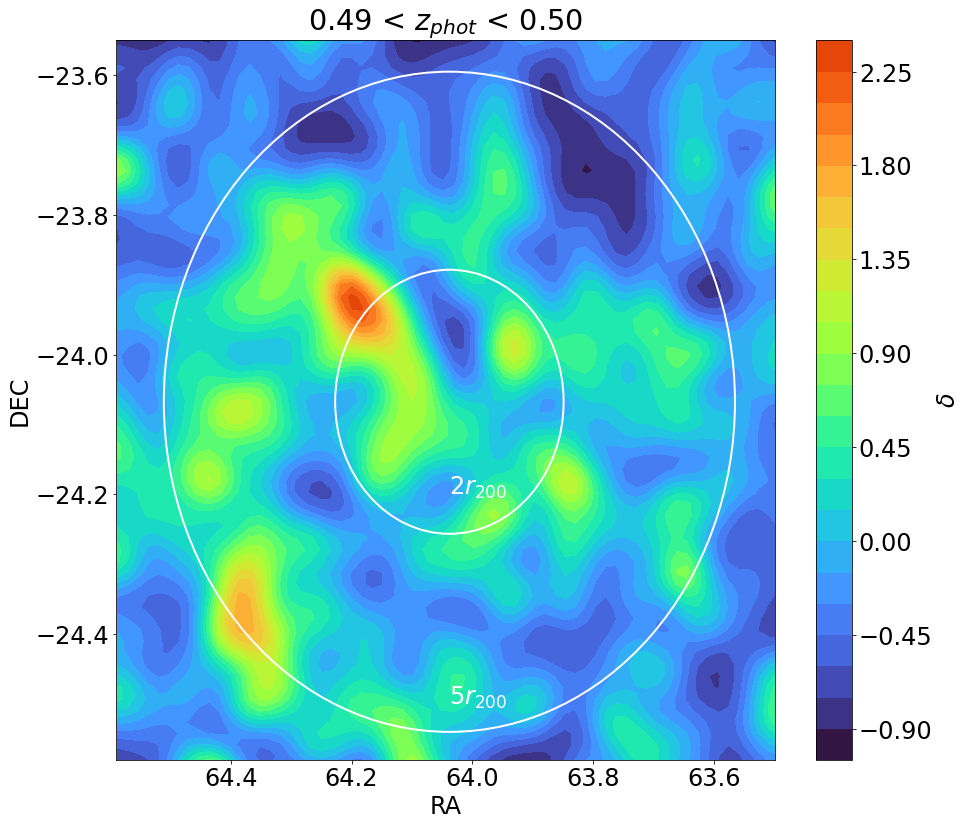

Mean density:  0.2512437810945274


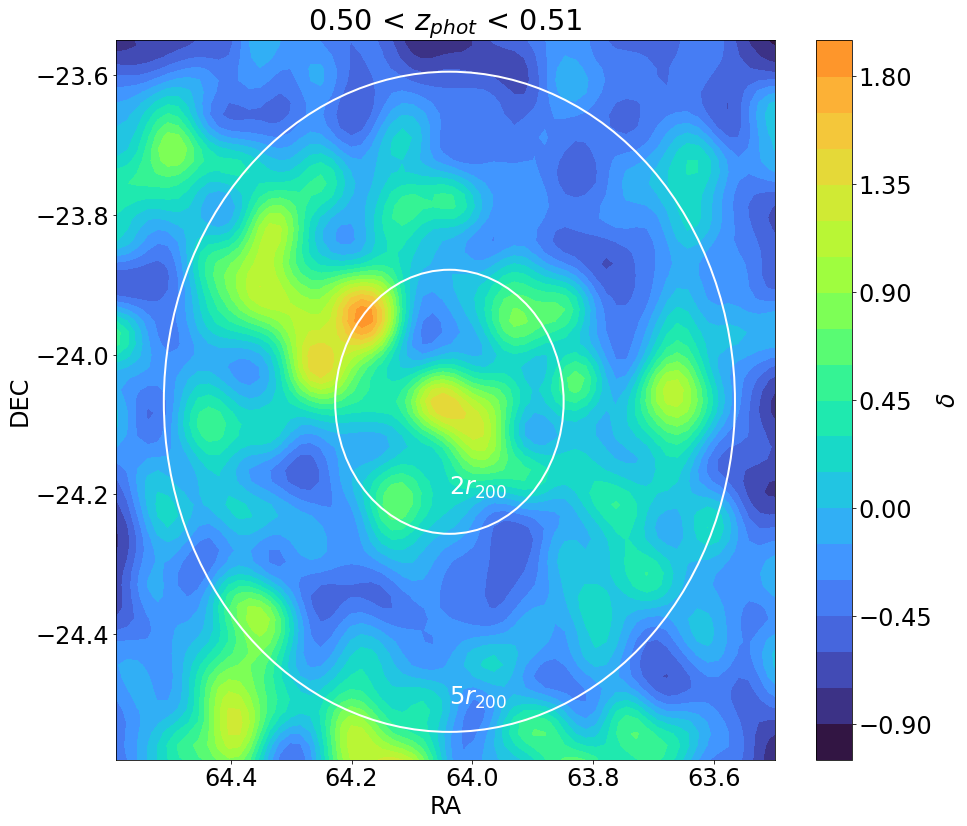

Mean density:  0.22885572139303484


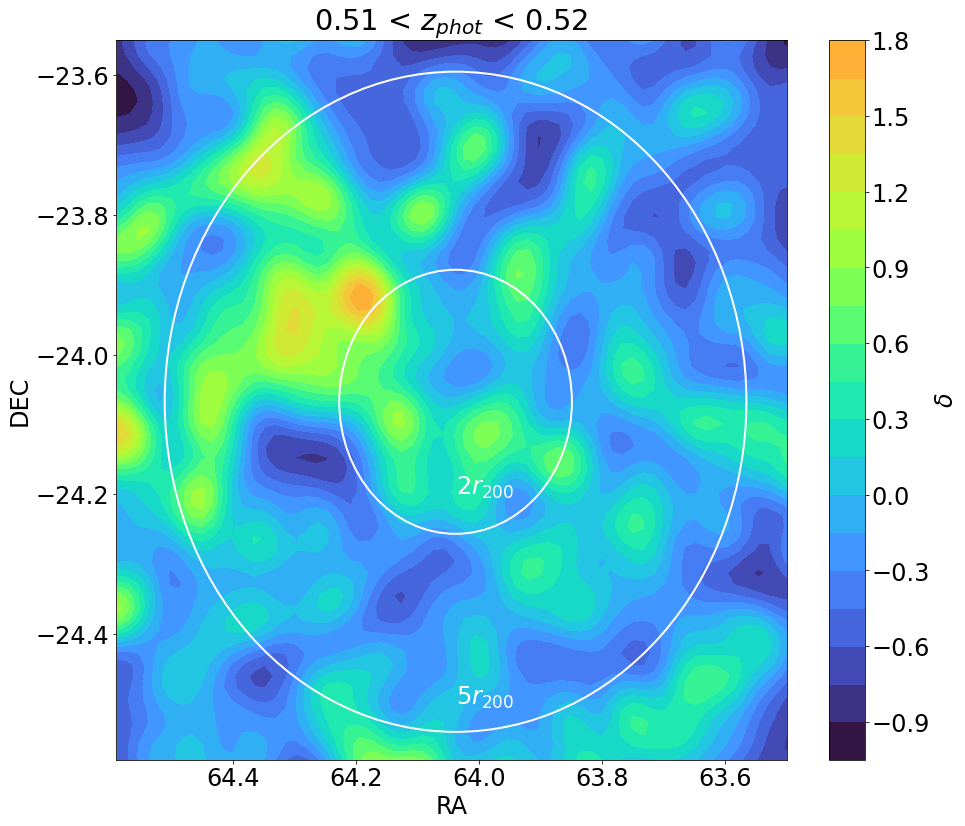

Mean density:  0.23586612392582543


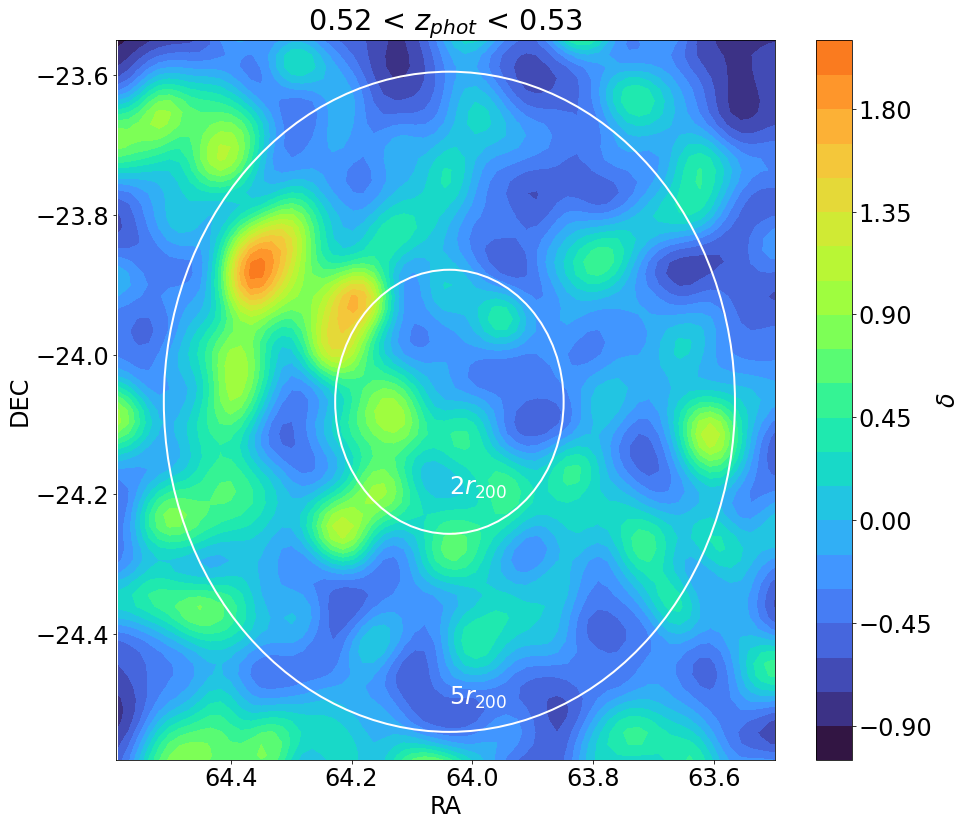

Mean density:  0.1996834011759385


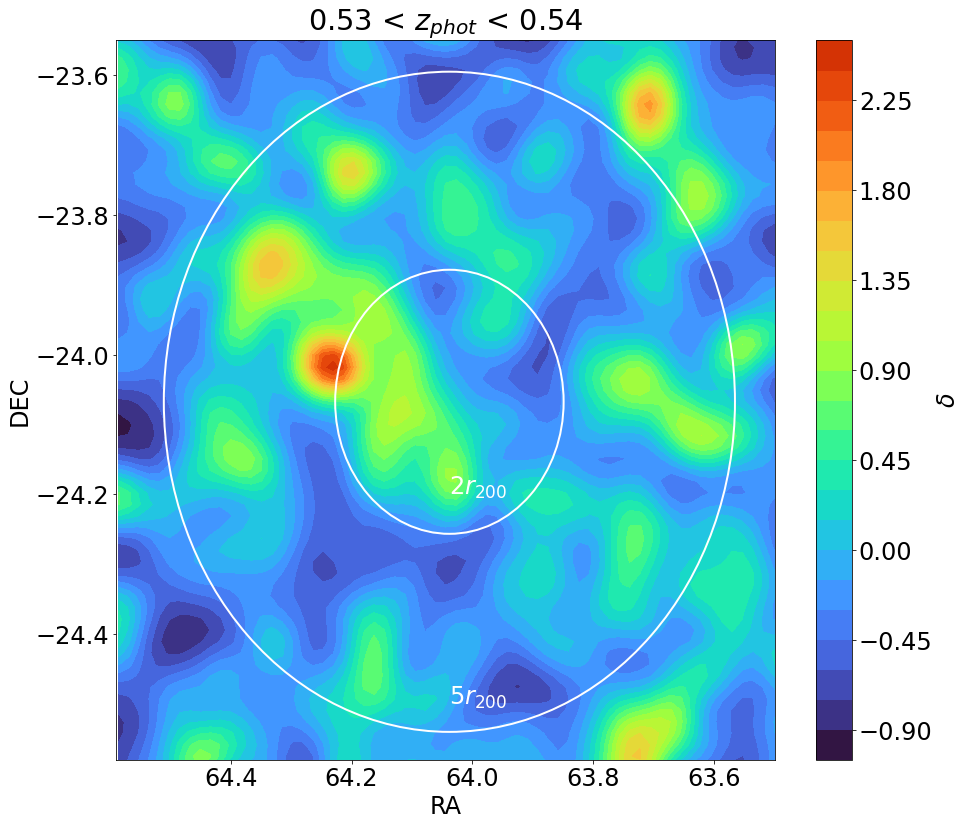

Mean density:  0.18136589778380824


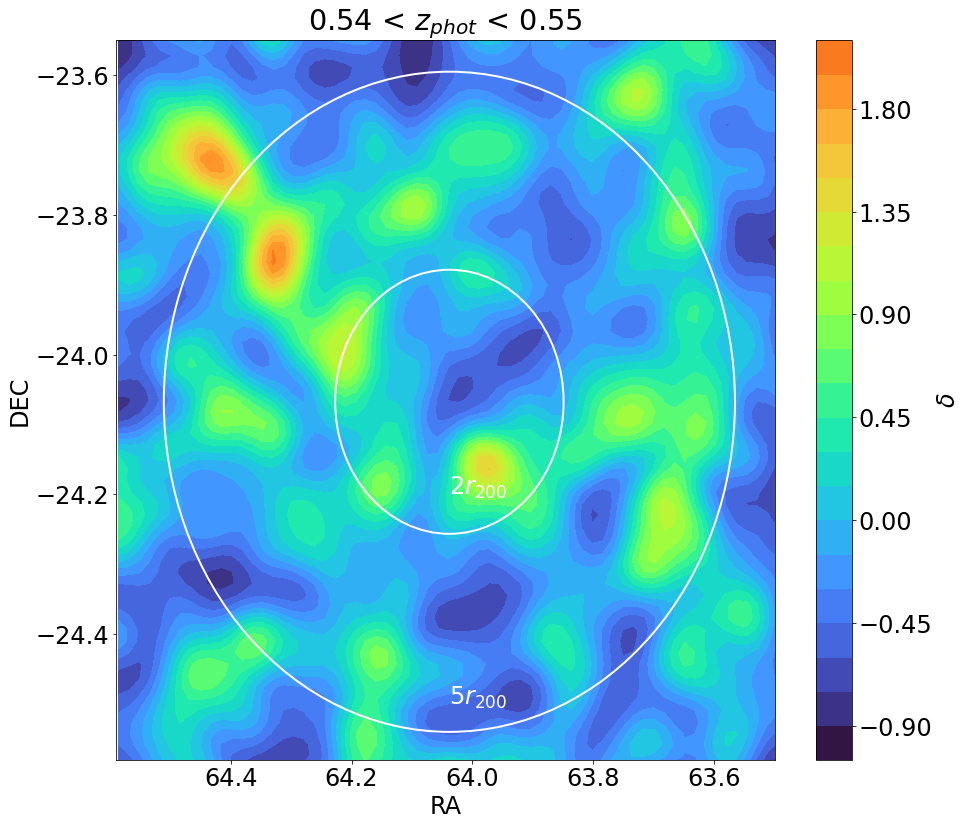

Mean density:  0.1960651289009498


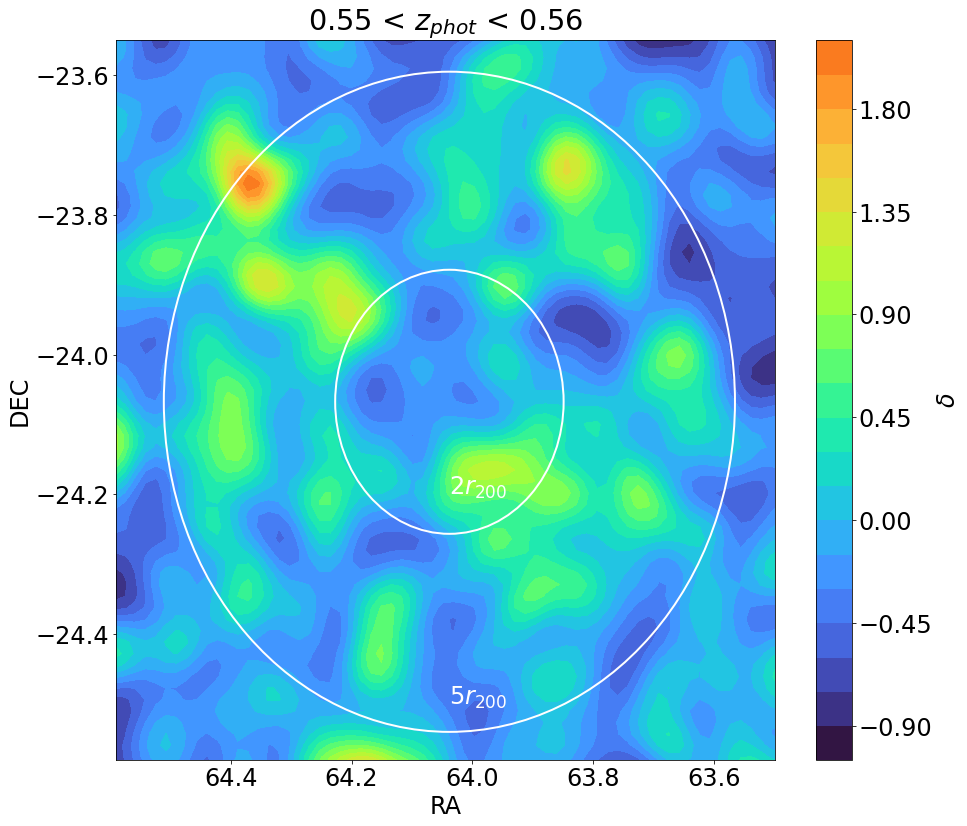

Mean density:  0.20420624151967434


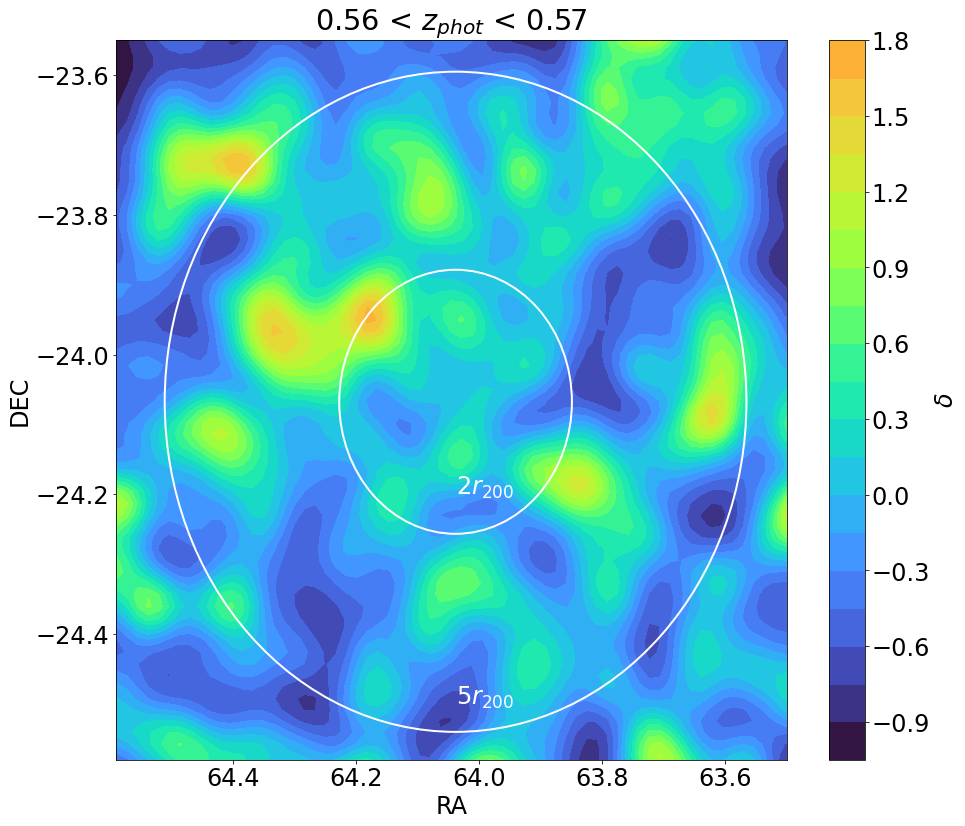

Mean density:  0.21822704658525555


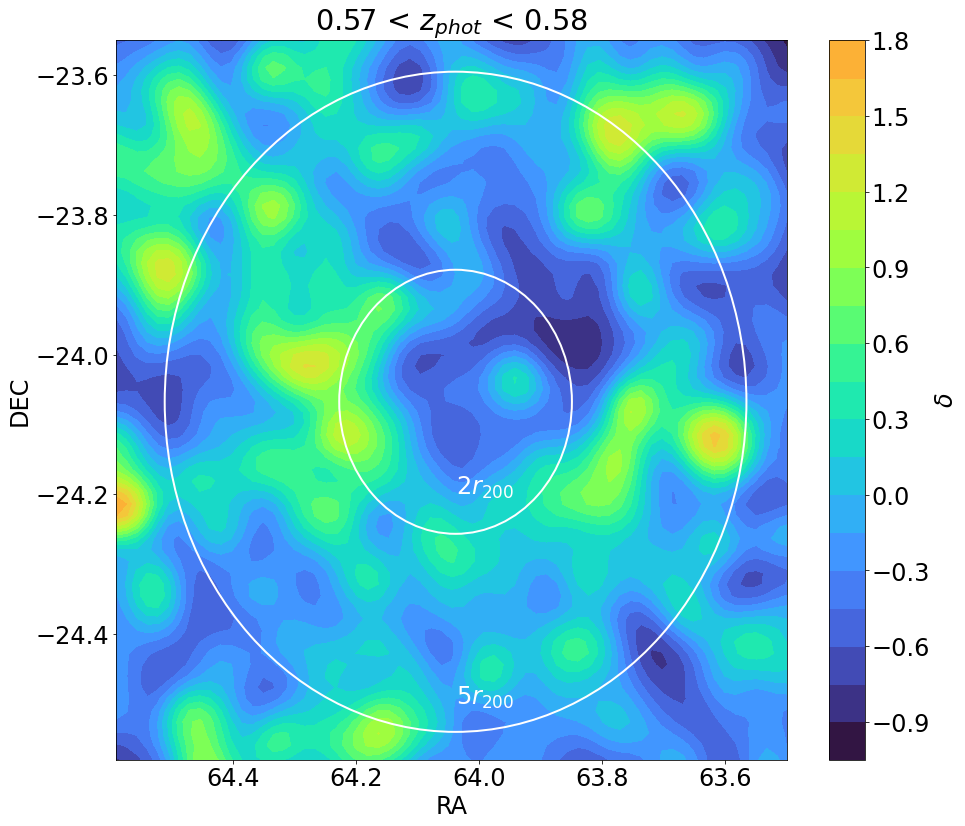

Mean density:  0.16485753052917232


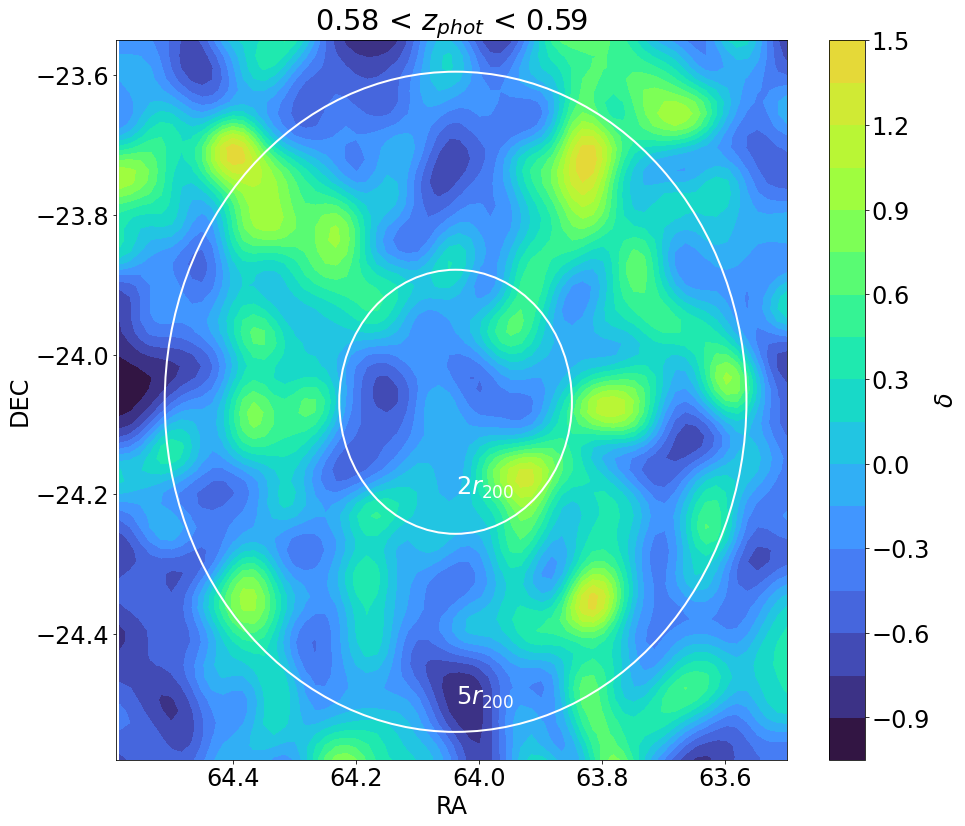

In [1452]:

#z_interval = (0,0.2)
cells_densfield_temp = (67,66)
sig_kernel_temp = 2

z_arange = np.arange(0.2,0.6,0.01)
    
for i in range(len(z_arange)-1):
    z_interval = (z_arange[i],z_arange[i+1])
    df_temp = df.copy()
    df_temp = df_temp[(df['Z_BEST']>z_interval[0])&(df['Z_BEST']<z_interval[1])]
    hist_temp, dec_temp, ra_temp = np.histogram2d(df_temp['DEC_r'],df_temp['RA_r'],bins=cells_densfield_temp)
    overdens_temp    = overdens2d(hist_temp)
    kernel_overdens_temp    = scipy.ndimage.gaussian_filter(overdens_temp,sigma=sig_kernel_temp)

    ra_central_temp = (ra_temp[:-1]+ra_temp[1:])/2
    dec_central_temp = (dec_temp[:-1]+dec_temp[1:])/2

    plt.figure(figsize=(14,12))
    plt.rcParams["font.size"] = 24

    fig = plt.gcf()
    ax  = fig.gca()
    color_map = plt.cm.get_cmap('turbo')
    reversed_color_map = color_map.reversed()
    plt.contourf(ra_central_temp, dec_central_temp,kernel_overdens_temp,levels=22,cmap='turbo',vmin=-1,vmax=3)
    plt.colorbar(label=r"$\delta$")
    ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='w',lw=2,ls='-'))    
    ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='w',lw=2))    
    plt.title(r'%.2f < $z_{phot}$ < %.2f'%(z_interval[0],z_interval[1]))
    ax.text(64.0380, -24.2, r'$2r_{200}$', style='italic',color='w')
    ax.text(64.0380, -24.5, r'$5r_{200}$', style='italic',color='w')
    plt.xlim(63.5,64.59)
    plt.ylim(-24.58,-23.55)
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.gca().invert_xaxis()
    plt.tight_layout()
    plt.savefig('superfocus_densfield/densfield_'+str(z_arange[i])+'_z_'+str(z_arange[i+1])+'.jpg')
    plt.show()

# plt.figure(figsize=(14,14))
# fig = plt.gcf()
# ax  = fig.gca()
# plt.scatter(df['RA_r'],df['DEC_r'],c=df['Z_BEST'],marker='.',vmin=0.515,vmax=0.52)
# plt.colorbar()
# ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='k',lw=2,ls='-',zorder=5))   
# ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='k',lw=2,zorder=5))  
# plt.xlim(df['RA_r'].min(),df['RA_r'].max())
# plt.ylim(df['DEC_r'].min(),df['DEC_r'].max())
# plt.tick_params(top=True, right=True,direction='in')
# plt.gca().invert_xaxis()
# plt.xlabel('RA')
# plt.ylabel('DEC')
# plt.legend()



In [ ]:
len(gamelp_out_ap1_2E_v2)

# 1.3 Completeness and purity for the whole sample

In [103]:
#print('1 SIGMA - old interval')
#completeness_purity(df['ZSPEC'],df['Z_BEST'],macs0416,(0.348,0.456))

print('1 SIGMA')
completeness_purity(df['ZSPEC'],df['Z_BEST'],macs0416,(x0_spec_cp-sigma_spec_cp,x0_spec_cp+sigma_spec_cp))

print('1 SIGMA - SN_nir>5 cut')
completeness_purity(df['ZSPEC'][SN_nir],df['Z_BEST'][SN_nir],macs0416,(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c))

_="""
1 SIGMA - SN_opt>5 cut
Spectroscopic interval: 0.382 < z < 0.410
Galaxies having z_spec in the spectroscopic interval:  426

Photometric interval: 0.359 < z < 0.482
Galaxies having z_phot in the photometric interval:  3704

Galaxies having z_phot in the photometric interval and any z_spec: 752
Galaxies having z_phot in the photometric interval and z_spec in the spectroscopic interval: 292

COMPLETEZZA:
Da tutti i membri spettroscopici (426), quanti sto recuperando come membri fotometrici? 292 (68.5%)

PUREZZA:
Da tutti i membri fotometrici che hanno z-spec (752), quanti sono membri spettroscopici del cluster? 292 (38.8%)


1 SIGMA - SN_nir>5 cut
Spectroscopic interval: 0.382 < z < 0.410
Galaxies having z_spec in the spectroscopic interval:  805

Photometric interval: 0.350 < z < 0.449
Galaxies having z_phot in the photometric interval:  4091

Galaxies having z_phot in the photometric interval and any z_spec: 904
Galaxies having z_phot in the photometric interval and z_spec in the spectroscopic interval: 505

COMPLETEZZA:
Da tutti i membri spettroscopici (805), quanti sto recuperando come membri fotometrici? 505 (62.7%)

PUREZZA:
Da tutti i membri fotometrici che hanno z-spec (904), quanti sono membri spettroscopici del cluster? 505 (55.9%)


1 SIGMA - SN_all>5 cut
Spectroscopic interval: 0.382 < z < 0.410
Galaxies having z_spec in the spectroscopic interval:  393

Photometric interval: 0.359 < z < 0.478
Galaxies having z_phot in the photometric interval:  3289

Galaxies having z_phot in the photometric interval and any z_spec: 674
Galaxies having z_phot in the photometric interval and z_spec in the spectroscopic interval: 274

COMPLETEZZA:
Da tutti i membri spettroscopici (393), quanti sto recuperando come membri fotometrici? 274 (69.7%)

PUREZZA:
Da tutti i membri fotometrici che hanno z-spec (674), quanti sono membri spettroscopici del cluster? 274 (40.7%)"""




1 SIGMA
Spectroscopic interval: 0.382 < z < 0.410
Galaxies having z_spec in the spectroscopic interval:  897

Photometric interval: 0.347 < z < 0.454
Galaxies having z_phot in the photometric interval:  4972

Galaxies having z_phot in the photometric interval and any z_spec: 1059
Galaxies having z_phot in the photometric interval and z_spec in the spectroscopic interval: 558

COMPLETEZZA:
Da tutti i membri spettroscopici (897), quanti sto recuperando come membri fotometrici? 558 (62.2%)

PUREZZA:
Da tutti i membri fotometrici che hanno z-spec (1059), quanti sono membri spettroscopici del cluster? 558 (52.7%)

0.347 < z < 0.454 : 62.21 comp and 52.69 pur
1 SIGMA - SN_nir>5 cut
Spectroscopic interval: 0.382 < z < 0.410
Galaxies having z_spec in the spectroscopic interval:  799

Photometric interval: 0.348 < z < 0.453
Galaxies having z_phot in the photometric interval:  4067

Galaxies having z_phot in the photometric interval and any z_spec: 907
Galaxies having z_phot in the photometric i

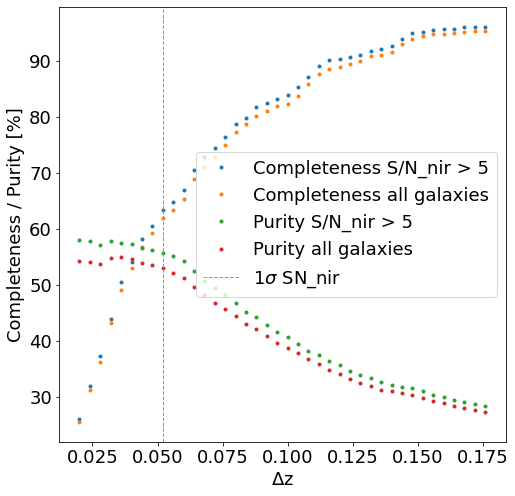

In [17]:
comply = []
pury   = []
comply_p = []
pury_p   = []
for i in np.arange(0.02,0.18,0.004):
    tmp1,tmp2 = completeness_purity(df['ZSPEC'][SN_nir],df['Z_BEST'][SN_nir],macs0416,(x0_spec_c-i,x0_spec_c+i),verbose=False)
    tmp1_p,tmp2_p = completeness_purity(df['ZSPEC'],df['Z_BEST'],macs0416,(x0_spec_cp-i,x0_spec_cp+i),verbose=False)
    comply.append(tmp1)
    pury.append(tmp2)
    comply_p.append(tmp1_p)
    pury_p.append(tmp2_p)
comply = np.array(comply)
pury = np.array(pury)
comply_p = np.array(comply_p)
pury_p = np.array(pury_p)

plt.figure(figsize=(8,8))
plt.plot(np.arange(0.02,0.18,0.004),comply,'.',label='Completeness S/N_nir > 5')
plt.plot(np.arange(0.02,0.18,0.004),comply_p,'.',label='Completeness all galaxies')


plt.plot(np.arange(0.02,0.18,0.004),pury,'.',label='Purity S/N_nir > 5')
plt.plot(np.arange(0.02,0.18,0.004),pury_p,'.',label='Purity all galaxies')

plt.axvline(sigma_spec_c,ls='--',lw=1,color='lime',label='1$\sigma$ SN_nir')
#plt.axvline(sigma_spec_cp,ls='--',lw=1,color='deeppink',label='1$\sigma$ all gal')
#plt.axvline(0.044,ls='--',lw=1,color='k',label='A occhio $\sigma$=0.044')

plt.ylabel('Completeness / Purity [%]')
plt.xlabel('$\Delta$z')
plt.legend()

In [104]:
photo_macs0416 = (x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c)
#photo_macs0416 = (0.4-0.044,0.4+0.044)
#print(photo_macs0416)

completeness_purity(df['ZSPEC'][SN_nir],df['Z_BEST'][SN_nir],macs0416,photo_macs0416,verbose=True)

bool_photoup   = cluster(df,(photo_macs0416[1],10),photo=True)
bool_photodown = cluster(df,(0,photo_macs0416[0]),photo=True)

df_spec_cluster_photoup      = df[SN_nir&bool_spec_cluster&bool_photoup]
df_spec_cluster_photodown    = df[SN_nir&bool_spec_cluster&bool_photodown]


Spectroscopic interval: 0.382 < z < 0.410
Galaxies having z_spec in the spectroscopic interval:  799

Photometric interval: 0.348 < z < 0.453
Galaxies having z_phot in the photometric interval:  4067

Galaxies having z_phot in the photometric interval and any z_spec: 907
Galaxies having z_phot in the photometric interval and z_spec in the spectroscopic interval: 506

COMPLETEZZA:
Da tutti i membri spettroscopici (799), quanti sto recuperando come membri fotometrici? 506 (63.3%)

PUREZZA:
Da tutti i membri fotometrici che hanno z-spec (907), quanti sono membri spettroscopici del cluster? 506 (55.8%)

0.348 < z < 0.453 : 63.33 comp and 55.79 pur


# 2. Red sequence 

# 2.a Color-magnitude diagram

### 2.a Color-magnitude diagram: selecting dateset

In [106]:
bool_photo_cluster    = cluster(df,photo_macs0416,photo=True)
df_photo_cluster      = df[SN_nir&bool_photo_cluster] # == cluster_2E_b_red + game_0416_2E_b_red

# some minor boolean for the color-color and color-magnitude plot
grigio = df_photo_cluster['ZSPEC']==-99
nero   = (df_photo_cluster['ZSPEC']!=-99)&(df_photo_cluster['ZSPEC']>=0.382)&(df_photo_cluster['ZSPEC']<=0.410)
rosso  = (df_photo_cluster['ZSPEC']!=-99)&(df_photo_cluster['ZSPEC']>0.410)
blu    = (df_photo_cluster['ZSPEC']!=-99)&(df_photo_cluster['ZSPEC']<0.382)

print("All the galaxies with photo-z in the extended interval: ",len(df_photo_cluster))
print('no z-spec: ',grigio.sum(),', z-spec cluster: ',nero.sum(),', z-spec larger: ',rosso.sum(),' z-spec smaller: ',blu.sum())
print('BCG MAG_AUTO_r = ',df_photo_cluster['MAG_AUTO_r'][nero].min())


All the galaxies with photo-z in the extended interval:  4067
no z-spec:  3160 , z-spec cluster:  508 , z-spec larger:  241  z-spec smaller:  158
BCG MAG_AUTO_r =  18.97


### 2.a Color-magnitude diagram: Capellaro fitting to divide red and blue

sig_int:     0.0000     41.4228
Computing sig_int
sig_int:     0.0000     41.4228
sig_int:     0.3521     -0.1528
sig_int:     0.3508     -0.1466
sig_int:     0.3200      0.0215
sig_int:     0.3239     -0.0026
sig_int:     0.3235     -0.0000
sig_int:     0.3233      0.0009
Computing sig_int error
sig_int:     0.3235      0.0501
sig_int:     0.3521     -0.1027
sig_int:     0.3329     -0.0042
sig_int:     0.3321     -0.0002
sig_int:     0.3320      0.0008
Repeat at best fitting solution
sig_int:     0.3235     -0.0000
################# Values and formal errors ################
 intercept:  1.386 +/- 0.012
     slope:  -0.0985 +/- 0.0099
   scatter:  0.3235 +/- 0.0086
Observed rms scatter: 0.33
y = a + b*(x - pivot) with pivot = 21.99
Spearman r=-0.36 and p=1.7e-25
Pearson r=-0.32 and p=1.7e-20
##########################################################
seconds 175.57


'\nOUTPUT\n################# Values and formal errors ################\n intercept:  1.389 +/- 0.012\n     slope:  -0.0922 +/- 0.0098\n   scatter:  0.3248 +/- 0.0086\nObserved rms scatter: 0.33\ny = a + b*(x - pivot) with pivot = 22\nSpearman r=-0.35 and p=3.3e-24\nPearson r=-0.3 and p=8.9e-19\n##########################################################\n\nOUTPUT_V2\n################# Values and formal errors ################\n intercept:  1.386 +/- 0.012\n     slope:  -0.0985 +/- 0.0099\n   scatter:  0.3235 +/- 0.0086\nObserved rms scatter: 0.33\ny = a + b*(x - pivot) with pivot = 21.99\nSpearman r=-0.36 and p=1.7e-25\nPearson r=-0.32 and p=1.7e-20\n##########################################################\n'

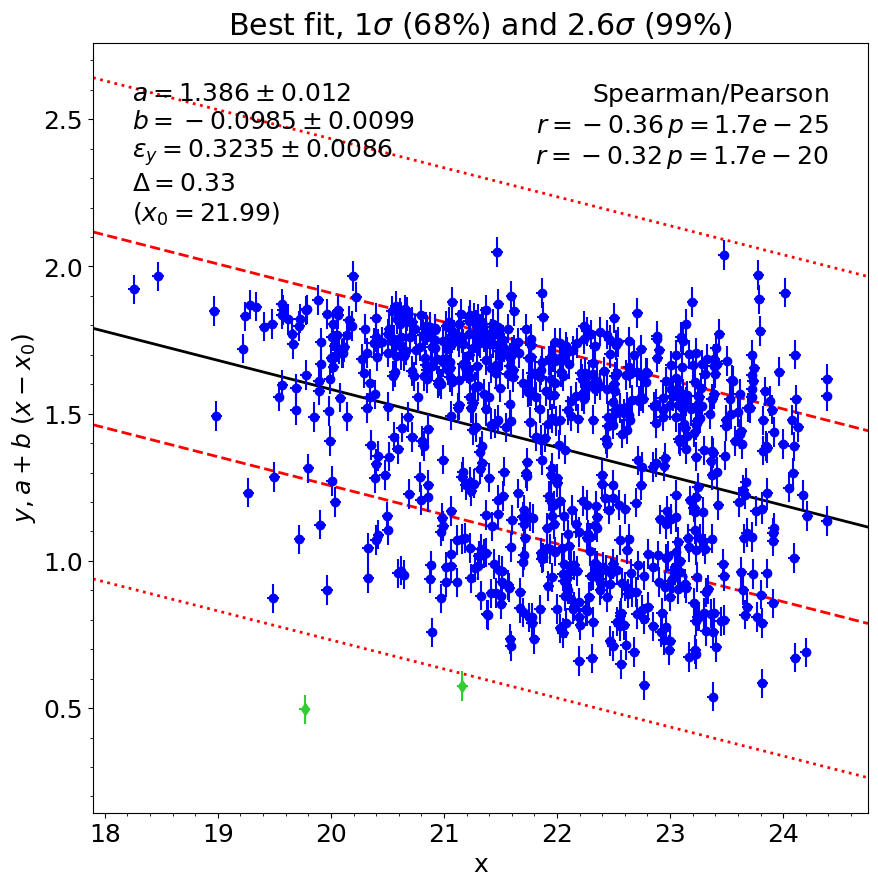

In [209]:

"""y_lts,bool_color   = good_color(df_spec_cluster['MAG_AP3_g'],df_spec_cluster['MAG_AP3_r'])
y_lts.reset_index(drop=True,inplace=True)

x_lts   = df_spec_cluster['MAG_AUTO_r'][bool_color]
x_lts.reset_index(drop=True,inplace=True)

sigx = np.full_like(x_lts, 0.05) 
sigy = np.full_like(x_lts, 0.05)  
plt.figure(figsize=(10,10))
plt.clf()
p = lts_linefit(x_lts, y_lts, sigx, sigy, pivot=np.median(x_lts))
plt.xlabel('x')
plt.ylabel('$y, a + b\ (x - x_{0})$')
"""
"""
OUTPUT
################# Values and formal errors ################
 intercept:  1.389 +/- 0.012
     slope:  -0.0922 +/- 0.0098
   scatter:  0.3248 +/- 0.0086
Observed rms scatter: 0.33
y = a + b*(x - pivot) with pivot = 22
Spearman r=-0.35 and p=3.3e-24
Pearson r=-0.3 and p=8.9e-19
##########################################################

OUTPUT_V2
################# Values and formal errors ################
 intercept:  1.386 +/- 0.012
     slope:  -0.0985 +/- 0.0099
   scatter:  0.3235 +/- 0.0086
Observed rms scatter: 0.33
y = a + b*(x - pivot) with pivot = 21.99
Spearman r=-0.36 and p=1.7e-25
Pearson r=-0.32 and p=1.7e-20
##########################################################
"""

### 2.a Color-magnitude diagram: Capellaro fitting to fit the red sequence

sig_int:     0.0000      2.6325
Computing sig_int
sig_int:     0.0000      2.6325
sig_int:     0.1057     -0.3337
sig_int:     0.0938     -0.1939
sig_int:     0.0785      0.0524
sig_int:     0.0817     -0.0076
sig_int:     0.0813     -0.0003
sig_int:     0.0813      0.0005
Computing sig_int error
sig_int:     0.0813      0.0713
sig_int:     0.1057     -0.2622
sig_int:     0.0865     -0.0163
sig_int:     0.0856     -0.0008
sig_int:     0.0855      0.0000
Repeat at best fitting solution
sig_int:     0.0813     -0.0003
################# Values and formal errors ################
 intercept:  1.6619 +/- 0.0048
     slope:  -0.0680 +/- 0.0040
   scatter:  0.0813 +/- 0.0042
Observed rms scatter: 0.096
y = a + b*(x - pivot) with pivot = 21.85
Spearman r=-0.59 and p=1.2e-39
Pearson r=-0.55 and p=5.6e-34
##########################################################
seconds 183.77


'\nOUTPUT\n################# Values and formal errors ################\n intercept:  1.6631 +/- 0.0049\n     slope:  -0.0662 +/- 0.0040\n   scatter:  0.0848 +/- 0.0042\nObserved rms scatter: 0.098\ny = a + b*(x - pivot) with pivot = 21.86\nSpearman r=-0.58 and p=1.1e-38\nPearson r=-0.54 and p=4e-33\n##########################################################\n\nOUTPUT_v2\n################# Values and formal errors ################\n intercept:  1.6619 +/- 0.0048\n     slope:  -0.0680 +/- 0.0040\n   scatter:  0.0813 +/- 0.0042\nObserved rms scatter: 0.096\ny = a + b*(x - pivot) with pivot = 21.85\nSpearman r=-0.59 and p=1.2e-39\nPearson r=-0.55 and p=5.6e-34\n##########################################################\n'

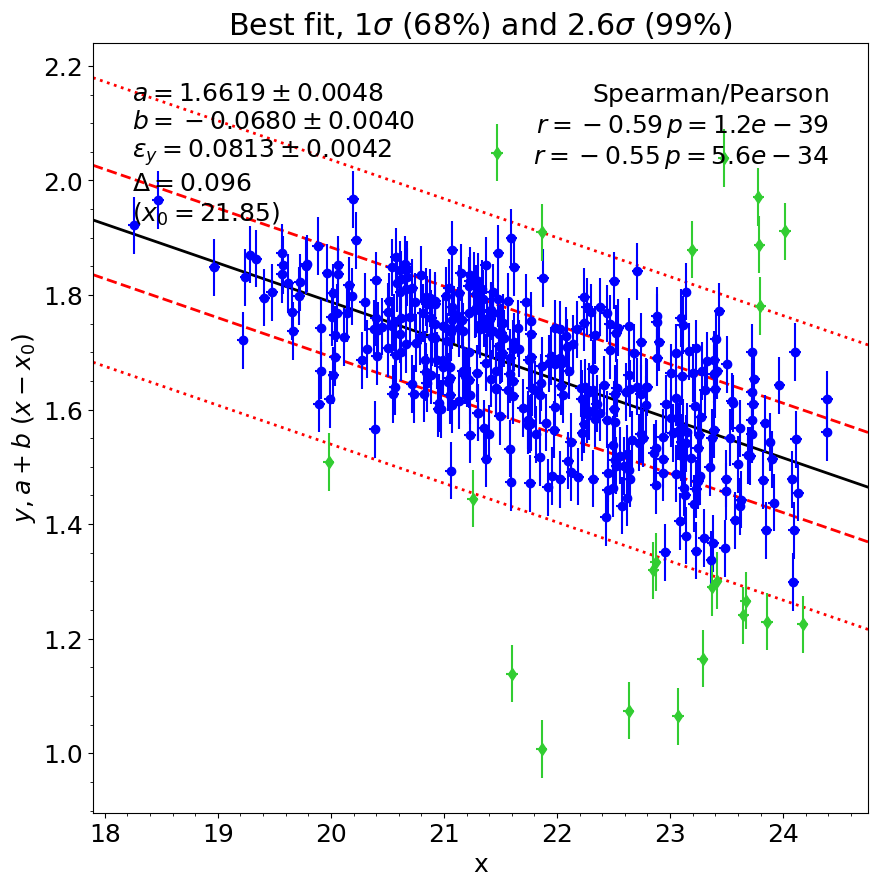

In [210]:
""""
y_linear2 = (-0.0985)*(df_spec_cluster['MAG_AUTO_r']-21.99)+1.386
y_data2   = df_spec_cluster['MAG_AUTO_g']-df_spec_cluster['MAG_AUTO_r']

df_spec_cluster_upper = df_spec_cluster[y_data2>=y_linear2]
df_spec_cluster_upper.reset_index(drop=True,inplace=True)

y_lts2,bool_color2   = good_color(df_spec_cluster_upper['MAG_AP3_g'],df_spec_cluster_upper['MAG_AP3_r'])
y_lts2.reset_index(drop=True,inplace=True)

x_lts2   = df_spec_cluster_upper['MAG_AUTO_r'][bool_color2]
x_lts2.reset_index(drop=True,inplace=True)

sigx2 = np.full_like(x_lts2, 0.05) 
sigy2 = np.full_like(x_lts2, 0.05)  
plt.figure(figsize=(10,10))
plt.clf()
p = lts_linefit(x_lts2, y_lts2, sigx2, sigy2, pivot=np.median(x_lts2))
plt.xlabel('x')
plt.ylabel('$y, a + b\ (x - x_{0})$')
"""
""""
OUTPUT
################# Values and formal errors ################
 intercept:  1.6631 +/- 0.0049
     slope:  -0.0662 +/- 0.0040
   scatter:  0.0848 +/- 0.0042
Observed rms scatter: 0.098
y = a + b*(x - pivot) with pivot = 21.86
Spearman r=-0.58 and p=1.1e-38
Pearson r=-0.54 and p=4e-33
##########################################################

OUTPUT_v2
################# Values and formal errors ################
 intercept:  1.6619 +/- 0.0048
     slope:  -0.0680 +/- 0.0040
   scatter:  0.0813 +/- 0.0042
Observed rms scatter: 0.096
y = a + b*(x - pivot) with pivot = 21.85
Spearman r=-0.59 and p=1.2e-39
Pearson r=-0.55 and p=5.6e-34
##########################################################
"""

### 2.a Color-magnitude diagram: selecting sample

In [107]:
# MAG for all the photo-culuster members
mag_kron_r = good_mag(df_photo_cluster['MAG_AUTO_r'])
mag_r = good_mag(df_photo_cluster['MAG_AP3_r']) 
mag_j = good_mag(df_photo_cluster['MAG_AP3_j']) 
mag_g = good_mag(df_photo_cluster['MAG_AP3_g']) 
mag_i = good_mag(df_photo_cluster['MAG_AP3_i']) 

# MAG for objects with Z_phot > Z-cluster
mag_kron_r_up = good_mag(df_spec_cluster_photoup['MAG_AUTO_r'])
mag_r_up = good_mag(df_spec_cluster_photoup['MAG_AP3_r']) 
mag_j_up = good_mag(df_spec_cluster_photoup['MAG_AP3_j']) 
mag_g_up = good_mag(df_spec_cluster_photoup['MAG_AP3_g']) 
mag_i_up = good_mag(df_spec_cluster_photoup['MAG_AP3_i']) 

# MAG for objects with Z_phot < Z-cluster
mag_kron_r_down = good_mag(df_spec_cluster_photodown['MAG_AUTO_r'])
mag_r_down = good_mag(df_spec_cluster_photodown['MAG_AP3_r'])
mag_j_down = good_mag(df_spec_cluster_photodown['MAG_AP3_j']) 
mag_g_down = good_mag(df_spec_cluster_photodown['MAG_AP3_g']) 
mag_i_down = good_mag(df_spec_cluster_photodown['MAG_AP3_i'])

##########################################################################
##########################################################################
# RED SEQUENCE (Between y_linear_inf & y_linear_sup)
rs_a  = 1.6619
rs_b  = -0.0680
rs_ep = 0.0813
rs_x0 = 21.85

y_data       = mag_g-mag_r
y_linear     = (-0.0985)*(mag_kron_r-21.99)+1.386
y_linear_sup = (rs_b)*(mag_kron_r-rs_x0)+rs_a+(2.6*rs_ep)
y_linear_inf = (rs_b)*(mag_kron_r-rs_x0)+rs_a-(2.6*rs_ep)

df_photo_cluster_rs          = df_photo_cluster[(y_data>=y_linear_inf)&(y_data<=y_linear_sup)] # = game_0416_redsequence + game_0416_lp_redsequence

# BLUE CLOUD (Below y_linear_inf)
df_photo_cluster_bc          = df_photo_cluster[y_data<y_linear_inf] 

##########################################################################
##########################################################################

# Upper part of the col-mag diagram
df_photo_cluster_colmag_up   = df_photo_cluster[y_data>=y_linear]
mag_kron_r_photocluster_colmag_up = good_mag(df_photo_cluster_colmag_up['MAG_AUTO_r'])
mag_r_photocluster_colmag_up = good_mag(df_photo_cluster_colmag_up['MAG_AP3_r'])  
mag_g_photocluster_colmag_up = good_mag(df_photo_cluster_colmag_up['MAG_AP3_g'])
mag_i_photocluster_colmag_up = good_mag(df_photo_cluster_colmag_up['MAG_AP3_i'])  
mag_j_photocluster_colmag_up = good_mag(df_photo_cluster_colmag_up['MAG_AP3_j'])

# Lower part of the col-mag diagram
df_photo_cluster_colmag_down        = df_photo_cluster[y_data<y_linear]
mag_kron_r_photocluster_colmag_down = good_mag(df_photo_cluster_colmag_down['MAG_AUTO_r'])
mag_r_photocluster_colmag_down = good_mag(df_photo_cluster_colmag_down['MAG_AP3_r'])
mag_g_photocluster_colmag_down = good_mag(df_photo_cluster_colmag_down['MAG_AP3_g']) 
mag_i_photocluster_colmag_down = good_mag(df_photo_cluster_colmag_down['MAG_AP3_i'])
mag_j_photocluster_colmag_down = good_mag(df_photo_cluster_colmag_down['MAG_AP3_j']) 

In [23]:
print(len(df_photo_cluster_rs))

1374


### 2.a Color-magnitude diagram: paper plot

In [109]:
_="""x = np.linspace(16,27,200)
plt.figure(figsize=(8,8))
plt.rcParams["font.size"] = 18

plt.plot(mag_kron_r_photocluster_colmag_up, mag_g_photocluster_colmag_up-mag_r_photocluster_colmag_up,'.', c='gray', alpha=0.3,label='')
plt.plot(mag_kron_r_photocluster_colmag_down, mag_g_photocluster_colmag_down-mag_r_photocluster_colmag_down,'.', c='gray', alpha=0.3,label='%.3f < $z_{phot}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))

plt.plot(df_spec_cluster['MAG_AUTO_r'], df_spec_cluster['MAG_AP3_g']-df_spec_cluster['MAG_AP3_r'], '*',c='k', alpha=.7,label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='red',lw=3,label='Red sequence $\pm$ $2.6\sigma$')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='red',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='red',lw=2,label='')

plt.plot(df_photo_cluster_rs['MAG_AUTO_r'], df_photo_cluster_rs['MAG_AP3_g']-df_photo_cluster_rs['MAG_AP3_r'],'.',zorder=1, c='red',label='Red galaxies')#sequence: '+str(len(df_photo_cluster_rs))+' galaxies')
plt.ylabel("g - r")
plt.xlabel("r")

plt.xlim(17,25)
plt.ylim(0.45,2.7)
plt.legend()
#plt.gca().invert_xaxis()
#plt.savefig('red_sequence.png')"""

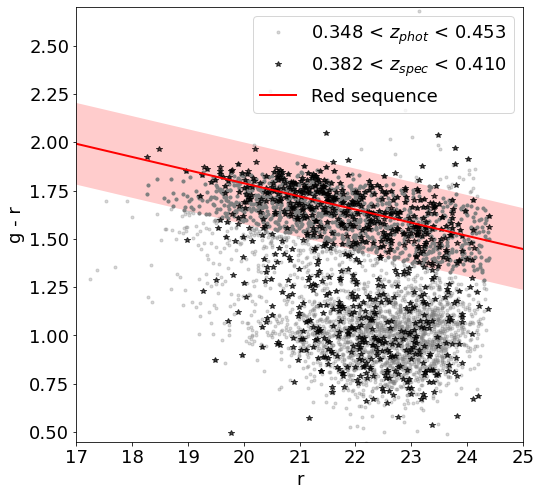

In [110]:
x = np.linspace(16,27,200)
plt.figure(figsize=(8,8))
plt.rcParams["font.size"] = 18

plt.plot(mag_kron_r_photocluster_colmag_up, mag_g_photocluster_colmag_up-mag_r_photocluster_colmag_up,'.', c='gray', alpha=0.3,label='')
plt.plot(mag_kron_r_photocluster_colmag_down, mag_g_photocluster_colmag_down-mag_r_photocluster_colmag_down,'.', c='gray', alpha=0.3,label='%.3f < $z_{phot}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))

plt.plot(df_spec_cluster['MAG_AUTO_r'], df_spec_cluster['MAG_AP3_g']-df_spec_cluster['MAG_AP3_r'], '*',c='k', alpha=.7,label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='r',lw=2,label='Red sequence')
plt.fill_between(x, (rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep), (rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep), facecolor='r', alpha=0.2)

plt.plot(df_photo_cluster_rs['MAG_AUTO_r'], df_photo_cluster_rs['MAG_AP3_g']-df_photo_cluster_rs['MAG_AP3_r'],'.',zorder=1, c='gray',label='')#sequence: '+str(len(df_photo_cluster_rs))+' galaxies')

plt.ylabel("g - r")
plt.xlabel("r")

plt.xlim(17,25)
plt.ylim(0.45,2.7)
plt.legend(loc=1)
#plt.gca().invert_xaxis()
#plt.savefig('red_sequence_v2.png')

# Excursus: photointerval with red galaxies

The offset of the gaussian_spec_c baseline is 0.2352335991119385
The center of the gaussian_run3 fit is 0.398
The sigma of the gaussian_run3 fit is 0.005
The one sigma intervals of the gaussian_spec_c fit are 0.394 and 0.403
The two sigma intervals of the gaussian_spec_c fit are 0.389 and 0.407
The FWHM of the gaussian_run3 fit is 0.011

The offset of the gaussian_spec_cp baseline is 0.10955431953158355
The center of the gaussian_run3 fit is 0.401
The sigma of the gaussian_run3 fit is 0.053
The one sigma intervals of the gaussian_spec_cp fit are 0.347 and 0.454
The two sigma intervals of the gaussian_spec_cp fit are 0.294 and 0.507
The FWHM of the gaussian_run3 fit is 0.125



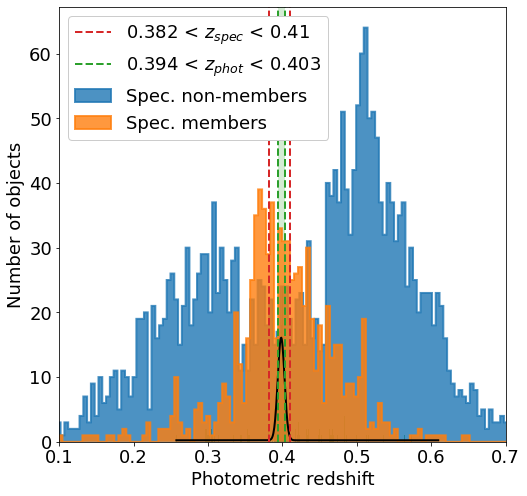

In [25]:
xlim = (0.1,.7)

plt.figure(figsize=(8,8))
plt.rcParams["font.size"] = 18

### Histogram
#hist_spec,  bins_spec,   patch_spec          = plt.hist(df_spec['ZSPEC'],bins=200, alpha=0.6, histtype='step', linewidth=2, facecolor='lime',    edgecolor='k',fill=True,label='Zspec distribution')
hist_spec_nc,bins_spec_nc,patch_spec_nc      = plt.hist(df_spec_noncluster['Z_BEST'],bins=600, alpha=0.8, histtype='step', linewidth=2, facecolor='tab:blue',fill=True,label='Spec. non-members')
#hist_spec_cp,   bins_spec_cp,   patch_spec_cp = plt.hist(df_spec_cluster_pure['Z_BEST'],bins=800, alpha=1, histtype='step', linewidth=2, facecolor='tab:blue',    edgecolor='k',fill=True,label='Spec. members - all galaxies')
hist_spec_c,   bins_spec_c,   patch_spec_c    = plt.hist(df_spec_cluster['Z_BEST'],bins=800, alpha=0.8, histtype='step', linewidth=2, facecolor='tab:orange',fill=True,label='Spec. members')


hist_spec_c,   bins_spec_c,   patch_spec_c = plt.hist(df_photo_cluster_rs['ZSPEC'][df_photo_cluster_rs['ZSPEC']>0],bins=600)



### Gaussian fit
# S/N cut
xdata_spec_c = (bins_spec_c[:-1] + bins_spec_c[1:]) / 2
ydata_spec_c = hist_spec_c
H_spec_c, A_spec_c, x0_spec_c, sigma_spec_c = gauss_fit(xdata_spec_c, ydata_spec_c)
FWHM_spec_c                           = 2.35482 * sigma_spec_c
print('The offset of the gaussian_spec_c baseline is', H_spec_c)
print('The center of the gaussian_run3 fit is %.3f'%x0_spec_c)
print('The sigma of the gaussian_run3 fit is %.3f'%sigma_spec_c)
print('The one sigma intervals of the gaussian_spec_c fit are %.3f and %.3f'%(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c))
print('The two sigma intervals of the gaussian_spec_c fit are %.3f and %.3f'%(x0_spec_c-2*sigma_spec_c,x0_spec_c+2*sigma_spec_c))
print('The FWHM of the gaussian_run3 fit is %.3f'%FWHM_spec_c)
print()
# Pure data
xdata_spec_cp = (bins_spec_cp[:-1] + bins_spec_cp[1:]) / 2
ydata_spec_cp = hist_spec_cp
H_spec_cp, A_spec_cp, x0_spec_cp, sigma_spec_cp = gauss_fit(xdata_spec_cp, ydata_spec_cp)
FWHM_spec_cp                           = 2.35482 * sigma_spec_cp
print('The offset of the gaussian_spec_cp baseline is', H_spec_cp)
print('The center of the gaussian_run3 fit is %.3f'%x0_spec_cp)
print('The sigma of the gaussian_run3 fit is %.3f'%sigma_spec_cp)
print('The one sigma intervals of the gaussian_spec_cp fit are %.3f and %.3f'%(x0_spec_cp-sigma_spec_cp,x0_spec_cp+sigma_spec_cp))
print('The two sigma intervals of the gaussian_spec_cp fit are %.3f and %.3f'%(x0_spec_cp-2*sigma_spec_cp,x0_spec_cp+2*sigma_spec_cp))
print('The FWHM of the gaussian_run3 fit is %.3f'%FWHM_spec_cp)
print()

# Gaussian curve
plt.plot(xdata_spec_c, gauss(xdata_spec_c, *gauss_fit(xdata_spec_c, ydata_spec_c)), '-',c='k',lw=2, label='')

# Spec intervals
plt.axvline(macs0416[0],lw=2,color='tab:red',ls='--',label=str(macs0416[0])+' < $z_{spec}$ < '+str(macs0416[1]))
plt.axvline(macs0416[1],lw=2,color='tab:red',ls='--',label='')



plt.axvspan(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c,color='tab:green',alpha=.2,lw=0)
plt.axvline(x0_spec_c-sigma_spec_c,ls='--',lw=2,color='tab:green',label='%.3f < $z_{phot}$ < %.3f'%(x0_spec_c-sigma_spec_c,x0_spec_c+sigma_spec_c))
plt.axvline(x0_spec_c+sigma_spec_c,ls='--',lw=2,color='tab:green')

plt.xlim(xlim)
plt.xlabel('Photometric redshift')
plt.ylabel('Number of objects')
plt.legend(framealpha=1,loc=2)


# 2b. Color-color diagram

In [ ]:
plt.figure(figsize=(8,8))
plt.rcParams["font.size"] = 14
plt.plot(df_photo_cluster_rs['MAG_AUTO_g']-df_photo_cluster_rs['MAG_AUTO_i'], df_photo_cluster_rs['MAG_AP3_r']-df_photo_cluster_rs['MAG_AP3_j'],'.', c='red', alpha=.9,label='Red sequence: '+str(len(df_photo_cluster_rs))+' galaxies')

plt.plot(mag_g_photocluster_colmag_up-mag_i_photocluster_colmag_up, mag_r_photocluster_colmag_up-mag_j_photocluster_colmag_up,'.', c='gray', alpha=0.3,label='')
plt.plot(mag_g_photocluster_colmag_down-mag_i_photocluster_colmag_down, mag_r_photocluster_colmag_down-mag_j_photocluster_colmag_down,'.', c='gray', alpha=0.3,label='%.3f < $z_{photo}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))

plt.plot(df_spec_cluster['MAG_AUTO_g']-df_spec_cluster['MAG_AUTO_i'], df_spec_cluster['MAG_AP3_r']-df_spec_cluster['MAG_AP3_j'], '*',c='k', alpha=.7,label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))
plt.plot(mag_g_up  -mag_i_up,   mag_r_up  -mag_j_up,'.', c='magenta', alpha=0.9,label='')
plt.plot(mag_g_down-mag_i_down, mag_r_down-mag_j_down,'.', c='lime', alpha=0.9,label='')

plt.xlabel("MAG g   -   MAG i")
plt.ylabel("MAG r   -   MAG j")
plt.xlim(0,3.5)
plt.ylim(-1.,2.5)
plt.legend()
#plt.gca().invert_xaxis()

# 2.c Completeness and purity for the red sequence

In [ ]:
#print('Run3 + RED SEQUENCE')
#completeness_purity(df_photo_cluster_rs['ZSPEC'],df_photo_cluster_rs['Z_BEST'],macs0416,photo_macs0416)


In [1063]:
print('Run3 + RED SEQUENCE (only red spectroscopic galaxies)')
completeness_purity(df_photo_cluster_rs['ZSPEC'],df_photo_cluster_rs['Z_BEST'],macs0416,photo_macs0416)

print()
print()
print()

print('Run3 + RED SEQUENCE (all spectroscopic galaxies)')
completeness_purity(df_photo_cluster['ZSPEC'],df_photo_cluster_rs['Z_BEST'],macs0416,photo_macs0416)




Run3 + RED SEQUENCE (only red spectroscopic galaxies)
Spectroscopic interval: 0.382 < z < 0.410
Galaxies having z_spec in the spectroscopic interval:  318

Photometric interval: 0.348 < z < 0.453
Galaxies having z_phot in the photometric interval:  1374

Galaxies having z_phot in the photometric interval and any z_spec: 447
Galaxies having z_phot in the photometric interval and z_spec in the spectroscopic interval: 318

COMPLETEZZA:
Da tutti i membri spettroscopici (318), quanti sto recuperando come membri fotometrici? 318 (100.0%)

PUREZZA:
Da tutti i membri fotometrici che hanno z-spec (447), quanti sono membri spettroscopici del cluster? 318 (71.1%)

0.348 < z < 0.453 : 100.00 comp and 71.14 pur



Run3 + RED SEQUENCE (all spectroscopic galaxies)
Spectroscopic interval: 0.382 < z < 0.410
Galaxies having z_spec in the spectroscopic interval:  506

Photometric interval: 0.348 < z < 0.453
Galaxies having z_phot in the photometric interval:  1374

Galaxies having z_phot in the photometr

(62.84584980237154, 71.14093959731544)

# Rs grid

In [ ]:
comply_rs = []
pury_rs   = []
for i in np.arange(0.02,0.18,0.004):
    tmp1_rs,tmp2_rs = completeness_purity(df_photo_cluster_rs['ZSPEC'],df_photo_cluster_rs['Z_BEST'],macs0416,(x0_spec_c-i,x0_spec_c+i),verbose=False)
    comply_rs.append(tmp1_rs)
    pury_rs.append(tmp2_rs)
comply_rs = np.array(comply_rs)
pury_rs = np.array(pury_rs)


plt.figure(figsize=(8,8))
plt.plot(np.arange(0.02,0.18,0.004),comply_rs,'.',label='Completeness S/N_nir > 5')

plt.plot(np.arange(0.02,0.18,0.004),pury_rs,'.',label='Purity S/N_nir > 5')

plt.axvline(sigma_spec_c,ls='--',lw=1,color='lime',label='1$\sigma$ SN_nir')

plt.ylabel('Completeness / Purity [%]')
plt.xlabel('$\Delta$z')
plt.legend()

# 3. Environment definition

In [112]:
_="""plt.style.use('default')
plt.figure(figsize=(10,10))
plt.rcParams["font.size"] = 20

plt.plot(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'], '.',alpha=0.7,c='tab:blue',label='%.3f < $z_{photo}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))
plt.plot(df_spec_cluster['RA_r'],df_spec_cluster['DEC_r'],'x',alpha=0.5,c='tab:orange',label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))

plt.legend()
fig = plt.gcf()
ax  = fig.gca()
ax.add_artist(patches.Circle((df_spec_cluster['RA_r'].mean(), df_spec_cluster['DEC_r'].mean()), 0.24,fill=False,color='r',lw=3))    
plt.gca().invert_xaxis()
plt.tick_params(top=True, right=True,direction='in')
plt.xlabel('RA [deg]')
plt.ylabel('DEC [deg]')"""



# Gaussian kernel 

In [1381]:
def number_neighbors_into_radius(ra,dec,r_input,threshold_n,save):
    # ra, dec in degrees
    # r in kpc
    r = (r_input*0.0945)/1820 # 0.0945 is the virial radius in deg, 1820 is the virial radius in kpc
    n = np.empty(len(ra))
    for i in range(len(ra)):
        count = 0
        for j in range(len(ra)):
            distance = ((ra[i]-ra[j])**2+(dec[i]-dec[j])**2)**0.5
            if distance < r:
                count += 1
        n[i] = count
    
    
    plt.figure(figsize=(14,14))
    plt.scatter(ra[n>threshold_n],dec[n>threshold_n],
                marker='o',s=4,c=n[n>threshold_n])
    plt.title('Galaxies with %i neighbours whithin %i Kpc'%(threshold_n,r_input))
    #plt.scatter(ra,dec,marker='o',s=4,c=n)
    plt.colorbar(label=r'Number of neighbors whithin %i kpc'%r_input)
    plt.xlim(63.4,64.7)
    plt.ylim(-24.7,-23.6)
    plt.gca().invert_xaxis()
    plt.xlabel('RA')
    plt.ylabel('DEC')
    if save != False:
        plt.savefig('gal_'+str(threshold_n)+'_into_'+str(r_input)+'.png')
    return n


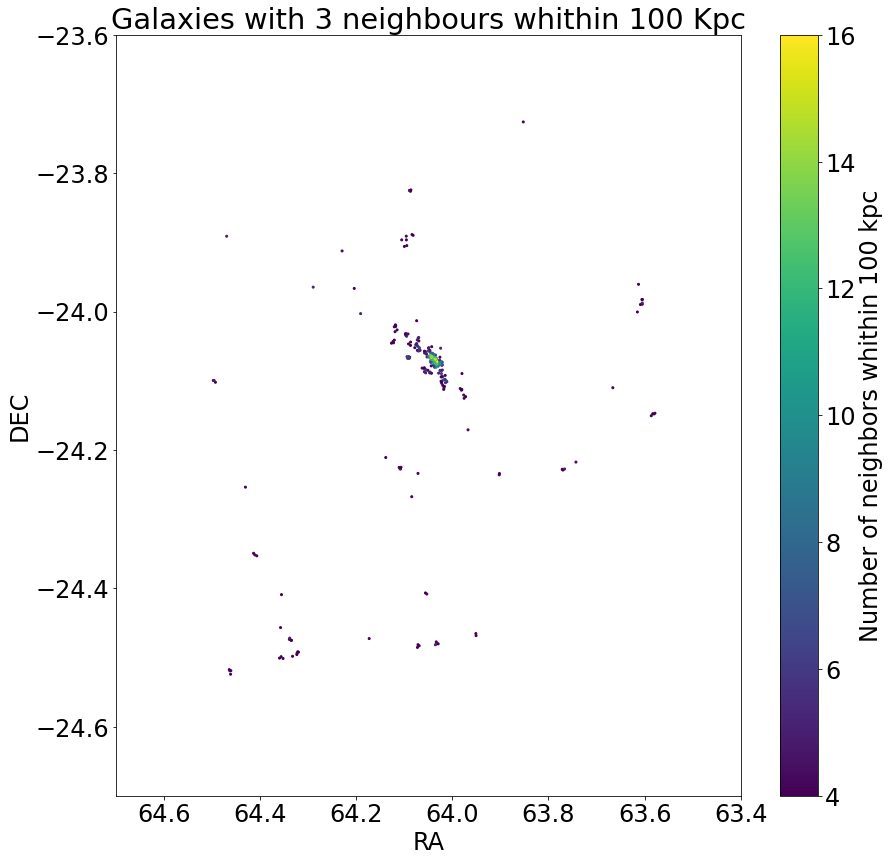

In [1382]:
neighbors_into_r = number_neighbors_into_radius(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,100,3,True)

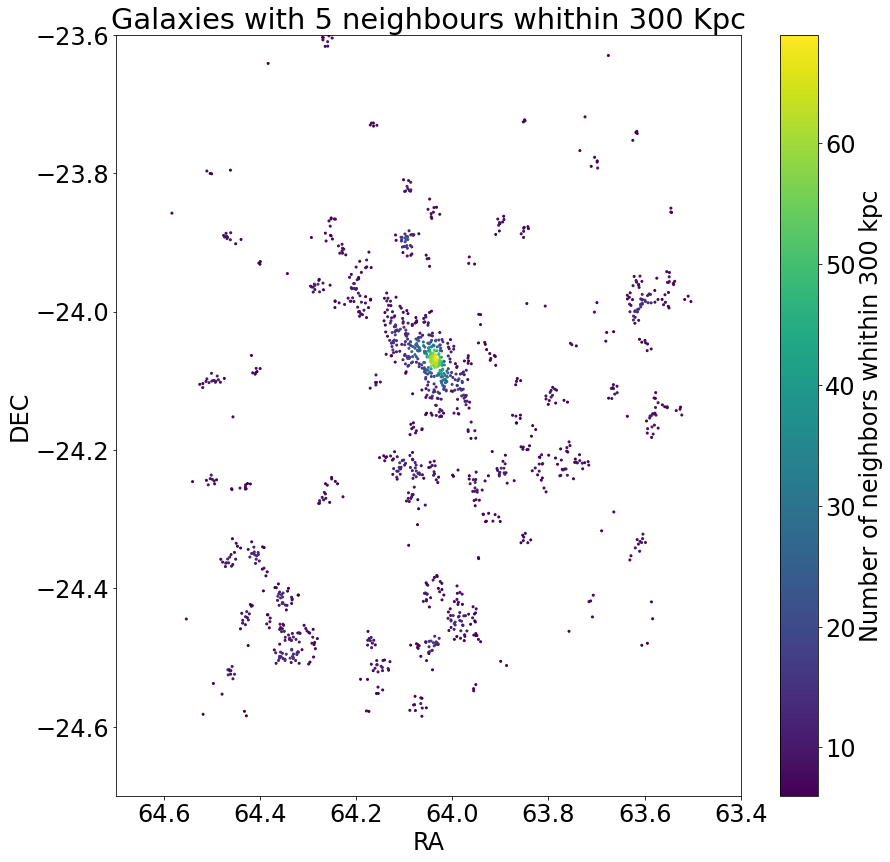

In [1383]:
neighbors_into_r = number_neighbors_into_radius(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,300,5,True)

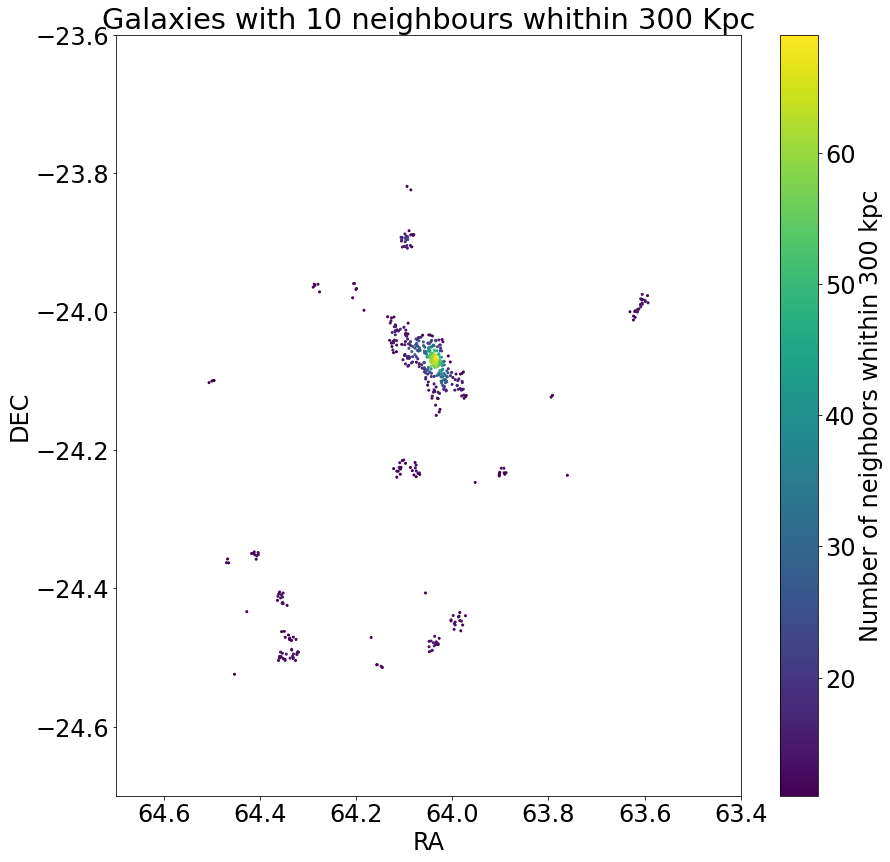

In [1384]:
neighbors_into_r = number_neighbors_into_radius(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,300,10,True)

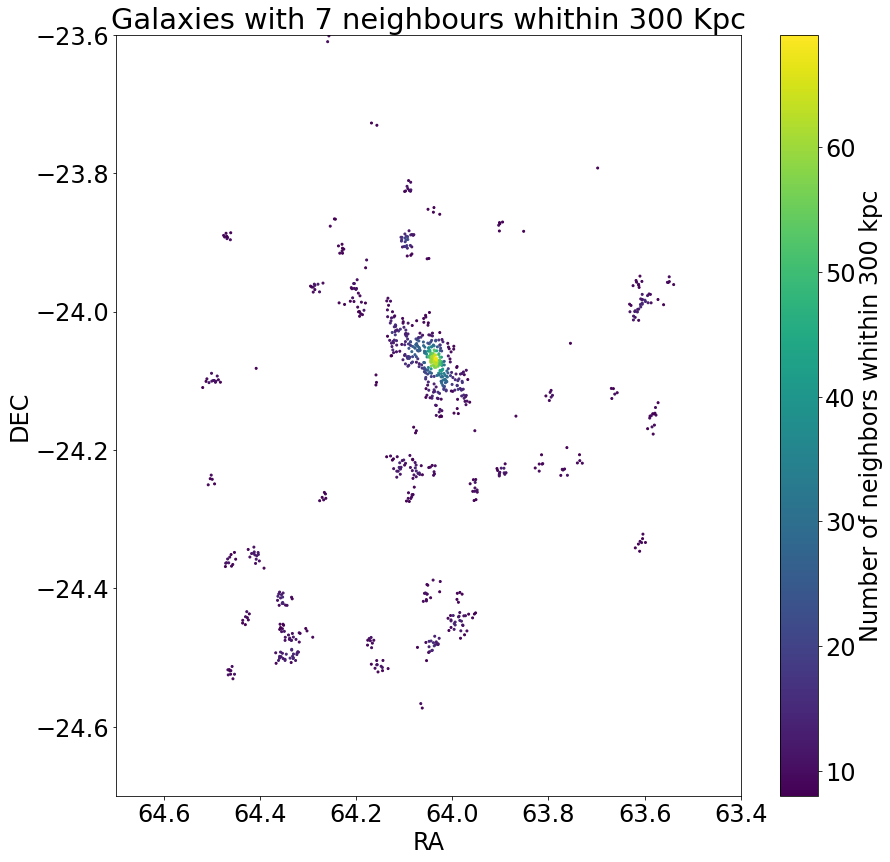

In [1385]:
neighbors_into_r = number_neighbors_into_radius(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,300,7,True)

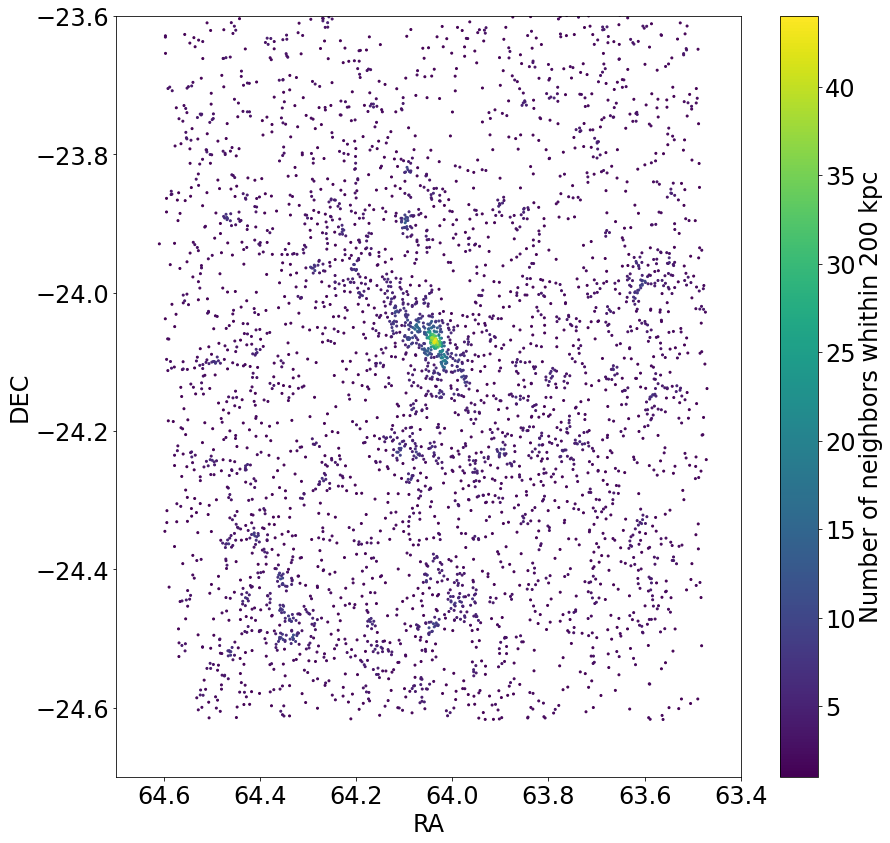

In [1378]:
neighbors_into_r = number_neighbors_into_radius(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,200,3,True)

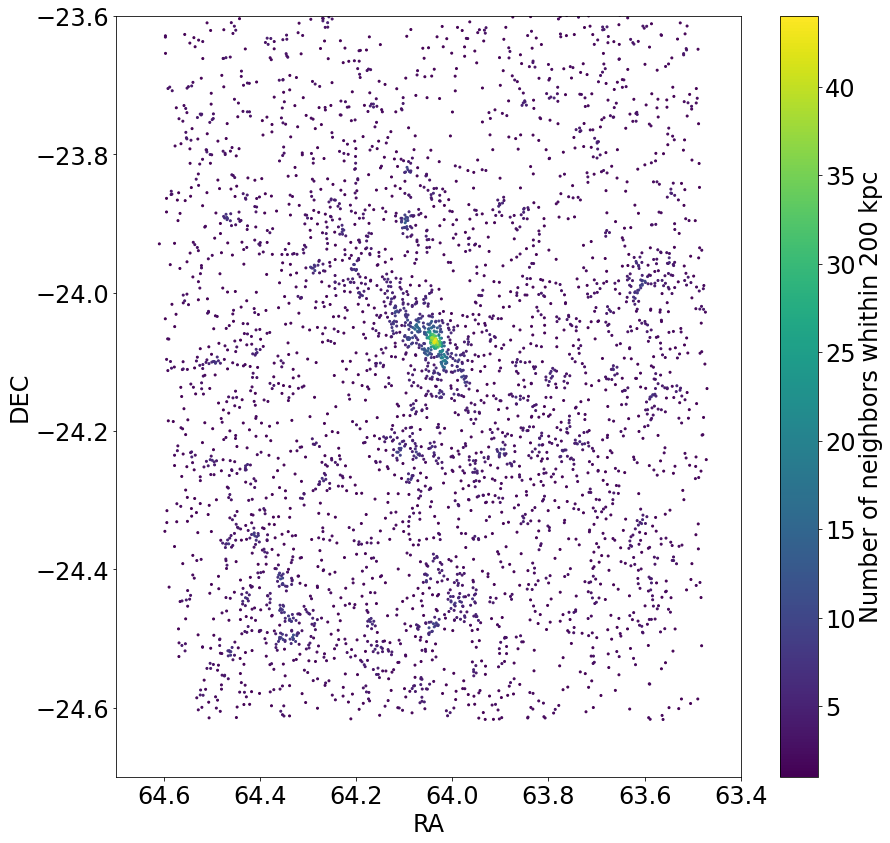

In [1379]:
neighbors_into_r = number_neighbors_into_radius(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,200,5,True)

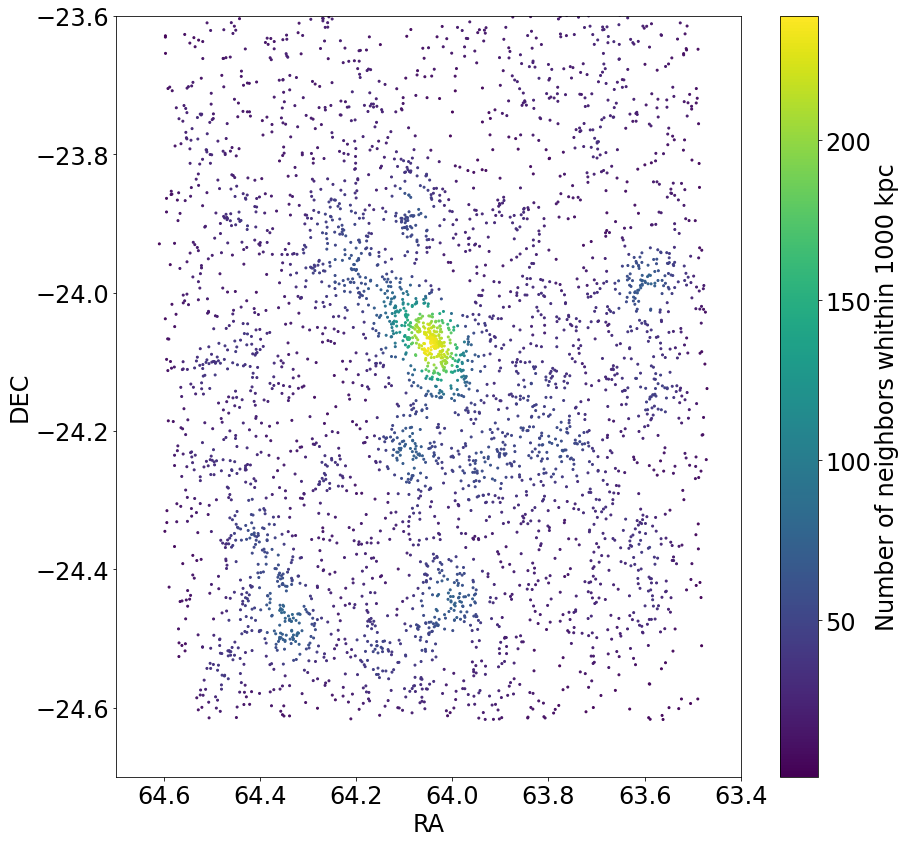

In [1380]:
neighbors_into_r = number_neighbors_into_radius(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,1000,1,True)

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: y, shade. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


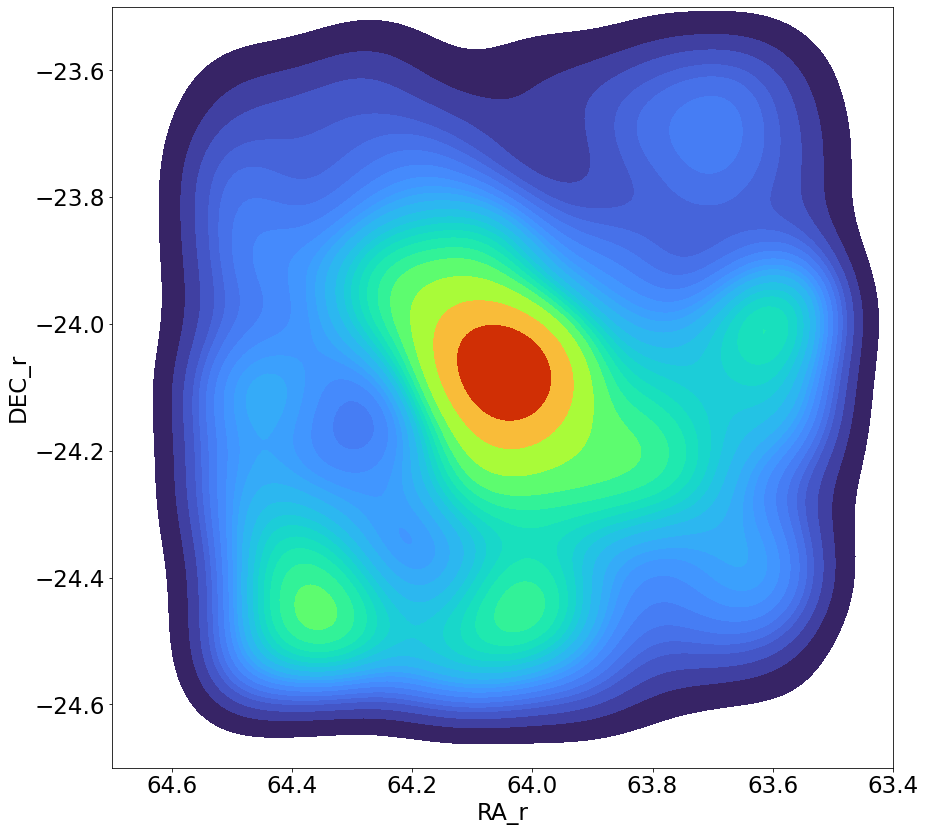

In [1217]:

plt.figure(figsize=(14,14))

sns.kdeplot(df_photo_cluster['RA_r'], df_photo_cluster['DEC_r'],neighbors_into_r.all(),cmap='turbo',levels=22)
#plt.title('Galaxies with %i neighbours whithin %i Kpc'%(threshold_n,r_input))
plt.xlim(63.4,64.7)
plt.ylim(-24.7,-23.5)
plt.gca().invert_xaxis()


In [1361]:
def distance_n_neigh(ra,dec,n,save):
    # ra, dec in degrees
    # n is the number of neighbors to search
    
    dist = np.empty(len(ra))
    for i in range(len(ra)):
        dist_temp = np.empty(len(ra))
        for j in range(len(ra)):
            dist_temp[j] = ((ra[i]-ra[j])**2+(dec[i]-dec[j])**2)**0.5
        dist_temp.sort()
        dist[i]= dist_temp[n+1]
    dist = (dist*1820)/0.0945 # 0.0945 is the virial radius in deg, 1820 is the virial radius in kpc
    
    plt.figure(figsize=(12,12))
    plt.scatter(ra,dec,marker='o',s=4,c=dist,cmap='turbo')
    plt.colorbar(label=r'Distance [kpc] to the %i neighbour'%n)
    plt.xlim(63.4,64.7)
    plt.ylim(-24.7,-23.6)
    plt.gca().invert_xaxis()
    plt.xlabel('RA')
    plt.ylabel('DEC')

#     if save != False:
#         plt.savefig('gal_'+str(threshold_n)+'_into_'+str(r_input)+'.png')
    return dist



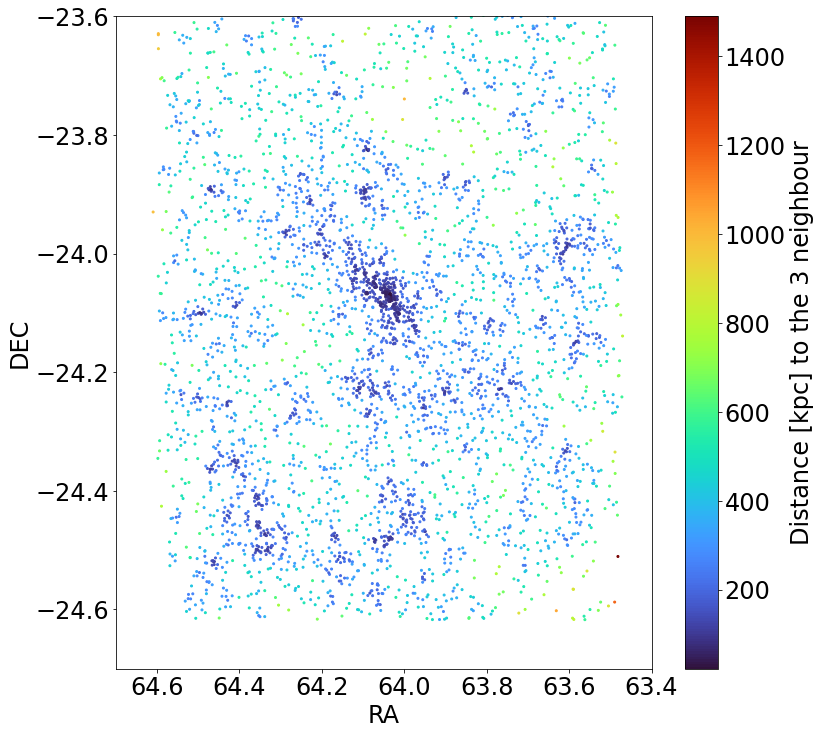

In [1362]:
dist_prova = distance_n_neigh(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,3,False)


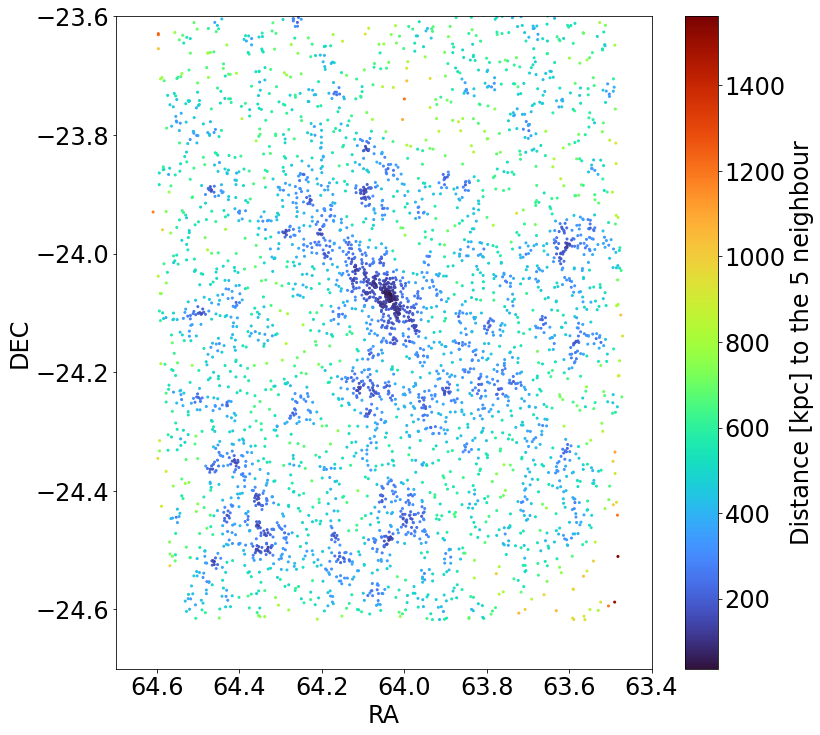

In [1363]:
dist_prova = distance_n_neigh(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,5,False)
# 5 / pi*r**2


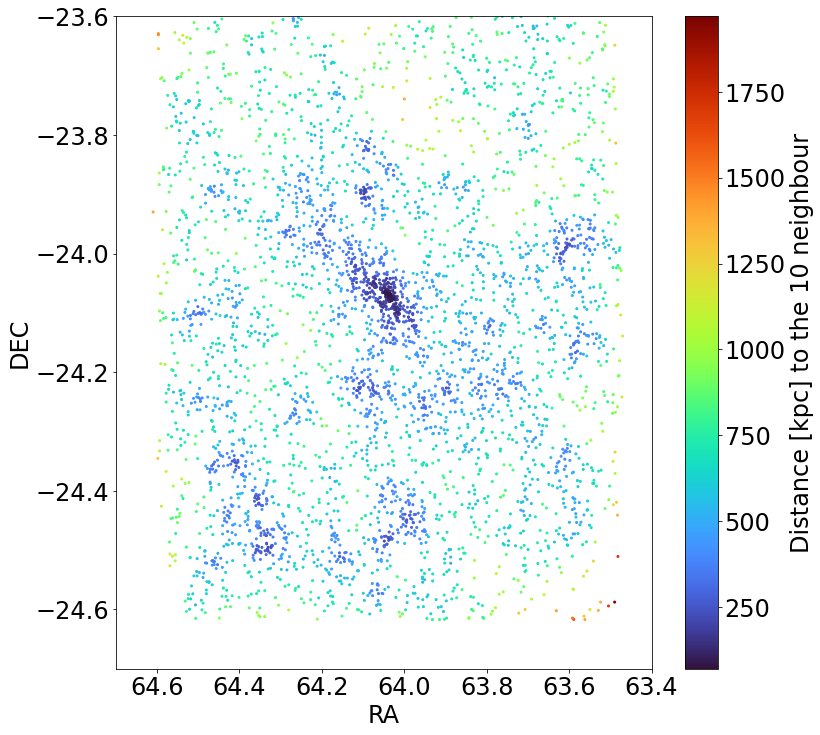

In [1364]:
dist_prova = distance_n_neigh(df_photo_cluster['RA_r'].values,df_photo_cluster['DEC_r'].values,10,False)


In [ ]:
(1187.25*2)/195.42

In [1345]:
3600/12.15

296.2962962962963

In [1348]:
12.25/15

0.8166666666666667

In [1349]:
(5.31/12.15)*2

0.874074074074074

In [1473]:
# First step: making a NARROW histogram
# 200 bins means nearly 0.1 Mpc cells for this first histogram!
# 65 bins means 1 arcmin^2 cells for this histogram!
# 67x66 bins is a better way to do the histogram!
#cells_densfield = (670,660)
#cells_densfield = (223,220)
cells_densfield = (67,66)
#cells_densfield = (50,50)

# ALL GALAXIES
hist_photocluster, dec_edges, ra_edges = np.histogram2d(df_photo_cluster['DEC_r'],df_photo_cluster['RA_r'],bins=cells_densfield)

# RED SEQUENCE
hist_photocluster_rs, dec_edges_rs, ra_edges_rs = np.histogram2d(df_photo_cluster_rs['DEC_r'],df_photo_cluster_rs['RA_r'],bins=cells_densfield)
# BLUE CLOUD
hist_photocluster_bc, dec_edges_bc, ra_edges_bc = np.histogram2d(df_photo_cluster_bc['DEC_r'],df_photo_cluster_bc['RA_r'],bins=cells_densfield)

# 67,66 means 300 kpc cells
# 134,132 means 150 kpc cells
_="""print(ra_edges[1:].max()-ra_edges[1:].min())
print('number of ra bins ',(ra_edges[1:].max()-ra_edges[1:].min())*60)
print(dec_edges[1:].max()-dec_edges[1:].min())
print('number of dec bins ',(dec_edges[1:].max()-dec_edges[1:].min())*60)

print(ra_edges[1:].shape)"""
ra_central = (ra_edges[:-1]+ra_edges[1:])/2
dec_central = (dec_edges[:-1]+dec_edges[1:])/2
print(ra_central.shape,dec_central.shape)

(66,) (67,)


In [1474]:
def overdens2d(hist_photocluster):
    rho_i    = hist_photocluster
    rho_mean = hist_photocluster.mean()
    print('Mean density: ',rho_mean)
    rho      = (rho_i/rho_mean)-1
    return rho

overdens_photocluster    = overdens2d(hist_photocluster)
overdens_photocluster_rs = overdens2d(hist_photocluster_rs)
overdens_photocluster_bc = overdens2d(hist_photocluster_bc)



Mean density:  0.9197195838986884
Mean density:  0.310719131614654
Mean density:  0.6001809136137495


In [1475]:
# Second step: smoothing the histogram with a kernel
# sigma=10 means that the gaussian kernel sigma is 10 pixels, or 1 Mpc

sig_kernel = 2
kernel_photocluster    = scipy.ndimage.gaussian_filter(hist_photocluster,sigma=sig_kernel)
kernel_photocluster_rs = scipy.ndimage.gaussian_filter(hist_photocluster_rs,sigma=sig_kernel)
kernel_photocluster_bc = scipy.ndimage.gaussian_filter(hist_photocluster_bc,sigma=sig_kernel)

kernel_overdens_photocluster    = scipy.ndimage.gaussian_filter(overdens_photocluster,sigma=sig_kernel)
kernel_overdens_photocluster_rs = scipy.ndimage.gaussian_filter(overdens_photocluster_rs,sigma=sig_kernel)
kernel_overdens_photocluster_bc = scipy.ndimage.gaussian_filter(overdens_photocluster_bc,sigma=sig_kernel)



In [1476]:
print(hist_photocluster.shape,kernel_photocluster.shape)

(67, 66) (67, 66)


In [1477]:

    
n_gal    = gal_incell(kernel_photocluster,dec_edges,ra_edges,df_photo_cluster['DEC_r'].to_numpy(),df_photo_cluster['RA_r'].to_numpy())
n_gal_rs = gal_incell(kernel_photocluster_rs,dec_edges_rs,ra_edges_rs,df_photo_cluster_rs['DEC_r'].to_numpy(),df_photo_cluster_rs['RA_r'].to_numpy())
n_gal_bc = gal_incell(kernel_photocluster_bc,dec_edges_bc,ra_edges_bc,df_photo_cluster_bc['DEC_r'].to_numpy(),df_photo_cluster_bc['RA_r'].to_numpy())

delta    = gal_incell(kernel_overdens_photocluster,dec_edges,ra_edges,df_photo_cluster['DEC_r'].to_numpy(),df_photo_cluster['RA_r'].to_numpy())
delta_rs = gal_incell(kernel_overdens_photocluster_rs,dec_edges_rs,ra_edges_rs,df_photo_cluster_rs['DEC_r'].to_numpy(),df_photo_cluster_rs['RA_r'].to_numpy())
delta_bc = gal_incell(kernel_overdens_photocluster_bc,dec_edges_bc,ra_edges_bc,df_photo_cluster_bc['DEC_r'].to_numpy(),df_photo_cluster_bc['RA_r'].to_numpy())

#delta_nk    = gal_incell(overdens_photocluster,dec_edges,ra_edges,df_photo_cluster['DEC_r'].to_numpy(),df_photo_cluster['RA_r'].to_numpy())
#delta_rs_nk = gal_incell(overdens_photocluster_rs,dec_edges_rs,ra_edges_rs,df_photo_cluster_rs['DEC_r'].to_numpy(),df_photo_cluster_rs['RA_r'].to_numpy())





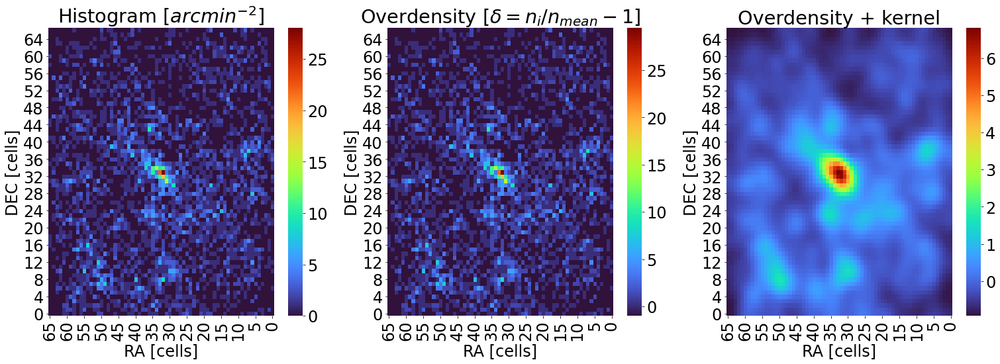

In [1478]:
plt.figure(figsize=(26,8))

plt.subplot(131)
fig = plt.gcf()
ax  = fig.gca()
plt.title(r'Histogram [$arcmin^{-2}$]')
sns.heatmap(hist_photocluster,cmap='turbo',label='ffff')
plt.xlabel('RA [cells]')
plt.ylabel('DEC [cells]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

plt.subplot(132)
fig = plt.gcf()
ax  = fig.gca()
plt.title(r'Overdensity [$\delta = n_i/n_{mean}-1$]')
sns.heatmap(overdens_photocluster,cmap='turbo')
plt.xlabel('RA [cells]')
plt.ylabel('DEC [cells]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()


plt.subplot(133)
fig = plt.gcf()
ax  = fig.gca()
plt.title(r'Overdensity + kernel')
sns.heatmap(kernel_overdens_photocluster,cmap='turbo')
plt.xlabel('RA [cells]')
plt.ylabel('DEC [cells]')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

#plt.savefig('building_densfield_300kpc.png')


In [1479]:
"""plt.figure(figsize=(14,14))

plt.subplot(221)
fig = plt.gcf()
ax  = fig.gca()
sns.heatmap(hist_photocluster,cmap='turbo')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()


plt.subplot(222)
fig = plt.gcf()
ax  = fig.gca()
sns.heatmap(kernel_overdens_photocluster,cmap='turbo')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

plt.subplot(224)
fig = plt.gcf()
ax  = fig.gca()
sns.heatmap(kernel_overdens_photocluster,vmax=5,cmap='turbo')
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()"""

"plt.figure(figsize=(14,14))\n\nplt.subplot(221)\nfig = plt.gcf()\nax  = fig.gca()\nsns.heatmap(hist_photocluster,cmap='turbo')\nplt.gca().invert_xaxis()\nplt.gca().invert_yaxis()\n\n\nplt.subplot(222)\nfig = plt.gcf()\nax  = fig.gca()\nsns.heatmap(kernel_overdens_photocluster,cmap='turbo')\nplt.gca().invert_xaxis()\nplt.gca().invert_yaxis()\n\nplt.subplot(224)\nfig = plt.gcf()\nax  = fig.gca()\nsns.heatmap(kernel_overdens_photocluster,vmax=5,cmap='turbo')\nplt.gca().invert_xaxis()\nplt.gca().invert_yaxis()"

Text(91.0, 0.5, 'DEC [cells]')

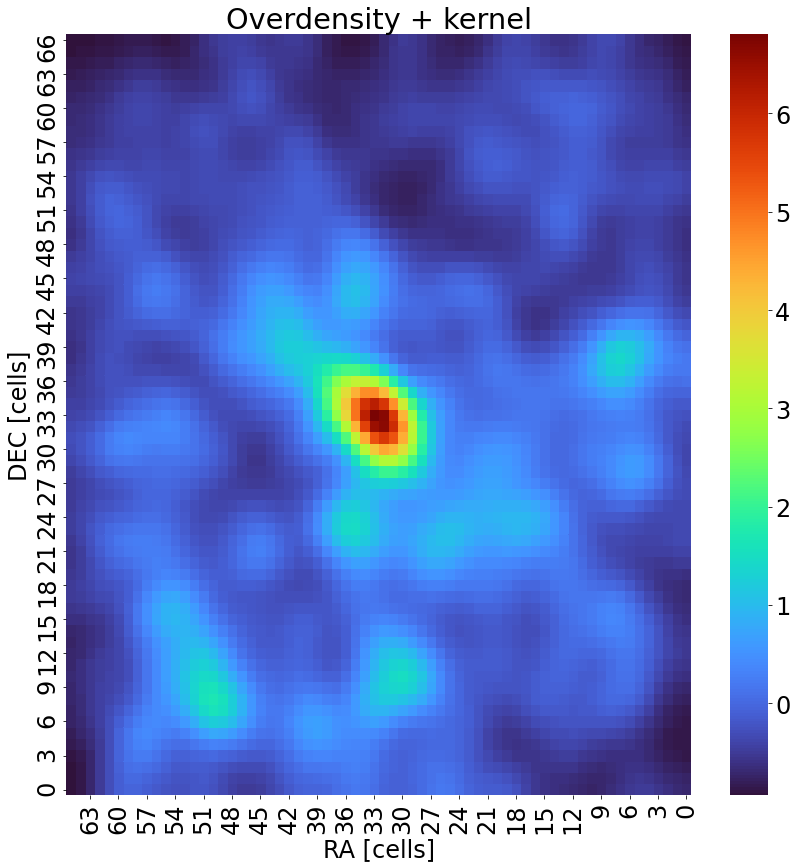

In [1483]:
plt.figure(figsize=(14,14))

fig = plt.gcf()
ax  = fig.gca()


#sns.heatmap(hist_photocluster,cmap='turbo',zorder=2)
#plt.title(r'Histogram [$arcmin^{-2}$]')

# plt.title(r'Overdensity [$\delta = n_i/n_{mean}-1$]')
# sns.heatmap(overdens_photocluster,cmap='turbo')

plt.title(r'Overdensity + kernel')
sns.heatmap(kernel_overdens_photocluster,cmap='turbo')

plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

plt.xlabel('RA [cells]')
plt.ylabel('DEC [cells]')

# Plot galaxies x cell

In [206]:
_="""plt.figure(figsize=(12,20))
plt.rcParams["font.size"] = 24
plt.subplot(211)
fig = plt.gcf()
ax  = fig.gca()
plt.contourf(ra_central, dec_central,kernel_photocluster_rs,levels=22,cmap='turbo')
plt.colorbar(label="Kernel density $\,(arcmin^{-2})$")
#plt.colorbar(plt.scatter(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],s=n_gal_rs, marker='o', c=n_gal_rs,cmap=reversed_color_map),label="Kernel density - galaxies $\,(arcmin^{-2})$")
#plt.title('Red sequence + %.3f < $z_{photo}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))
plt.xlabel('RA')
plt.ylabel('DEC')
plt.gca().invert_xaxis()


plt.subplot(212)
fig = plt.gcf()
ax  = fig.gca()

color_map = plt.cm.get_cmap('turbo')
reversed_color_map = color_map.reversed()
plt.contourf(ra_central, dec_central,kernel_photocluster,levels=22,cmap='turbo')
plt.colorbar(label="Kernel density $\,(arcmin^{-2})$")
#plt.colorbar(plt.scatter(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],s=n_gal, marker='o', c=n_gal,cmap=reversed_color_map),label="Kernel density - galaxies $\,(arcmin^{-2})$")
#plt.title('All galaxies + %.3f < $z_{photo}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))
plt.xlabel('RA')
plt.ylabel('DEC')
plt.gca().invert_xaxis()


plt.tight_layout()
##plt.savefig('density_plot_allrs_1.png')
"""

# Plot overdensity

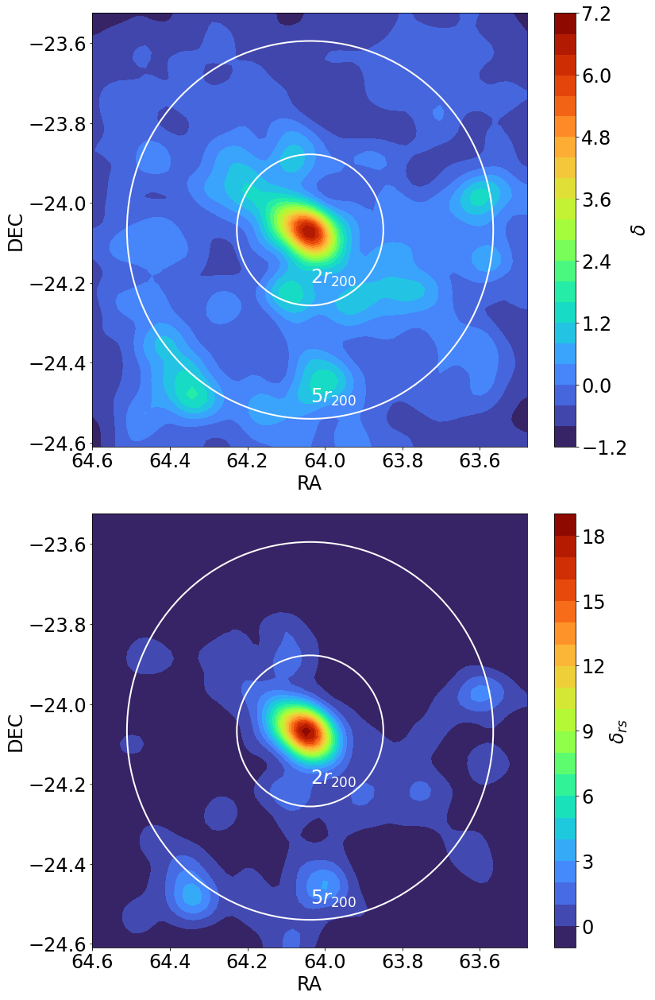

In [227]:
plt.figure(figsize=(12,18))
plt.rcParams["font.size"] = 24

plt.subplot(211)
fig = plt.gcf()
ax  = fig.gca()
color_map = plt.cm.get_cmap('turbo')
reversed_color_map = color_map.reversed()
plt.contourf(ra_central, dec_central,kernel_overdens_photocluster,levels=22,cmap='turbo')


#plt.contourf(ra_central, dec_central,overdens_photocluster,levels=50,cmap='turbo')
plt.colorbar(label=r"$\delta$")
ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='w',lw=2,ls='-'))    
ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='w',lw=2))    

ax.text(64.0380, -24.2, r'$2r_{200}$', style='italic',color='w')
ax.text(64.0380, -24.5, r'$5r_{200}$', style='italic',color='w')
#plt.scatter(df_photo_cluster['RA_r'][bool_all_1],df_photo_cluster['DEC_r'][bool_all_1],marker='o',s=4,zorder=2,color='tab:pink',label=r'$-1<\delta<0$')
#plt.scatter(df_photo_cluster['RA_r'][bool_all_2],df_photo_cluster['DEC_r'][bool_all_2],marker='o',s=4,zorder=2,color='tab:cyan',label=r'  $0<\delta<1$')
#plt.scatter(df_photo_cluster['RA_r'][bool_all_3],df_photo_cluster['DEC_r'][bool_all_3],marker='o',s=4,zorder=2,color='olive',label=r'        $\delta>1$')

#plt.colorbar(plt.scatter(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],s=n_gal, marker='o', c=n_gal,cmap=reversed_color_map),label="Kernel density - galaxies $\,(arcmin^{-2})$")
#plt.title('All galaxies + %.3f < $z_{photo}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))
plt.xlabel('RA')
plt.ylabel('DEC')
plt.gca().invert_xaxis()
plt.tight_layout()





plt.subplot(212)
fig = plt.gcf()
ax  = fig.gca()
plt.contourf(ra_central, dec_central,kernel_overdens_photocluster_rs,levels=22,cmap='turbo')
#plt.contourf(ra_central, dec_central,overdens_photocluster_rs,levels=22,cmap='turbo')
plt.colorbar(label=r"$\delta_{rs}$")

ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='w',lw=2,ls='-'))    
ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='w',lw=2))    
ax.text(64.0380, -24.2, r'$2r_{200}$', style='italic',color='w')
ax.text(64.0380, -24.5, r'$5r_{200}$', style='italic',color='w')
#plt.colorbar(plt.scatter(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],s=n_gal_rs, marker='o', c=n_gal_rs,cmap=reversed_color_map),label="Kernel density - galaxies $\,(arcmin^{-2})$")
#plt.title('Red sequence + %.3f < $z_{photo}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))
plt.xlabel('RA')
plt.ylabel('DEC')
plt.gca().invert_xaxis()
plt.tight_layout()

#plt.savefig('overdensity_plot_allrs_1_vmax3.png')

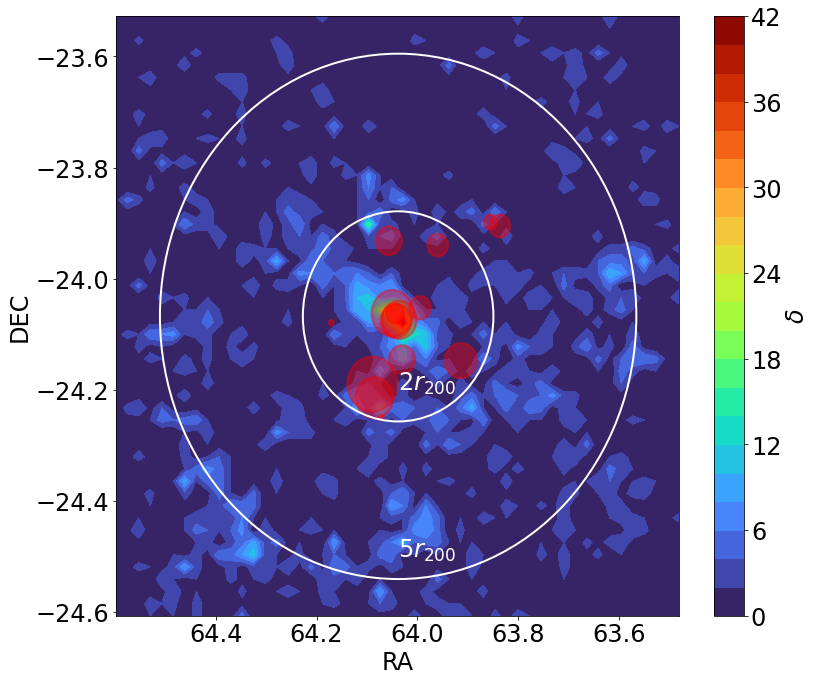

In [1289]:
plt.figure(figsize=(12,10))
plt.rcParams["font.size"] = 24

fig = plt.gcf()
ax  = fig.gca()
color_map = plt.cm.get_cmap('turbo')
reversed_color_map = color_map.reversed()
plt.contourf(ra_central, dec_central,hist_photocluster,levels=22,cmap='turbo')
#sns.heatmap(hist_photocluster,cmap='turbo',zorder=2)




ax.add_artist(patches.Circle((63.91375, -24.14738889), (0.031786),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.04916667, -24.06180556), (0.041758),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.07166667, -24.24969444), (0.005194),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((63.99458333, -24.05205556), (0.021242),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.085, -24.21422222), (0.037083),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((63.83625, -23.905), (0.020567),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.04375, -24.06263889), (0.017866),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((63.855, -23.89772222), (0.013348),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.03583333, -24.07366667), (0.034590),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((63.95958333, -23.93944444), (0.020567),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.05625, -23.93166667), (0.025865),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 

ax.add_artist(patches.Circle((64.0425, -24.07580556), (0.030695),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 

ax.add_artist(patches.Circle((64.03041667, -24.14541667), (0.026125),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.08916667, -24.18925), (0.049652),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.17041667, -24.07930556), (0.005194),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
plt.colorbar(label=r"$\delta$")
ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='w',lw=2,ls='-'))    
ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='w',lw=2))    

ax.text(64.0380, -24.2, r'$2r_{200}$', style='italic',color='w')
ax.text(64.0380, -24.5, r'$5r_{200}$', style='italic',color='w')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.gca().invert_xaxis()
plt.tight_layout()





# Single plot

In [ ]:
_="""color_map = plt.cm.get_cmap('turbo')
reversed_color_map = color_map.reversed()

plt.figure(figsize=(14,12))
plt.rcParams["font.size"] = 24
fig = plt.gcf()
ax  = fig.gca()

"All galaxies"
plt.contourf(ra_central, dec_central,kernel_photocluster,levels=22,cmap='turbo')
#plt.colorbar(label="Kernel density $\,(arcmin^{-2})$")

plt.scatter(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],s=n_gal, marker='o', c=n_gal,cmap=reversed_color_map)
plt.colorbar(label="Kernel density - galaxies $\,(arcmin^{-2})$")
#plt.title('All galaxies + %.3f < $z_{photo}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))


#Red sequence
#plt.contourf(ra_central, dec_central,kernel_photocluster_rs,levels=22,cmap='turbo')
#plt.colorbar(label="Kernel density $\,(arcmin^{-2})$")
#plt.colorbar(plt.scatter(game_0416_redsequence['RA_r'],game_0416_redsequence['DEC_r'],s=n_gal_rs, marker='o', c=n_gal_rs,cmap=reversed_color_map),label="Kernel density - galaxies $\,(arcmin^{-2})$")
#plt.title('Red sequence + %.3f < $z_{photo}$ < %.3f'%(photo_macs0416[0],photo_macs0416[1]))

#ax.add_artist(patches.Circle((game_0416_2E_b['RA_r'][zspec_cluster].mean(), game_0416_2E_b['DEC_r'][zspec_cluster].mean()), 0.24,fill=False,color='r',lw=3))    
#ax.add_artist(patches.Circle((game_0416_2E_b['RA_r'][zspec_cluster].mean(), game_0416_2E_b['DEC_r'][zspec_cluster].mean()), 0.55,fill=False,color='r',lw=3))    

#Blue cloud
#plt.contourf(ra_central, dec_central,kernel_overdens_photocluster_bc,levels=22,cmap='turbo')
#plt.colorbar(label="Kernel density $\,(arcmin^{-2})$")
#plt.colorbar(label=r"Density contrast ($\delta=\rho/\bar{\rho}-1$)")

plt.xlabel('RA')
plt.ylabel('DEC')
plt.gca().invert_xaxis()
#plt.savefig('density_plot_1.png')
"""

In [ ]:

# COL TAGLIO S/N_nir>5 passiamo da 5500 photo cluster members a 3684
# e nella red sequence da 1702 a 1206

# Overdensity

In [ ]:
_="""# Technical details
params = {'cell_size':0.5,              # Side of the cell in Mpc
         'cluster_definition':5}      # Min number of galaxies inside a cell for defining a cluster}

# Cosmology assumed: Planck18 
cosmo_params = {'non linear': 'halofit',
        'output': 'mPk',
        'P_k_max_h/Mpc': 5,
        'A_s' : 2.0968e-9,
        'YHe' : 0.2454,
        'n_s' : 0.9652,
        'z_pk': 0.8,
        'h'   : 0.6777,
        'Omega_b'  : 0.048206,
        'Omega_cdm': 0.258909 }

def box_2d(ra, dec, z_mean, params, cosmo_params):
    Generates a 2d squared grid in comoving coordinates

    Om0 = cosmo_params['Omega_cdm']+cosmo_params['Omega_b']
    C   = cosmo(H0=cosmo_params['h']*100,Om0=Om0)  
    #C   = cosmo(H0=100,Om0=Om0)  

    com_ang_dist    = C.angular_diameter_distance(z_mean).value/(180/np.pi)
    number_of_cells = int(com_ang_dist/params['cell_size'])
    step            = (ra.max()-ra.min())/number_of_cells
    bins            = (np.arange(dec.min(),dec.max(),step),np.arange(ra.min(),ra.max(),step))
    
    rho_mean = len(ra)/(number_of_cells**2)
    print('number_of_cells: ',number_of_cells)
    print(rho_mean)
    
    rho_i,dec_edges,ra_edges = np.histogram2d(dec,ra,bins)

    delta = (rho_i/rho_mean)-1

    fig, ax = plt.subplots(figsize=(16, 16))
    # Metodo 1: PIXELS
    #plt.imshow(delta, interpolation='nearest', origin='lower',extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],cmap='viridis')
    #plt.colorbar(label='$\delta$ = $\\rho$ / $\hat{\\rho}$ -1')
    
    
    # Metodo 2: CONTOURS
    contours = plt.contourf(ra_edges[1:], dec_edges[1:],delta,levels=5,cmap='viridis')
    ###plt.clabel(contours)
    plt.colorbar(label='$\delta$ = $\\rho$ / $\hat{\\rho}$ -1')
    
    
    # Metodo 3: KERNEL---BE CAREFUL BECAUSE IT'S A CONVOLUTION
    # sns.kdeplot(ra,dec,gridsize=40,bw_method=0.1,fill=True, thresh=0, levels=7, cmap="viridis")
    
    plt.title('Overdensity plot - cell size = '+str(params['cell_size'])+' Mpc')
    plt.gca().invert_xaxis()
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.show()
    
# ALL GALAXIES
#box_2d(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'], 0.397, params, cosmo_params)

# RED SEQUENCE
#box_2d(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'], 0.397, params, cosmo_params)
"""

# Giving a density value to each galaxy

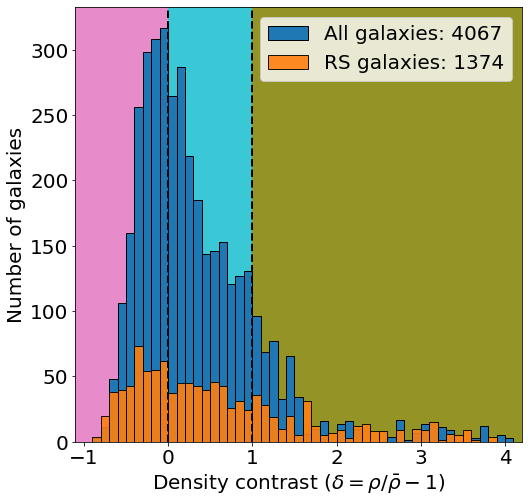

In [140]:
plt.figure(figsize=(8,8))
plt.rcParams["font.size"] = 20


plt.axvspan(-1.1,0,color='tab:pink',alpha=.85,lw=0)
plt.axvspan(0,1,color='tab:cyan',alpha=.85,lw=0)
plt.axvspan(1,5,color='olive',alpha=.85,lw=0)
plt.hist(delta,bins=np.arange(-1,20,0.1),color='tab:blue',ec='k',lw=1,label='All galaxies: '+str(len(n_gal)))
plt.hist(delta_rs,bins=np.arange(-1,20,0.1),color='tab:orange',ec='k',lw=1,label='RS galaxies: '+str(len(n_gal_rs)),alpha=0.9)


plt.axvline(0,ls='--',lw=2,color='k',label='')
plt.axvline(1,ls='--',lw=2,color='k',label='')


plt.xlabel(r"Density contrast ($\delta=\rho/\bar{\rho}-1$)")
plt.ylabel('Number of galaxies')
plt.xlim(-1.1,4.2)
plt.legend()

#plt.savefig('histogram_density.png')

In [141]:
bool_all_1 = (delta < 0)
bool_all_2 = (delta >= 0)&(delta<1)
bool_all_3 = (delta >= 1)


bool_all_2b = (delta >= 0)&(delta<1.5)

bool_core = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],63.8,64.2,-24.2,-23.9)
print(bool_core.sum())
bool_all_3b = (delta >= 1.5)#&(bool_core)
print(bool_all_3b.sum())
bool_all_3b = (delta >= 1.5)&(bool_core)
print(bool_all_3b.sum())

bool_rs_1 = (delta_rs < 0)
bool_rs_2 = (delta_rs >= 0)&(delta_rs<1)
bool_rs_3 = (delta_rs >= 1)
print(bool_all_1.shape,bool_rs_1.shape)
print(delta.shape,delta_rs.shape)



787
441
412
(4067,) (1374,)
(4067,) (1374,)


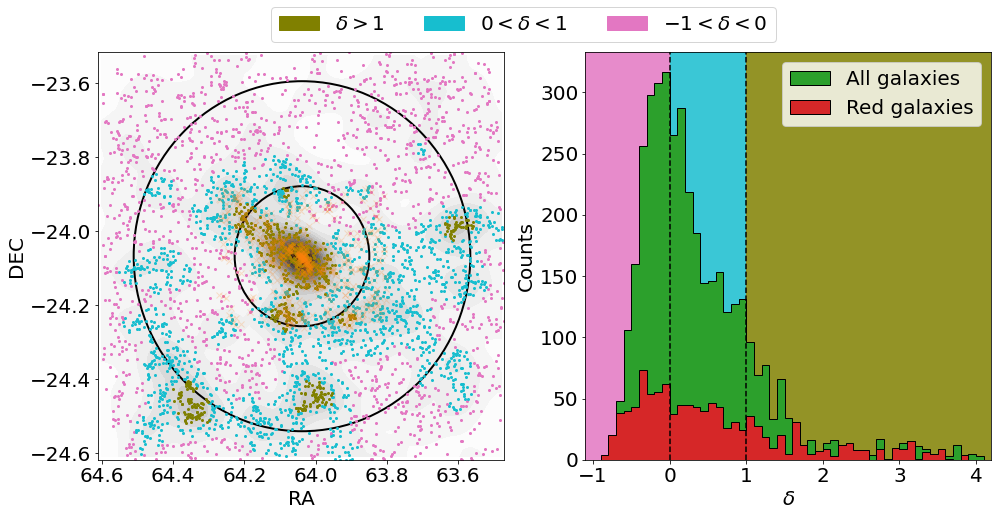

In [229]:
pink_patch = mpatches.Patch(color='tab:pink', label=r'$-1<\delta<0$')
cyan_patch = mpatches.Patch(color='tab:cyan', label=r'$0<\delta<1$')
olive_patch = mpatches.Patch(color='olive', label=r'$\delta>1$')



plt.figure(figsize=(16,7.5))
plt.rcParams["font.size"] = 20

plt.subplot(121)
fig = plt.gcf()
ax  = fig.gca()
plt.contourf(ra_central, dec_central,kernel_photocluster,levels=22,alpha=1,cmap='Greys')
plt.plot(df_spec_cluster['RA_r'],df_spec_cluster['DEC_r'],'x',alpha=0.2,c='tab:orange',label='%.3f < $z_{spec}$ < %.3f'%(macs0416[0],macs0416[1]))


plt.scatter(df_photo_cluster['RA_r'][bool_all_1],df_photo_cluster['DEC_r'][bool_all_1],marker='o',s=4,zorder=2,color='tab:pink',label=r'$-1<\delta<0$')
plt.scatter(df_photo_cluster['RA_r'][bool_all_2],df_photo_cluster['DEC_r'][bool_all_2],marker='o',s=4,zorder=2,color='tab:cyan',label=r'  $0<\delta<1$')
plt.scatter(df_photo_cluster['RA_r'][bool_all_3],df_photo_cluster['DEC_r'][bool_all_3],marker='o',s=4,zorder=2,color='olive',label=r'        $\delta>1$')




ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='k',lw=2,ls='-'))    
ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='k',lw=2))    

#ax.text(64.0380, -24.2, r'$2r_{200}$', style='italic',color='k')
#ax.text(64.0380, -24.52, r'$5r_{200}$', style='italic',color='k')


plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()

#plt.legend(loc=2,framealpha=1,facecolor='w')
#ax.legend(handles=[pink_patch,cyan_patch,olive_patch],loc=(1.1,1.1))
ax.legend(handles=[olive_patch,cyan_patch,pink_patch],bbox_to_anchor=(.4,1), loc="lower left",ncol=3)


plt.subplot(122)
plt.axvspan(-1.1,0,color='tab:pink',alpha=.85,lw=0)
plt.axvspan(0,1,color='tab:cyan',alpha=.85,lw=0)
plt.axvspan(1,5,color='olive',alpha=.85,lw=0)
plt.hist(delta,bins=np.arange(-1,20,0.1),facecolor='tab:green',histtype='step',fill=True,ec='k',lw=1,label='All galaxies')#: '+str(len(n_gal)))
plt.hist(delta_rs,bins=np.arange(-1,20,0.1),facecolor='tab:red',histtype='step',fill=True,ec='k',lw=1,label='Red galaxies')#: '+str(len(n_gal_rs)),alpha=0.9)

plt.axvline(0,ls='--',lw=1.5,color='k',label='')
plt.axvline(1,ls='--',lw=1.5,color='k',label='')


plt.xlabel(r"$\delta$")#Density contrast ($\delta=\rho/\bar{\rho}-1$)")
plt.ylabel('Counts')
plt.xlim(-1.1,4.2)
plt.legend()


#plt.savefig('histogram_density_v2.png')

In [ ]:
plt.figure(figsize=(20,6))
plt.subplot(131)
fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster['RA_r'][bool_all_1],df_photo_cluster['DEC_r'][bool_all_1],marker='.',color='tab:orange')
plt.title('All galaxies  $\delta \leq 0$')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()

plt.subplot(132)
fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster['RA_r'][bool_all_2],df_photo_cluster['DEC_r'][bool_all_2],marker='.',color='tab:blue')
plt.title('All galaxies  $0 \leq \delta \leq 1$')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()

plt.subplot(133)
fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster['RA_r'][bool_all_3],df_photo_cluster['DEC_r'][bool_all_3],marker='.',color='tab:red')
plt.title('All galaxies  $\delta \geq 1$')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()


#plt.savefig('densities_allgal.png')

In [ ]:
plt.figure(figsize=(20,6))
plt.subplot(131)
fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_1],df_photo_cluster_rs['DEC_r'][bool_rs_1],marker='.',color='tab:orange')
plt.title('Red galaxies  $\delta_{rs} \leq 0$')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster_rs['RA_r'].min(),df_photo_cluster_rs['RA_r'].max())
plt.ylim(df_photo_cluster_rs['DEC_r'].min(),df_photo_cluster_rs['DEC_r'].max())
plt.gca().invert_xaxis()

plt.subplot(132)
fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_2],df_photo_cluster_rs['DEC_r'][bool_rs_2],marker='.',color='tab:blue')
plt.title('Red galaxies  $0 \leq \delta_{rs} \leq 1$')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster_rs['RA_r'].min(),df_photo_cluster_rs['RA_r'].max())
plt.ylim(df_photo_cluster_rs['DEC_r'].min(),df_photo_cluster_rs['DEC_r'].max())
plt.gca().invert_xaxis()

plt.subplot(133)
fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_3],df_photo_cluster_rs['DEC_r'][bool_rs_3],marker='.',color='tab:red')
plt.title('Red galaxies  $\delta_{rs} \geq 1$')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster_rs['RA_r'].min(),df_photo_cluster_rs['RA_r'].max())
plt.ylim(df_photo_cluster_rs['DEC_r'].min(),df_photo_cluster_rs['DEC_r'].max())
plt.gca().invert_xaxis()


In [ ]:
plt.figure(figsize=(20,10))
plt.subplot(121)
fig = plt.gcf()
ax  = fig.gca()
#plt.scatter(df_photo_cluster['RA_r'][bool_all_1],df_photo_cluster['DEC_r'][bool_all_1],marker='.',color='tab:orange')
#plt.scatter(df_photo_cluster['RA_r'][bool_all_2b],df_photo_cluster['DEC_r'][bool_all_2b],marker='.',color='tab:blue')
plt.scatter(df_photo_cluster['RA_r'][bool_all_3],df_photo_cluster['DEC_r'][bool_all_3],marker='.',color='tab:red')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()
plt.subplot(122)
fig = plt.gcf()
ax  = fig.gca()
#plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_1],df_photo_cluster_rs['DEC_r'][bool_rs_1],marker='.',color='tab:orange')
#plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_2],df_photo_cluster_rs['DEC_r'][bool_rs_2],marker='.',color='tab:blue')
plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_3],df_photo_cluster_rs['DEC_r'][bool_rs_3],marker='.',color='tab:red')
plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster_rs['RA_r'].min(),df_photo_cluster_rs['RA_r'].max())
plt.ylim(df_photo_cluster_rs['DEC_r'].min(),df_photo_cluster_rs['DEC_r'].max())
plt.gca().invert_xaxis()



# spazial boolean

In [143]:

"""bool_A = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],64.25,64.5,-24.6,-24.3)
bool_B = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],63.9,64.1,-24.55,-24.3)
bool_C = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],63.5,63.7,-24.1,-23.85)
bool_D = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],63.7,64.15,-24.3,-24.18)

bool_A_rs = bool_radec(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],64.25,64.5,-24.6,-24.3)
bool_B_rs = bool_radec(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],63.9,64.1,-24.55,-24.3)
bool_C_rs = bool_radec(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],63.5,63.7,-24.1,-23.85)
bool_D_rs = bool_radec(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],63.7,64.15,-24.3,-24.18)
"""

bool_A = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],64.25,64.5,-24.6,-24.3)
bool_B = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],63.9,64.1,-24.55,-24.3)
bool_C = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],63.5,63.7,-24.15,-23.85)
bool_D = bool_radec(df_photo_cluster['RA_r'],df_photo_cluster['DEC_r'],63.7,64.15,-24.3,-24.18)


bool_A_rs = bool_radec(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],64.25,64.5,-24.6,-24.3)
bool_B_rs = bool_radec(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],63.9,64.1,-24.55,-24.3)
bool_C_rs = bool_radec(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],63.5,63.7,-24.15,-23.85)
bool_D_rs = bool_radec(df_photo_cluster_rs['RA_r'],df_photo_cluster_rs['DEC_r'],63.7,64.15,-24.3,-24.18)

print(bool_A.shape)
print(bool_A.sum())


(4067,)
342


In [145]:
_="""plt.figure(figsize=(20,10))
plt.subplot(121)
fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster['RA_r'][bool_all_3&bool_A],df_photo_cluster['DEC_r'][bool_all_3&bool_A],marker='.',c='blue',label='Region A')
plt.scatter(df_photo_cluster['RA_r'][bool_all_3&bool_B],df_photo_cluster['DEC_r'][bool_all_3&bool_B],marker='.',c='darkorange',label='Region B')
plt.scatter(df_photo_cluster['RA_r'][bool_all_3&bool_C],df_photo_cluster['DEC_r'][bool_all_3&bool_C],marker='.',c='green',label='Region C')
plt.scatter(df_photo_cluster['RA_r'][bool_all_3&bool_D],df_photo_cluster['DEC_r'][bool_all_3&bool_D],marker='.',c='magenta',label='Region D')


plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()

plt.legend()

plt.subplot(122)
fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_3&bool_A_rs],df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_A_rs],marker='.',c='blue',label='Region A')
plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_3&bool_B_rs],df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_B_rs],marker='.',c='darkorange',label='Region B')
plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_3&bool_C_rs],df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_C_rs],marker='.',c='green',label='Region C')
plt.scatter(df_photo_cluster_rs['RA_r'][bool_rs_3&bool_D_rs],df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_D_rs],marker='.',c='magenta',label='Region D')


plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster_rs['RA_r'].min(),df_photo_cluster_rs['RA_r'].max())
plt.ylim(df_photo_cluster_rs['DEC_r'].min(),df_photo_cluster_rs['DEC_r'].max())
plt.gca().invert_xaxis()

plt.legend()

"""

# Selection using RS

In [146]:
from shapely.geometry import Point,Polygon

cords_a_rs=np.stack((df_photo_cluster_rs['RA_r'][bool_rs_3&bool_A_rs].to_numpy(),df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_A_rs].to_numpy()),axis=1)
cords_b_rs=np.stack((df_photo_cluster_rs['RA_r'][bool_rs_3&bool_B_rs].to_numpy(),df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_B_rs].to_numpy()),axis=1)
cords_c_rs=np.stack((df_photo_cluster_rs['RA_r'][bool_rs_3&bool_C_rs].to_numpy(),df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_C_rs].to_numpy()),axis=1)

print('Region A')

print([df_photo_cluster_rs['RA_r'][bool_rs_3&bool_A_rs].mean(),df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_A_rs].mean()])
print('64:20:07.83    -24:28:06.09')

print('Region B')
print([df_photo_cluster_rs['RA_r'][bool_rs_3&bool_B_rs].mean(),df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_B_rs].mean()])
print('64:00:06.39    -24:27:14.00')

print('Region C')
print([df_photo_cluster_rs['RA_r'][bool_rs_3&bool_C_rs].mean(),df_photo_cluster_rs['DEC_r'][bool_rs_3&bool_C_rs].mean()])
print('63:35:56.84    -23:58:30.23')

coordinates = np.stack((df_photo_cluster['RA_r'],df_photo_cluster['DEC_r']),axis=1)

poly_a_rs = Polygon(cords_a_rs).convex_hull
poly_b_rs = Polygon(cords_b_rs).convex_hull
poly_c_rs = Polygon(cords_c_rs).convex_hull

bool_allgal_rs_a = np.zeros(len(coordinates),dtype=bool)
bool_allgal_rs_b = np.zeros(len(coordinates),dtype=bool)
bool_allgal_rs_c = np.zeros(len(coordinates),dtype=bool)

for i in range(len(coordinates)):
    p = Point(coordinates[i])

    if p.within(poly_a_rs) == True:
        bool_allgal_rs_a[i]=True

    if p.within(poly_b_rs) == True:
        bool_allgal_rs_b[i]=True

    if p.within(poly_c_rs) == True:
        bool_allgal_rs_c[i]=True
        
        
# Ra-Dec from deg to hms:
# https://www.astrouw.edu.pl/~jskowron/ra-dec/?q=63.59912187142859%2C+-23.975062511428575

Region A
[64.33550706478873, -24.468357028169013]
64:20:07.83    -24:28:06.09
Region B
[64.00177556415092, -24.45388980377358]
64:00:06.39    -24:27:14.00
Region C
[63.59912187142859, -23.975062511428575]
63:35:56.84    -23:58:30.23


(48,)


Text(0, 0.5, 'MAG AUTO K')

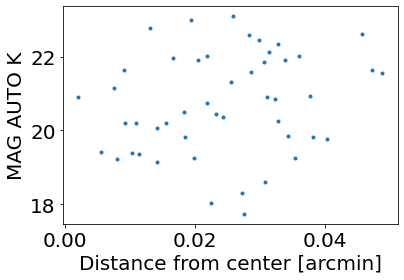

In [147]:
ra_temp_a = df_photo_cluster['RA_r'][bool_allgal_rs_c] - df_photo_cluster['RA_r'][bool_allgal_rs_c].mean()
dec_temp_a = df_photo_cluster['DEC_r'][bool_allgal_rs_c] - df_photo_cluster['DEC_r'][bool_allgal_rs_c].mean()
dist_temp_a = np.sqrt(ra_temp_a**2+dec_temp_a**2)
print(dist_temp_a.shape)


plt.plot(dist_temp_a,df_photo_cluster['MAG_AUTO_k'][bool_allgal_rs_c],'.')
plt.xlabel('Distance from center [arcmin]')
plt.ylabel('MAG AUTO K')

"for i in range(len(df_photo_cluster['RA_r'][bool_allgal_rs_a])):\n    plt.plot([df_photo_cluster['RA_r'][bool_allgal_rs_a].mean(),df_photo_cluster['RA_r'][bool_allgal_rs_a][i]],[df_photo_cluster['DEC_r'][bool_allgal_rs_a].mean(),df_photo_cluster['DEC_r'][bool_allgal_rs_a][i]],c='b')                                 # Center of the field - center of the HANDMADE ghost (blue line)\n    \n    "

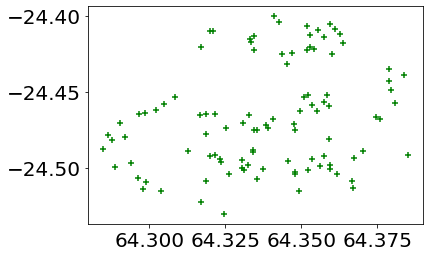

In [36]:
plt.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_a],df_photo_cluster['DEC_r'][bool_allgal_rs_a],marker='+',c='green',label=r'Region A')


"""for i in range(len(df_photo_cluster['RA_r'][bool_allgal_rs_a])):
    plt.plot([df_photo_cluster['RA_r'][bool_allgal_rs_a].mean(),df_photo_cluster['RA_r'][bool_allgal_rs_a][i]],[df_photo_cluster['DEC_r'][bool_allgal_rs_a].mean(),df_photo_cluster['DEC_r'][bool_allgal_rs_a][i]],c='b')                                 # Center of the field - center of the HANDMADE ghost (blue line)
    
    """
    

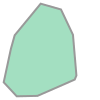

In [36]:
poly_a_rs

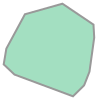

In [37]:
poly_b_rs

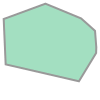

In [38]:
poly_c_rs

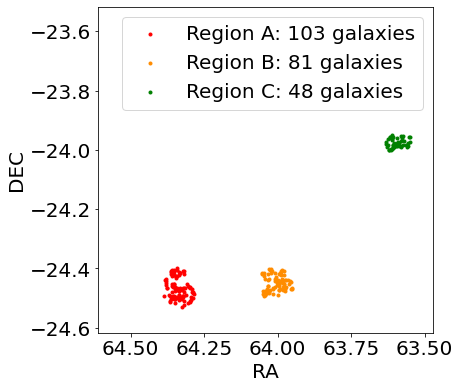

In [148]:
plt.figure(figsize=(6,6))

fig = plt.gcf()
ax  = fig.gca()
plt.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_a],df_photo_cluster['DEC_r'][bool_allgal_rs_a],marker='.',c='red',label='Region A: %.0f galaxies'%bool_allgal_rs_a.sum())
plt.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_b],df_photo_cluster['DEC_r'][bool_allgal_rs_b],marker='.',c='darkorange',label='Region B: %.0f galaxies'%bool_allgal_rs_b.sum())
plt.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_c],df_photo_cluster['DEC_r'][bool_allgal_rs_c],marker='.',c='green',label='Region C: %.0f galaxies'%bool_allgal_rs_c.sum())


plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()

plt.legend()

# 85, 76, 42 --> numero di galassi nelle overdensities prima
# ora ce ne sono più galassie dentro i gruppi!

In [ ]:
plt.figure(figsize=(16,5))


plt.rcParams["font.size"] = 18
plt.tight_layout()
plt.subplot(131)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_a]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_a]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_a]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Region A red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='red', alpha=1,label='Region A')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.ylabel("MAG g   -   MAG r")
plt.xlabel("MAG r")
plt.xlim(18,25)
plt.ylim(0.5,2.5)
plt.legend()

plt.subplot(132)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_b]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_b]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Region B red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='darkorange', alpha=1,label='Region B')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
#plt.ylabel("MAG g   -   MAG r")
plt.xlabel("MAG r")
plt.xlim(18,25)
plt.ylim(0.5,2.5)
plt.legend()

plt.subplot(133)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_c]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_c]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_c]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Region C red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='green', alpha=1,label='Region C')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
#plt.ylabel("MAG g   -   MAG r")
plt.xlabel("MAG r")
plt.xlim(18,25)
plt.ylim(0.5,2.5)
plt.legend()

#plt.savefig('redsequence_regions.png')

Blue galaxies: 1188 (78.83211678832117 %)
Red galaxies: 319 (21.16788321167883 %)
Blue galaxies: 1194 (67.1541057367829 %)
Red galaxies: 584 (32.8458942632171 %)
Blue galaxies: 272 (34.78260869565217 %)
Red galaxies: 510 (65.21739130434783 %)


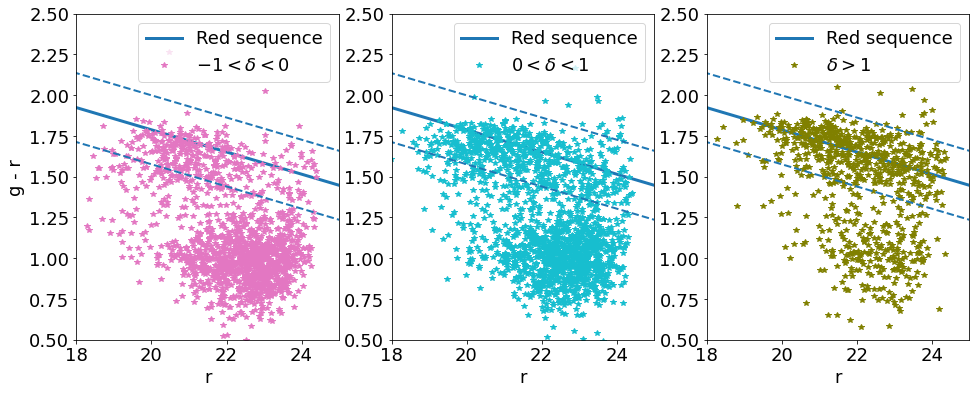

In [149]:
plt.figure(figsize=(16,6))
plt.rcParams["font.size"] = 18
#plt.tight_layout()
plt.subplot(131)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_1]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_1]-df_photo_cluster['MAG_AP3_r'][bool_all_1]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
bluegal = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Blue galaxies: '+str(bluegal.sum())+' ('+str(bluegal.sum()*100/len(bluegal))+' %)')
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='tab:pink', alpha=1,label=r'$-1<\delta<0$')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.ylabel("g - r")
plt.xlabel("r")
plt.xlim(18,25)
plt.ylim(0.5,2.5)
plt.legend()

plt.subplot(132)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_2]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_2]-df_photo_cluster['MAG_AP3_r'][bool_all_2]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
bluegal = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Blue galaxies: '+str(bluegal.sum())+' ('+str(bluegal.sum()*100/len(bluegal))+' %)')
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='tab:cyan', alpha=1,label=r'$0<\delta<1$')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
#plt.ylabel("MAG g   -   MAG r")
plt.xlabel("r")
plt.xlim(18,25)
plt.ylim(0.5,2.5)
plt.legend()

plt.subplot(133)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3]-df_photo_cluster['MAG_AP3_r'][bool_all_3]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
bluegal = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Blue galaxies: '+str(bluegal.sum())+' ('+str(bluegal.sum()*100/len(bluegal))+' %)')
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='olive', alpha=1,label=r'$\delta>1$')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
#plt.ylabel("MAG g   -   MAG r")
plt.xlabel("r")
plt.xlim(18,25)
plt.ylim(0.5,2.5)
plt.legend()

"""plt.subplot(235)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_2b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_2b]-df_photo_cluster['MAG_AP3_r'][bool_all_2b]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='tab:cyan', alpha=1,label=r'$0<\delta<1.5$')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
#plt.ylabel("MAG g   -   MAG r")
plt.xlabel("MAG r")
plt.xlim(18,25)
plt.ylim(0.5,2.5)
plt.legend()

plt.subplot(236)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3b]-df_photo_cluster['MAG_AP3_r'][bool_all_3b]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='tab:purple', alpha=1,label=r'$\delta>1.5$')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
#plt.ylabel("MAG g   -   MAG r")
plt.xlabel("MAG r")
plt.xlim(18,25)
plt.ylim(0.5,2.5)
plt.legend()
"""
plt.savefig('redsequence_densities.png')

Blue galaxies: 1188 (78.83211678832117 %)
Red galaxies: 314 (20.836098208360983 %)
0.0894754918189188
Blue galaxies: 1194 (67.1541057367829 %)
Red galaxies: 566 (31.83352080989876 %)
0.09144254814669554
Blue galaxies: 272 (34.78260869565217 %)
Red galaxies: 494 (63.171355498721226 %)
0.09762194887316734


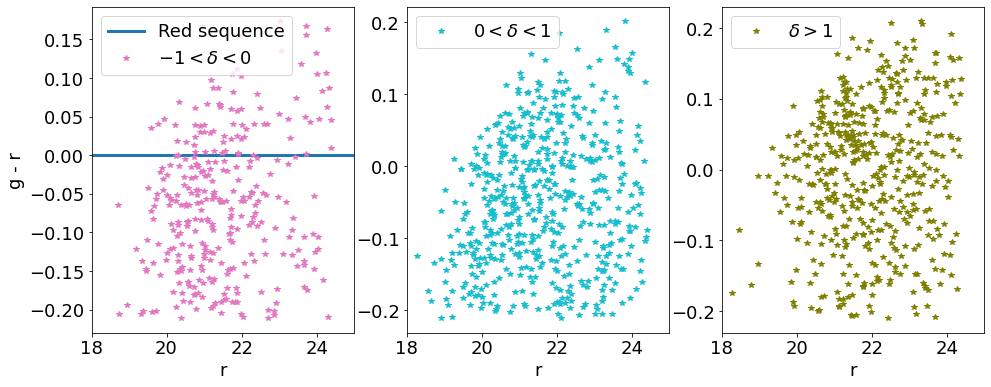

In [1497]:
x = np.linspace(16,27,200)

plt.figure(figsize=(16,6))
plt.rcParams["font.size"] = 18

#F(www[qqq])  = ((rs_b)*(www[qqq]-rs_x0)+rs_a)

plt.subplot(131)
plt.plot(x,np.zeros(len(x)),'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_1]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_1]-df_photo_cluster['MAG_AP3_r'][bool_all_1]
qqq = (zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep))&(zzz < (rs_b)*(www-rs_x0)+rs_a+(2.6*rs_ep))
bluegal = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Blue galaxies: '+str(bluegal.sum())+' ('+str(bluegal.sum()*100/len(bluegal))+' %)')
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www[qqq], zzz[qqq]-((rs_b)*(www[qqq]-rs_x0)+rs_a),'*', c='tab:pink', alpha=1,label=r'$-1<\delta<0$')
print(np.std(zzz[qqq]-((rs_b)*(www[qqq]-rs_x0)+rs_a)))
########
plt.ylabel("g - r")
plt.xlabel("r")
plt.xlim(18,25)
#plt.ylim(0.5,2.5)
plt.legend()

plt.subplot(132)
#plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_2]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_2]-df_photo_cluster['MAG_AP3_r'][bool_all_2]
qqq = (zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep))&(zzz < (rs_b)*(www-rs_x0)+rs_a+(2.6*rs_ep))

bluegal = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Blue galaxies: '+str(bluegal.sum())+' ('+str(bluegal.sum()*100/len(bluegal))+' %)')
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www[qqq], zzz[qqq]-((rs_b)*(www[qqq]-rs_x0)+rs_a),'*', c='tab:cyan', alpha=1,label=r'$0<\delta<1$')
print(np.std(zzz[qqq]-((rs_b)*(www[qqq]-rs_x0)+rs_a)))
########
#plt.ylabel("MAG g   -   MAG r")
plt.xlabel("r")
plt.xlim(18,25)
#plt.ylim(0.5,2.5)
plt.legend()

plt.subplot(133)
# plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3]-df_photo_cluster['MAG_AP3_r'][bool_all_3]
qqq = (zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep))&(zzz < (rs_b)*(www-rs_x0)+rs_a+(2.6*rs_ep))

bluegal = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Blue galaxies: '+str(bluegal.sum())+' ('+str(bluegal.sum()*100/len(bluegal))+' %)')
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www[qqq], zzz[qqq]-((rs_b)*(www[qqq]-rs_x0)+rs_a),'*', c='olive', alpha=1,label=r'$\delta>1$')
print(np.std(zzz[qqq]-((rs_b)*(www[qqq]-rs_x0)+rs_a)))
########
#plt.ylabel("MAG g   -   MAG r")
plt.xlabel("r")
plt.xlim(18,25)
#plt.ylim(0.5,2.5)
plt.legend()




# Red sequence comparison densities

### Capellari 1 - df_photo_cluster

sig_int:     0.0000     35.1079
Computing sig_int
sig_int:     0.0000     35.1079
sig_int:     0.3126     -0.0866
sig_int:     0.3119     -0.0822
sig_int:     0.2975      0.0059
sig_int:     0.2985     -0.0004
sig_int:     0.2983      0.0006
Computing sig_int error
sig_int:     0.2985      0.0218
sig_int:     0.3126     -0.0644
sig_int:     0.3021     -0.0011
sig_int:     0.3019     -0.0000
sig_int:     0.3017      0.0009
Repeat at best fitting solution
sig_int:     0.2985     -0.0004
################# Values and formal errors ################
 intercept:  1.2311 +/- 0.0048
     slope:  -0.1111 +/- 0.0039
   scatter:  0.2985 +/- 0.0034
Observed rms scatter: 0.30
y = a + b*(x - pivot) with pivot = 22.28
Spearman r=-0.37 and p=2.9e-134
Pearson r=-0.39 and p=7.9e-151
##########################################################
seconds 194.08


Text(0, 0.5, '$y, a + b\\ (x - x_{0})$')

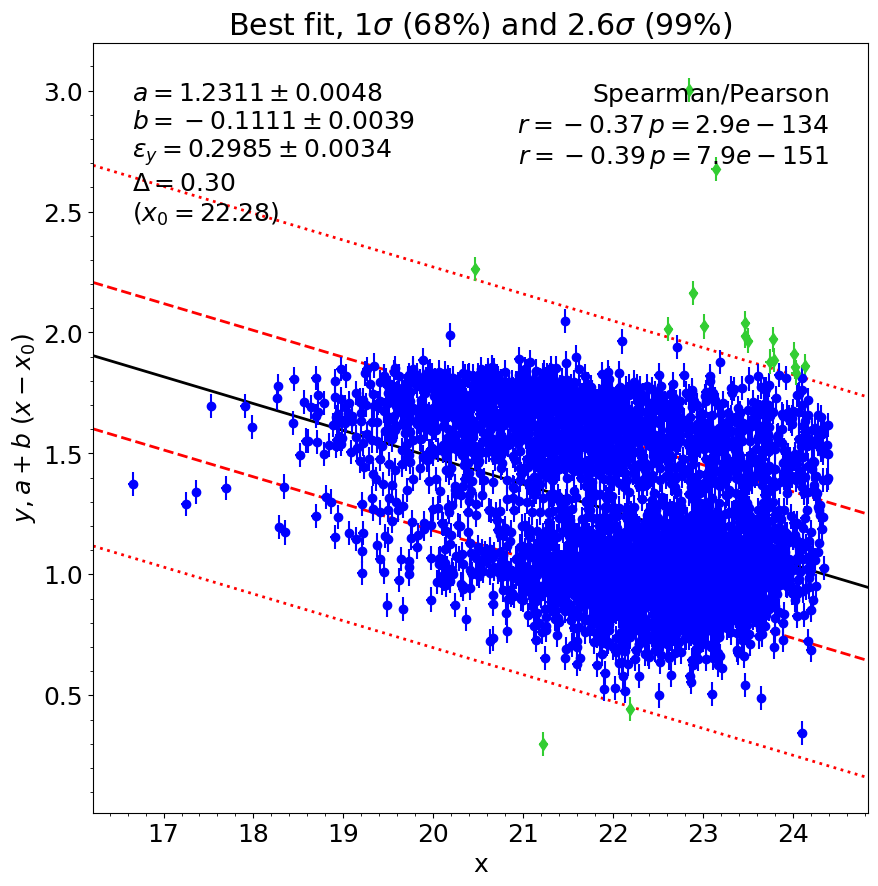

In [204]:
""""y_lts,bool_color   = good_color(df_photo_cluster['MAG_AP3_g'],df_photo_cluster['MAG_AP3_r'])
y_lts.reset_index(drop=True,inplace=True)

x_lts   = df_photo_cluster['MAG_AUTO_r']
x_lts.reset_index(drop=True,inplace=True)

sigx = np.full_like(x_lts, 0.05) 
sigy = np.full_like(x_lts, 0.05)  
plt.figure(figsize=(10,10))
plt.clf()
p = lts_linefit(x_lts, y_lts, sigx, sigy, pivot=np.median(x_lts))
plt.xlabel('x')
plt.ylabel('$y, a + b\ (x - x_{0})$')""""

# Non mi piace questa divisione perche taglia anche la blue cloud
# faccio una semplice linea che dividia i due campioni"""

### Capellari 2: low density

(1507,)
(1507,)
sig_int:     0.0000      2.7692
Computing sig_int
sig_int:     0.0000      2.7692
sig_int:     0.1083     -0.3368
sig_int:     0.0965     -0.2019
sig_int:     0.0802      0.0568
sig_int:     0.0838     -0.0087
sig_int:     0.0833     -0.0003
sig_int:     0.0832      0.0004
Computing sig_int error
sig_int:     0.0833      0.0764
sig_int:     0.1083     -0.2601
sig_int:     0.0890     -0.0174
sig_int:     0.0879     -0.0009
sig_int:     0.0879      0.0000
Repeat at best fitting solution
sig_int:     0.0833     -0.0003
################# Values and formal errors ################
 intercept:  1.6177 +/- 0.0053
     slope:  -0.0391 +/- 0.0042
   scatter:  0.0833 +/- 0.0046
Observed rms scatter: 0.097
y = a + b*(x - pivot) with pivot = 21.22
Spearman r=-0.41 and p=3.8e-16
Pearson r=-0.3 and p=4.9e-09
##########################################################
seconds 164.78


Text(0, 0.5, '$y, a + b\\ (x - x_{0})$')

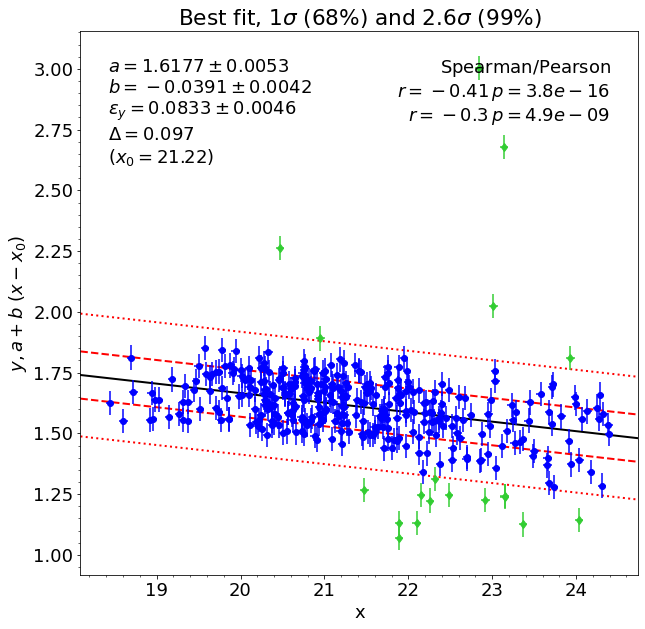

In [45]:
"""
y_linear2_temp = (-0.03)*(df_photo_cluster['MAG_AUTO_r'][bool_all_1]-21)+1.4
y_data2_temp   = df_photo_cluster['MAG_AUTO_g'][bool_all_1]-df_photo_cluster['MAG_AUTO_r'][bool_all_1]

df_cluster_upper_temp = df_photo_cluster[bool_all_1][y_data2_temp>=y_linear2_temp]
df_cluster_upper_temp.reset_index(drop=True,inplace=True)

y_lts2_temp,bool_color2_temp   = good_color(df_cluster_upper_temp['MAG_AP3_g'],df_cluster_upper_temp['MAG_AP3_r'])
y_lts2_temp.reset_index(drop=True,inplace=True)

x_lts2_temp   = df_cluster_upper_temp['MAG_AUTO_r']
x_lts2_temp.reset_index(drop=True,inplace=True)

sigx2_temp = np.full_like(x_lts2_temp, 0.05) 
sigy2_temp = np.full_like(x_lts2_temp, 0.05)  
plt.figure(figsize=(10,10))
plt.clf()
p = lts_linefit(x_lts2_temp, y_lts2_temp, sigx2_temp, sigy2_temp, pivot=np.median(x_lts2_temp))
plt.xlabel('x')
plt.ylabel('$y, a + b\ (x - x_{0})$')
"""
"""
################# Values and formal errors ################
 intercept:  1.6177 +/- 0.0053
     slope:  -0.0391 +/- 0.0042
   scatter:  0.0833 +/- 0.0046
Observed rms scatter: 0.097
y = a + b*(x - pivot) with pivot = 21.22
Spearman r=-0.41 and p=3.8e-16
Pearson r=-0.3 and p=4.9e-09
##########################################################

"""



sig_int:     0.0000      3.2586
Computing sig_int
sig_int:     0.0000      3.2586
sig_int:     0.1123     -0.2948
sig_int:     0.1030     -0.1869
sig_int:     0.0878      0.0452
sig_int:     0.0907     -0.0065
sig_int:     0.0904     -0.0002
sig_int:     0.0903      0.0006
Computing sig_int error
sig_int:     0.0904      0.0584
sig_int:     0.1123     -0.2362
sig_int:     0.0947     -0.0119
sig_int:     0.0940     -0.0005
sig_int:     0.0939      0.0003
Repeat at best fitting solution
sig_int:     0.0904     -0.0002
################# Values and formal errors ################
 intercept:  1.6299 +/- 0.0043
     slope:  -0.0427 +/- 0.0031
   scatter:  0.0904 +/- 0.0036
Observed rms scatter: 0.10
y = a + b*(x - pivot) with pivot = 21.49
Spearman r=-0.44 and p=5.6e-30
Pearson r=-0.41 and p=5.2e-26
##########################################################
seconds 171.75


Text(0, 0.5, '$y, a + b\\ (x - x_{0})$')

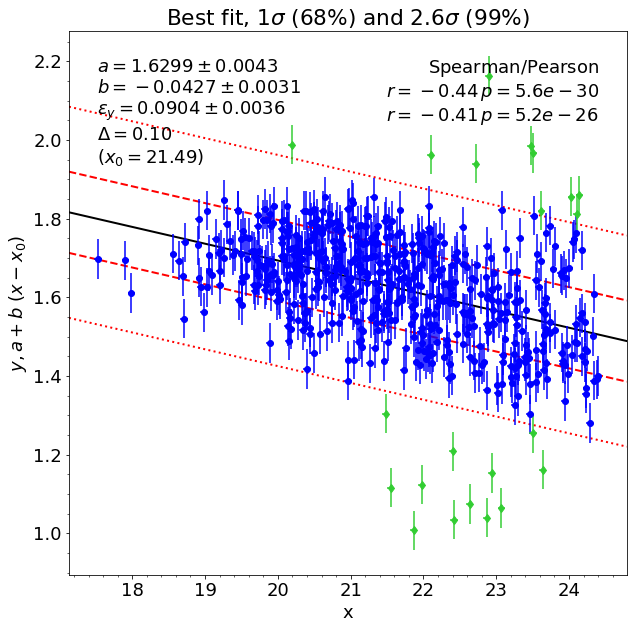

In [47]:
_="""y_linear2_temp = (-0.03)*(df_photo_cluster['MAG_AUTO_r'][bool_all_2]-21)+1.4
y_data2_temp   = df_photo_cluster['MAG_AUTO_g'][bool_all_2]-df_photo_cluster['MAG_AUTO_r'][bool_all_2]

df_cluster_upper_temp = df_photo_cluster[bool_all_2][y_data2_temp>=y_linear2_temp]
df_cluster_upper_temp.reset_index(drop=True,inplace=True)

y_lts2_temp,bool_color2_temp   = good_color(df_cluster_upper_temp['MAG_AP3_g'],df_cluster_upper_temp['MAG_AP3_r'])
y_lts2_temp.reset_index(drop=True,inplace=True)

x_lts2_temp   = df_cluster_upper_temp['MAG_AUTO_r']
x_lts2_temp.reset_index(drop=True,inplace=True)

sigx2_temp = np.full_like(x_lts2_temp, 0.05) 
sigy2_temp = np.full_like(x_lts2_temp, 0.05)  
plt.figure(figsize=(10,10))
plt.clf()
p = lts_linefit(x_lts2_temp, y_lts2_temp, sigx2_temp, sigy2_temp, pivot=np.median(x_lts2_temp))
plt.xlabel('x')
plt.ylabel('$y, a + b\ (x - x_{0})$')
"""

"""
################# Values and formal errors ################
 intercept:  1.6299 +/- 0.0043
     slope:  -0.0427 +/- 0.0031
   scatter:  0.0904 +/- 0.0036
Observed rms scatter: 0.10
y = a + b*(x - pivot) with pivot = 21.49
Spearman r=-0.44 and p=5.6e-30
Pearson r=-0.41 and p=5.2e-26
##########################################################
"""


sig_int:     0.0000      2.9408
Computing sig_int
sig_int:     0.0000      2.9408
sig_int:     0.1089     -0.3132
sig_int:     0.0985     -0.1908
sig_int:     0.0831      0.0487
sig_int:     0.0862     -0.0070
sig_int:     0.0858     -0.0002
sig_int:     0.0858      0.0005
Computing sig_int error
sig_int:     0.0858      0.0643
sig_int:     0.1089     -0.2488
sig_int:     0.0906     -0.0139
sig_int:     0.0897     -0.0006
sig_int:     0.0897      0.0001
Repeat at best fitting solution
sig_int:     0.0858     -0.0002
################# Values and formal errors ################
 intercept:  1.6659 +/- 0.0045
     slope:  -0.0442 +/- 0.0037
   scatter:  0.0858 +/- 0.0039
Observed rms scatter: 0.099
y = a + b*(x - pivot) with pivot = 21.81
Spearman r=-0.43 and p=5.3e-24
Pearson r=-0.39 and p=2.8e-19
##########################################################
seconds 168.43


Text(0, 0.5, '$y, a + b\\ (x - x_{0})$')

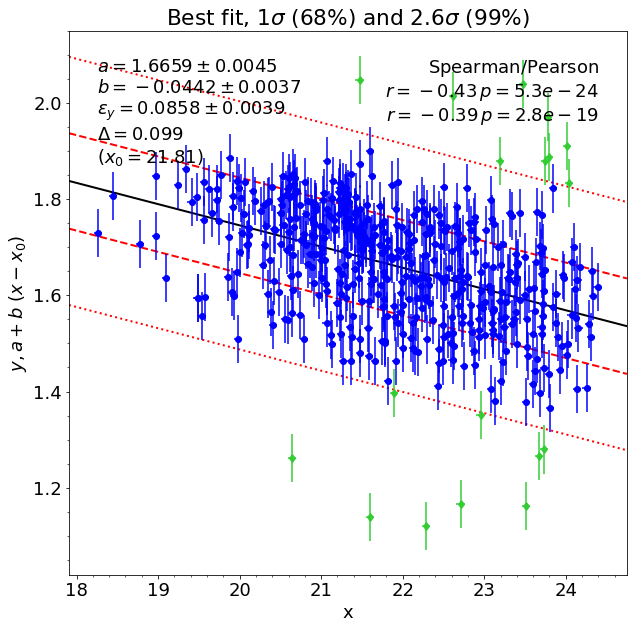

In [48]:
_="""y_linear2_temp = (-0.03)*(df_photo_cluster['MAG_AUTO_r'][bool_all_3]-21)+1.4
y_data2_temp   = df_photo_cluster['MAG_AUTO_g'][bool_all_3]-df_photo_cluster['MAG_AUTO_r'][bool_all_3]

df_cluster_upper_temp = df_photo_cluster[bool_all_3][y_data2_temp>=y_linear2_temp]
df_cluster_upper_temp.reset_index(drop=True,inplace=True)

y_lts2_temp,bool_color2_temp   = good_color(df_cluster_upper_temp['MAG_AP3_g'],df_cluster_upper_temp['MAG_AP3_r'])
y_lts2_temp.reset_index(drop=True,inplace=True)

x_lts2_temp   = df_cluster_upper_temp['MAG_AUTO_r']
x_lts2_temp.reset_index(drop=True,inplace=True)

sigx2_temp = np.full_like(x_lts2_temp, 0.05) 
sigy2_temp = np.full_like(x_lts2_temp, 0.05)  
plt.figure(figsize=(10,10))
plt.clf()
p = lts_linefit(x_lts2_temp, y_lts2_temp, sigx2_temp, sigy2_temp, pivot=np.median(x_lts2_temp))
plt.xlabel('x')
plt.ylabel('$y, a + b\ (x - x_{0})$')
"""

"""
################# Values and formal errors ################
 intercept:  1.6659 +/- 0.0045
     slope:  -0.0442 +/- 0.0037
   scatter:  0.0858 +/- 0.0039
Observed rms scatter: 0.099
y = a + b*(x - pivot) with pivot = 21.81
Spearman r=-0.43 and p=5.3e-24
Pearson r=-0.39 and p=2.8e-19
##########################################################
"""


In [150]:
def binomial(n1,n,conf_level):
    """n1 is the number of success, n is the total of events, conf_level is 0-1 number"""
    p = n1/n
    a = 1-conf_level
    z = 1 - 0.5*a
    error = z*np.sqrt((p*(1-p))/(n))
    return p, error

p_tmp, err_tmp =  binomial(qqq.sum(),len(qqq),0.95)
print(p_tmp*100, err_tmp*100)

65.21739130434783 1.6605961479890712


(0.25, 2.25)

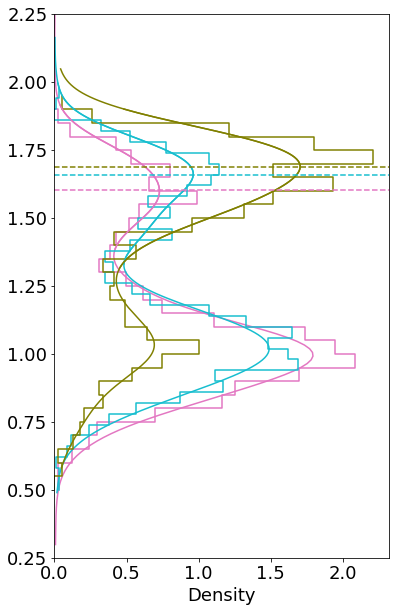

In [152]:
plt.figure(figsize=(6,10))
pinkhist = sns.histplot(y=zzz_1, bins=np.arange(0.5,2,0.05),kde=True,stat='density',fill=False,element="step",color='tab:pink')
cyanhist = sns.histplot(y=zzz_2, bins=np.arange(0.5,2,0.04),kde=True,stat='density',fill=False,element="step",color='tab:cyan')
olivehist= sns.histplot(y=zzz_3, bins=np.arange(0.5,2,0.05),kde=True,stat='density',fill=False,element="step",color='olive')

aaa1,bbb1=pinkhist.get_lines()[1].get_data()
aaa2,bbb2=cyanhist.get_lines()[3].get_data()
aaa3,bbb3=olivehist.get_lines()[5].get_data()

plt.plot(aaa1[80:120],bbb1[80:120],color='tab:pink')
plt.plot(aaa2[100:180],bbb2[100:180],color='tab:cyan')
plt.plot(aaa3[100:180],bbb3[100:180],color='olive')

plt.axhline(bbb1[80:120][aaa1[80:120]==aaa1[80:120].max()],color='tab:pink',ls='--')
plt.axhline(bbb2[100:180][aaa2[100:180]==aaa2[100:180].max()],color='tab:cyan',ls='--')
plt.axhline(bbb3[100:180][aaa3[100:180]==aaa3[100:180].max()],color='olive',ls='--')

plt.ylim(0.25,2.25)




Red galaxies: 510 (65.21739130434783 % +/- 1.6605961479890712 %)
Blue galaxies: 272 (34.78260869565217 % +/- 1.6605961479890712 %)
Red galaxies: 584 (32.8458942632171 % +/- 1.0859643480432504 %)
Blue galaxies: 1194 (67.1541057367829 % +/- 1.0859643480432504 %)
(1507,)
(1507,)
Red galaxies: 319 (21.16788321167883 % +/- 1.0259785923939364 %)
Blue galaxies: 1188 (78.83211678832117 % +/- 1.0259785923939362 %)


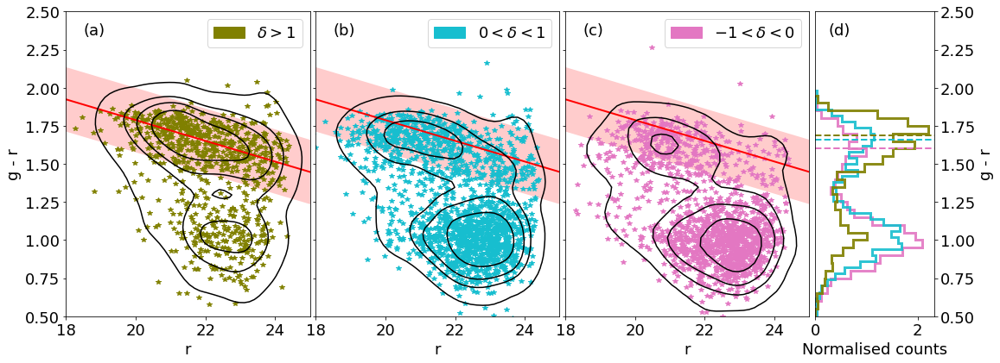

In [192]:
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

legend_elements_hd = [#Line2D([0], [0], color='k', lw=2, label='RS: spec members'),
                      #Line2D([0], [0], color='r', lw=2, label='red sequence fit'),
                      mpatches.Patch(color='olive',label=r'$\delta>1$')]

legend_elements_md = [#Line2D([0], [0], color='k', lw=2, label='RS:spec members'),
                      #Line2D([0], [0], color='m', lw=2, label='RS: photo members'),
                      mpatches.Patch(color='tab:cyan',label=r'$0<\delta<1$')]

legend_elements_ld = [#Line2D([0], [0], color='k', lw=2, label='RS: spec members'),
                      #Line2D([0], [0], color='g', lw=2, label='RS: photo members'),
                      mpatches.Patch(color='tab:pink',label=r'$-1<\delta<0$')]




pink_patch = mpatches.Patch(color='tab:pink', label=r'$-1<\delta<0$')
cyan_patch = mpatches.Patch(color='tab:cyan', label=r'$0<\delta<1$')
olive_patch = mpatches.Patch(color='olive', label=r'$\delta>1$')

# parametri red sequence low density
rs_b_ld = -0.0391
rs_x0_ld = 21.22
rs_a_ld = 1.6177
rs_ep_ld = 0.097

# parametri red sequence medium density
rs_b_md = -0.0427
rs_x0_md = 21.49
rs_a_md = 1.6299
rs_ep_md = 0.10

# parametri red sequence high density
rs_b_hd = -0.0442
rs_x0_hd = 21.81
rs_a_hd = 1.6659
rs_ep_hd = 0.099


fig = plt.figure(figsize=(18,6.5))
plt.rcParams["font.size"] = 18
gs_rs = gridspec.GridSpec(1, 7, wspace=0.05)
ax_1 = plt.subplot(gs_rs[0, 0:2])
ax_2 = plt.subplot(gs_rs[0, 2:4])
ax_3 = plt.subplot(gs_rs[0, 4:6])
ax_4 = plt.subplot(gs_rs[0, 6],sharey=ax_1)

#### Per dividere red e blue ###
#a_temp  = 1.4
#b_temp  = -0.03
#x0_temp = 21
#ax_1.plot(x,(b_temp)*(x-x0_temp)+a_temp,'-',c='red',lw=4,label='')
#ax_2.plot(x,(b_temp)*(x-x0_temp)+a_temp,'-',c='red',lw=4,label='')
#ax_3.plot(x,(b_temp)*(x-x0_temp)+a_temp,'-',c='red',lw=4,label='')

### prova dividendo il campione col fit ###
###a_temp  = 1.2311
###b_temp  = -0.1111
###x0_temp = 22.28
###ax_1.plot(x,(b_temp)*(x-x0_temp)+a_temp,'-',c='blue',lw=4,label='')
###ax_2.plot(x,(b_temp)*(x-x0_temp)+a_temp,'-',c='blue',lw=4,label='')
###ax_3.plot(x,(b_temp)*(x-x0_temp)+a_temp,'-',c='blue',lw=4,label='')





########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3]-df_photo_cluster['MAG_AP3_r'][bool_all_3]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
blue_cloud = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)


p_tmp, err_tmp =  binomial(qqq.sum(),len(qqq),0.95)
print('Red galaxies: '+str(qqq.sum())+' ('+str(p_tmp*100)+' % +/- '+str(err_tmp*100)+' %)')
p_tmp, err_tmp =  binomial(blue_cloud.sum(),len(blue_cloud),0.95)
print('Blue galaxies: '+str(blue_cloud.sum())+' ('+str(p_tmp*100)+' % +/- '+str(err_tmp*100)+' %)')
ax_1.plot(www, zzz,'*', c='olive', alpha=1)
sns.kdeplot(x=www, y=zzz,ax=ax_1,gridsize=60,levels=[.05,.25,.50,.75],zorder=5,color='k')

#booh3, nope1, nope2 = np.histogram2d(www,zzz,density=True)
#CS = ax_1.contour(nope1[1:],nope2[1:],booh3.T,zorder=10)
#ax_1.clabel(CS, inline=True, fontsize=10)


########
ax_1.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='r',lw=2,label='')
ax_1.fill_between(x, (rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep), (rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep), facecolor='r', alpha=0.2)
ax_1.set(ylabel="g - r",xlabel="r",xlim=(18,25),ylim=(0.5,2.5))
ax_1.legend(handles=legend_elements_hd,loc=1)
ax_1.text(18.5, 2.35, '(a)', color='k')




########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_2]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_2]-df_photo_cluster['MAG_AP3_r'][bool_all_2]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
blue_cloud = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
p_tmp, err_tmp =  binomial(qqq.sum(),len(qqq),0.95)
print('Red galaxies: '+str(qqq.sum())+' ('+str(p_tmp*100)+' % +/- '+str(err_tmp*100)+' %)')
p_tmp, err_tmp =  binomial(blue_cloud.sum(),len(blue_cloud),0.95)
print('Blue galaxies: '+str(blue_cloud.sum())+' ('+str(p_tmp*100)+' % +/- '+str(err_tmp*100)+' %)')
ax_2.plot(www, zzz,'*', c='tab:cyan', alpha=1)
sns.kdeplot(x=www, y=zzz,ax=ax_2,gridsize=60,levels=[.05,.25,.50,.75],zorder=5,color='k')
########
ax_2.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='r',lw=2,label='')
ax_2.fill_between(x, (rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep), (rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep), facecolor='r', alpha=0.2)
ax_2.set(xlabel="r",xlim=(18,25),ylim=(0.5,2.5))
ax_2.legend(handles=legend_elements_md,loc=1)
ax_2.text(18.5, 2.35, '(b)', color='k')
ax_2.yaxis.set_ticklabels([])




########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_1]
print(www.shape)
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_1]-df_photo_cluster['MAG_AP3_r'][bool_all_1]
print(zzz.shape)
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
blue_cloud = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
p_tmp, err_tmp =  binomial(qqq.sum(),len(qqq),0.95)
print('Red galaxies: '+str(qqq.sum())+' ('+str(p_tmp*100)+' % +/- '+str(err_tmp*100)+' %)')
p_tmp, err_tmp =  binomial(blue_cloud.sum(),len(blue_cloud),0.95)
print('Blue galaxies: '+str(blue_cloud.sum())+' ('+str(p_tmp*100)+' % +/- '+str(err_tmp*100)+' %)')
ax_3.plot(www, zzz,'*', c='tab:pink', alpha=1)
sns.kdeplot(x=www, y=zzz,ax=ax_3,gridsize=60,levels=[.05,.25,.50,.75],zorder=5,color='k',label='ddd',legend=True)
########
ax_3.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='r',lw=2,label='')
ax_3.fill_between(x, (rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep), (rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep), facecolor='r', alpha=0.2)
ax_3.legend(handles=legend_elements_ld,loc=1)
ax_3.set(xlabel="r",xlim=(18,25),ylim=(0.5,2.5))
ax_3.text(18.5, 2.35, '(c)', color='k')
ax_3.yaxis.set_ticklabels([])




zzz_1 = df_photo_cluster['MAG_AP3_g'][bool_all_1]-df_photo_cluster['MAG_AP3_r'][bool_all_1]
zzz_2 = df_photo_cluster['MAG_AP3_g'][bool_all_2]-df_photo_cluster['MAG_AP3_r'][bool_all_2]
zzz_3 = df_photo_cluster['MAG_AP3_g'][bool_all_3]-df_photo_cluster['MAG_AP3_r'][bool_all_3]

ax_4.hist(zzz_1,bins=np.arange(0.5,2,0.05),label=r'$-1<\delta<0$',density=True,orientation='horizontal',align='mid',facecolor='none',edgecolor='tab:pink',histtype = 'step',lw=3,alpha=0.9)
ax_4.hist(zzz_2,bins=np.arange(0.5,2,0.04),label=r'$0<\delta<1$',density=True,orientation='horizontal',align='mid',facecolor='none',edgecolor='tab:cyan',histtype = 'step',lw=3,alpha=0.9)
ax_4.hist(zzz_3,bins=np.arange(0.5,2,0.05),label=r'$\delta>1$',density=True,orientation='horizontal',align='mid',facecolor='none',edgecolor='olive',histtype = 'step',lw=3,alpha=0.9)


ax_4.text(.25, 2.35, '(d)', color='k')

ax_4.set(xlabel='Normalised counts',ylabel='g - r')
ax_4.yaxis.set_label_position("right")
ax_4.yaxis.tick_right()

ax_4.axhline(bbb1[80:120][aaa1[80:120]==aaa1[80:120].max()],color='tab:pink',ls='--',lw=2)
ax_4.axhline(bbb2[100:180][aaa2[100:180]==aaa2[100:180].max()],color='tab:cyan',ls='--',lw=2)
ax_4.axhline(bbb3[100:180][aaa3[100:180]==aaa3[100:180].max()],color='olive',ls='--',lw=2)





#plt.savefig('redsequence_densities_v3.png')

Red galaxies: 135 (58.189655172413794 %)
Red galaxies: 329 (79.85436893203884 %)


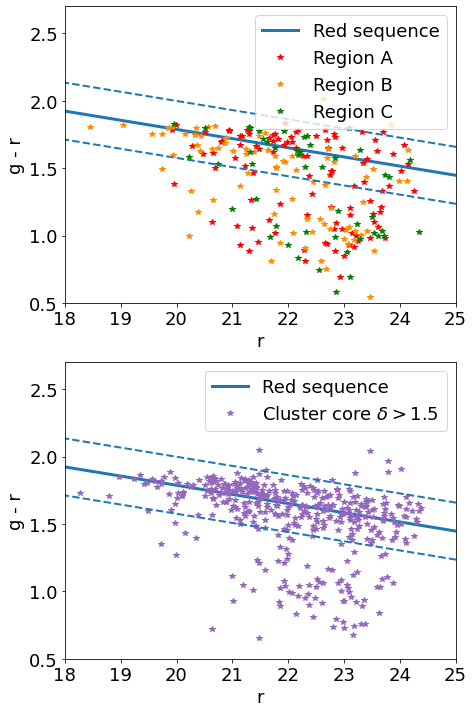

In [47]:
plt.figure(figsize=(7,12))


plt.rcParams["font.size"] = 18
#plt.tight_layout()
plt.subplot(211)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_a]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_a]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_a]
qqq1 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
plt.plot(www, zzz,'*', c='red', alpha=1,label='Region A')
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_b]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_b]
qqq2 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
plt.plot(www, zzz,'*', c='darkorange', alpha=1,label='Region B')
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_c]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_c]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_c]
qqq3 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Red galaxies: '+str(qqq1.sum()+qqq2.sum()+qqq3.sum())+' ('+str((qqq1.sum()+qqq2.sum()+qqq3.sum())*100/(len(qqq1)+len(qqq2)+len(qqq3)))+' %)')
plt.plot(www, zzz,'*', c='green', alpha=1,label='Region C')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.ylabel("g - r")
plt.xlabel("r")
plt.xlim(18,25)
plt.ylim(0.5,2.7)
plt.legend(loc=1)


plt.subplot(212)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3b]-df_photo_cluster['MAG_AP3_r'][bool_all_3b]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='tab:purple', alpha=1,label=r'Cluster core $\delta>1.5$')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.ylabel("g - r")
plt.xlabel("r")
plt.xlim(18,25)
plt.ylim(0.5,2.7)
plt.legend(loc=1)


#plt.savefig('redsequence_comparison.png')

In [ ]:
_="""fig = plt.figure(figsize=(7,12))
ax = fig.add_axes(rect_scatter)
#ax_histx = fig.add_axes(rect_histx, sharex=ax)
ax_histy = fig.add_axes(rect_histy, sharey=ax)


plt.rcParams["font.size"] = 18
#plt.tight_layout()
plt.subplot(211)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_a]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_a]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_a]
qqq1 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)

#scatter_hist(www, zzz, ax, ax_histy)


www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_b]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_b]
qqq2 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
plt.plot(www, zzz,'*', c='darkorange', alpha=1,label='Region B')
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_c]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_c]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_c]
qqq3 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Red galaxies: '+str(qqq1.sum()+qqq2.sum()+qqq3.sum())+' ('+str((qqq1.sum()+qqq2.sum()+qqq3.sum())*100/(len(qqq1)+len(qqq2)+len(qqq3)))+' %)')
plt.plot(www, zzz,'*', c='green', alpha=1,label='Region C')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.ylabel("g - r")
plt.xlabel("r")
plt.xlim(18,25)
plt.ylim(0.5,2.7)
plt.legend(loc=1)


plt.subplot(212)
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')
########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3b]-df_photo_cluster['MAG_AP3_r'][bool_all_3b]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='tab:purple', alpha=1,label=r'Cluster core $\delta>1.5$')
########
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.ylabel("g - r")
plt.xlabel("r")
plt.xlim(18,25)
plt.ylim(0.5,2.7)
plt.legend(loc=1)


#plt.savefig('redsequence_comparison_histo.png')"""

In [ ]:
_="""plt.figure(figsize=(7,7))


plt.rcParams["font.size"] = 18

plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence')

########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3b]-df_photo_cluster['MAG_AP3_r'][bool_all_3b]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
plt.plot(www, zzz,'*', c='olive', alpha=0.6,label=r'Cluster core')
########

########
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_a]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_a]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_a]
qqq1 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
plt.plot(www, zzz,'*', c='red', alpha=1,label='Outskirts overdensities')
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_b]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_b]
qqq2 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
plt.plot(www, zzz,'*', c='red', alpha=1,label='')
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_c]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_c]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_c]
qqq3 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Red galaxies: '+str(qqq1.sum()+qqq2.sum()+qqq3.sum())+' ('+str((qqq1.sum()+qqq2.sum()+qqq3.sum())*100/(len(qqq1)+len(qqq2)+len(qqq3)))+' %)')
plt.plot(www, zzz,'*', c='red', alpha=1,label='')
########



plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.ylabel("g - r")
plt.xlabel("r")
plt.xlim(18,25)
plt.ylim(0.5,2.7)
plt.legend(loc=1)


plt.savefig('redsequence_comparison_v2.png')"""

Blue galaxies cluster core: 83 (20.145631067961165 %)
Red galaxies cluster core: 329 (79.85436893203884 %)

103
Blue galaxies region A: 41 (39.80582524271845 %)
Red galaxies region A: 62 (60.19417475728155 %)
81
Blue galaxies region B: 35 (43.20987654320987 %)
Red galaxies region B: 46 (56.79012345679013 %)
48
Blue galaxies region C: 21 (43.75 %)
Red galaxies region C: 27 (56.25 %)

Blue galaxies all outskirts: 97 (41.810344827586206 %)
Red galaxies all outskirts: 135 (58.189655172413794 %)


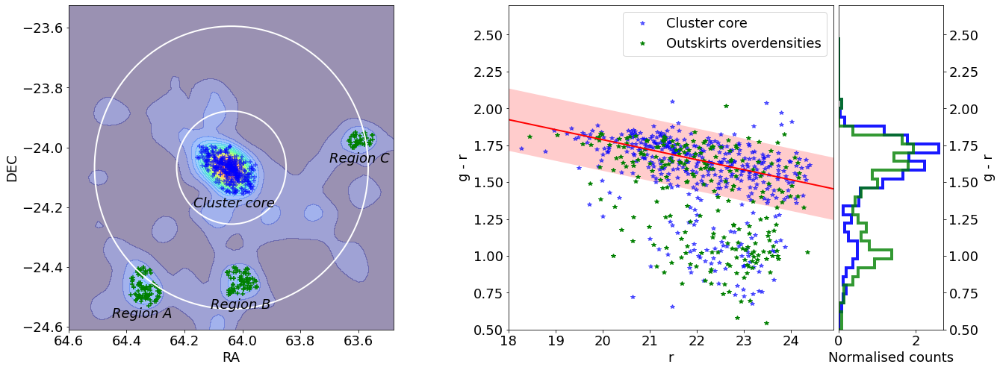

In [441]:


fig = plt.figure(figsize=(21,8))
plt.rcParams["font.size"] = 18
gs = gridspec.GridSpec(1, 8, wspace=0.05)
ax_reg = plt.subplot(gs[0, 0:3])
ax_rs = plt.subplot(gs[0, 4:7])
ax_hist = plt.subplot(gs[0, 7],sharey=ax_rs)

"""gs = gridspec.GridSpec(1, 9, wspace=0.05)
ax_reg = plt.subplot(gs[0, 0:3])
ax_rs = plt.subplot(gs[0, 4:7])
ax_hist0 = plt.subplot(gs[0, 7],sharey=ax_rs)
ax_hist = plt.subplot(gs[0, 8],sharey=ax_rs)
"""

ax_reg.contourf(ra_central, dec_central,kernel_photocluster_rs,levels=22,alpha=0.5,cmap='turbo')
ax_reg.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_a],df_photo_cluster['DEC_r'][bool_allgal_rs_a],marker='+',c='green',label=r'Region A')
ax_reg.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_b],df_photo_cluster['DEC_r'][bool_allgal_rs_b],marker='+',c='green',label=r'Region B')
ax_reg.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_c],df_photo_cluster['DEC_r'][bool_allgal_rs_c],marker='+',c='green',label=r'Region C')
ax_reg.scatter(df_photo_cluster['RA_r'][bool_all_3b],df_photo_cluster['DEC_r'][bool_all_3b],marker='+',c='b',alpha=0.6,label=r'Cluster core')


ax_reg.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='w',lw=2,ls='-'))    
ax_reg.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='w',lw=2))  
#ax_reg.add_artist(patches.Circle((64.038083, -24.067527), (5.7*0.0945),fill=False,color='w',lw=2))  


#ax_reg.text(64.0380, -24.2, r'$2r_{200}$', style='italic',color='k')
#ax_reg.text(64.0380, -24.52, r'$5r_{200}$', style='italic',color='k')

ax_reg.text(64.45, -24.57, r'Region A', style='italic',color='k')
ax_reg.text(64.11, -24.54, r'Region B', style='italic',color='k')
ax_reg.text(63.7, -24.05, r'Region C', style='italic',color='k')
ax_reg.text(64.17, -24.2, r'Cluster core', style='italic',color='k')

ax_reg.set(xlabel='RA',ylabel='DEC')
ax_reg.invert_xaxis()
#ax_reg.legend(loc=2,framealpha=1,facecolor='w')




########
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3b]-df_photo_cluster['MAG_AP3_r'][bool_all_3b]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
bluegal = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Blue galaxies cluster core: '+str(bluegal.sum())+' ('+str(bluegal.sum()*100/len(bluegal))+' %)')
print('Red galaxies cluster core: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')
ax_rs.plot(www, zzz,'*', c='b', alpha=0.6,label=r'Cluster core')
########
print()
########
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_a]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_a]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_a]
qqq1 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
bluegal1 = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
ax_rs.plot(www, zzz,'*', c='green', alpha=1,label='Outskirts overdensities')
print(len(qqq1))
print('Blue galaxies region A: '+str(bluegal1.sum())+' ('+str(bluegal1.sum()*100/len(bluegal1))+' %)')
print('Red galaxies region A: '+str(qqq1.sum())+' ('+str(qqq1.sum()*100/len(qqq1))+' %)')
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_b]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_b]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_b]
qqq2 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
bluegal2 = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
ax_rs.plot(www, zzz,'*', c='green', alpha=1,label='')
print(len(qqq2))
print('Blue galaxies region B: '+str(bluegal2.sum())+' ('+str(bluegal2.sum()*100/len(bluegal2))+' %)')
print('Red galaxies region B: '+str(qqq2.sum())+' ('+str(qqq2.sum()*100/len(qqq2))+' %)')
www = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_c]
zzz = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_c]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_c]
qqq3 = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
bluegal3 = zzz < (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
ax_rs.plot(www, zzz,'*', c='green', alpha=1,label='')
print(len(qqq3))
print('Blue galaxies region C: '+str(bluegal3.sum())+' ('+str(bluegal3.sum()*100/len(bluegal3))+' %)')
print('Red galaxies region C: '+str(qqq3.sum())+' ('+str(qqq3.sum()*100/len(qqq3))+' %)')


print()
print('Blue galaxies all outskirts: '+str(bluegal1.sum()+bluegal2.sum()+bluegal3.sum())+' ('+str((bluegal1.sum()+bluegal2.sum()+bluegal3.sum())*100/(len(bluegal1)+len(bluegal2)+len(bluegal3)))+' %)')
print('Red galaxies all outskirts: '+str(qqq1.sum()+qqq2.sum()+qqq3.sum())+' ('+str((qqq1.sum()+qqq2.sum()+qqq3.sum())*100/(len(qqq1)+len(qqq2)+len(qqq3)))+' %)')




########

bool_rs_abc = bool_allgal_rs_a|bool_allgal_rs_b|bool_allgal_rs_c
ax_rs.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='r',lw=2,label='')
ax_rs.fill_between(x, (rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep), (rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep), facecolor='r', alpha=0.2)

#ax_rs.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='k',lw=3,label='')
#ax_rs.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='k',lw=2,label='')
#ax_rs.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='k',lw=2,label='')
ax_rs.set(ylabel="g - r",xlabel="r",xlim=(18,24.9),ylim=(0.5,2.7))
#ax_rs.xaxis.set_ticklabels([18,19,20,21,22,23,24])
ax_rs.legend(loc=1)


zzz_regions = df_photo_cluster['MAG_AP3_g'][bool_rs_abc]-df_photo_cluster['MAG_AP3_r'][bool_rs_abc]
zzz_core = df_photo_cluster['MAG_AP3_g'][bool_all_3b]-df_photo_cluster['MAG_AP3_r'][bool_all_3b]


#sns.kdeplot(x=df_photo_cluster['MAG_AUTO_r'][bool_all_3b], y=zzz_core,ax=ax_rs,gridsize=60,levels=[.05,.25,.50,.75],zorder=5,color='k')
#sns.kdeplot(x=df_photo_cluster['MAG_AUTO_r'][bool_rs_abc], y=zzz_regions,ax=ax_rs,gridsize=60,levels=[.05,.25,.50,.75],zorder=5,color='k')








ax_hist.hist(zzz_core,bins=np.arange(0.5,2.5,0.06),density=True,orientation='horizontal',align='mid',facecolor='none',edgecolor='b',histtype ='step',lw=4,alpha=0.9)
ax_hist.hist(zzz_regions,bins=np.arange(0.5,2.5,0.06),density=True,orientation='horizontal',align='mid',facecolor='none',edgecolor='green',histtype ='step',lw=4,alpha=0.8)

"""ax_hist0.hist(df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_a]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_a],
             bins=np.arange(0.5,2.5,0.062),density=True,orientation='horizontal',align='mid',facecolor='none',
             edgecolor='tab:red',label='A',histtype ='step',ls='--',lw=2,alpha=0.99)


ax_hist0.hist(df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_b]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_b],
             bins=np.arange(0.5,2.5,0.059),density=True,orientation='horizontal',align='mid',facecolor='none',
             edgecolor='tab:orange',label='B',histtype ='step',ls='--',lw=2,alpha=0.99)


ax_hist0.hist(df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_c]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_c],
             bins=np.arange(0.5,2.5,0.061),density=True,orientation='horizontal',align='mid',facecolor='none',
             edgecolor='tab:purple',label='C',histtype ='step',ls='--',lw=2,alpha=0.99)
ax_hist0.yaxis.set_ticklabels([])
ax_hist0.legend()
"""

ax_hist.set(xlabel='Normalised counts',ylabel='g - r')
ax_hist.yaxis.set_label_position("right")
ax_hist.yaxis.tick_right()

#ax_reg.add_artist(patches.Circle((df_photo_cluster['RA_r'][bool_allgal_rs_a].mean(), df_photo_cluster['DEC_r'][bool_allgal_rs_a].mean()), (0.05),fill=False,color='k',lw=2,ls='-'))    



#plt.show()
#plt.savefig('redsequence_comparison_v4.png')



In [55]:
df_photo_cluster['PHYS_PARA7_BEST'][bool_allgal_rs_a].describe()

count    103.0
mean     -99.0
std        0.0
min      -99.0
25%      -99.0
50%      -99.0
75%      -99.0
max      -99.0
Name: PHYS_PARA7_BEST, dtype: float64

In [461]:
# virial radius in degrees
r_200_deg        = 0.0945
# center of the field in degrees
field_center_deg = (64.038083, -24.067527)
# distance in degrees for all the galaxies to the center of the field
distances_deg    = np.sqrt(((df_photo_cluster['RA_r']-field_center_deg[0])**2)+((df_photo_cluster['DEC_r']-field_center_deg[1])**2))
# distances in virial radius for all the galaxies 
distances_over_r200 = distances_deg/r_200_deg


In [706]:

a1 = df_photo_cluster['RA_r'].min()
b1 = df_photo_cluster['RA_r'].max()

a2 = df_photo_cluster['DEC_r'].min()
b2 = df_photo_cluster['DEC_r'].max()

fake_ra_flat = (b1 - a1) * np.random.random_sample(4000) + a1
fake_ra_norm = np.random.normal(df_photo_cluster['RA_r'].mean(),0.1,len(df_photo_cluster['RA_r']))

fake_dec_flat = (b2 - a2) * np.random.random_sample(4000) + a2
fake_dec_norm = np.random.normal(df_photo_cluster['DEC_r'].mean(),0.1,len(df_photo_cluster['DEC_r']))

# distance in degrees for all the galaxies to the center of the field
fake_flat_distances_deg    = np.sqrt(((fake_ra_flat-field_center_deg[0])**2)+((fake_dec_flat-field_center_deg[1])**2))
fake_norm_distances_deg    = np.sqrt(((fake_ra_norm-field_center_deg[0])**2)+((fake_dec_norm-field_center_deg[1])**2))
# distances in virial radius for all the galaxies 
fake_flat_distances_over_r200 = fake_flat_distances_deg/r_200_deg
fake_norm_distances_over_r200 = fake_norm_distances_deg/r_200_deg



In [1043]:
#bins_corrected = np.append(np.linspace(0,3,210),np.linspace(3.1,5.7,20))
bins_corrected = np.linspace(0,5.7,400)

#print(bins_corrected)

0.012086601831894146
7.999175589636255


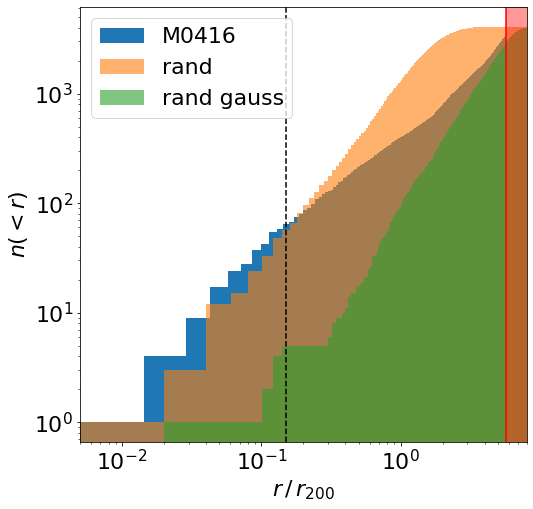

In [1044]:
print(distances_over_r200.min())
print(distances_over_r200.max())
plt.figure(figsize=(8,8))
hist_cumulative, bins_cumulative, patch_cumulative = plt.hist(distances_over_r200,bins=bins_corrected,cumulative=True,color='tab:blue',label='M0416')
bins_center_cumulative = (bins_cumulative[:-1]+bins_cumulative[1:])/2


plt.hist(fake_norm_distances_over_r200,bins=np.linspace(0,8,400),alpha=0.6,cumulative=True,color='tab:orange',label='rand')
plt.hist(fake_flat_distances_over_r200,bins=np.linspace(0,8,400),alpha=0.6,cumulative=True,color='tab:green',label='rand gauss')
plt.axvline(0.15,ls='--',c='k')#,label=r'$0.15r_{200}$')
#plt.axvline(1,c='b',label=r'$r_{200}$')
#plt.axvline(2,c='g',label=r'$2 \, r_{200}$')
plt.axvline(5.7,c='r')#,label=r'$5.7 \, r_{200}$')
plt.axvspan(5.7,8,color='r',alpha=.4,lw=1)



plt.xlim(0.005,8)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$r \, / \, r_{200}$')
plt.ylabel(r'$n(<r)$')
plt.legend()

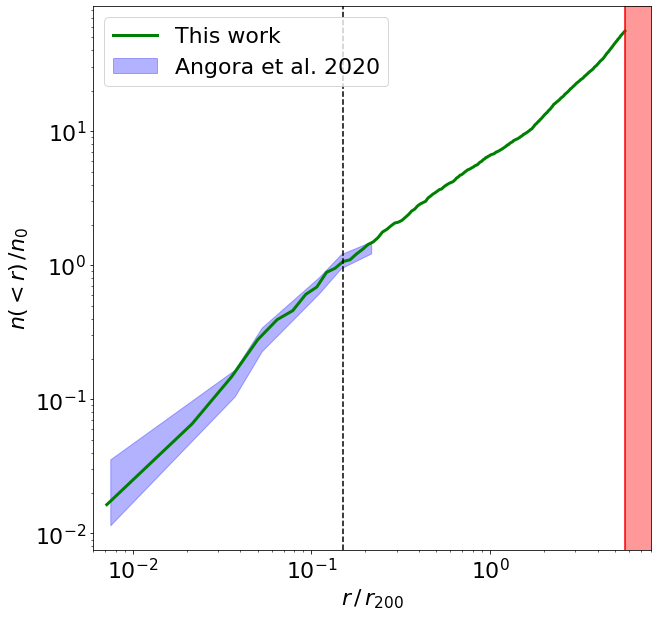

In [1045]:
angora_cumulative_x = [0.007468604063867926, 0.03718968802713251, 0.052702471966068344, 0.11021825252050108, 0.14638378006602915, 0.21602650640268875]
angora_cumulative_ydown = [0.011502003109295037, 0.1052202786328342, 0.2286209484393457, 0.6166734467659475, 0.950387143042547, 1.2257383947588967]
angora_cumulative_yup = [0.035685039995367894, 0.16633914894596186, 0.34348802605181455, 0.8158347688836989, 1.2102439719957478, 1.5024346123861163]


plt.figure(figsize=(10,10))
plt.rcParams["font.size"] = 22
plt.fill_between(angora_cumulative_x,angora_cumulative_ydown, angora_cumulative_yup, facecolor='b', alpha=0.3,edgecolor='b',label='Angora et al. 2020')

plt.plot(bins_center_cumulative,hist_cumulative/n0,c='green',lw=3,label='This work')

plt.axvline(0.15,ls='--',c='k')
plt.axvline(5.7,c='r')
plt.axvspan(5.7,8,color='r',alpha=.4,lw=1)

plt.xlim(0.006,8)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$r \, / \, r_{200}$')
plt.ylabel(r'$n(<r) \, / n_0$')
plt.legend()

(50,)
(49,)
[  1.   0.   0.   0.   3.   2.   1.   4.   7.   6.   4.   8.  10.  12.
   8.  14.  17.  23.  16.  34.  36.  36.  44.  46.  60.  54.  79.  85.
 166. 227. 248. 292. 379. 620. 860.]


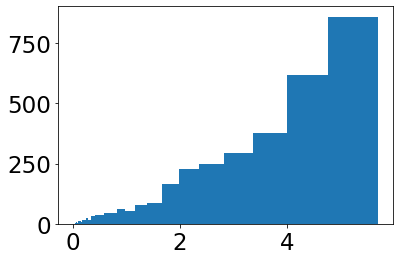

In [1111]:

bins_diff = np.geomspace(0.001,5.7,50)

#bins_diff = np.linspace(0,5.7,400)
#bins_diff = np.append(np.linspace(0,3,210),np.linspace(3.1,5.7,20))

hist_non_cumulative, bins_non_cumulative, patch_non_cumulative = plt.hist(distances_over_r200,bins=bins_diff,cumulative=False,color='tab:blue',label='M0416')

print(bins_non_cumulative.shape)
print(hist_non_cumulative.shape)

hist_non_cumulative = hist_non_cumulative[14:]
print(hist_non_cumulative)

bins_center_non_cumulative = (bins_non_cumulative[:-1]+bins_non_cumulative[1:])/2
bins_center_non_cumulative = bins_center_non_cumulative[14:]

# hist_non_cumulative[1]=1
# hist_non_cumulative[2]=1
# hist_non_cumulative[3]=1
#print(hist_non_cumulative)


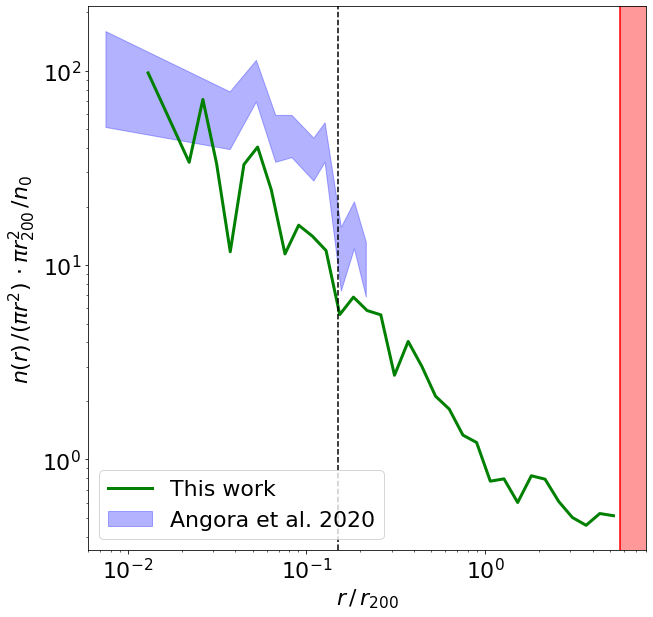

In [1102]:
angora_x = [0.00748386378309054, 0.037147540933436536, 0.05209346155334629, 0.06686130134652761, 0.08242973735991993, 0.10926008611173785, 0.12629861887442667, 0.15570684047537317, 0.18438868442785614, 0.21486606589958926]
angora_ydown = [51.32687549978095, 39.495873582881856, 69.4031704750398, 33.96522397330474, 35.90644540186084, 27.194605220720856, 33.96522397330474, 7.3954655311085835, 12.195704601594409, 6.88542947750051]
angora_yup = [159.75272534639163,78.18140093019888,113.54615015036016,59.21255390514015,59.21255390514015,45.20353656360243,54.260370967360274,15.723590480619725,21.261123338996555,13.203517797162949]

hist_non_cumulative_corrected = (hist_non_cumulative/(np.pi*(bins_center_non_cumulative**2)))*((np.pi)/(n0))

plt.figure(figsize=(10,10))
plt.rcParams["font.size"] = 22
plt.plot(bins_center_non_cumulative,hist_non_cumulative_corrected,color='green',lw=3,label='This work')
plt.fill_between(angora_x,angora_ydown,angora_yup, facecolor='blue',edgecolor='b',alpha=0.3,label='Angora et al. 2020')



plt.axvline(0.15,ls='--',c='k')
plt.axvline(5.7,c='r')
plt.axvspan(5.7,8,color='r',alpha=.4,lw=1)



plt.xlim(0.006,8)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$r \, / \, r_{200}$')
plt.ylabel(r'$n(r) \, / (\pi r^2) \, \cdot \pi r^2_{200} \, / n_0$')
plt.legend()

In [1103]:
m0416_cum_angora = np.loadtxt('m0416_cum.txt')
m0416_diff_angora = np.loadtxt('m0416_diff.txt')

m0416_cum_angora_x = m0416_cum_angora.T[0]
m0416_cum_angora_y = m0416_cum_angora.T[1]
m0416_cum_angora_sig = m0416_cum_angora.T[2]

m0416_diff_angora_x = m0416_diff_angora.T[0]
m0416_diff_angora_y = m0416_diff_angora.T[1]
m0416_diff_angora_sig = m0416_diff_angora.T[2]

In [1104]:
#y_cum = N_R/N_0 
#sigma_y_cum = y_cum*(1/N_R + N_0)^0.5
y_cum = hist_cumulative/n0
sigma_y_cum = y_cum*((1/hist_cumulative +1/n0)**0.5)
### sigma_y_cum = y_cum*((hist_cumulative**(-1.5) + n0**(-1.5))**0.5)

#y_diff = N_R*pi*r200**2/A/N_0
#sigma_y_diff = y_diff*(1/N_R+1/N_0+(2*er200/r200_c)**2)^0.5
y_diff = hist_non_cumulative*np.pi/(np.pi*(bins_center_non_cumulative**2))/n0
sigma_y_diff = y_diff*(1/hist_non_cumulative+1/n0)**0.5

# sigma_y_cum[0]=0.6*sigma_y_cum[0]
# sigma_y_diff[0]=0.8*sigma_y_diff[0]
# sigma_y_diff[1]=0.6*sigma_y_diff[1]
# sigma_y_diff[2]=0.6*sigma_y_diff[2]
# sigma_y_diff[3]=0.6*sigma_y_diff[3]
# sigma_y_diff[4]=0.6*sigma_y_diff[4]
# sigma_y_diff[6]=0.6*sigma_y_diff[6]

In [1105]:
print(sigma_y_diff)

[9.81654513e+01 6.89695914e+01 4.84570129e+01 3.40451792e+01
 4.20929515e+01 2.39575842e+01 1.18073539e+01 1.69880056e+01
 1.61494666e+01 1.04271764e+01 5.89168273e+00 6.03144264e+00
 4.80595636e+00 3.75060810e+00 2.09179037e+00 2.02694635e+00
 1.60036245e+00 1.35721652e+00 7.61464946e-01 8.66253113e-01
 6.32819204e-01 4.44609395e-01 3.59303536e-01 2.60561529e-01
 2.22334462e-01 1.44471859e-01 1.35460916e-01 1.00814110e-01
 1.23424504e-01 1.14220110e-01 8.68835320e-02 7.07962332e-02
 6.32668631e-02 7.07291998e-02 6.80624174e-02]


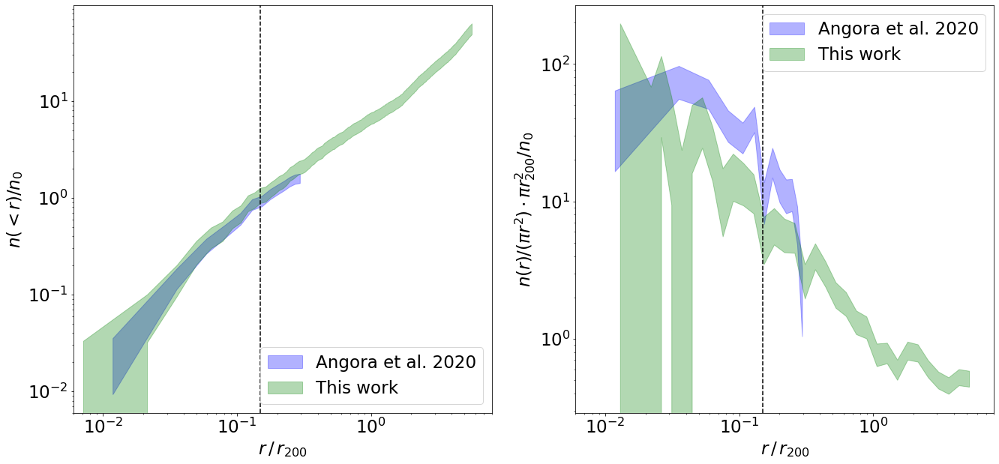

In [1106]:
plt.figure(figsize=(22,10))
plt.rcParams["font.size"] = 23

plt.subplot(121)
plt.fill_between(m0416_cum_angora_x,m0416_cum_angora_y-m0416_cum_angora_sig, m0416_cum_angora_y+m0416_cum_angora_sig, facecolor='b', alpha=0.3,edgecolor='b',label='Angora et al. 2020')
plt.fill_between(bins_center_cumulative,y_cum-sigma_y_cum, y_cum+sigma_y_cum, facecolor='green', alpha=0.3,edgecolor='green',label='This work')
#plt.plot(bins_center_cumulative,y_cum,c='green',lw=3,label='')

plt.axvline(0.15,ls='--',c='k')
#plt.axvline(5.7,c='r')
#plt.axvspan(5.7,8,color='r',alpha=.4,lw=1)

plt.xlim(0.006,8)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$r \, / \, r_{200}$')
plt.ylabel(r'$n(<r)/n_0$')
plt.legend(loc=4)

plt.subplot(122)
#plt.plot(bins_center_non_cumulative,hist_non_cumulative_corrected,color='green',lw=3,label='This work')
#plt.plot(bins_center_non_cumulative,y_diff,color='green',lw=3,label='')
plt.fill_between(m0416_diff_angora_x,m0416_diff_angora_y-m0416_diff_angora_sig,m0416_diff_angora_y+m0416_diff_angora_sig, facecolor='blue',edgecolor='b',alpha=0.3,label='Angora et al. 2020')
plt.fill_between(bins_center_non_cumulative,y_diff-sigma_y_diff,y_diff+sigma_y_diff, facecolor='green',edgecolor='green',alpha=0.3,label='This work')

plt.axvline(0.15,ls='--',c='k')
#plt.axvline(5.7,c='r')
#plt.axvspan(5.7,8,color='r',alpha=.4,lw=1)

plt.xlim(0.006,8)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$r \, / \, r_{200}$')
plt.ylabel(r'$n(r)/(\pi r^2)\cdot \pi r^2_{200} / n_0$')
plt.legend()

#plt.savefig('radial_histogram.png')

In [542]:
n0 = (distances_over_r200 < 0.15).sum()
print(n0)

61


In [543]:
distances_over_r200.describe()

count    4067.000000
mean        3.849183
std         1.855145
min         0.012087
25%         2.389267
50%         4.148545
75%         5.321729
max         7.999176
dtype: float64

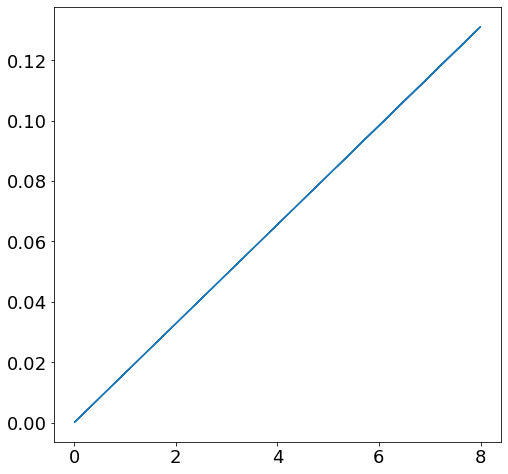

In [544]:
plt.figure(figsize=(8,8))

plt.plot(distances_over_r200,distances_over_r200/61)




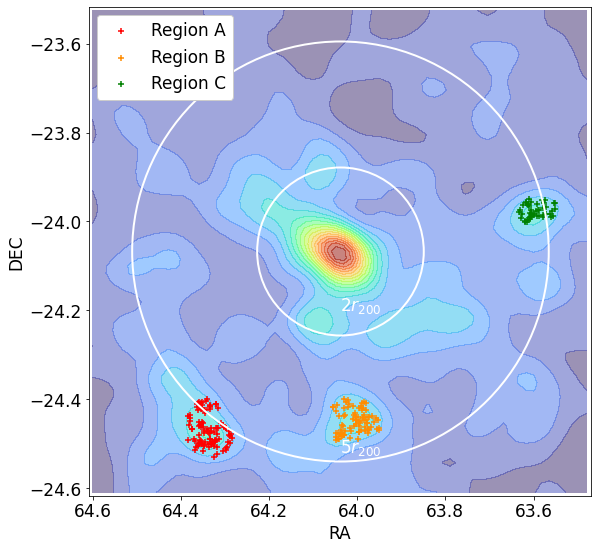

In [99]:
plt.figure(figsize=(9,9))
plt.rcParams["font.size"] = 17

fig = plt.gcf()
ax  = fig.gca()
plt.contourf(ra_central, dec_central,kernel_photocluster,levels=22,alpha=0.5,cmap='turbo')

"""plt.scatter(df_photo_cluster['RA_r'][bool_all_1],df_photo_cluster['DEC_r'][bool_all_1],marker='o',s=6,color='tab:pink',label=r'$-1<\delta<0$')
plt.scatter(df_photo_cluster['RA_r'][bool_all_2],df_photo_cluster['DEC_r'][bool_all_2],marker='o',s=6,color='tab:cyan',label=r'  $0<\delta<1$')
plt.scatter(df_photo_cluster['RA_r'][bool_all_3],df_photo_cluster['DEC_r'][bool_all_3],marker='o',s=6,color='tab:olive',label=r'        $\delta>1$')
"""
plt.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_a],df_photo_cluster['DEC_r'][bool_allgal_rs_a],marker='+',c='red',label=r'Region A')
plt.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_b],df_photo_cluster['DEC_r'][bool_allgal_rs_b],marker='+',c='darkorange',label=r'Region B')
plt.scatter(df_photo_cluster['RA_r'][bool_allgal_rs_c],df_photo_cluster['DEC_r'][bool_allgal_rs_c],marker='+',c='green',label=r'Region C')

ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='w',lw=2,ls='-'))    
ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='w',lw=2))    

ax.text(64.0380, -24.2, r'$2r_{200}$', style='italic',color='w')
ax.text(64.0380, -24.52, r'$5r_{200}$', style='italic',color='w')

plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()

plt.legend(loc=2,framealpha=1,facecolor='w')


#plt.savefig('map_regions_2.png')

In [167]:

demarco1 =  SkyCoord('04h15m39.3s', '-24d08m50.6s', frame='icrs')
demarco2 =  SkyCoord('04h16m11.8s', '-24d03m42.5s', frame='icrs')
demarco3 =  SkyCoord('04h16m17.2s', '-24d14m58.9s', frame='icrs')
demarco4 =  SkyCoord('04h15m58.7s', '-24d03m07.4s', frame='icrs')
demarco5 =  SkyCoord('04h16m20.4s', '-24d12m51.2s', frame='icrs')
demarco6 =  SkyCoord('04h15m20.7s', '-23d54m18.0s', frame='icrs')
demarco7 =  SkyCoord('04h16m10.5s', '-24d03m45.5s', frame='icrs')
demarco8 =  SkyCoord('04h15m25.2s', '-23d53m51.8s', frame='icrs')
demarco9 =  SkyCoord('04h16m08.60s', '-24d04m25.2s', frame='icrs')
demarco10 =  SkyCoord('04h15m50.3s', '-23d56m22.0s', frame='icrs')
demarco11 =  SkyCoord('04h16m13.5s', '-23d55m54.0s', frame='icrs')
demarco12 =  SkyCoord('04h16m10.2s', '-24d04m32.9s', frame='icrs')
demarco13 =  SkyCoord('04h16m07.3s', '-24d08m43.5s', frame='icrs')
demarco14 =  SkyCoord('04h16m21.4s', '-24d11m21.3s', frame='icrs')
demarco15 =  SkyCoord('04h16m40.9s', '-24d04m45.5s', frame='icrs')

print(demarco1)
print(demarco2)
print(demarco3)
print(demarco4)
print(demarco5)
print(demarco6)
print(demarco7)
print(demarco8)
print(demarco9)
print(demarco10)
print(demarco11)
print(demarco12)
print(demarco13)
print(demarco14)
print(demarco15)


<SkyCoord (ICRS): (ra, dec) in deg
    (63.91375, -24.14738889)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.04916667, -24.06180556)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.07166667, -24.24969444)>
<SkyCoord (ICRS): (ra, dec) in deg
    (63.99458333, -24.05205556)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.085, -24.21422222)>
<SkyCoord (ICRS): (ra, dec) in deg
    (63.83625, -23.905)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.04375, -24.06263889)>
<SkyCoord (ICRS): (ra, dec) in deg
    (63.855, -23.89772222)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.03583333, -24.07366667)>
<SkyCoord (ICRS): (ra, dec) in deg
    (63.95958333, -23.93944444)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.05625, -23.93166667)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.0425, -24.07580556)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.03041667, -24.14541667)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.08916667, -24.18925)>
<SkyCoord (ICRS): (ra, dec) in deg
    (64.17041667, -24.07930556)>


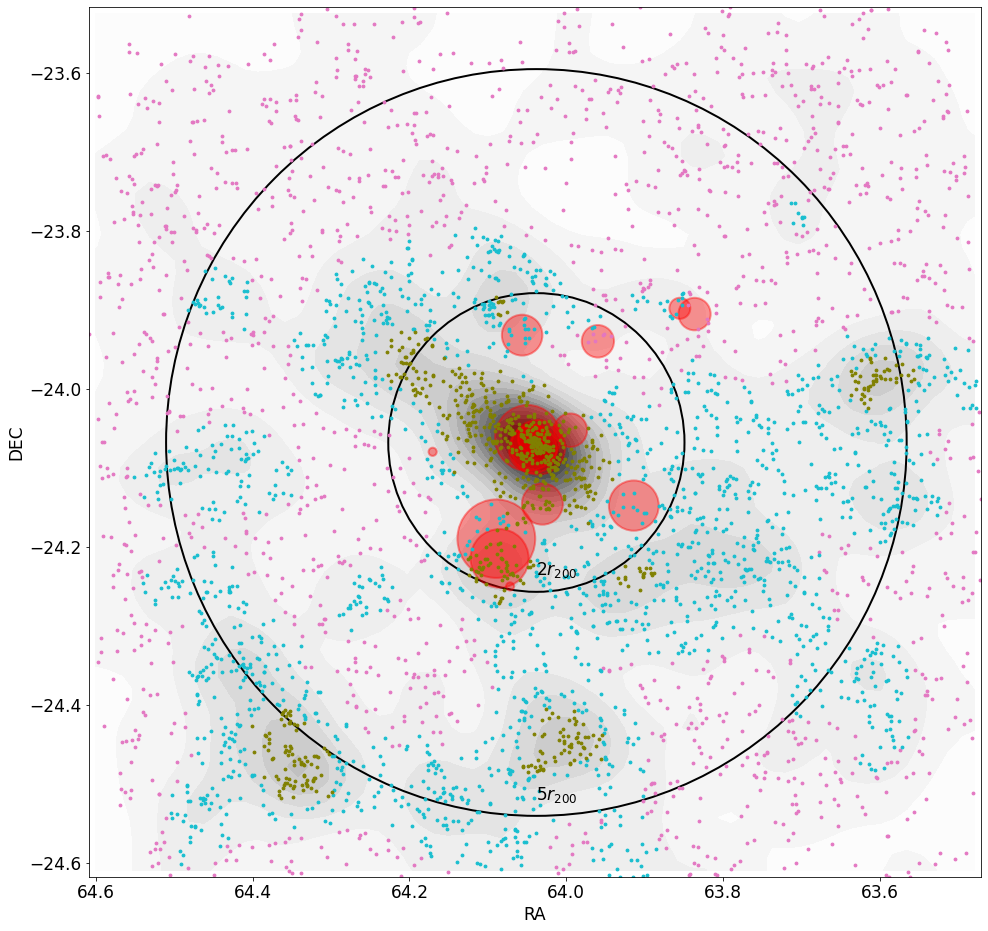

In [1097]:
from descartes.patch import PolygonPatch


plt.figure(figsize=(16,16))
plt.rcParams["font.size"] = 17

fig = plt.gcf()
ax  = fig.gca()
plt.contourf(ra_central, dec_central,kernel_photocluster,levels=22,alpha=1,cmap='Greys')

plt.scatter(df_photo_cluster['RA_r'][bool_all_1],df_photo_cluster['DEC_r'][bool_all_1],marker='o',s=8,zorder=2,color='tab:pink',label=r'$-1<\delta<0$')
plt.scatter(df_photo_cluster['RA_r'][bool_all_2],df_photo_cluster['DEC_r'][bool_all_2],marker='o',s=8,zorder=2,color='tab:cyan',label=r'  $0<\delta<1$')
plt.scatter(df_photo_cluster['RA_r'][bool_all_3],df_photo_cluster['DEC_r'][bool_all_3],marker='o',s=8,zorder=2,color='olive',label=r'        $\delta>1$')

#ax.add_artist(patches.Circle((64.038083, -24.067527), (0.0945),fill=False,color='k',lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.038083, -24.067527), (2*0.0945),fill=False,color='k',lw=2,ls='-'))    
ax.add_artist(patches.Circle((64.038083, -24.067527), (5*0.0945),fill=False,color='k',lw=2))    

#ax.text(64.0380, -24.19, r'$r_{200}$', style='italic',color='k')
ax.text(64.0380, -24.235, r'$2r_{200}$', style='italic',color='k')
ax.text(64.0380, -24.52, r'$5r_{200}$', style='italic',color='k')
"""patchA = PolygonPatch(poly_a_rs, facecolor='None', edgecolor='red', alpha=0.99, zorder=3,lw=2.5,label='Region A')
patchB = PolygonPatch(poly_b_rs, facecolor='None', edgecolor='darkorange', alpha=0.99, zorder=3,lw=2.5,label='Region B')
patchC = PolygonPatch(poly_c_rs, facecolor='None', edgecolor='green', alpha=0.99, zorder=3,lw=2.5,label='Region C')
ax.add_patch(patchA)
ax.add_patch(patchB)
ax.add_patch(patchC)"""

plt.xlabel('RA')
plt.ylabel('DEC')
plt.xlim(df_photo_cluster['RA_r'].min(),df_photo_cluster['RA_r'].max())
plt.ylim(df_photo_cluster['DEC_r'].min(),df_photo_cluster['DEC_r'].max())
plt.gca().invert_xaxis()

ax.add_artist(patches.Circle((63.91375, -24.14738889), (0.031786),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.04916667, -24.06180556), (0.041758),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.07166667, -24.24969444), (0.005194),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((63.99458333, -24.05205556), (0.021242),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.085, -24.21422222), (0.037083),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((63.83625, -23.905), (0.020567),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.04375, -24.06263889), (0.017866),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((63.855, -23.89772222), (0.013348),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.03583333, -24.07366667), (0.034590),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((63.95958333, -23.93944444), (0.020567),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.05625, -23.93166667), (0.025865),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 

ax.add_artist(patches.Circle((64.0425, -24.07580556), (0.030695),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 

ax.add_artist(patches.Circle((64.03041667, -24.14541667), (0.026125),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.08916667, -24.18925), (0.049652),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 
ax.add_artist(patches.Circle((64.17041667, -24.07930556), (0.005194),fill=True,color='r',alpha=0.4,lw=2,ls='-')) 


#ax.add_artist(patches.Circle((64.13419583, -24.08842417), (0.01),fill=True,color='g',alpha=0.8,lw=2,ls='-')) 

"""    (63.91375, -24.14738889)
    (64.04916667, -24.06180556)
    (64.07166667, -24.24969444)
    (63.99458333, -24.05205556)
    (64.085, -24.21422222)
    (63.83625, -23.905)
    (64.04375, -24.06263889)
    (63.855, -23.89772222)
    (64.03583333, -24.07366667)
    (63.95958333, -23.93944444)
    (64.05625, -23.93166667)
    
    (64.0425, -24.07580556)>
    (64.03041667, -24.14541667)>
    (64.08916667, -24.18925)>
    (64.17041667, -24.07930556)>
0.61 Mpc are 0.031786 deg at redshift 0.404
0.80 Mpc are 0.041758 deg at redshift 0.403
0.10 Mpc are 0.005194 deg at redshift 0.406
0.41 Mpc are 0.021242 deg at redshift 0.390
0.71 Mpc are 0.037083 deg at redshift 0.389
0.40 Mpc are 0.020567 deg at redshift 0.399
0.34 Mpc are 0.017866 deg at redshift 0.400
0.26 Mpc are 0.013348 deg at redshift 0.397
0.67 Mpc are 0.034590 deg at redshift 0.397
0.40 Mpc are 0.020567 deg at redshift 0.395
0.50 Mpc are 0.025865 deg at redshift 0.396

0.59 Mpc are 0.030695 deg at redshift 0.396
0.50 Mpc are 0.026125 deg at redshift 0.394
0.96 Mpc are 0.049652 deg at redshift 0.394
0.10 Mpc are 0.005194 deg at redshift 0.395"""

#plt.legend(loc=2,framealpha=1,facecolor='w')


#plt.savefig('map_regions_VS_OlaveRojas.png')

In [129]:
print(len(df_photo_cluster['RA_r'][bool_all_1]))
print(len(df_photo_cluster['RA_r'][bool_all_2]))
print(len(df_photo_cluster['RA_r'][bool_all_3]))


1507
1778
782


<AxesSubplot:xlabel='MAG_AUTO_r', ylabel='Density'>

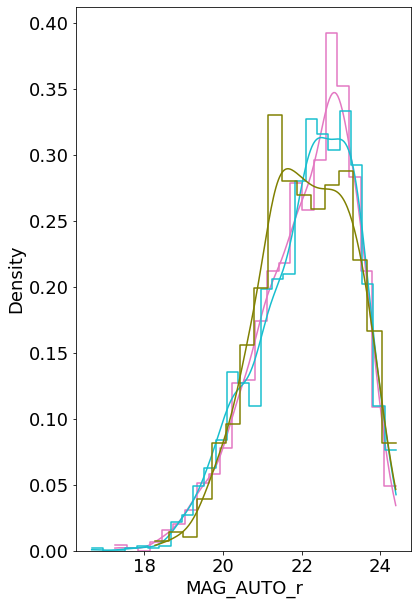

In [426]:
plt.figure(figsize=(6,10))
sns.histplot(x=df_photo_cluster['MAG_AUTO_r'][bool_all_1],kde=True,stat='density',fill=False,element="step",color='tab:pink')
sns.histplot(x=df_photo_cluster['MAG_AUTO_r'][bool_all_2],kde=True,stat='density',fill=False,element="step",color='tab:cyan')
sns.histplot(x=df_photo_cluster['MAG_AUTO_r'][bool_all_3],kde=True,stat='density',fill=False,element="step",color='olive')


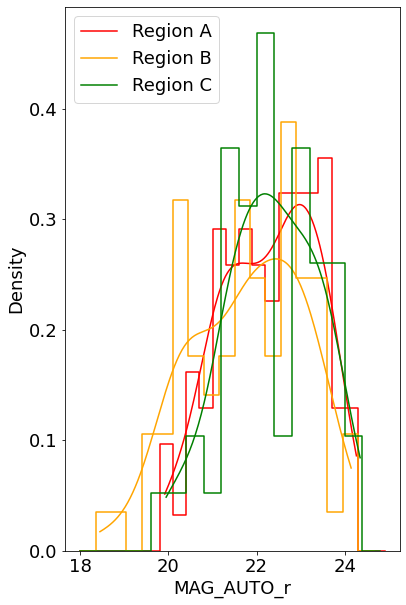

In [453]:
plt.figure(figsize=(6,10))
sns.histplot(x=df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_a],bins=np.arange(18,25,0.3),kde=True,stat='density',fill=False,element="step",color='red',label='Region A')
sns.histplot(x=df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_b],bins=np.arange(18,25,0.35),kde=True,stat='density',fill=False,element="step",color='orange',label='Region B')
sns.histplot(x=df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_c],bins=np.arange(18,25,0.4),kde=True,stat='density',fill=False,element="step",color='green',label='Region C')

plt.legend()

In [51]:
print(df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_a].median())
print(df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_b].median())
print(df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_c].median())

22.3439
21.8564
22.3059


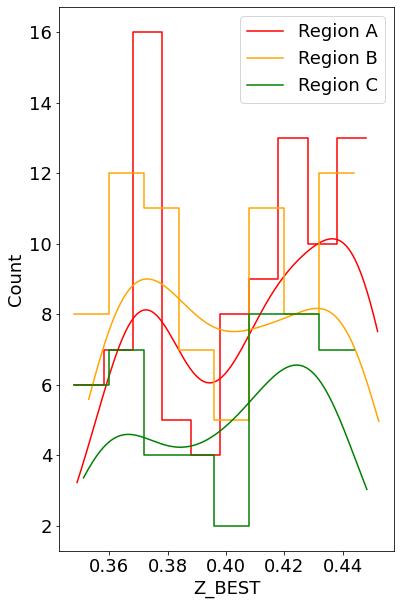

In [450]:
plt.figure(figsize=(6,10))
sns.histplot(x=df_photo_cluster['Z_BEST'][bool_allgal_rs_a],bins=np.arange(0.348,0.453,0.010),kde=True,fill=False,element="step",color='red',label='Region A')
sns.histplot(x=df_photo_cluster['Z_BEST'][bool_allgal_rs_b],bins=np.arange(0.348,0.453,0.012),kde=True,fill=False,element="step",color='orange',label='Region B')
sns.histplot(x=df_photo_cluster['Z_BEST'][bool_allgal_rs_c],bins=np.arange(0.348,0.453,0.012),kde=True,fill=False,element="step",color='green',label='Region C')

plt.legend()

Text(0.5, 1.0, 'Region A')

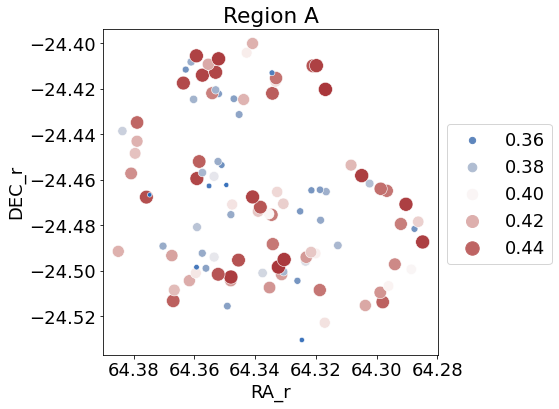

In [88]:

plt.figure(figsize=(6,6))
fig = plt.gcf()
ax  = fig.gca()
sns.scatterplot(
    data=df_photo_cluster[bool_allgal_rs_a], x="RA_r", y="DEC_r", hue="Z_BEST", size="Z_BEST",
    sizes=(20, 200),palette='vlag'
)

ax.legend(bbox_to_anchor=(1,0.25), loc="lower left")
plt.gca().invert_xaxis()
plt.title('Region A')


Text(0.5, 1.0, 'Region B')

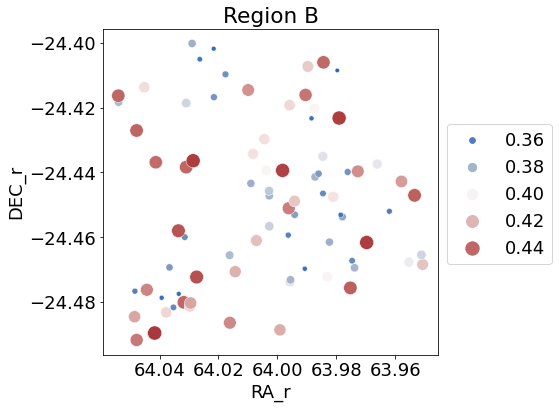

In [89]:
plt.figure(figsize=(6,6))
fig = plt.gcf()
ax  = fig.gca()
sns.scatterplot(
    data=df_photo_cluster[bool_allgal_rs_b], x="RA_r", y="DEC_r", hue="Z_BEST", size="Z_BEST",
    sizes=(20, 200),palette='vlag'
)

ax.legend(bbox_to_anchor=(1,0.25), loc="lower left")
plt.gca().invert_xaxis()
plt.title('Region B')

Text(0.5, 1.0, 'Region C')

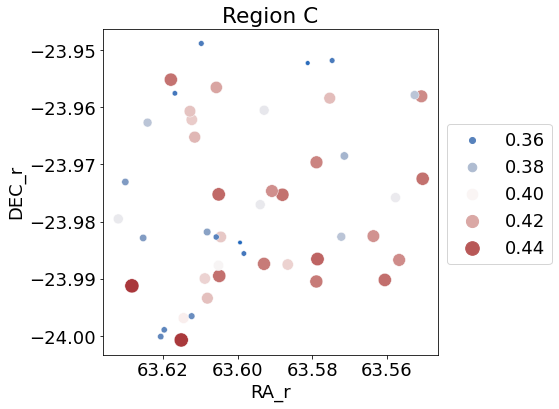

In [90]:
plt.figure(figsize=(6,6))
fig = plt.gcf()
ax  = fig.gca()
sns.scatterplot(
    data=df_photo_cluster[bool_allgal_rs_c], x="RA_r", y="DEC_r", hue="Z_BEST", size="Z_BEST",
    sizes=(20, 200),palette='vlag'
)

ax.legend(bbox_to_anchor=(1,0.25), loc="lower left")
plt.gca().invert_xaxis()
plt.title('Region C')

Text(0.5, 1.0, 'Region A')

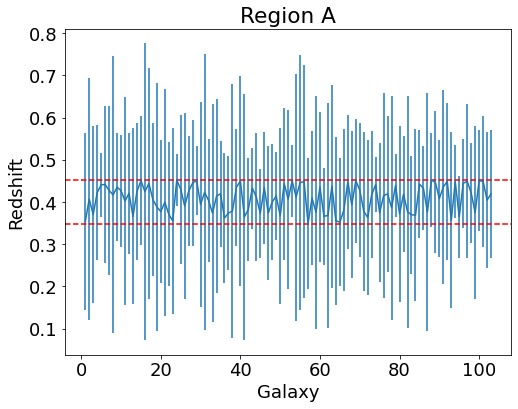

In [163]:
plt.figure(figsize=(8,6))

plt.errorbar(np.linspace(1,len(df_photo_cluster[bool_allgal_rs_a]),len(df_photo_cluster[bool_allgal_rs_a])),
                           df_photo_cluster[bool_allgal_rs_a]['Z_BEST'],
                           yerr=df_photo_cluster[bool_allgal_rs_a]['Z_BEST68_HIGH']-df_photo_cluster[bool_allgal_rs_a]['Z_BEST68_LOW'],
                           )


plt.axhline(0.348,ls='--',c='r')
plt.axhline(0.453,ls='--',c='r')
plt.xlabel('Galaxy')
plt.ylabel('Redshift')
plt.title('Region A')

Text(0.5, 1.0, 'Region B')

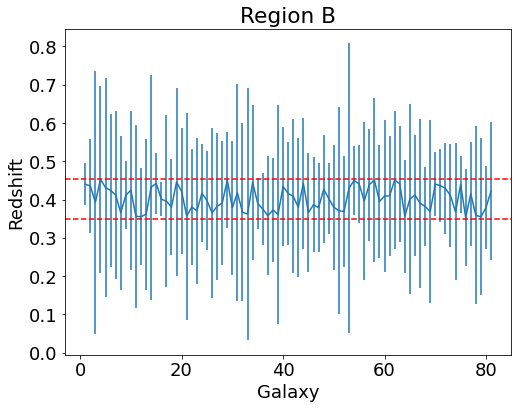

In [162]:
plt.figure(figsize=(8,6))

plt.errorbar(np.linspace(1,len(df_photo_cluster[bool_allgal_rs_b]),len(df_photo_cluster[bool_allgal_rs_b])),
                           df_photo_cluster[bool_allgal_rs_b]['Z_BEST'],
                           yerr=df_photo_cluster[bool_allgal_rs_b]['Z_BEST68_HIGH']-df_photo_cluster[bool_allgal_rs_b]['Z_BEST68_LOW'],
                           )


plt.axhline(0.348,ls='--',c='r')
plt.axhline(0.453,ls='--',c='r')
plt.xlabel('Galaxy')
plt.ylabel('Redshift')
plt.title('Region B')

Text(0.5, 1.0, 'Region C')

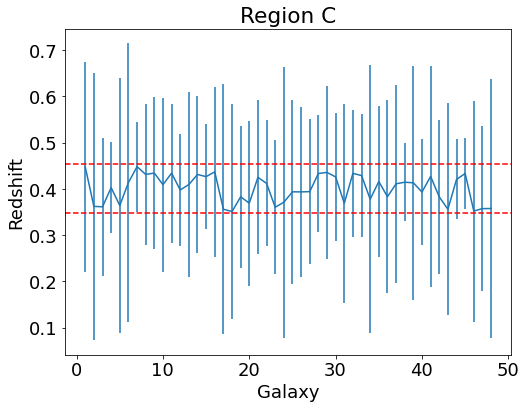

In [161]:

plt.figure(figsize=(8,6))

plt.errorbar(np.linspace(1,len(df_photo_cluster[bool_allgal_rs_c]),len(df_photo_cluster[bool_allgal_rs_c])),
                           df_photo_cluster[bool_allgal_rs_c]['Z_BEST'],
                           yerr=df_photo_cluster[bool_allgal_rs_c]['Z_BEST68_HIGH']-df_photo_cluster[bool_allgal_rs_c]['Z_BEST68_LOW'],
                           )


plt.axhline(0.348,ls='--',c='r')
plt.axhline(0.453,ls='--',c='r')
plt.xlabel('Galaxy')
plt.ylabel('Redshift')
plt.title('Region C')

In [ ]:
print(df_photo_cluster['RA_r'].mean())
print(df_photo_cluster['DEC_r'].mean())
print()
print(df_photo_cluster['RA_r'][bool_allgal_rs_a].mean())
print(df_photo_cluster['DEC_r'][bool_allgal_rs_a].mean())
print()
print(df_photo_cluster['RA_r'][bool_allgal_rs_b].mean())
print(df_photo_cluster['DEC_r'][bool_allgal_rs_b].mean())
print()
print(df_photo_cluster['RA_r'][bool_allgal_rs_c].mean())
print(df_photo_cluster['DEC_r'][bool_allgal_rs_c].mean())

In [ ]:
def dist(x,y):
    print(np.sqrt((x**2)+(y**2)))
    
dist(np.abs(df_photo_cluster['RA_r'][bool_allgal_rs_a].mean()-df_photo_cluster['RA_r'].mean()),np.abs(df_photo_cluster['DEC_r'][bool_allgal_rs_a].mean()-df_photo_cluster['DEC_r'].mean()))
dist(np.abs(df_photo_cluster['RA_r'][bool_allgal_rs_b].mean()-df_photo_cluster['RA_r'].mean()),np.abs(df_photo_cluster['DEC_r'][bool_allgal_rs_b].mean()-df_photo_cluster['DEC_r'].mean()))
dist(np.abs(df_photo_cluster['RA_r'][bool_allgal_rs_c].mean()-df_photo_cluster['RA_r'].mean()),np.abs(df_photo_cluster['DEC_r'][bool_allgal_rs_c].mean()-df_photo_cluster['DEC_r'].mean()))




In [ ]:
cosmo_params = {'non linear': 'halofit',
        'output': 'mPk',
        'P_k_max_h/Mpc': 5,
        'A_s' : 2.0968e-9,
        'YHe' : 0.2454,
        'n_s' : 0.9652,
        'z_pk': 0.8,
        'h'   : 0.6777,
        'Omega_b'  : 0.048206,
        'Omega_cdm': 0.258909 }
Om0 = cosmo_params['Omega_cdm']+cosmo_params['Omega_b']
C   = cosmo(H0=cosmo_params['h']*100,Om0=Om0)  
#C   = cosmo(H0=100,Om0=Om0)  

com_ang_dist    = C.angular_diameter_distance(0.396).value/(180/np.pi)
print(com_ang_dist*0.4706210216784222)
print(com_ang_dist*0.33848053006081363)
print(com_ang_dist*0.4628215064018238)

In [1484]:
print(bool_allgal_rs_a.sum())
print(bool_allgal_rs_b.sum())
print(bool_allgal_rs_c.sum())

103
81
48


In [ ]:
www = df_photo_cluster['MAG_AUTO_r'][bool_all_3&bool_D]
zzz = df_photo_cluster['MAG_AP3_g'][bool_all_3&bool_D]-df_photo_cluster['MAG_AP3_r'][bool_all_3&bool_D]
qqq = zzz > (rs_b)*(www-rs_x0)+rs_a-(2.6*rs_ep)
print('Region D red galaxies: '+str(qqq.sum())+' ('+str(qqq.sum()*100/len(qqq))+' %)')

plt.plot(x,(rs_b)*(x-rs_x0)+rs_a,'-',c='tab:blue',lw=3,label='Red sequence $\pm 2.6\sigma$')

plt.plot(df_photo_cluster['MAG_AUTO_r'][bool_all_3&bool_D], df_photo_cluster['MAG_AP3_g'][bool_all_3&bool_D]-df_photo_cluster['MAG_AP3_r'][bool_all_3&bool_D],'*', c='magenta', alpha=.9,label='Region C: '+str(len(df_photo_cluster['MAG_AUTO_r'][bool_all_3&bool_D]))+' galaxies')

plt.plot(x,(rs_b)*(x-rs_x0)+rs_a+(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.plot(x,(rs_b)*(x-rs_x0)+rs_a-(2.6*rs_ep),'--',c='tab:blue',lw=2,label='')
plt.ylabel("MAG g   -   MAG r")
plt.xlabel("MAG r")
plt.xlim(17,26)
plt.ylim(0.25,2.5)
plt.legend()

In [ ]:
plt.figure(figsize=(8,8))
plt.subplot(221)
plt.hist(df_photo_cluster['Z_BEST'][bool_all_3&bool_A],color='blue')
plt.subplot(222)
plt.hist(df_photo_cluster['Z_BEST'][bool_all_3&bool_B],color='darkorange')
plt.subplot(223)
plt.hist(df_photo_cluster['Z_BEST'][bool_all_3&bool_C],color='green')
plt.subplot(224)
plt.hist(df_photo_cluster['Z_BEST'][bool_all_3&bool_D],color='magenta')


# Kolmogorov-Smirnov test

In [ ]:
col_lowdens = df_photo_cluster['MAG_AP3_g'][bool_all_1]-df_photo_cluster['MAG_AP3_r'][bool_all_1]
col_middens = df_photo_cluster['MAG_AP3_g'][bool_all_2]-df_photo_cluster['MAG_AP3_r'][bool_all_2]
col_highdens = df_photo_cluster['MAG_AP3_g'][bool_all_3]-df_photo_cluster['MAG_AP3_r'][bool_all_3]

wwwa = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_a]
col_rega = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_a]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_a]
red_rega = col_rega > (rs_b)*(wwwa-rs_x0)+rs_a-(2.6*rs_ep)

wwwb = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_b]
col_regb = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_b]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_b]
red_regb = col_regb > (rs_b)*(wwwb-rs_x0)+rs_a-(2.6*rs_ep)

wwwc = df_photo_cluster['MAG_AUTO_r'][bool_allgal_rs_c]
col_regc = df_photo_cluster['MAG_AP3_g'][bool_allgal_rs_c]-df_photo_cluster['MAG_AP3_r'][bool_allgal_rs_c]
red_regc = col_regc > (rs_b)*(wwwc-rs_x0)+rs_a-(2.6*rs_ep)

col_regions = np.concatenate((col_rega,col_regb,col_regc))
red_regions = np.concatenate((col_rega[red_rega],col_regb[red_regb],col_regc[red_regc]))

wwwcore = df_photo_cluster['MAG_AUTO_r'][bool_all_3b]
col_cluster = df_photo_cluster['MAG_AP3_g'][bool_all_3b]-df_photo_cluster['MAG_AP3_r'][bool_all_3b]
red_cluster = col_cluster > (rs_b)*(wwwcore-rs_x0)+rs_a-(2.6*rs_ep)
red_cluster = col_cluster[red_cluster]


In [ ]:
st.ks_2samp(col_lowdens, col_middens)
# Different distributions

In [ ]:
st.ks_2samp(col_lowdens, col_highdens)
# Different distributions

In [ ]:
st.ks_2samp(col_middens, col_highdens)
# Different distributions

In [ ]:
st.ks_2samp(col_cluster, col_regions)
# Different distributions

In [ ]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.hist(col_cluster)
plt.hist(col_regions)
plt.subplot(122)
plt.hist(col_cluster,cumulative=True)
plt.hist(col_regions,cumulative=True)

In [ ]:
st.ks_2samp(red_cluster, red_regions)
# SAME distributions!!!???

In [ ]:
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.hist(red_cluster)
plt.hist(red_regions)
plt.subplot(122)
plt.hist(red_cluster,cumulative=True)
plt.hist(red_regions,cumulative=True)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
plt.plot(np.arange(0,1000,30),'.')